## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images. I will call findChessBoardCorners and drawChessBoardCorners functions to obtain object points and image points. These will be later used to pass to CalibrateCamera function.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
%matplotlib inline
import matplotlib.pyplot as plt


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
i=0
img1 = []
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    #plt.imshow(img)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    #print(fname)
    #print(ret)

    # If found, add object points, image points
    if ret == True:
        
        objpoints.append(objp)
        imgpoints.append(corners)
        

        # Draw and display the corners
        img1.append(cv2.drawChessboardCorners(img, (9,6), corners, ret))
        
        #print(fname)
        #plt.imshow(img)
        #cv2.waitKey(500)

#plt.imshow(img1[1])
#cv2.destroyAllWindows()

## Now I will visualize the drawings on the chess board for all the images provided by udacity. Remember that  Object points and image points are computed for all these images in the earlier step.

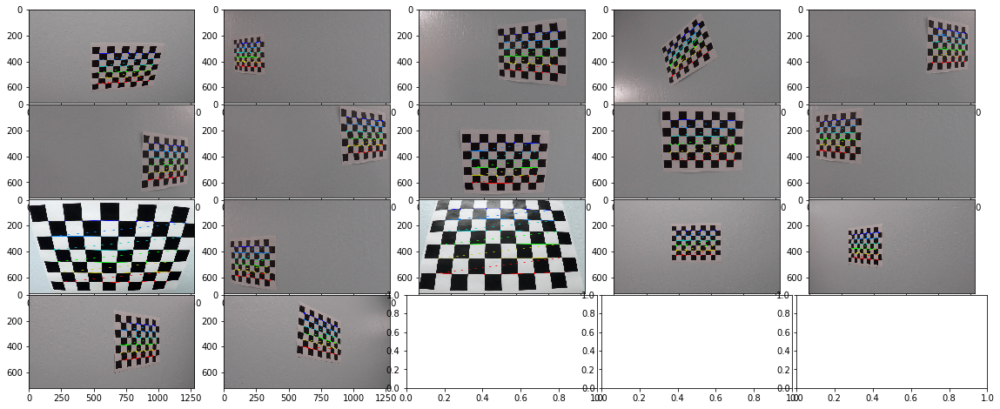

In [2]:
rlimit = int(len(img1)/5)+1
fig, axs = plt.subplots(rlimit,5, figsize=(20, 8))
fig.subplots_adjust(hspace = .02, wspace=.02)
axs = axs.ravel()
for i in range(len(img1)):
    #index = random.randint(0, len(X_train))
    image = img1[i]
    axs[i].axis('on')
    axs[i].imshow(image)
    #axs[i].set_title(y_train[index])


## Here i  am using the just collected object points and image points and pass it CalibrateCamera function . This will return parameters required to undistort camera images. I will also use the returned parameters from calibrateCamera function and pass it to Undistort function to see if it works....

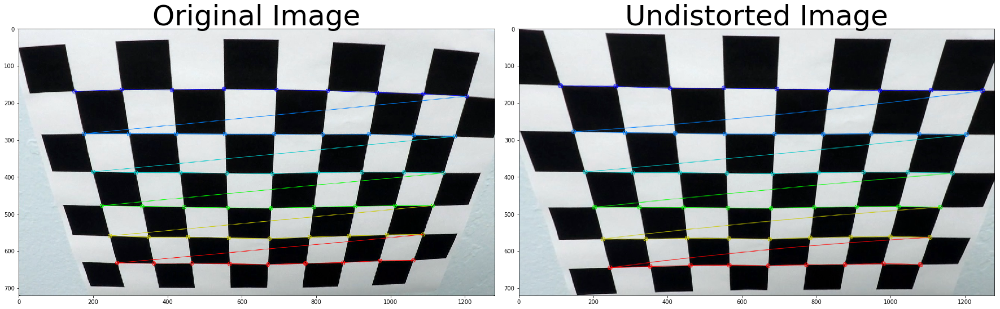

In [3]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
dst = cv2.undistort(img1[10], mtx, dist, None, mtx)
#plt.imshow(dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img1[10])
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here i  will undistort a test image of a highway lane provided by udacity. 

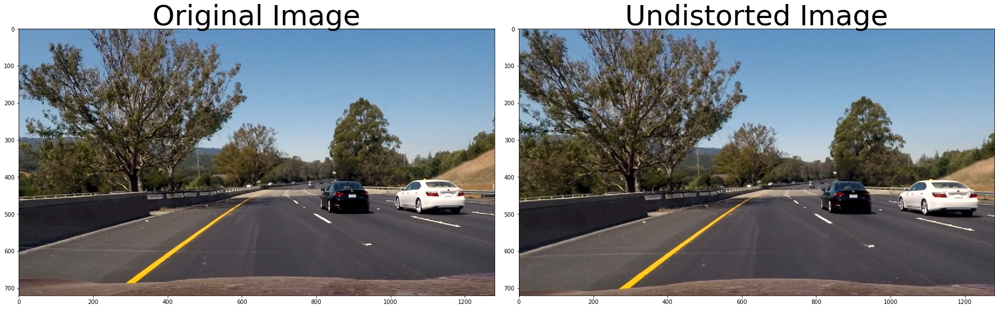

In [4]:
testimg = mpimg.imread('./test_images/test6.jpg')
udst = cv2.undistort(testimg, mtx, dist, None, mtx)

#plt.imshow(udst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(testimg)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(udst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Now i will define a function to perform gradient of an image for a given threshold in horizontal direction (X-Orientation). I will also run this function against a test image to see if it works

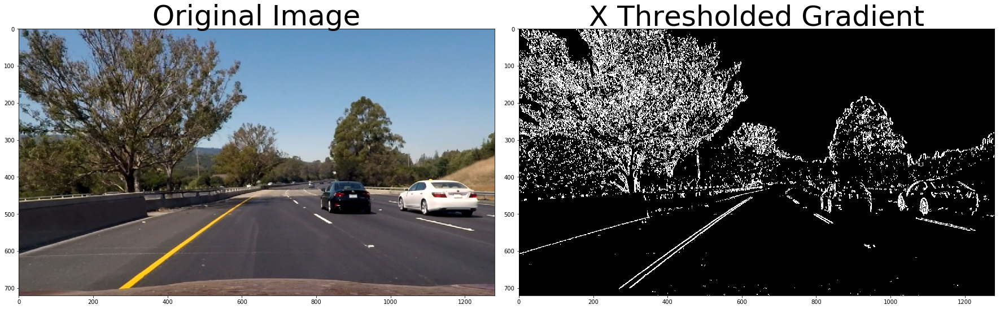

In [5]:
def abs_sobelx_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
    
# Run the function
gradx = abs_sobelx_thresh(udst, orient='x', thresh_min=20, thresh_max=255)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('X Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here I will define a function to perform gradient of an image for a given threshold  in veritical direction (Y-Orientation). I will also run this function against a test image to see if it works

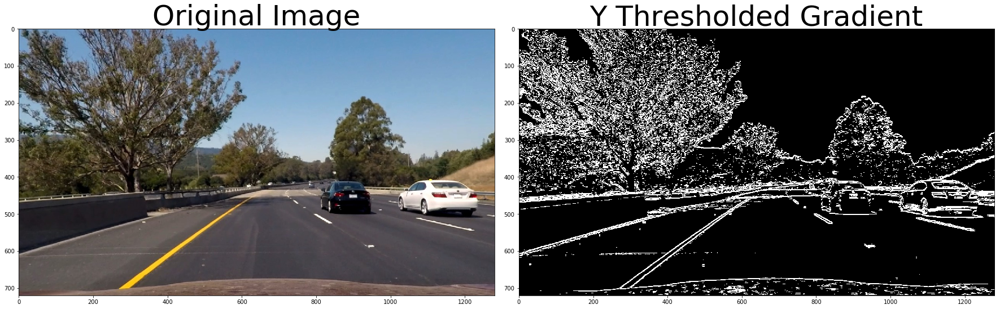

In [6]:
def abs_sobely_thresh(img, orient='y', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobely = np.absolute(sobely)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
    
# Run the function
grady = abs_sobely_thresh(udst, orient='y', thresh_min=20, thresh_max=255)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grady, cmap='gray')
ax2.set_title('Y Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## I will also define a function to compute magnitude of the gradient for a given threshold. I will also verify against a test image to see if it works as expected.

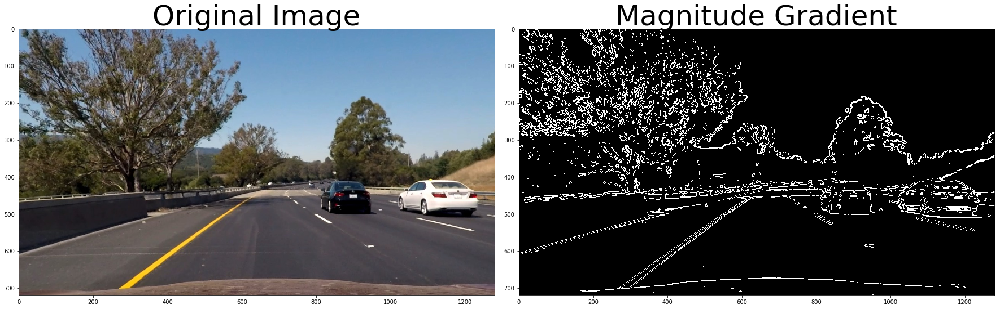

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output
    
# Run the function
mag_binary = mag_thresh(udst, sobel_kernel=9, mag_thresh=(50, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Magnitude Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Will also define a function to compute directional gradient. 

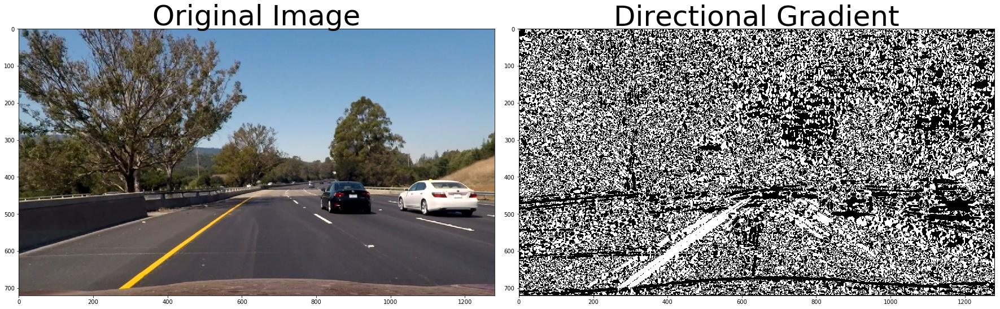

In [8]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

#Run the function
dir_binary = dir_threshold(udst, sobel_kernel=21, thresh=(0.5, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Directional Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here i will combine the gradients based to obtain the restult the way i need.

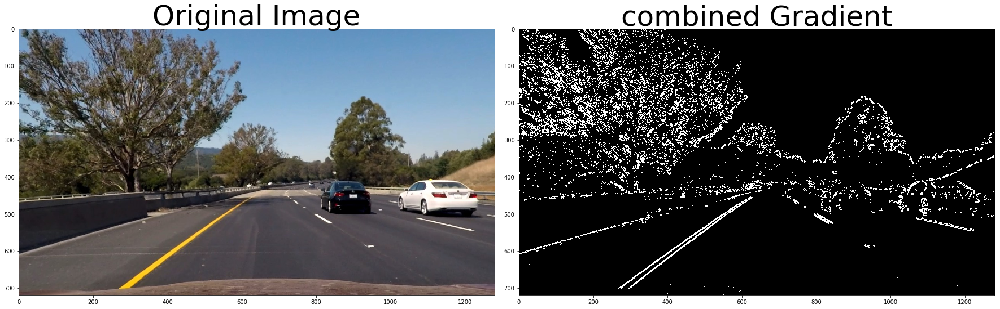

In [9]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('combined Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

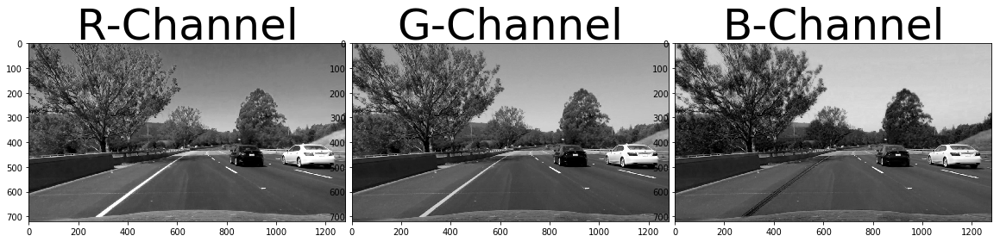

In [10]:
R = udst[:,:,0]
G = udst[:,:,1]
B = udst[:,:,2]

fig, axs = plt.subplots(1,3, figsize=(20, 8))
fig.subplots_adjust(hspace = .02, wspace=.02)
axs = axs.ravel()
axs[0].set_title('R-Channel', fontsize=50)
axs[0].axis('on')
axs[0].imshow(R,cmap='gray')
axs[1].set_title('G-Channel', fontsize=50)
axs[1].axis('on')
axs[1].imshow(G,cmap='gray')
axs[2].set_title('B-Channel', fontsize=50)
axs[2].axis('on')
axs[2].imshow(B,cmap='gray')
    #axs[i].set_title(y_train[index])

## From here on I will explore different color spaces and their channels to identify a suitable color space that will make the lane lines standout comapred to other parts of the image...

## First i will convert the undistored image to GrayScale and apply some threshold ....

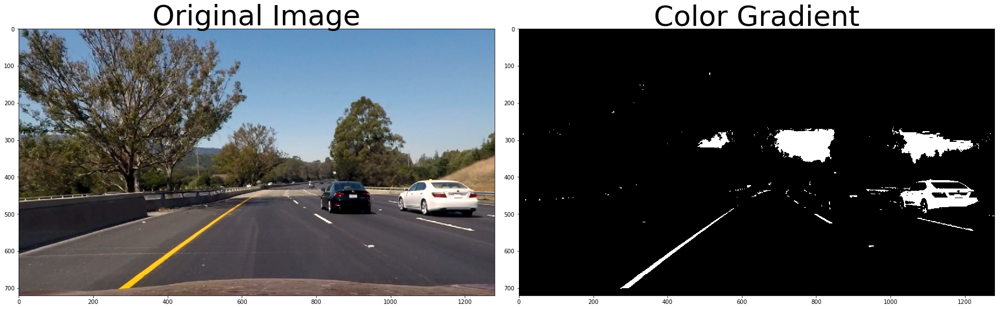

In [11]:
#image = mpimg.imread(udst)
thresh = (190, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Color Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Seperate out RED color channel from GrayScaled image and apply threshold.......

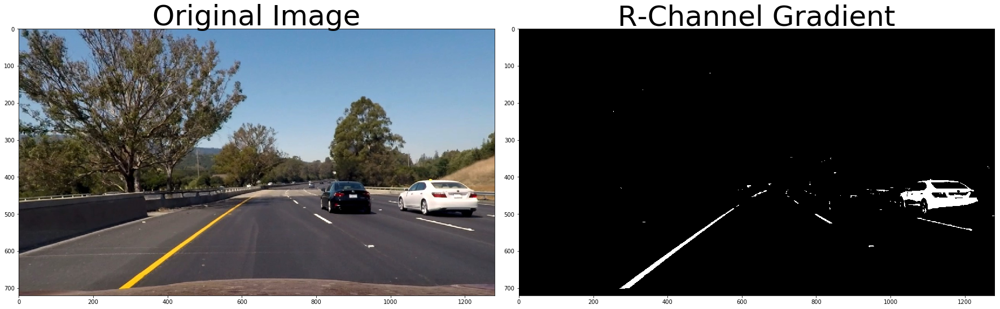

In [12]:
#image = mpimg.imread(udst)
thresh = (210, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(R)
binary[(R > thresh[0]) & (R <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('R-Channel Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Seperate out GREEN color channel from GrayScaled image and apply threshold.......

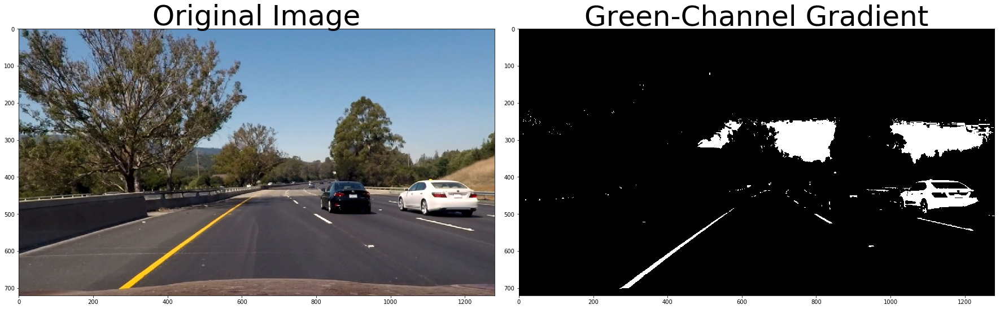

In [13]:
#image = mpimg.imread(udst)
thresh = (190, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(G)
binary[(G > thresh[0]) & (G <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Green-Channel Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Seperate out BLUE color channel from GrayScaled image and apply threshold.......

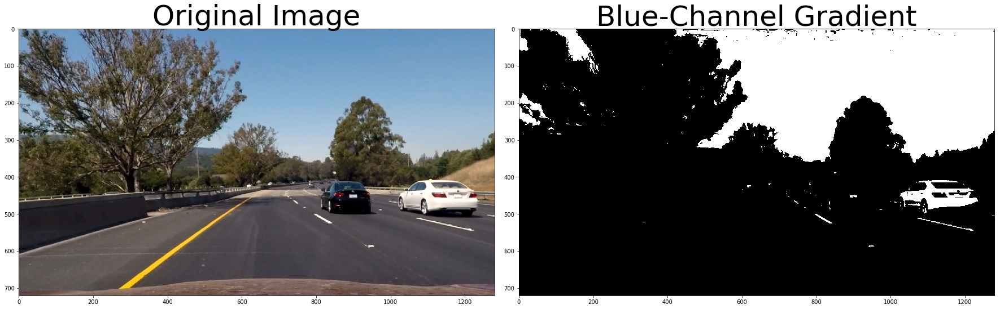

In [14]:
#image = mpimg.imread(udst)
thresh = (190, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(B)
binary[(B > thresh[0]) & (B <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Blue-Channel Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here i will convert the undistorted image to HLS color space and visualize how the image looks for each channel of HLS color space

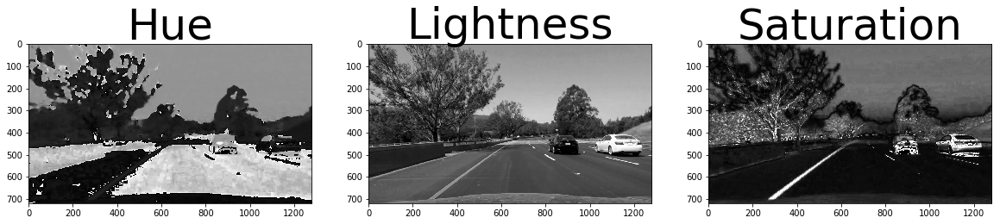

In [15]:
hls = cv2.cvtColor(udst, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

ig, axs = plt.subplots(1,3, figsize=(20, 8))
fig.subplots_adjust(hspace = .02, wspace=.02)
axs = axs.ravel()
axs[0].set_title('Hue', fontsize=50)
axs[0].axis('on')
axs[0].imshow(H,cmap='gray')
axs[1].set_title('Lightness', fontsize=50)
axs[1].axis('on')
axs[1].imshow(L,cmap='gray')
axs[2].set_title('Saturation', fontsize=50)
axs[2].axis('on')
axs[2].imshow(S,cmap='gray')

## 'S' (Saturation) channel stands out and looks promising.....

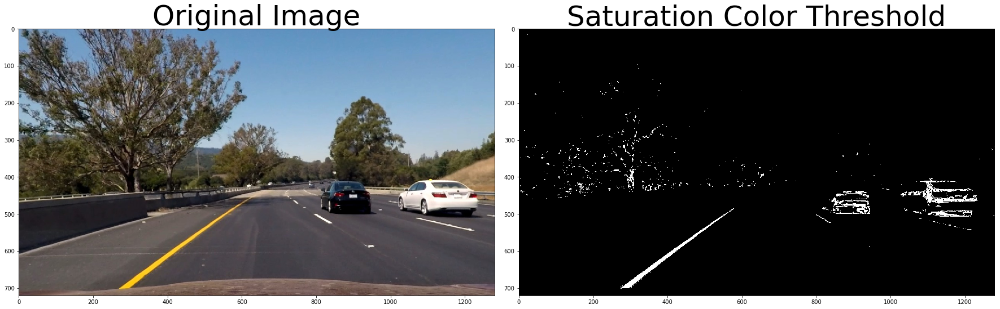

In [16]:
#image = mpimg.imread(udst)
thresh = (200, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
s_binary = np.zeros_like(S)
s_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('Saturation Color Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here i will convert the undistorted image to "Lab" color space and visualize how the image looks for each channel of Lab color space

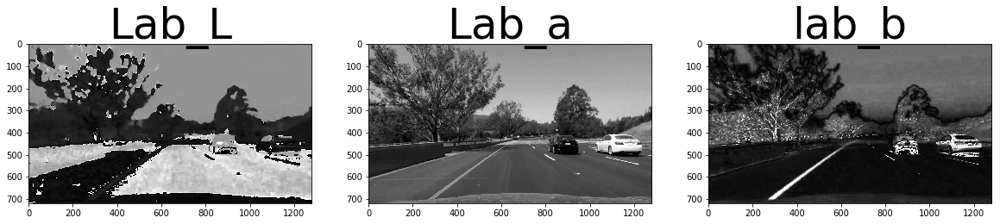

In [17]:
lab = cv2.cvtColor(udst, cv2.COLOR_RGB2Lab)
lab_l = lab[:,:,0]
lab_a = lab[:,:,1]
lab_b = lab[:,:,2]

ig, axs = plt.subplots(1,3, figsize=(20, 8))
fig.subplots_adjust(hspace = .02, wspace=.02)
axs = axs.ravel()
axs[0].set_title('Lab_L', fontsize=50)
axs[0].axis('on')
axs[0].imshow(H,cmap='gray')
axs[1].set_title('Lab_a', fontsize=50)
axs[1].axis('on')
axs[1].imshow(L,cmap='gray')
axs[2].set_title('lab_b', fontsize=50)
axs[2].axis('on')
axs[2].imshow(S,cmap='gray')

## 'b'  channel of Lab color space stands out and looks promising.....

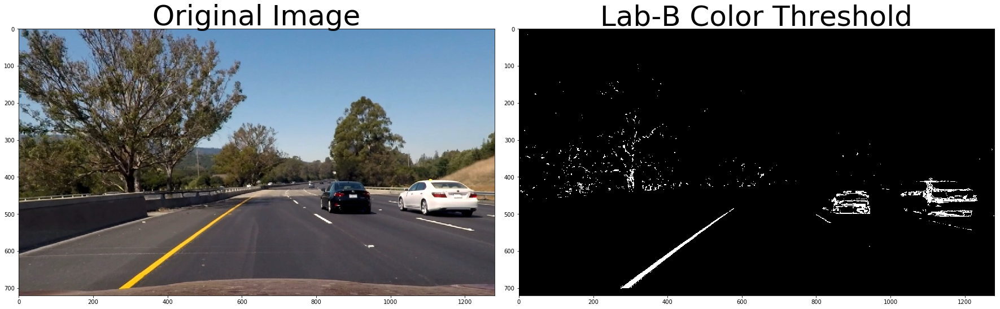

In [18]:
thresh = (190, 255)
gray = cv2.cvtColor(udst, cv2.COLOR_RGB2GRAY)
if np.max(lab_b) > 175:
    lab_b = lab_b*(255/np.max(lab_b))
lab_b_binary = np.zeros_like(lab_b)
lab_b_binary[(lab_b > thresh[0]) & (lab_b <= thresh[1])] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('Lab-B Color Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Now i will combine the thresholded S-Channel (Saturation) of HLS color space with gradient thresholded image to see how it looks.

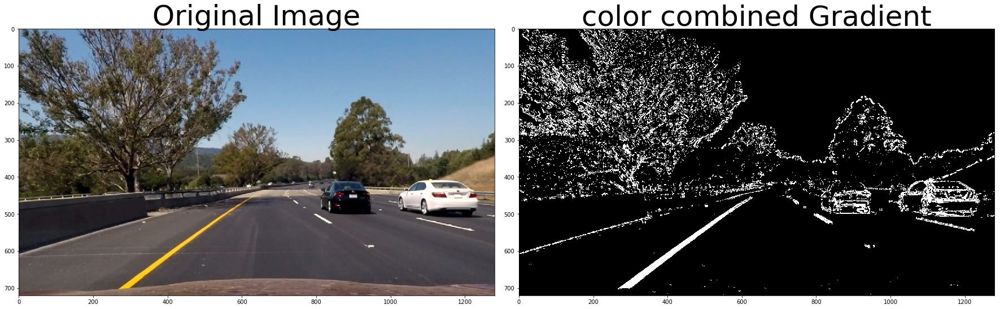

In [19]:
color_combined_binary = np.zeros_like(combined)
color_combined_binary[(s_binary == 1) | (combined == 1)] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(udst)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_combined_binary, cmap='gray')
ax2.set_title('color combined Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Here i will define a function to perform perspective transform for birds eye view of the highway image

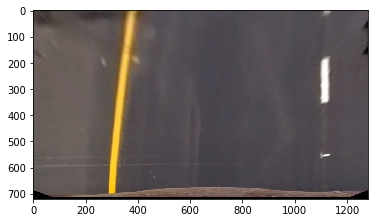

In [20]:
%matplotlib inline
# Define a function to perform perspective transformation.
def img_transform(img, leftbottom, rightbottom, lefttop, righttop, offset):
    src = np.float32([leftbottom,rightbottom,lefttop,righttop])
    dst = np.float32([[296,686],[1096,686],[296,0],[1096,0]])
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img.shape[::-1], flags=cv2.INTER_LINEAR)
    cwarped = cv2.warpPerspective(udst, M, img.shape[::-1], flags=cv2.INTER_LINEAR)
    return warped,cwarped,M

#rwarped = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
#rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
#rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
plt.imshow(ccwarped,cmap='gray')



## Below histogram will show the concentration of pixels along x-axis of perspective transformed image. The peaks indicate the left and right lines of the lane.

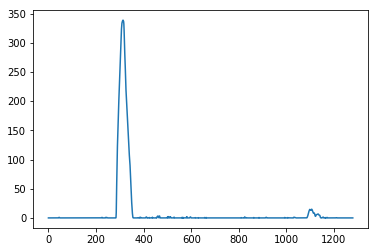

In [21]:
histogram = np.sum(rwarped[rwarped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

## Now i will search for  the lane lines using information obtained from the histogram . As a first step i will define windows with a width of 100 pixels and look for concentration of pixels on a perspective transformed binary image . I will place these windows at the bottom of the image near histogram peaks and look for a minimum of 50 pixels. I will then record the pixels that make up the left and right lanes. I will then continue this by sliding up the image until i capture all pixels that make up the lane lines. Finally i will fit a line (one for left and another for right). I will print the fitted lane line at the end.

In [22]:
# Create an output image to draw on and  visualize the result
#out_img = np.dstack((rwarped, rwarped, rwarped))*255
out_img = ccwarped
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(rwarped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = rwarped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = rwarped.shape[0] - (window+1)*window_height
    win_y_high = rwarped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

print(left_fit)
print(right_fit)

[  6.74282296e-05  -1.57354972e-01   3.77665822e+02]
[ -4.07971812e-05  -7.83534666e-04   1.11933568e+03]


## Here i have highlighted the just found  left lane pixels with RED color and right lane pixels with BLUE. The yellow line plotted represents the fitted line. The green rectangles represent the windows that were used to identify the pixels...

(720, 0)

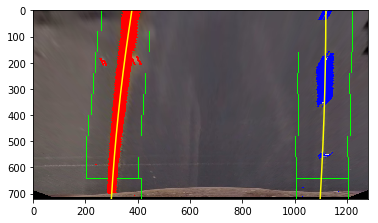

In [23]:
# Generate x and y values for plotting
%matplotlib inline
ploty = np.linspace(0, rwarped.shape[0]-1, rwarped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)

plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Here i will highligh the image area where the search has been performed to identify the pixels. The GREEN filled area represents the search area.

(720, 0)

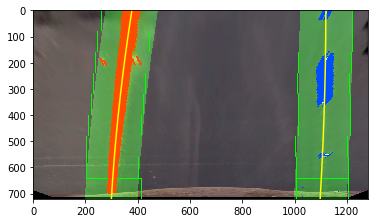

In [24]:
# Create an image to draw on and an image to show the selection window
#out_img = np.dstack((rwarped, rwarped, rwarped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Now its time to create a pipeline to identify lane lines on the video . But before that , I will define two more functions ... 1.Function to identify lane lines from scratch using window search 2. Function to look for lane pixels around the positions where the lane lines were detected in the previous frame.  For the TEST images provided, though it does not make sense to search the prior frame as the test images are not continous, but it makes absolute sense if i process images from a video file with continuous images. By searching prior frame, i will save on processing costs and overheads.....

## SEARCH_WINDOW function identifies the lane lines by performing a blind search....

In [25]:
def search_window(img1,img2):
    # Create an output image to draw on and  visualize the result
    #out_img = np.dstack((rwarped, rwarped, rwarped))*255
    out_img = img2
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    histogram = np.sum(img1[img1.shape[0]//2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img1.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img1.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img1.shape[0] - (window+1)*window_height
        win_y_high = img1.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0 and len(rightx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit,leftx,rightx,lefty,righty

## SEARCH_PRIOR function will search for lane pixels around the cordinates where the lanes were detected in the prior frame. It takes the image of the current frame as input along with the left and right fitted lane lanes from prior image. 

In [26]:
def search_prior(img,left_fit,right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0 and len(rightx) != 0:
        left_fit_new = np.polyfit(lefty, leftx, 2)
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new,right_fit_new,leftx,rightx,lefty,righty

## Now i will test to see if i am able to identify the lane line on Test Images provided by udacity...

In [27]:
import numpy as np
import cv2
import glob
%matplotlib inline
import matplotlib.pyplot as plt


# Make a list of test images for testing my lane mapping pipeline
images = glob.glob('./test_images/*.jpg')
binary_imghold = []
color_imghold = []
fname_hold = []
ploty_hold = []
left_fitx_hold = []
right_fitx_hold = []
final_imghold = []

search_from_scratch = 1
left_curverad_prior = 0 
right_curverad_prior = 0

# Step through the list and search for chessboard corners
for fname in images:
    print("Working on image : ",fname)
    img = mpimg.imread(fname)
    udst = cv2.undistort(img, mtx, dist, None, mtx)
    gradx = abs_sobelx_thresh(udst, orient='x', thresh_min=20, thresh_max=255)
    grady = abs_sobely_thresh(udst, orient='y', thresh_min=20, thresh_max=255)
    mag_binary = mag_thresh(udst, sobel_kernel=9, mag_thresh=(50, 100))
    dir_binary = dir_threshold(udst, sobel_kernel=9, thresh=(0.5, 1.3))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    hls = cv2.cvtColor(udst, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    thresh = (200, 255)
    s_binary = np.zeros_like(S)
    s_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    lab = cv2.cvtColor(udst, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    thresh = (190, 255)
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    lab_b_binary = np.zeros_like(lab_b)
    lab_b_binary[(lab_b > thresh[0]) & (lab_b <= thresh[1])] = 1
    
    color_combined_binary = np.zeros_like(combined)
    #color_combined_binary[(s_binary == 1) | (combined == 1)] = 1
    color_combined_binary[(lab_b_binary == 1) | (combined == 1)] = 1
    rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
    
    
    
    binary_imghold.append(rwarped)
    color_imghold.append(ccwarped)
    fname_hold.append(fname)
    
    if(search_from_scratch == 1):
        left_fit_ret, right_fit_ret,leftx_ret,rightx_ret,lefty_ret,righty_ret = search_window(rwarped,ccwarped)
        print('1:',left_fit_ret)
        #search_from_scratch = 0
    else:
        left_fit_ret, right_fit_ret,leftx_ret,rightx_ret,lefty_ret,righty_ret = search_prior(rwarped,left_fit_ret,right_fit_ret)
        print('0:',left_fit_ret)
    
    #print(left_fit_ret[0],right_fit_ret[0])
    #print(left_fit_ret[1],right_fit_ret[1])
    #print(left_fit_ret[2],right_fit_ret[2])
    
    
    print(rightx_ret[0]-leftx_ret[0], rightx_ret[10]-leftx_ret[10])
    
    ploty = np.linspace(0, rwarped.shape[0]-1, rwarped.shape[0] )
    #left_fitx = left_fit_ret[0]*ploty**2 + left_fit_ret[1]*ploty + left_fit_ret[2]
    #right_fitx = right_fit_ret[0]*ploty**2 + right_fit_ret[1]*ploty + right_fit_ret[2]
    left_fitx = left_fit_ret[0]*ploty**2 + left_fit_ret[1]*ploty + left_fit_ret[2]
    right_fitx = right_fit_ret[0]*ploty**2 + right_fit_ret[1]*ploty + right_fit_ret[2]
    ploty_hold.append(ploty)
    
    

    left_fitx_hold.append(left_fitx)
    right_fitx_hold.append(right_fitx)
    
    #width = rightx_ret[0]-leftx_ret[0]
    width = right_fit_ret[2] - left_fit_ret[2]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/180 # meters per pixel in y dimension
    xm_per_pix = 3.7/width # meters per pixel in x dimension
    
    #leftx_ret = leftx_ret[::-1]
    #rightx_ret = rightx_ret[::-1]

    #print(left_fitx)
    # Fit new polynomials to x,y in world space
    #left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    left_fit_cr = np.polyfit(lefty_ret*ym_per_pix, leftx_ret*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty_ret*ym_per_pix, rightx_ret*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print("Curvature:",(left_curverad + right_curverad)/2, 'm')
    
    if(search_from_scratch == 1):
        left_curvedrad_prior = left_curverad
        right_curverad_prior = right_curverad
        search_from_scratch = 1
    else: 
        if((left_curverad < (0.98*left_curverad_prior)) | (left_curverad > (1.02*left_curverad_prior))):
            search_from_scratch = 1
        else:
            search_from_scratch = 0
            left_curvedrad_prior = left_curverad
            right_curverad_prior = right_curverad
            
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(rwarped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    #print(pts)

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = np.linalg.inv(M)
    newwarp = cv2.warpPerspective(color_warp, Minv, (ccwarped.shape[1], ccwarped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(udst, 1, newwarp, 0.3, 0)
    avgcurvature  = (int(left_curverad) + int(right_curverad))/2
    curvature = "lane Curvature is: " +  str(avgcurvature)
    cv2.putText(result,curvature, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0),5)
    
    car_position = rwarped.shape[1]/2
    #lane_center_position = (left_fit_ret[2] + right_fit_ret[2]) /2
    lane_center_position = (rightx_ret[0] + leftx_ret[0]) /2
    center_dist = ((car_position) - (lane_center_position)) * (xm_per_pix)
    center_dist_text = "offset is : " + str(center_dist)
    print("offset:",center_dist)
    cv2.putText(result,center_dist_text, (100,200), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0),5)
    
    final_imghold.append(result)
    
    print("Done with image : ",fname)
    
print("Done............")
#print(left_fit_ret)
#print(right_fit_ret)
   

Working on image :  ./test_images/straight_lines1.jpg
1: [ -1.30249038e-05   6.65651164e-04   2.60745449e+02]
821 814
Curvature: 1198.7394632 m
offset: -0.0469019189819
Done with image :  ./test_images/straight_lines1.jpg
Working on image :  ./test_images/straight_lines2.jpg
1: [  1.91584827e-05  -9.87965759e-04   2.57648876e+02]
784 784
Curvature: 8549.24687819 m
offset: 0.0
Done with image :  ./test_images/straight_lines2.jpg
Working on image :  ./test_images/test1.jpg
1: [  1.19330905e-04  -1.04025085e-01   3.07575901e+02]
712 702
Curvature: 187.053874625 m
offset: 0.042395460975
Done with image :  ./test_images/test1.jpg
Working on image :  ./test_images/test2.jpg
1: [ -5.50152983e-05   1.11533776e-01   2.82234420e+02]
760 759
Curvature: 398.41766588 m
offset: -0.249245623161
Done with image :  ./test_images/test2.jpg
Working on image :  ./test_images/test3.jpg
1: [  5.79331553e-05  -1.54560071e-01   3.59339800e+02]
802 802
Curvature: 407.054841489 m
offset: -0.127434143098
Done wi

## Now i will visulaize the results of my lane finding. As a first step i will see if the perspective transformation worked as expected.

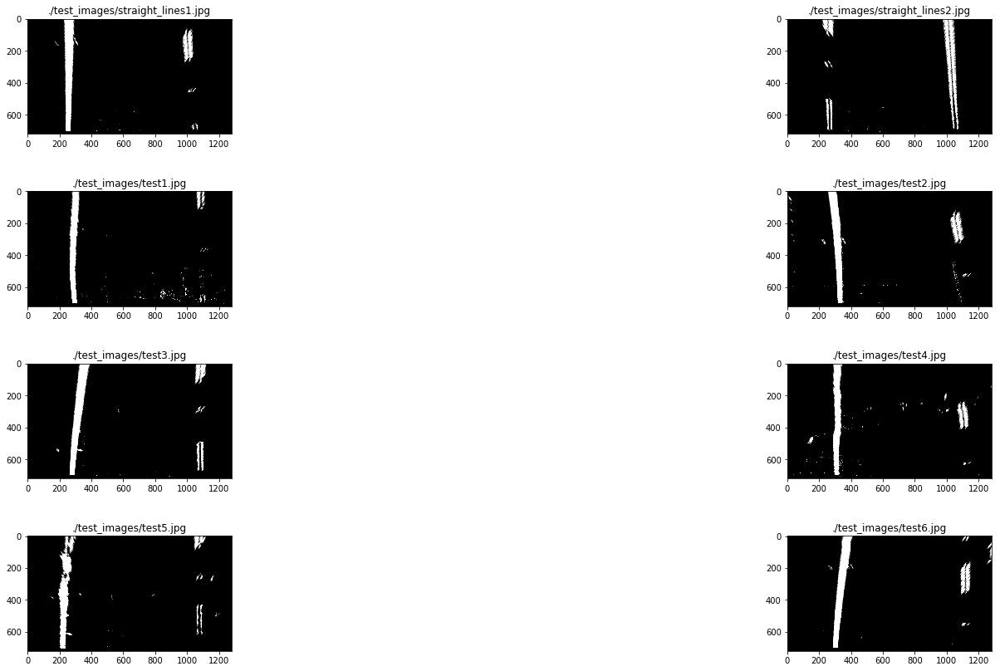

In [28]:

fig, axs1 = plt.subplots(4,2, figsize=(32, 14))
fig.subplots_adjust(hspace = .5, wspace=.05)
axs1 = axs1.ravel()
for i in range(len(binary_imghold)):
    #index = random.randint(0, len(X_train))
    axs1[i].axis('on')
    axs1[i].imshow(binary_imghold[i],cmap='gray')
    axs1[i].set_title(fname_hold[i])
    


## Now i will visulize the window fitment on test images

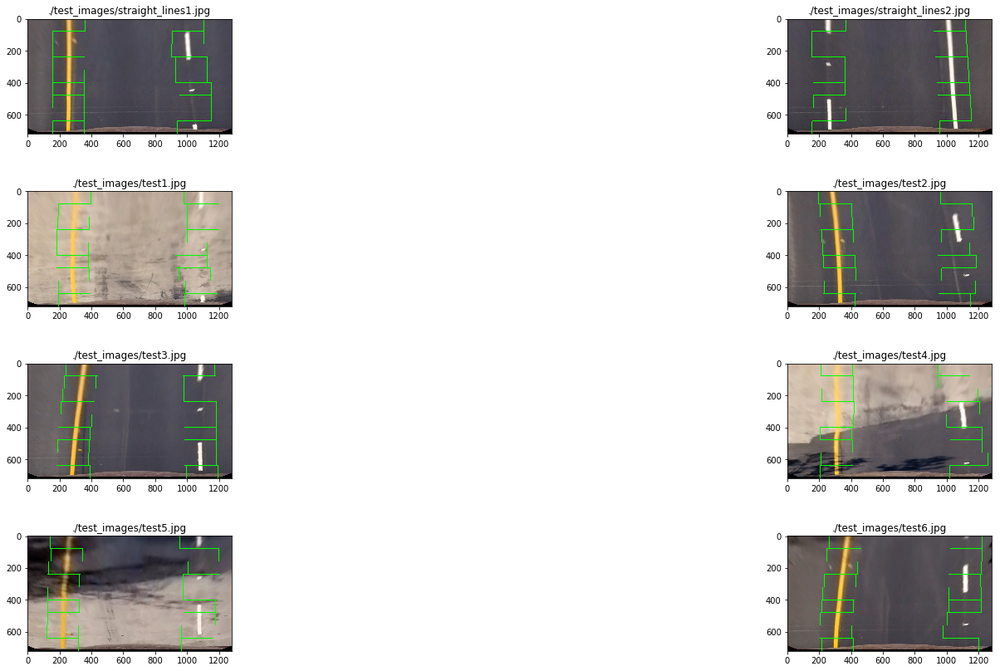

In [29]:

fig, axs2 = plt.subplots(4,2, figsize=(32, 14))
fig.subplots_adjust(hspace = .5, wspace=.05)
axs2 = axs2.ravel()
for i in range(len(binary_imghold)):
    #index = random.randint(0, len(X_train))
    axs2[i].axis('on')
    axs2[i].imshow(color_imghold[i])
    axs2[i].set_title(fname_hold[i])
    #plt.plot(left_fitx_hold[i], ploty_hold[i], color='yellow')
    #plt.plot(right_fitx_hold[i], ploty_hold[i], color='yellow')
    

## Now i will visualize the fitted lines. The solid yellow lines repesents the line fitment...

(720, 0)

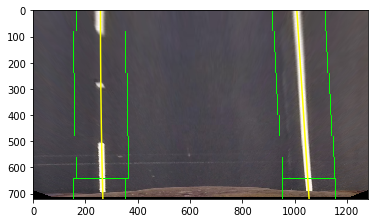

In [30]:
plt.imshow(color_imghold[1])

plt.plot(left_fitx_hold[1], ploty_hold[1], color='yellow')
plt.plot(right_fitx_hold[1], ploty_hold[1], color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)



## Now i will transform the images back to 2D view (Front view) from birds eye view and visualize the identified lane line by filling up the space between the line with green.

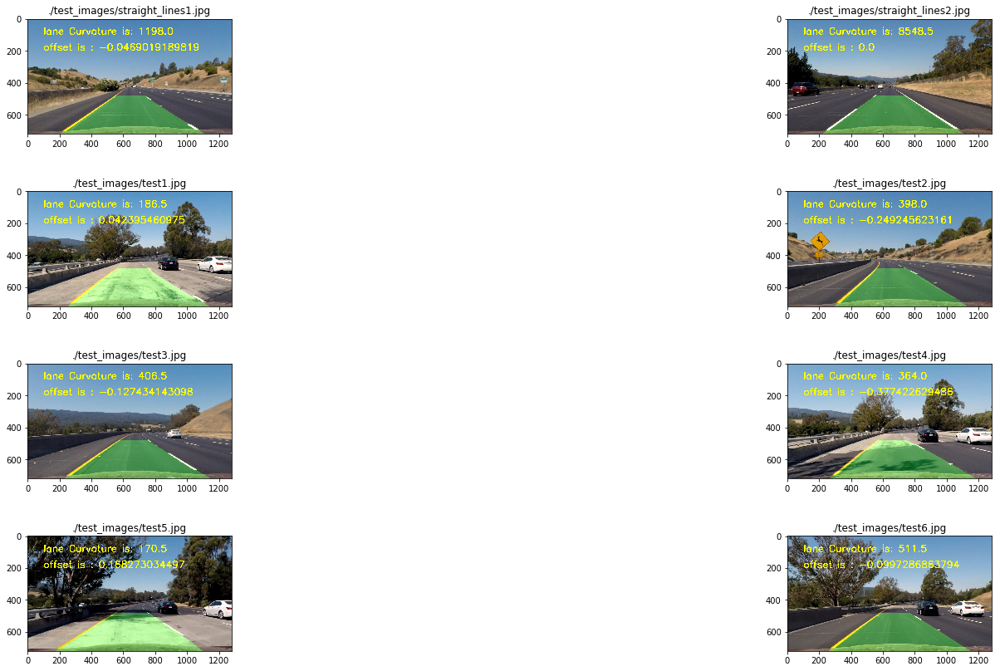

In [31]:
fig, axs1 = plt.subplots(4,2, figsize=(32, 14))
fig.subplots_adjust(hspace = .5, wspace=.05)
axs1 = axs1.ravel()
for i in range(len(final_imghold)):
    #index = random.randint(0, len(X_train))
    axs1[i].axis('on')
    axs1[i].imshow(final_imghold[i],cmap='gray')
    axs1[i].set_title(fname_hold[i])

## Finally i will define and execute my pipeline (advanced_lane_finding) for each frame on the video. I will also write the output images to a video file to represent the lane finding............

In [32]:
import numpy as np
import cv2
import glob
%matplotlib inline
import matplotlib.pyplot as plt

# Import libraries required to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from IPython.display import display

# Make a list of test images for testing my lane mapping pipeline
#images = glob.glob('./test_images/*.jpg')
binary_imghold = []
color_imghold = []
fname_hold = []
ploty_hold = []
left_fitx_hold = []
right_fitx_hold = []
final_imghold = []
search_from_scratchx = 1
left_curverad_prior = 0 
right_curverad_prior = 0
left_fit_ret_prior = []
right_fit_ret_prior = []
bad_fit_count = 0
left_fit_ret_save = []
right_fit_ret_save = []

ym_per_pix = 3.048/180 # meters per pixel in y dimension -- The perspective transformed shows  the dashed white line lenght as 180 px
#ym_per_pix = 3.048/140 # meters per pixel in y dimension -- The perspective transformed shows  the dashed white line lenght as 140 px

xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Step through the list and search for chessboard corners
def advanced_lane_finding(img):
    #print("Working on image : ",fname)
    #img = mpimg.imread(fname)
    global search_from_scratchx,bad_fit_count
    global left_fit_ret, right_fit_ret, leftx_ret, rightx_ret,left_fit_ret_prior,right_fit_ret_prior,left_fit_ret_save,right_fit_ret_save
    udst = cv2.undistort(img, mtx, dist, None, mtx)
    gradx = abs_sobelx_thresh(udst, orient='x', thresh_min=50, thresh_max=255)
    grady = abs_sobely_thresh(udst, orient='y', thresh_min=50, thresh_max=255)
    mag_binary = mag_thresh(udst, sobel_kernel=7, mag_thresh=(50, 100))
    dir_binary = dir_threshold(udst, sobel_kernel=7, thresh=(0.5, 1.3))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[(gradx == 1)  | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1)) |  (dir_binary == 1)] = 1
    
    hls = cv2.cvtColor(udst, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    thresh = (200, 255)
    s_binary = np.zeros_like(S)
    s_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    L = hls[:,:,1]
    thresh = (220, 255)
    L = L*(255/np.max(L))
    L_binary = np.zeros_like(L)
    L_binary[(L > thresh[0]) & (L <= thresh[1])] = 1
    
    lab = cv2.cvtColor(udst, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    thresh = (190, 255)
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    lab_b_binary = np.zeros_like(lab_b)
    lab_b_binary[(lab_b > thresh[0]) & (lab_b <= thresh[1])] = 1
    
    color_combined_binary = np.zeros_like(combined)
    #color_combined_binary[(s_binary == 1) | (combined == 1)] = 1
    color_combined_binary[(lab_b_binary == 1) | (combined == 1)] = 1
    #color_combined_binary[(lab_b_binary == 1) | (L_binary ==1)] = 1
    rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,482],[761,482],100)
    #rwarped,ccwarped,M = img_transform(color_combined_binary,[296,686],[1096,686],[560,450],[761,450],100)
    
    
    
    binary_imghold.append(rwarped)
    color_imghold.append(ccwarped)
    fname_hold.append(fname)
    
    if(search_from_scratchx == 1):
        left_fit_ret, right_fit_ret,leftx_ret,rightx_ret,lefty_ret,righty_ret = search_window(rwarped,ccwarped)
        print('Search_from_scratch fit:','leftfit:',left_fit_ret,'-- rightfit:',right_fit_ret)
        #search_from_scratch = 0
    else:
        left_fit_ret_save = left_fit_ret
        right_fit_ret_save = right_fit_ret
        left_fit_ret, right_fit_ret,leftx_ret,rightx_ret,lefty_ret,righty_ret = search_prior(rwarped,left_fit_ret_prior,right_fit_ret_prior)
        print('Prior frame fit:','leftfit:',left_fit_ret,'-- rightfit:',right_fit_ret)
    
    xm_per_pix = 3.7/(right_fit_ret[2]-left_fit_ret[2])
    lwidth = round(xm_per_pix * (right_fit_ret[2] - left_fit_ret[2]),3)
    print("width before adjustment" , lwidth)
    
    
    if(search_from_scratchx == 1):
        left_fit_ret_prior = left_fit_ret
        right_fit_ret_prior = right_fit_ret
        search_from_scratchx = 0
        print("RESET-O")     
    else: 
        if((left_fit_ret[2] > (left_fit_ret_prior[2] + 50)) or (left_fit_ret[2] < (left_fit_ret_prior[2] - 50)) or (right_fit_ret[2] > (right_fit_ret_prior[2] + 50)) or (right_fit_ret[2] < (right_fit_ret_prior[2] - 50)) or (lwidth > 5) or (lwidth < 2)):
            print("SET")
            search_from_scratchx = 1
            bad_fit_count = bad_fit_count + 1
            #left_fit_ret = left_fit_ret_prior
            #right_fit_ret = right_fit_ret_prior
            left_fit_ret = left_fit_ret_save
            right_fit_ret = right_fit_ret_save
            print('Adjusted fit:','leftfit:',left_fit_ret,'-- rightfit:',right_fit_ret)
        else:
            print("RESET-I")
            search_from_scratchx = 0
            #left_curvedrad_prior = left_curverad
            #right_curverad_prior = right_curverad 
    
    ploty = np.linspace(0, rwarped.shape[0]-1, rwarped.shape[0] )
    left_fitx = left_fit_ret[0]*ploty**2 + left_fit_ret[1]*ploty + left_fit_ret[2]
    right_fitx = right_fit_ret[0]*ploty**2 + right_fit_ret[1]*ploty + right_fit_ret[2]
    
    
    #ploty_hold.append(ploty)
    #left_fitx_hold.append(left_fitx)
    #right_fitx_hold.append(right_fitx)
    

    #print('width: ',width)
    # Define conversions in x and y from pixels space to meters
    #ym_per_pix = 30/720 # meters per pixel in y dimension
    #xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    lwidth = round(xm_per_pix * (right_fit_ret[2] - left_fit_ret[2]),3)
    print("width after adjustment" , lwidth)
    lwidth_text = "Lane width : " + str(lwidth) + "m"

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    #left_fit_cr = np.polyfit(lefty_ret*ym_per_pix, leftx_ret*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(righty_ret*ym_per_pix, rightx_ret*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')


            
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(rwarped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    #print(pts)

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = np.linalg.inv(M)
    newwarp = cv2.warpPerspective(color_warp, Minv, (ccwarped.shape[1], ccwarped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(udst, 1, newwarp, 0.3, 0)
    avgcurvature  = (int(left_curverad) + int(right_curverad))/2
    curvature = "lane Curvature is: " +  str(avgcurvature) + " m"
    #cv2.putText(result,curvature, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0),5)
    
    
    car_position = rwarped.shape[1]/2
    #lane_center_position = (left_fit_ret[2] + right_fit_ret[2]) /2
    lane_center_position = (rightx_ret[0] + leftx_ret[0]) /2
    
    center_dist = ((car_position) - (lane_center_position)) * (xm_per_pix)
    bad_fit_count_text = "Bad fitment count : " + str(bad_fit_count)
    
    if(center_dist > 0):
        center_dist_text = "offset is : " + str(abs(round(center_dist,3))) + " m to right from center"
    if(center_dist < 0):
        center_dist_text = "offset is : " + str(abs(round(center_dist,3))) + " m to left from center"
    if(center_dist == 0):
        center_dist_text = "vehicle is at the lane center"
    #print("offset:",center_dist)
    print(curvature)
    #cv2.putText(result,center_dist_text, (100,200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,0),5)
    
    final_imghold.append(result)
    
    # put together multi-view output
    diag_img = np.zeros((720,1280,3), dtype=np.uint8)
    #original output (top left)
    diag_img[0:360,0:640,:] = cv2.resize(result,(640,360))
    # binary overhead view (top right)
    img_bin = np.dstack((rwarped*255, rwarped*255, rwarped*255))
    diag_img[0:360,640:1280, :] = cv2.resize(img_bin,(640,360))
    
    img_bin2 = np.dstack((rwarped*255, rwarped*255, rwarped*255))
    img_bin2[lefty_ret, leftx_ret] = [255, 0, 0]
    img_bin2[righty_ret, rightx_ret] = [0, 0, 255]
    diag_img[360:720,640:1280,:] = cv2.resize(img_bin2,(640,360))
    
    
    
    cv2.putText(diag_img,center_dist_text, (10,400), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
    cv2.putText(diag_img,curvature, (10,450), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
    cv2.putText(diag_img,lwidth_text, (10,500), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
    cv2.putText(diag_img,bad_fit_count_text, (10,550), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
    
    
    #print("Done with image : ",fname)
    return(diag_img)
 
    #print("Done with image : ",fname)
    
#print("Done............")
#print(left_fit_ret)
#print(right_fit_ret)
   

video_output = 'project_video_output2_text.mp4'
#clip1 = VideoFileClip("project_video.mp4").set_end(3)
clip1 = VideoFileClip("project_video.mp4")
print(search_from_scratch)
video_clip = clip1.fl_image(advanced_lane_finding) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

1
Search_from_scratch fit: leftfit: [ -7.14485598e-05   1.16966698e-01   2.76949017e+02] -- rightfit: [ -2.11246441e-05   1.62096963e-01   1.03589959e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 903.0 m
[MoviePy] >>>> Building video project_video_output2_text.mp4
[MoviePy] Writing video project_video_output2_text.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

Prior frame fit: leftfit: [ -7.15054450e-05   1.16633065e-01   2.76996467e+02] -- rightfit: [ -2.11246441e-05   1.62096963e-01   1.03589959e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 903.0 m


  0%|          | 1/1261 [00:01<21:06,  1.01s/it]

Prior frame fit: leftfit: [ -7.68721556e-05   1.15998850e-01   2.79965800e+02] -- rightfit: [ -2.65324553e-04   3.52539335e-01   1.00008833e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 233.5 m


  0%|          | 2/1261 [00:02<21:03,  1.00s/it]

Prior frame fit: leftfit: [ -9.26534368e-05   1.23562911e-01   2.81319607e+02] -- rightfit: [ -1.27841882e-04   2.74394033e-01   1.00422535e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 260.5 m


  0%|          | 3/1261 [00:03<21:04,  1.01s/it]

Prior frame fit: leftfit: [ -1.26789011e-04   1.47519909e-01   2.79491065e+02] -- rightfit: [ -6.94701165e-05   2.37505961e-01   1.00581484e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 314.0 m


  0%|          | 4/1261 [00:04<21:37,  1.03s/it]

Prior frame fit: leftfit: [ -1.13101114e-04   1.45401488e-01   2.78910287e+02] -- rightfit: [ -1.10075207e-05   1.92816884e-01   1.01066792e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1418.0 m


  0%|          | 5/1261 [00:05<20:48,  1.01it/s]

Prior frame fit: leftfit: [ -1.21674482e-04   1.55207424e-01   2.78057751e+02] -- rightfit: [  8.05172770e-05   1.23216984e-01   1.01642624e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 296.5 m


  0%|          | 6/1261 [00:06<21:03,  1.01s/it]

Prior frame fit: leftfit: [ -1.26283905e-04   1.65377326e-01   2.74484196e+02] -- rightfit: [  7.62172782e-05   1.16449904e-01   1.02250812e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 305.5 m


  1%|          | 7/1261 [00:07<21:04,  1.01s/it]

Prior frame fit: leftfit: [ -9.93440880e-05   1.50810690e-01   2.76052804e+02] -- rightfit: [  2.51087183e-04   2.45212115e-02   1.03179162e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 206.0 m


  1%|          | 8/1261 [00:07<20:06,  1.04it/s]

Prior frame fit: leftfit: [ -8.76933298e-05   1.47264907e-01   2.73112024e+02] -- rightfit: [  2.53642865e-04  -4.77533109e-03   1.04344413e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 229.5 m


  1%|          | 9/1261 [00:08<18:32,  1.13it/s]

Prior frame fit: leftfit: [ -8.87457264e-05   1.50526574e-01   2.70600818e+02] -- rightfit: [ -1.99511491e-04   3.18227445e-01   9.93092373e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 227.5 m


  1%|          | 10/1261 [00:09<17:43,  1.18it/s]

Prior frame fit: leftfit: [ -8.96019394e-05   1.53243738e-01   2.69420663e+02] -- rightfit: [ -8.79124364e-05   2.49962228e-01   1.00009670e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 319.0 m


  1%|          | 11/1261 [00:10<18:02,  1.15it/s]

Prior frame fit: leftfit: [ -1.00427449e-04   1.69500950e-01   2.60240097e+02] -- rightfit: [ -7.70170198e-05   2.28836053e-01   1.01335079e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 334.5 m


  1%|          | 12/1261 [00:11<18:30,  1.13it/s]

Prior frame fit: leftfit: [ -9.75654592e-05   1.68062452e-01   2.59795857e+02] -- rightfit: [ -1.48404348e-04   2.85757246e-01   1.00014581e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 243.5 m


  1%|          | 13/1261 [00:12<18:33,  1.12it/s]

Prior frame fit: leftfit: [ -9.70099777e-05   1.67703677e-01   2.59435468e+02] -- rightfit: [ -2.27006181e-04   3.62093369e-01   9.81558748e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -9.75654592e-05   1.68062452e-01   2.59795857e+02] -- rightfit: [ -1.48404348e-04   2.85757246e-01   1.00014581e+03]
width after adjustment 3.793
lane Curvature is: 237.0 m


  1%|          | 14/1261 [00:12<17:58,  1.16it/s]

Search_from_scratch fit: leftfit: [ -1.16762992e-04   1.82710125e-01   2.59274525e+02] -- rightfit: [ -1.48295364e-04   3.27904894e-01   9.74632151e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 212.0 m


  1%|          | 15/1261 [00:13<17:40,  1.17it/s]

Prior frame fit: leftfit: [ -1.30607059e-04   1.90454472e-01   2.59277064e+02] -- rightfit: [ -4.36651258e-05   2.61832625e-01   9.73137166e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 424.0 m


  1%|▏         | 16/1261 [00:14<17:10,  1.21it/s]

Prior frame fit: leftfit: [ -1.29766409e-04   1.91864928e-01   2.57504555e+02] -- rightfit: [  1.67341532e-05   2.15754508e-01   9.75831324e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 945.0 m


  1%|▏         | 17/1261 [00:15<16:42,  1.24it/s]

Prior frame fit: leftfit: [ -1.16569366e-04   1.85058738e-01   2.57642258e+02] -- rightfit: [  1.22501244e-04   1.33217916e-01   9.82591292e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 236.0 m


  1%|▏         | 18/1261 [00:16<16:29,  1.26it/s]

Prior frame fit: leftfit: [ -1.08819798e-04   1.84863697e-01   2.53492262e+02] -- rightfit: [  1.38107180e-04   1.03772090e-01   9.93780129e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 236.5 m


  2%|▏         | 19/1261 [00:16<16:16,  1.27it/s]

Prior frame fit: leftfit: [ -9.55282066e-05   1.79741150e-01   2.50373480e+02] -- rightfit: [  1.45310323e-04   8.12831617e-02   1.00347028e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 253.5 m


  2%|▏         | 20/1261 [00:17<15:59,  1.29it/s]

Prior frame fit: leftfit: [ -6.82287711e-05   1.63748466e-01   2.48580617e+02] -- rightfit: [  2.75759244e-04  -6.34222452e-03   1.02371687e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 275.0 m


  2%|▏         | 21/1261 [00:18<15:53,  1.30it/s]

Prior frame fit: leftfit: [ -5.67683579e-05   1.59644737e-01   2.44456302e+02] -- rightfit: [  2.08730902e-04   8.47487429e-03   1.03248252e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -6.82287711e-05   1.63748466e-01   2.48580617e+02] -- rightfit: [  2.75759244e-04  -6.34222452e-03   1.02371687e+03]
width after adjustment 3.639
lane Curvature is: 279.5 m


  2%|▏         | 22/1261 [00:19<15:48,  1.31it/s]

Search_from_scratch fit: leftfit: [ -3.14726753e-05   1.41988244e-01   2.42820523e+02] -- rightfit: [ -1.54568388e-04   2.66497855e-01   9.96125291e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 558.0 m


  2%|▏         | 23/1261 [00:19<15:48,  1.30it/s]

Prior frame fit: leftfit: [ -1.93999261e-05   1.24580199e-01   2.47033799e+02] -- rightfit: [ -5.57210782e-05   1.97044605e-01   1.00589057e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1022.5 m


  2%|▏         | 24/1261 [00:20<15:45,  1.31it/s]

Prior frame fit: leftfit: [ -2.29755686e-05   1.19684103e-01   2.49409585e+02] -- rightfit: [ -4.32211369e-05   1.93123286e-01   1.00510281e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 976.5 m


  2%|▏         | 25/1261 [00:21<15:47,  1.31it/s]

Prior frame fit: leftfit: [ -2.25254822e-05   1.18494364e-01   2.46907185e+02] -- rightfit: [ -6.12067073e-05   1.96184964e-01   1.01227270e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 901.0 m


  2%|▏         | 26/1261 [00:22<15:41,  1.31it/s]

Prior frame fit: leftfit: [ -2.31058134e-05   1.13661117e-01   2.48088886e+02] -- rightfit: [ -2.45514882e-04   3.36918662e-01   9.90324330e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 681.0 m


  2%|▏         | 27/1261 [00:22<15:47,  1.30it/s]

Prior frame fit: leftfit: [ -2.88767135e-05   1.19427594e-01   2.44210205e+02] -- rightfit: [ -2.38023969e-04   3.38367554e-01   9.94520601e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 564.5 m


  2%|▏         | 28/1261 [00:23<15:39,  1.31it/s]

Prior frame fit: leftfit: [ -3.47171685e-05   1.15354927e-01   2.48421935e+02] -- rightfit: [ -1.31790427e-04   2.71740859e-01   9.99707192e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 529.5 m


  2%|▏         | 29/1261 [00:24<15:39,  1.31it/s]

Prior frame fit: leftfit: [ -5.69455232e-05   1.21685102e-01   2.52236827e+02] -- rightfit: [ -5.46689844e-05   2.21027371e-01   1.00022411e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 520.0 m


  2%|▏         | 30/1261 [00:25<15:39,  1.31it/s]

Prior frame fit: leftfit: [ -8.04131672e-05   1.32635841e-01   2.55207358e+02] -- rightfit: [  2.55497611e-05   1.67463451e-01   1.00146601e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 748.0 m


  2%|▏         | 31/1261 [00:25<15:53,  1.29it/s]

Prior frame fit: leftfit: [ -9.36716392e-05   1.35774596e-01   2.59620301e+02] -- rightfit: [  8.46186219e-05   1.19881821e-01   1.00337370e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 325.0 m


  3%|▎         | 32/1261 [00:26<15:55,  1.29it/s]

Prior frame fit: leftfit: [ -9.06021056e-05   1.37526732e-01   2.56428911e+02] -- rightfit: [  6.86755026e-05   1.20903587e-01   1.01174127e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 375.5 m


  3%|▎         | 33/1261 [00:27<15:44,  1.30it/s]

Prior frame fit: leftfit: [ -7.73173508e-05   1.26919107e-01   2.59943358e+02] -- rightfit: [  1.79686648e-04   5.50267233e-02   1.02140722e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 273.5 m


  3%|▎         | 34/1261 [00:28<15:49,  1.29it/s]

Prior frame fit: leftfit: [ -8.20924012e-05   1.28464266e-01   2.61830090e+02] -- rightfit: [ -1.52592291e-04   2.91399942e-01   9.85005450e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 262.0 m


  3%|▎         | 35/1261 [00:29<17:35,  1.16it/s]

Prior frame fit: leftfit: [ -7.63128032e-05   1.24852255e-01   2.64475073e+02] -- rightfit: [ -6.06744277e-05   2.28964421e-01   9.92313856e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 417.5 m


  3%|▎         | 36/1261 [00:30<18:25,  1.11it/s]

Prior frame fit: leftfit: [ -8.31517723e-05   1.28316491e-01   2.65595554e+02] -- rightfit: [ -6.64068801e-05   2.28273651e-01   9.92312313e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 381.5 m


  3%|▎         | 37/1261 [00:31<18:03,  1.13it/s]

Prior frame fit: leftfit: [ -9.35163008e-05   1.33721549e-01   2.67541871e+02] -- rightfit: [ -7.46696023e-05   2.40844930e-01   9.88334805e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 336.0 m


  3%|▎         | 38/1261 [00:31<17:10,  1.19it/s]

Prior frame fit: leftfit: [ -1.04998668e-04   1.40325661e-01   2.68475200e+02] -- rightfit: [ -2.89568997e-04   4.10232312e-01   9.53351989e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 171.5 m


  3%|▎         | 39/1261 [00:32<16:57,  1.20it/s]

Prior frame fit: leftfit: [ -1.15819055e-04   1.50059800e-01   2.66784059e+02] -- rightfit: [ -1.76495849e-04   3.38298332e-01   9.64194453e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 193.0 m


  3%|▎         | 40/1261 [00:33<17:33,  1.16it/s]

Prior frame fit: leftfit: [ -1.20536675e-04   1.56985155e-01   2.65758147e+02] -- rightfit: [ -8.74126132e-05   2.82003801e-01   9.69253670e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 269.0 m


  3%|▎         | 41/1261 [00:34<16:54,  1.20it/s]

Prior frame fit: leftfit: [ -1.15843245e-04   1.58175202e-01   2.65270586e+02] -- rightfit: [ -4.53643327e-05   2.47598455e-01   9.75373342e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 423.0 m


  3%|▎         | 42/1261 [00:35<16:24,  1.24it/s]

Prior frame fit: leftfit: [ -1.31803045e-04   1.74052322e-01   2.61875316e+02] -- rightfit: [  5.43730872e-06   2.03166258e-01   9.84600898e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2696.5 m


  3%|▎         | 43/1261 [00:36<16:22,  1.24it/s]

Prior frame fit: leftfit: [ -1.31807769e-04   1.78152575e-01   2.59066308e+02] -- rightfit: [  6.86420183e-05   1.42638496e-01   9.97748350e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 318.5 m


  3%|▎         | 44/1261 [00:37<17:42,  1.15it/s]

Prior frame fit: leftfit: [ -1.31547139e-04   1.81334906e-01   2.56985635e+02] -- rightfit: [  6.80491326e-05   1.33175729e-01   1.00528148e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 324.5 m


  4%|▎         | 45/1261 [00:38<18:20,  1.11it/s]

Prior frame fit: leftfit: [ -1.24659139e-04   1.81163933e-01   2.54546258e+02] -- rightfit: [  1.58058119e-04   7.53175230e-02   1.01496260e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 212.0 m


  4%|▎         | 46/1261 [00:39<19:04,  1.06it/s]

Prior frame fit: leftfit: [ -1.12245398e-04   1.75806523e-01   2.52516889e+02] -- rightfit: [  1.52025795e-04   6.47222575e-02   1.02283413e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 231.5 m


  4%|▎         | 47/1261 [00:40<19:10,  1.06it/s]

Prior frame fit: leftfit: [ -1.13805392e-04   1.77909827e-01   2.52030945e+02] -- rightfit: [ -1.72018604e-04   3.04337840e-01   9.82677754e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 206.0 m


  4%|▍         | 48/1261 [00:41<19:24,  1.04it/s]

Prior frame fit: leftfit: [ -1.04564823e-04   1.76289978e-01   2.48269696e+02] -- rightfit: [ -7.90229005e-05   2.26314070e-01   1.00120401e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 324.0 m


  4%|▍         | 49/1261 [00:42<19:46,  1.02it/s]

Prior frame fit: leftfit: [ -1.10957082e-04   1.84005651e-01   2.46300108e+02] -- rightfit: [ -6.80019174e-05   2.20274551e-01   1.00213861e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 347.0 m


  4%|▍         | 50/1261 [00:42<19:22,  1.04it/s]

Prior frame fit: leftfit: [ -1.21682010e-04   1.94634077e-01   2.43542153e+02] -- rightfit: [ -5.44811615e-05   2.18815040e-01   1.00053220e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 390.0 m


  4%|▍         | 51/1261 [00:43<18:59,  1.06it/s]

Prior frame fit: leftfit: [ -1.26432795e-04   1.97624443e-01   2.43812262e+02] -- rightfit: [ -2.92919865e-04   4.06463980e-01   9.63247433e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 157.5 m


  4%|▍         | 52/1261 [00:44<18:38,  1.08it/s]

Prior frame fit: leftfit: [ -1.41054037e-04   2.10585697e-01   2.41467764e+02] -- rightfit: [ -1.86711751e-04   3.46397288e-01   9.65621096e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 174.0 m


  4%|▍         | 53/1261 [00:45<17:38,  1.14it/s]

Prior frame fit: leftfit: [ -1.31486945e-04   2.06122682e-01   2.41196025e+02] -- rightfit: [ -9.71370699e-05   2.90692507e-01   9.68058022e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 252.0 m


  4%|▍         | 54/1261 [00:46<17:07,  1.17it/s]

Prior frame fit: leftfit: [ -1.26107310e-04   2.08212061e-01   2.37867525e+02] -- rightfit: [ -5.06597496e-05   2.52064640e-01   9.74447958e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 395.5 m


  4%|▍         | 55/1261 [00:47<17:12,  1.17it/s]

Prior frame fit: leftfit: [ -1.11167120e-04   1.98931836e-01   2.37155783e+02] -- rightfit: [  2.09901678e-05   1.92340911e-01   9.83807670e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 823.5 m


  4%|▍         | 56/1261 [00:48<17:21,  1.16it/s]

Prior frame fit: leftfit: [ -1.05668874e-04   1.96172296e-01   2.36530490e+02] -- rightfit: [  8.82164973e-05   1.35385217e-01   9.91616757e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 305.0 m


  5%|▍         | 57/1261 [00:49<19:15,  1.04it/s]

Prior frame fit: leftfit: [ -7.61699551e-05   1.76716563e-01   2.36629000e+02] -- rightfit: [  7.62444408e-05   1.35779194e-01   9.96059184e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 387.0 m


  5%|▍         | 58/1261 [00:50<19:41,  1.02it/s]

Prior frame fit: leftfit: [ -6.65270553e-05   1.64422802e-01   2.41140728e+02] -- rightfit: [  1.55702917e-04   8.87314976e-02   9.97917729e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 315.5 m


  5%|▍         | 59/1261 [00:51<20:27,  1.02s/it]

Prior frame fit: leftfit: [ -2.68643459e-05   1.31456959e-01   2.46631537e+02] -- rightfit: [ -1.45099469e-04   3.08844369e-01   9.56964752e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 607.0 m


  5%|▍         | 60/1261 [00:52<20:39,  1.03s/it]

Prior frame fit: leftfit: [ -1.51822878e-05   1.16307408e-01   2.50009517e+02] -- rightfit: [ -9.07548516e-05   2.77379980e-01   9.59301409e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1057.5 m


  5%|▍         | 61/1261 [00:53<20:54,  1.05s/it]

Prior frame fit: leftfit: [ -1.64935037e-05   1.10782460e-01   2.53109395e+02] -- rightfit: [ -5.13958162e-05   2.52765116e-01   9.59643986e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1098.0 m


  5%|▍         | 62/1261 [00:54<20:58,  1.05s/it]

Prior frame fit: leftfit: [ -1.23875284e-05   1.04649858e-01   2.53042364e+02] -- rightfit: [ -3.14951302e-04   4.23449584e-01   9.37342331e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.64935037e-05   1.10782460e-01   2.53109395e+02] -- rightfit: [ -5.13958162e-05   2.52765116e-01   9.59643986e+02]
width after adjustment 3.82
lane Curvature is: 1063.5 m


  5%|▍         | 63/1261 [00:55<21:23,  1.07s/it]

Search_from_scratch fit: leftfit: [ -2.71341145e-05   1.06623708e-01   2.55248779e+02] -- rightfit: [ -2.97598563e-04   4.38633666e-01   9.27856611e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 524.0 m


  5%|▌         | 64/1261 [00:56<21:16,  1.07s/it]

Prior frame fit: leftfit: [ -3.42779471e-05   1.06899971e-01   2.54274389e+02] -- rightfit: [ -1.86473656e-04   3.63107080e-01   9.40156253e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 458.5 m


  5%|▌         | 65/1261 [00:57<20:43,  1.04s/it]

Prior frame fit: leftfit: [ -5.13295027e-05   1.12355464e-01   2.56273760e+02] -- rightfit: [ -9.09603880e-05   3.02257183e-01   9.43448243e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 406.0 m


  5%|▌         | 66/1261 [00:58<20:50,  1.05s/it]

Prior frame fit: leftfit: [ -6.12839503e-05   1.18591060e-01   2.54894427e+02] -- rightfit: [ -2.57434583e-05   2.50344103e-01   9.49014119e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 744.5 m


  5%|▌         | 67/1261 [00:59<20:45,  1.04s/it]

Prior frame fit: leftfit: [ -6.26018598e-05   1.18933905e-01   2.53713983e+02] -- rightfit: [  5.28072096e-05   1.80953375e-01   9.60498411e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 480.0 m


  5%|▌         | 68/1261 [01:00<21:04,  1.06s/it]

Prior frame fit: leftfit: [ -8.96692677e-05   1.34650059e-01   2.53888902e+02] -- rightfit: [  1.07595697e-04   1.34243096e-01   9.64047519e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 282.0 m


  5%|▌         | 69/1261 [01:01<19:57,  1.00s/it]

Prior frame fit: leftfit: [ -1.08027517e-04   1.50707663e-01   2.48638667e+02] -- rightfit: [  1.17694750e-04   1.11539384e-01   9.74240598e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 250.5 m


  6%|▌         | 70/1261 [01:02<19:50,  1.00it/s]

Prior frame fit: leftfit: [ -1.22539008e-04   1.62206079e-01   2.46996633e+02] -- rightfit: [  3.86327403e-04  -4.68154883e-02   9.96745145e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.08027517e-04   1.50707663e-01   2.48638667e+02] -- rightfit: [  1.17694750e-04   1.11539384e-01   9.74240598e+02]
width after adjustment 3.581
lane Curvature is: 258.5 m


  6%|▌         | 71/1261 [01:03<18:19,  1.08it/s]

Search_from_scratch fit: leftfit: [ -1.37191386e-04   1.76122188e-01   2.42674325e+02] -- rightfit: [ -1.14247427e-04   2.70493885e-01   9.55374990e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 221.5 m


  6%|▌         | 72/1261 [01:04<17:22,  1.14it/s]

Prior frame fit: leftfit: [ -1.34507071e-04   1.79218618e-01   2.39201390e+02] -- rightfit: [ -5.21480641e-05   2.22080060e-01   9.64128413e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 374.0 m


  6%|▌         | 73/1261 [01:05<16:48,  1.18it/s]

Prior frame fit: leftfit: [ -1.16482220e-04   1.69086922e-01   2.38780528e+02] -- rightfit: [ -8.38843899e-06   1.85213047e-01   9.70973361e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1819.0 m


  6%|▌         | 74/1261 [01:06<17:41,  1.12it/s]

Prior frame fit: leftfit: [ -1.07795468e-04   1.68520324e-01   2.34267603e+02] -- rightfit: [  6.19227258e-06   1.65657541e-01   9.79342357e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2473.5 m


  6%|▌         | 75/1261 [01:07<18:09,  1.09it/s]

Prior frame fit: leftfit: [ -1.02205421e-04   1.66088756e-01   2.34002744e+02] -- rightfit: [ -1.51161746e-05   1.75126033e-01   9.78655432e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1098.0 m


  6%|▌         | 76/1261 [01:08<18:26,  1.07it/s]

Prior frame fit: leftfit: [ -9.28817991e-05   1.66393917e-01   2.27503500e+02] -- rightfit: [ -2.36671837e-04   3.35548788e-01   9.58766395e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 212.0 m


  6%|▌         | 77/1261 [01:09<19:34,  1.01it/s]

Prior frame fit: leftfit: [ -8.05459567e-05   1.59983748e-01   2.25551601e+02] -- rightfit: [ -2.11026770e-04   3.27187276e-01   9.59975514e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 243.5 m


  6%|▌         | 78/1261 [01:10<19:49,  1.01s/it]

Prior frame fit: leftfit: [ -6.19856217e-05   1.47744222e-01   2.23816352e+02] -- rightfit: [ -1.13982539e-04   2.55939998e-01   9.71958394e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.5 m


  6%|▋         | 79/1261 [01:11<19:34,  1.01it/s]

Prior frame fit: leftfit: [ -6.31280488e-05   1.43876360e-01   2.23927990e+02] -- rightfit: [ -7.81796406e-05   2.28346534e-01   9.75209408e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 416.5 m


  6%|▋         | 80/1261 [01:12<20:39,  1.05s/it]

Prior frame fit: leftfit: [ -2.47528593e-05   1.16755462e-01   2.27222686e+02] -- rightfit: [  1.05284197e-06   1.71521956e-01   9.77649420e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 14449.0 m


  6%|▋         | 81/1261 [01:13<20:59,  1.07s/it]

Prior frame fit: leftfit: [ -3.27090358e-05   1.18990471e-01   2.25570766e+02] -- rightfit: [  7.42370424e-05   1.07632457e-01   9.87811869e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 651.5 m


  7%|▋         | 82/1261 [01:14<20:00,  1.02s/it]

Prior frame fit: leftfit: [ -3.64482995e-05   1.17281068e-01   2.25562677e+02] -- rightfit: [  6.17666673e-05   1.13580323e-01   9.90735851e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 647.5 m


  7%|▋         | 83/1261 [01:15<18:41,  1.05it/s]

Prior frame fit: leftfit: [ -3.74182134e-05   1.22033324e-01   2.18854720e+02] -- rightfit: [  1.88633124e-04   3.03895133e-02   1.01178895e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -3.64482995e-05   1.17281068e-01   2.25562677e+02] -- rightfit: [  6.17666673e-05   1.13580323e-01   9.90735851e+02]
width after adjustment 3.57
lane Curvature is: 671.0 m


  7%|▋         | 84/1261 [01:15<17:55,  1.09it/s]

Search_from_scratch fit: leftfit: [ -3.37909491e-05   1.14980665e-01   2.20380853e+02] -- rightfit: [  1.72047053e-04   2.08372933e-02   1.01858794e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 548.0 m


  7%|▋         | 85/1261 [01:16<17:15,  1.14it/s]

Prior frame fit: leftfit: [ -2.60053915e-05   1.03527812e-01   2.23447241e+02] -- rightfit: [ -1.50466216e-04   2.57257486e-01   9.81367188e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 662.0 m


  7%|▋         | 86/1261 [01:17<16:36,  1.18it/s]

Prior frame fit: leftfit: [ -1.26999767e-05   7.94528080e-02   2.34814710e+02] -- rightfit: [ -6.23746035e-05   2.05176020e-01   9.81695123e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1371.5 m


  7%|▋         | 87/1261 [01:18<16:09,  1.21it/s]

Prior frame fit: leftfit: [ -1.31606652e-05   6.81175365e-02   2.42523518e+02] -- rightfit: [ -9.68517072e-05   2.27711906e-01   9.74587711e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1224.5 m


  7%|▋         | 88/1261 [01:19<15:41,  1.25it/s]

Prior frame fit: leftfit: [ -2.70735413e-05   6.96564127e-02   2.47346192e+02] -- rightfit: [ -3.54888332e-04   4.18770816e-01   9.40912214e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.31606652e-05   6.81175365e-02   2.42523518e+02] -- rightfit: [ -9.68517072e-05   2.27711906e-01   9.74587711e+02]
width after adjustment 3.905
lane Curvature is: 1159.5 m


  7%|▋         | 89/1261 [01:19<15:57,  1.22it/s]

Search_from_scratch fit: leftfit: [ -4.60258320e-05   7.42934823e-02   2.54170060e+02] -- rightfit: [ -2.11100160e-04   3.53555891e-01   9.38016393e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 350.0 m


  7%|▋         | 90/1261 [01:20<16:08,  1.21it/s]

Prior frame fit: leftfit: [ -5.80855267e-05   8.05065912e-02   2.53060525e+02] -- rightfit: [ -9.86502372e-05   2.73584436e-01   9.51898549e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 370.5 m


  7%|▋         | 91/1261 [01:21<15:42,  1.24it/s]

Prior frame fit: leftfit: [ -7.62663958e-05   9.50186884e-02   2.51792228e+02] -- rightfit: [ -6.06934747e-05   2.42589869e-01   9.56892682e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 404.5 m


  7%|▋         | 92/1261 [01:22<15:54,  1.22it/s]

Prior frame fit: leftfit: [ -6.71471895e-05   8.85143677e-02   2.56170858e+02] -- rightfit: [  5.64452508e-05   1.57080761e-01   9.62698445e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 447.5 m


  7%|▋         | 93/1261 [01:23<15:31,  1.25it/s]

Prior frame fit: leftfit: [ -8.47015689e-05   1.00419698e-01   2.57067563e+02] -- rightfit: [  1.35714689e-04   8.84721141e-02   9.72168638e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 266.5 m


  7%|▋         | 94/1261 [01:23<15:39,  1.24it/s]

Prior frame fit: leftfit: [ -9.97153603e-05   1.15274458e-01   2.53111816e+02] -- rightfit: [  1.31554105e-04   7.45737983e-02   9.80435398e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 249.0 m


  8%|▊         | 95/1261 [01:24<15:28,  1.26it/s]

Prior frame fit: leftfit: [ -1.04106549e-04   1.19297717e-01   2.52574794e+02] -- rightfit: [  3.71176411e-04  -5.81420350e-02   1.00089419e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -9.97153603e-05   1.15274458e-01   2.53111816e+02] -- rightfit: [  1.31554105e-04   7.45737983e-02   9.80435398e+02]
width after adjustment 3.596
lane Curvature is: 256.0 m


  8%|▊         | 96/1261 [01:25<15:32,  1.25it/s]

Search_from_scratch fit: leftfit: [ -1.10487754e-04   1.26329863e-01   2.52267568e+02] -- rightfit: [ -7.60485840e-05   2.14907308e-01   9.65611100e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 307.0 m


  8%|▊         | 97/1261 [01:26<15:23,  1.26it/s]

Prior frame fit: leftfit: [ -9.41650441e-05   1.18938140e-01   2.50497711e+02] -- rightfit: [ -1.15132892e-04   2.34261721e-01   9.67671660e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 268.0 m


  8%|▊         | 98/1261 [01:27<16:00,  1.21it/s]

Prior frame fit: leftfit: [ -9.79320258e-05   1.22572283e-01   2.51910317e+02] -- rightfit: [ -4.18805098e-05   1.85320537e-01   9.74062759e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 477.0 m


  8%|▊         | 99/1261 [01:27<15:43,  1.23it/s]

Prior frame fit: leftfit: [ -8.62786996e-05   1.16674247e-01   2.51360222e+02] -- rightfit: [ -4.47835471e-05   1.80611259e-01   9.79283890e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 478.0 m


  8%|▊         | 100/1261 [01:28<15:30,  1.25it/s]

Prior frame fit: leftfit: [ -8.59316797e-05   1.15715805e-01   2.52899943e+02] -- rightfit: [ -9.98087545e-05   2.13216952e-01   9.76509986e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 303.5 m


  8%|▊         | 101/1261 [01:29<15:44,  1.23it/s]

Prior frame fit: leftfit: [ -9.42175691e-05   1.20078826e-01   2.54012562e+02] -- rightfit: [ -2.98774311e-04   3.68474846e-01   9.48495894e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 187.5 m


  8%|▊         | 102/1261 [01:30<16:31,  1.17it/s]

Prior frame fit: leftfit: [ -9.48566738e-05   1.21113897e-01   2.54298171e+02] -- rightfit: [ -1.90266845e-04   3.05681581e-01   9.57135406e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 215.0 m


  8%|▊         | 103/1261 [01:31<17:03,  1.13it/s]

Prior frame fit: leftfit: [ -9.94505030e-05   1.24332147e-01   2.55281971e+02] -- rightfit: [ -9.94657427e-05   2.47703168e-01   9.63510934e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 275.5 m


  8%|▊         | 104/1261 [01:32<18:20,  1.05it/s]

Prior frame fit: leftfit: [ -1.00462433e-04   1.29049885e-01   2.51910752e+02] -- rightfit: [ -6.70032515e-05   2.16084894e-01   9.75042695e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 348.5 m


  8%|▊         | 105/1261 [01:33<18:52,  1.02it/s]

Prior frame fit: leftfit: [ -7.30008795e-05   1.15895523e-01   2.52359129e+02] -- rightfit: [ -2.07496672e-05   1.76240530e-01   9.84712139e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 879.5 m


  8%|▊         | 106/1261 [01:34<18:43,  1.03it/s]

Prior frame fit: leftfit: [ -8.19161707e-05   1.21493755e-01   2.51801679e+02] -- rightfit: [  3.45598521e-05   1.23397072e-01   9.98934533e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 596.5 m


  8%|▊         | 107/1261 [01:35<19:16,  1.00s/it]

Prior frame fit: leftfit: [ -8.69904322e-05   1.23559038e-01   2.55480091e+02] -- rightfit: [  5.61092703e-05   1.05834880e-01   1.00081013e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 424.0 m


  9%|▊         | 108/1261 [01:36<19:46,  1.03s/it]

Prior frame fit: leftfit: [ -8.38385066e-05   1.22060011e-01   2.55635633e+02] -- rightfit: [  1.94012929e-04   2.89065637e-02   1.01343643e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 251.5 m


  9%|▊         | 109/1261 [01:37<19:35,  1.02s/it]

Prior frame fit: leftfit: [ -7.04207819e-05   1.11897664e-01   2.57239279e+02] -- rightfit: [  7.07650264e-05   9.39672015e-02   1.01023146e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 414.0 m


  9%|▊         | 110/1261 [01:38<20:30,  1.07s/it]

Prior frame fit: leftfit: [ -6.14944625e-05   1.03972977e-01   2.59980252e+02] -- rightfit: [ -1.58515811e-04   2.65364627e-01   9.82023055e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 315.0 m


  9%|▉         | 111/1261 [01:39<19:24,  1.01s/it]

Prior frame fit: leftfit: [ -6.72461000e-05   1.10628493e-01   2.55914883e+02] -- rightfit: [ -5.34114460e-05   1.76405945e-01   1.00618913e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 488.0 m


  9%|▉         | 112/1261 [01:40<18:25,  1.04it/s]

Prior frame fit: leftfit: [ -6.79746578e-05   1.05781367e-01   2.61085800e+02] -- rightfit: [ -5.15099766e-05   1.84559560e-01   1.00075499e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 489.0 m


  9%|▉         | 113/1261 [01:41<17:44,  1.08it/s]

Prior frame fit: leftfit: [ -8.00502187e-05   1.12244280e-01   2.62467461e+02] -- rightfit: [  3.23667678e-05   1.28319291e-01   1.01038994e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 630.0 m


  9%|▉         | 114/1261 [01:42<17:21,  1.10it/s]

Prior frame fit: leftfit: [ -9.51791890e-05   1.18373189e-01   2.65789097e+02] -- rightfit: [ -2.43275528e-04   3.45131064e-01   9.68682880e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 198.5 m


  9%|▉         | 115/1261 [01:43<17:17,  1.10it/s]

Prior frame fit: leftfit: [ -1.09478701e-04   1.27529105e-01   2.66576180e+02] -- rightfit: [ -1.16815296e-04   2.66891181e-01   9.75257904e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 242.5 m


  9%|▉         | 116/1261 [01:44<19:06,  1.00s/it]

Prior frame fit: leftfit: [ -1.17855247e-04   1.33883368e-01   2.65743462e+02] -- rightfit: [ -5.70189558e-05   2.25350854e-01   9.80234486e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.0 m


  9%|▉         | 117/1261 [01:45<21:31,  1.13s/it]

Prior frame fit: leftfit: [ -9.49715684e-05   1.24822065e-01   2.66893191e+02] -- rightfit: [ -3.69732002e-06   1.82617267e-01   9.85482263e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3928.0 m


  9%|▉         | 118/1261 [01:47<21:16,  1.12s/it]

Prior frame fit: leftfit: [ -1.03801339e-04   1.32728077e-01   2.66364478e+02] -- rightfit: [  4.80889360e-05   1.37365637e-01   9.93212319e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 430.0 m


  9%|▉         | 119/1261 [01:48<20:39,  1.09s/it]

Prior frame fit: leftfit: [ -1.17458692e-04   1.42155732e-01   2.68160736e+02] -- rightfit: [  6.87977411e-05   1.19059398e-01   9.94713039e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 325.0 m


 10%|▉         | 120/1261 [01:49<20:23,  1.07s/it]

Prior frame fit: leftfit: [ -1.06742432e-04   1.38042150e-01   2.67594898e+02] -- rightfit: [  1.03289915e-04   8.72020414e-02   1.00602784e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 273.5 m


 10%|▉         | 121/1261 [01:50<20:17,  1.07s/it]

Prior frame fit: leftfit: [ -9.26689193e-05   1.28567285e-01   2.69950358e+02] -- rightfit: [  2.50745996e-04  -2.66460347e-03   1.02124068e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.06742432e-04   1.38042150e-01   2.67594898e+02] -- rightfit: [  1.03289915e-04   8.72020414e-02   1.00602784e+03]
width after adjustment 3.637
lane Curvature is: 277.5 m


 10%|▉         | 122/1261 [01:51<20:26,  1.08s/it]

Search_from_scratch fit: leftfit: [ -1.07546205e-04   1.38344440e-01   2.71705192e+02] -- rightfit: [ -1.87139649e-04   3.00845274e-01   9.72460232e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 198.5 m


 10%|▉         | 123/1261 [01:52<20:07,  1.06s/it]

Prior frame fit: leftfit: [ -9.22917495e-05   1.27944026e-01   2.73142824e+02] -- rightfit: [ -1.04695814e-04   2.44632058e-01   9.82519461e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 279.5 m


 10%|▉         | 124/1261 [01:53<19:23,  1.02s/it]

Prior frame fit: leftfit: [ -9.12334241e-05   1.27230338e-01   2.74421583e+02] -- rightfit: [ -1.03066970e-04   2.49469084e-01   9.81015751e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 283.0 m


 10%|▉         | 125/1261 [01:54<19:20,  1.02s/it]

Prior frame fit: leftfit: [ -9.99119028e-05   1.40294459e-01   2.69202615e+02] -- rightfit: [ -1.51339730e-04   2.73948101e-01   9.84709986e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 230.0 m


 10%|▉         | 126/1261 [01:55<19:39,  1.04s/it]

Prior frame fit: leftfit: [ -1.07484493e-04   1.44828840e-01   2.69890452e+02] -- rightfit: [ -3.43770674e-04   4.18396286e-01   9.61177229e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 163.0 m


 10%|█         | 127/1261 [01:56<19:58,  1.06s/it]

Prior frame fit: leftfit: [ -1.07116524e-04   1.46215722e-01   2.68708437e+02] -- rightfit: [ -2.26865419e-04   3.57129596e-01   9.67637787e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 185.5 m


 10%|█         | 128/1261 [01:57<19:52,  1.05s/it]

Prior frame fit: leftfit: [ -1.31444220e-04   1.60335025e-01   2.70849129e+02] -- rightfit: [ -9.93223374e-05   2.87896148e-01   9.66111555e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 238.0 m


 10%|█         | 129/1261 [01:58<19:25,  1.03s/it]

Prior frame fit: leftfit: [ -1.48978989e-04   1.73890302e-01   2.68218214e+02] -- rightfit: [ -6.18086760e-05   2.53577774e-01   9.72019227e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 312.5 m


 10%|█         | 130/1261 [01:59<19:45,  1.05s/it]

Prior frame fit: leftfit: [ -1.17275961e-04   1.58915341e-01   2.69516507e+02] -- rightfit: [  1.52676627e-05   1.94924080e-01   9.78553745e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1022.5 m


 10%|█         | 131/1261 [02:00<20:00,  1.06s/it]

Prior frame fit: leftfit: [ -1.27496012e-04   1.68147870e-01   2.69720951e+02] -- rightfit: [  6.12323185e-05   1.54073485e-01   9.83950724e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 336.0 m


 10%|█         | 132/1261 [02:01<19:53,  1.06s/it]

Prior frame fit: leftfit: [ -1.30077912e-04   1.72274807e-01   2.68859141e+02] -- rightfit: [  6.50348384e-05   1.37391400e-01   9.92862769e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 324.5 m


 11%|█         | 133/1261 [02:02<19:54,  1.06s/it]

Prior frame fit: leftfit: [ -1.10240914e-04   1.62105437e-01   2.69851349e+02] -- rightfit: [  2.18302194e-04   5.33214477e-02   1.00617374e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 195.5 m


 11%|█         | 134/1261 [02:03<19:05,  1.02s/it]

Prior frame fit: leftfit: [ -9.93349918e-05   1.56507989e-01   2.70253274e+02] -- rightfit: [ -2.07930949e-04   3.33565104e-01   9.69063447e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 201.0 m


 11%|█         | 135/1261 [02:04<19:47,  1.05s/it]

Prior frame fit: leftfit: [ -8.01106720e-05   1.44517171e-01   2.70667789e+02] -- rightfit: [ -9.71487644e-05   2.57379520e-01   9.84446056e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 315.0 m


 11%|█         | 136/1261 [02:05<20:03,  1.07s/it]

Prior frame fit: leftfit: [ -7.88403397e-05   1.44790158e-01   2.69338719e+02] -- rightfit: [ -9.08557013e-05   2.39872442e-01   9.93001768e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 332.0 m


 11%|█         | 137/1261 [02:06<19:08,  1.02s/it]

Prior frame fit: leftfit: [ -7.73130353e-05   1.44275602e-01   2.66616764e+02] -- rightfit: [ -9.73266537e-05   2.45121440e-01   9.97436552e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 328.5 m


 11%|█         | 138/1261 [02:07<18:05,  1.03it/s]

Prior frame fit: leftfit: [ -7.50769006e-05   1.39820195e-01   2.66985105e+02] -- rightfit: [ -4.64776923e-05   2.10273426e-01   1.00421687e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 498.0 m


 11%|█         | 139/1261 [02:08<17:13,  1.09it/s]

Prior frame fit: leftfit: [ -7.32478512e-05   1.39743405e-01   2.63398198e+02] -- rightfit: [ -2.66807619e-04   3.67498510e-01   9.83150592e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 242.0 m


 11%|█         | 140/1261 [02:09<16:39,  1.12it/s]

Prior frame fit: leftfit: [ -7.39993496e-05   1.37049701e-01   2.64429719e+02] -- rightfit: [ -2.16727745e-04   3.50709781e-01   9.80189506e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 250.5 m


 11%|█         | 141/1261 [02:10<16:11,  1.15it/s]

Prior frame fit: leftfit: [ -8.77498005e-05   1.45749683e-01   2.63024243e+02] -- rightfit: [ -1.09569757e-04   2.74688422e-01   9.89638256e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 288.5 m


 11%|█▏        | 142/1261 [02:11<16:30,  1.13it/s]

Prior frame fit: leftfit: [ -6.94980446e-05   1.33014699e-01   2.66827801e+02] -- rightfit: [ -4.16436519e-05   2.33794327e-01   9.86787435e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 536.5 m


 11%|█▏        | 143/1261 [02:11<15:58,  1.17it/s]

Prior frame fit: leftfit: [ -7.72515585e-05   1.35253688e-01   2.66915276e+02] -- rightfit: [  4.34216678e-05   1.66173953e-01   9.93118878e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 508.0 m


 11%|█▏        | 144/1261 [02:12<15:43,  1.18it/s]

Prior frame fit: leftfit: [ -8.53843684e-05   1.39925724e-01   2.66020788e+02] -- rightfit: [  7.69514488e-05   1.31599991e-01   1.00071554e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 352.5 m


 11%|█▏        | 145/1261 [02:13<15:35,  1.19it/s]

Prior frame fit: leftfit: [ -9.69742947e-05   1.46732690e-01   2.66690137e+02] -- rightfit: [  8.98744153e-05   1.18488632e-01   1.00307579e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 307.0 m


 12%|█▏        | 146/1261 [02:14<15:44,  1.18it/s]

Prior frame fit: leftfit: [ -1.01268928e-04   1.50207357e-01   2.65949655e+02] -- rightfit: [  2.55010862e-04   2.68530900e-02   1.02002621e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 202.0 m


 12%|█▏        | 147/1261 [02:15<16:19,  1.14it/s]

Prior frame fit: leftfit: [ -1.09664826e-04   1.52744238e-01   2.70979537e+02] -- rightfit: [ -8.45846167e-05   2.61330978e-01   9.77726674e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 286.5 m


 12%|█▏        | 148/1261 [02:16<17:24,  1.07it/s]

Prior frame fit: leftfit: [ -1.02060998e-04   1.48166368e-01   2.71237177e+02] -- rightfit: [ -3.04811455e-05   2.23741997e-01   9.84062228e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 590.0 m


 12%|█▏        | 149/1261 [02:17<18:12,  1.02it/s]

Prior frame fit: leftfit: [ -8.10183277e-05   1.34726574e-01   2.70619749e+02] -- rightfit: [ -1.95412469e-05   1.99647066e-01   9.94181971e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 893.0 m


 12%|█▏        | 150/1261 [02:18<18:07,  1.02it/s]

Prior frame fit: leftfit: [ -8.65006037e-05   1.41062967e-01   2.67322056e+02] -- rightfit: [ -3.08541669e-05   2.08710128e-01   9.93456488e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 620.0 m


 12%|█▏        | 151/1261 [02:19<17:56,  1.03it/s]

Prior frame fit: leftfit: [ -7.48009070e-05   1.32259656e-01   2.66327782e+02] -- rightfit: [ -2.23351722e-04   3.41709478e-01   9.74096599e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 244.0 m


 12%|█▏        | 152/1261 [02:20<18:43,  1.01s/it]

Prior frame fit: leftfit: [ -8.00656181e-05   1.32376573e-01   2.68088599e+02] -- rightfit: [ -1.12337866e-04   2.82325238e-01   9.75050744e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 293.0 m


 12%|█▏        | 153/1261 [02:21<19:11,  1.04s/it]

Prior frame fit: leftfit: [ -7.18989878e-05   1.28755273e-01   2.64726719e+02] -- rightfit: [ -4.84094704e-05   2.31010822e-01   9.87317717e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 484.5 m


 12%|█▏        | 154/1261 [02:22<19:38,  1.06s/it]

Prior frame fit: leftfit: [ -4.20202122e-05   1.14957640e-01   2.62747415e+02] -- rightfit: [  2.76574685e-07   1.91502145e-01   9.93789575e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 51799.5 m


 12%|█▏        | 155/1261 [02:23<18:55,  1.03s/it]

Prior frame fit: leftfit: [ -4.50796310e-05   1.16880003e-01   2.61468015e+02] -- rightfit: [  3.21371275e-05   1.61010269e-01   9.97993890e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 763.0 m


 12%|█▏        | 156/1261 [02:24<18:57,  1.03s/it]

Prior frame fit: leftfit: [ -3.97323619e-05   1.11683661e-01   2.61223991e+02] -- rightfit: [  6.25983745e-05   1.31070698e-01   1.00255475e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 592.0 m


 12%|█▏        | 157/1261 [02:25<19:37,  1.07s/it]

Prior frame fit: leftfit: [ -5.62344643e-05   1.18099258e-01   2.62782526e+02] -- rightfit: [  4.73274597e-05   1.41367514e-01   9.96460203e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 554.5 m


 13%|█▎        | 158/1261 [02:26<19:04,  1.04s/it]

Prior frame fit: leftfit: [ -6.65023899e-05   1.25119274e-01   2.59378332e+02] -- rightfit: [  1.60584951e-04   7.13047600e-02   1.00975809e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 310.0 m


 13%|█▎        | 159/1261 [02:27<19:32,  1.06s/it]

Prior frame fit: leftfit: [ -7.64399406e-05   1.30414937e-01   2.58813893e+02] -- rightfit: [ -2.29633211e-04   3.33690508e-01   9.68241226e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 239.0 m


 13%|█▎        | 160/1261 [02:28<19:34,  1.07s/it]

Prior frame fit: leftfit: [ -8.50520111e-05   1.40312069e-01   2.53939146e+02] -- rightfit: [ -1.65051728e-04   2.93397070e-01   9.78978955e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 250.0 m


 13%|█▎        | 161/1261 [02:30<20:04,  1.09s/it]

Prior frame fit: leftfit: [ -8.28207109e-05   1.41101276e-01   2.51430827e+02] -- rightfit: [ -1.32254505e-04   2.74355262e-01   9.81876669e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 277.5 m


 13%|█▎        | 162/1261 [02:31<19:49,  1.08s/it]

Prior frame fit: leftfit: [ -8.58947612e-05   1.46549993e-01   2.47623521e+02] -- rightfit: [ -1.17251925e-04   2.59664621e-01   9.88670207e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 289.5 m


 13%|█▎        | 163/1261 [02:32<19:56,  1.09s/it]

Prior frame fit: leftfit: [ -9.06058941e-05   1.47766502e-01   2.48861488e+02] -- rightfit: [ -2.34814438e-04   3.63453543e-01   9.63616462e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 211.0 m


 13%|█▎        | 164/1261 [02:33<19:57,  1.09s/it]

Prior frame fit: leftfit: [ -9.14524073e-05   1.45377174e-01   2.51440627e+02] -- rightfit: [ -1.90910661e-04   3.62309341e-01   9.50232897e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 218.5 m


 13%|█▎        | 165/1261 [02:34<19:37,  1.07s/it]

Prior frame fit: leftfit: [ -8.38781733e-05   1.43732268e-01   2.49027994e+02] -- rightfit: [ -6.54462024e-05   2.71285601e-01   9.63079078e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 376.5 m


 13%|█▎        | 166/1261 [02:35<19:41,  1.08s/it]

Prior frame fit: leftfit: [ -9.93604518e-05   1.48585540e-01   2.51044383e+02] -- rightfit: [ -2.94391474e-05   2.49159840e-01   9.60436788e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 607.5 m


 13%|█▎        | 167/1261 [02:36<19:49,  1.09s/it]

Prior frame fit: leftfit: [ -9.39453166e-05   1.53974533e-01   2.44854299e+02] -- rightfit: [  4.33593964e-05   1.81768187e-01   9.75383253e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 479.5 m


 13%|█▎        | 168/1261 [02:37<19:52,  1.09s/it]

Prior frame fit: leftfit: [ -9.75961678e-05   1.60568473e-01   2.40793430e+02] -- rightfit: [  1.08645863e-04   1.21166493e-01   9.86513746e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 282.0 m


 13%|█▎        | 169/1261 [02:38<19:57,  1.10s/it]

Prior frame fit: leftfit: [ -1.00246871e-04   1.65556902e-01   2.35779368e+02] -- rightfit: [  1.42552550e-04   7.61176608e-02   9.99732836e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 252.0 m


 13%|█▎        | 170/1261 [02:39<19:53,  1.09s/it]

Prior frame fit: leftfit: [ -1.16905251e-04   1.80511413e-01   2.31635608e+02] -- rightfit: [  1.69597114e-04   4.87815025e-02   1.00783724e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 218.0 m


 14%|█▎        | 171/1261 [02:40<19:25,  1.07s/it]

Prior frame fit: leftfit: [ -1.07206953e-04   1.73483607e-01   2.31437418e+02] -- rightfit: [  2.35511105e-04   3.51057329e-03   1.01697679e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 207.0 m


 14%|█▎        | 172/1261 [02:41<18:57,  1.04s/it]

Prior frame fit: leftfit: [ -1.08834761e-04   1.74212848e-01   2.31222525e+02] -- rightfit: [ -1.32468693e-04   2.58147176e-01   9.76026265e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 241.0 m


 14%|█▎        | 173/1261 [02:42<18:29,  1.02s/it]

Prior frame fit: leftfit: [ -1.07990306e-04   1.72430661e-01   2.32981557e+02] -- rightfit: [ -6.60934689e-05   2.19095794e-01   9.76052484e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 351.0 m


 14%|█▍        | 174/1261 [02:43<18:59,  1.05s/it]

Prior frame fit: leftfit: [ -9.62094635e-05   1.63179012e-01   2.34655652e+02] -- rightfit: [ -4.88431876e-05   2.09009389e-01   9.75964716e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 443.5 m


 14%|█▍        | 175/1261 [02:44<18:18,  1.01s/it]

Prior frame fit: leftfit: [ -8.32396686e-05   1.53855061e-01   2.34706256e+02] -- rightfit: [ -2.95717256e-04   3.79526459e-01   9.49700677e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 212.5 m


 14%|█▍        | 176/1261 [02:46<18:45,  1.04s/it]

Prior frame fit: leftfit: [ -7.65888904e-05   1.55711672e-01   2.28929818e+02] -- rightfit: [ -2.95381427e-04   3.82323936e-01   9.54914850e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 231.0 m


 14%|█▍        | 177/1261 [02:46<17:49,  1.01it/s]

Prior frame fit: leftfit: [ -5.56498871e-05   1.40855153e-01   2.29718767e+02] -- rightfit: [ -2.12372647e-04   3.32224769e-01   9.65085173e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 323.0 m


 14%|█▍        | 178/1261 [02:47<18:06,  1.00s/it]

Prior frame fit: leftfit: [ -2.97098575e-05   1.20249842e-01   2.32569588e+02] -- rightfit: [ -1.30475745e-04   2.78917707e-01   9.74003986e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 593.5 m


 14%|█▍        | 179/1261 [02:49<18:48,  1.04s/it]

Prior frame fit: leftfit: [ -2.47461649e-05   1.11872561e-01   2.33438929e+02] -- rightfit: [ -9.32017093e-05   2.48365014e-01   9.83004690e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 743.0 m


 14%|█▍        | 180/1261 [02:50<18:27,  1.02s/it]

Prior frame fit: leftfit: [ -1.51939101e-05   9.31947887e-02   2.41406674e+02] -- rightfit: [ -1.77163806e-05   1.97382169e-01   9.85525476e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1765.5 m


 14%|█▍        | 181/1261 [02:51<18:33,  1.03s/it]

Prior frame fit: leftfit: [ -2.06623312e-05   9.39819415e-02   2.40196702e+02] -- rightfit: [  2.31586112e-06   1.70232884e-01   9.96539892e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 7060.5 m


 14%|█▍        | 182/1261 [02:52<18:58,  1.06s/it]

Prior frame fit: leftfit: [ -2.93127471e-05   9.10472033e-02   2.45580337e+02] -- rightfit: [  2.98225491e-06   1.74265999e-01   9.93742267e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5374.5 m


 15%|█▍        | 183/1261 [02:53<19:01,  1.06s/it]

Prior frame fit: leftfit: [ -4.64009024e-05   9.61551142e-02   2.48939247e+02] -- rightfit: [ -2.23348229e-04   3.46394919e-01   9.65997115e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 361.0 m


 15%|█▍        | 184/1261 [02:54<19:06,  1.06s/it]

Prior frame fit: leftfit: [ -7.37942691e-05   1.09475802e-01   2.51120674e+02] -- rightfit: [ -2.33745899e-04   3.65847498e-01   9.58225543e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 244.0 m


 15%|█▍        | 185/1261 [02:55<19:16,  1.07s/it]

Prior frame fit: leftfit: [ -1.12075315e-04   1.27799160e-01   2.57275977e+02] -- rightfit: [ -2.03876443e-04   3.64141287e-01   9.46959567e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 184.5 m


 15%|█▍        | 186/1261 [02:56<18:51,  1.05s/it]

Prior frame fit: leftfit: [ -1.17475119e-04   1.32056549e-01   2.57875365e+02] -- rightfit: [ -2.63222908e-04   4.17930810e-01   9.36157278e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 161.0 m


 15%|█▍        | 187/1261 [02:57<18:16,  1.02s/it]

Prior frame fit: leftfit: [ -1.37247680e-04   1.45723282e-01   2.59504012e+02] -- rightfit: [ -3.79049511e-04   5.02015118e-01   9.19191661e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.17475119e-04   1.32056549e-01   2.57875365e+02] -- rightfit: [ -2.63222908e-04   4.17930810e-01   9.36157278e+02]
width after adjustment 3.804
lane Curvature is: 157.0 m


 15%|█▍        | 188/1261 [02:58<17:50,  1.00it/s]

Search_from_scratch fit: leftfit: [ -1.58022293e-04   1.57461729e-01   2.58973981e+02] -- rightfit: [ -2.10736768e-04   4.02645402e-01   9.30634903e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 143.5 m


 15%|█▍        | 189/1261 [02:59<17:33,  1.02it/s]

Prior frame fit: leftfit: [ -1.71547750e-04   1.70843985e-01   2.58428377e+02] -- rightfit: [ -1.10152541e-04   3.45672502e-01   9.33800430e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 195.0 m


 15%|█▌        | 190/1261 [03:00<17:42,  1.01it/s]

Prior frame fit: leftfit: [ -1.78298068e-04   1.77745456e-01   2.60391503e+02] -- rightfit: [ -6.41496912e-05   3.11071980e-01   9.35070780e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 278.0 m


 15%|█▌        | 191/1261 [03:01<18:09,  1.02s/it]

Prior frame fit: leftfit: [ -1.46095103e-04   1.65474311e-01   2.60273446e+02] -- rightfit: [  7.16097985e-06   2.47651816e-01   9.47061746e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1967.5 m


 15%|█▌        | 192/1261 [03:02<18:29,  1.04s/it]

Prior frame fit: leftfit: [ -1.43408938e-04   1.67065395e-01   2.62476942e+02] -- rightfit: [  5.87865994e-05   2.05981122e-01   9.51057969e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 322.5 m


 15%|█▌        | 193/1261 [03:03<18:41,  1.05s/it]

Prior frame fit: leftfit: [ -1.30275588e-04   1.63215594e-01   2.62341138e+02] -- rightfit: [  7.44950897e-05   1.78668516e-01   9.59340072e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 286.5 m


 15%|█▌        | 194/1261 [03:04<18:01,  1.01s/it]

Prior frame fit: leftfit: [ -1.21198917e-04   1.60521739e-01   2.61435077e+02] -- rightfit: [  6.26043911e-05   1.76133010e-01   9.64891801e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 331.5 m


 15%|█▌        | 195/1261 [03:05<18:33,  1.04s/it]

Prior frame fit: leftfit: [ -1.02741196e-04   1.56723914e-01   2.53338888e+02] -- rightfit: [  2.42918210e-04   4.66642760e-02   9.98445405e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.21198917e-04   1.60521739e-01   2.61435077e+02] -- rightfit: [  6.26043911e-05   1.76133010e-01   9.64891801e+02]
width after adjustment 3.493
lane Curvature is: 351.5 m


 16%|█▌        | 196/1261 [03:06<18:30,  1.04s/it]

Search_from_scratch fit: leftfit: [ -9.05538802e-05   1.54549118e-01   2.45982240e+02] -- rightfit: [ -1.33320136e-04   2.80565047e-01   9.77322537e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 262.0 m


 16%|█▌        | 197/1261 [03:07<18:44,  1.06s/it]

Prior frame fit: leftfit: [ -8.69834918e-05   1.60505261e-01   2.36221717e+02] -- rightfit: [ -1.54388773e-04   2.83023989e-01   9.88358129e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 261.5 m


 16%|█▌        | 198/1261 [03:08<18:59,  1.07s/it]

Prior frame fit: leftfit: [ -8.84047122e-05   1.68767862e-01   2.28039252e+02] -- rightfit: [ -1.14623165e-04   2.42192423e-01   1.00476836e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 301.0 m


 16%|█▌        | 199/1261 [03:09<19:04,  1.08s/it]

Prior frame fit: leftfit: [ -8.43236883e-05   1.65135989e-01   2.28020715e+02] -- rightfit: [ -7.50139407e-05   2.18060254e-01   1.00642448e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 379.5 m


 16%|█▌        | 200/1261 [03:11<19:26,  1.10s/it]

Prior frame fit: leftfit: [ -8.47504512e-05   1.67152678e-01   2.24429019e+02] -- rightfit: [ -1.85393251e-05   1.82063899e-01   1.01207240e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1005.0 m


 16%|█▌        | 201/1261 [03:12<19:37,  1.11s/it]

Prior frame fit: leftfit: [ -9.34735601e-05   1.69705124e-01   2.25424184e+02] -- rightfit: [ -1.64879137e-06   1.75017458e-01   1.00692332e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 9377.0 m


 16%|█▌        | 202/1261 [03:13<19:39,  1.11s/it]

Prior frame fit: leftfit: [ -8.36377077e-05   1.57857649e-01   2.29102865e+02] -- rightfit: [ -1.61211345e-04   3.21236460e-01   9.71140434e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 260.5 m


 16%|█▌        | 203/1261 [03:14<19:30,  1.11s/it]

Prior frame fit: leftfit: [ -1.08580472e-04   1.75389261e-01   2.24951634e+02] -- rightfit: [ -7.48214714e-05   2.55224363e-01   9.80192635e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 330.5 m


 16%|█▌        | 204/1261 [03:15<18:40,  1.06s/it]

Prior frame fit: leftfit: [ -1.11936656e-04   1.74383051e-01   2.28526193e+02] -- rightfit: [ -1.53945559e-05   2.18383033e-01   9.76461180e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1074.5 m


 16%|█▋        | 205/1261 [03:16<17:33,  1.00it/s]

Prior frame fit: leftfit: [ -1.01881298e-04   1.65134681e-01   2.31565913e+02] -- rightfit: [  3.93990583e-05   1.72665961e-01   9.81664358e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 513.5 m


 16%|█▋        | 206/1261 [03:17<16:34,  1.06it/s]

Prior frame fit: leftfit: [ -9.73645098e-05   1.55585839e-01   2.39049637e+02] -- rightfit: [  4.44298359e-05   1.72089759e-01   9.75509736e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 470.0 m


 16%|█▋        | 207/1261 [03:18<16:50,  1.04it/s]

Prior frame fit: leftfit: [ -8.88849478e-05   1.46122857e-01   2.43442410e+02] -- rightfit: [  1.96651046e-04   9.27180000e-02   9.83186039e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 235.0 m


 16%|█▋        | 208/1261 [03:18<16:18,  1.08it/s]

Prior frame fit: leftfit: [ -6.63965438e-05   1.33232573e-01   2.42733587e+02] -- rightfit: [ -2.38028569e-04   3.67406940e-01   9.51040546e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 264.0 m


 17%|█▋        | 209/1261 [03:19<15:53,  1.10it/s]

Prior frame fit: leftfit: [ -6.18189382e-05   1.31717070e-01   2.40810287e+02] -- rightfit: [ -2.02101163e-04   3.38536193e-01   9.59194686e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 293.5 m


 17%|█▋        | 210/1261 [03:20<15:19,  1.14it/s]

Prior frame fit: leftfit: [ -5.64575968e-05   1.32005358e-01   2.36587750e+02] -- rightfit: [ -1.42932654e-04   2.81093844e-01   9.78742412e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 355.0 m


 17%|█▋        | 211/1261 [03:21<15:02,  1.16it/s]

Prior frame fit: leftfit: [ -5.93546351e-05   1.31370177e-01   2.38137729e+02] -- rightfit: [ -1.02088386e-04   2.64029026e-01   9.77909881e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 382.0 m


 17%|█▋        | 212/1261 [03:22<14:46,  1.18it/s]

Prior frame fit: leftfit: [ -6.27415675e-05   1.32854105e-01   2.37696822e+02] -- rightfit: [ -1.10452018e-04   2.70702487e-01   9.76402326e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 357.5 m


 17%|█▋        | 213/1261 [03:23<14:47,  1.18it/s]

Prior frame fit: leftfit: [ -7.81058381e-05   1.41001237e-01   2.37620024e+02] -- rightfit: [ -2.99143084e-04   4.13258682e-01   9.49939236e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 222.5 m


 17%|█▋        | 214/1261 [03:23<14:44,  1.18it/s]

Prior frame fit: leftfit: [ -9.06488788e-05   1.48459545e-01   2.36854540e+02] -- rightfit: [ -1.75836121e-04   3.45443347e-01   9.51502736e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 231.0 m


 17%|█▋        | 215/1261 [03:24<16:15,  1.07it/s]

Prior frame fit: leftfit: [ -1.04180869e-04   1.59986704e-01   2.33792829e+02] -- rightfit: [ -6.25692218e-05   2.72563452e-01   9.55669260e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 358.5 m


 17%|█▋        | 216/1261 [03:26<17:04,  1.02it/s]

Prior frame fit: leftfit: [ -1.30001770e-04   1.78223764e-01   2.31100094e+02] -- rightfit: [ -4.96814680e-05   2.62213754e-01   9.53207426e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 390.5 m


 17%|█▋        | 217/1261 [03:27<17:44,  1.02s/it]

Prior frame fit: leftfit: [ -1.46070038e-04   1.95489844e-01   2.24516161e+02] -- rightfit: [  2.28416997e-05   1.95766227e-01   9.65470918e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 730.5 m


 17%|█▋        | 218/1261 [03:28<17:10,  1.01it/s]

Prior frame fit: leftfit: [ -1.47076094e-04   1.94685112e-01   2.27039297e+02] -- rightfit: [  7.58765329e-05   1.55783637e-01   9.64581504e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 287.0 m


 17%|█▋        | 219/1261 [03:29<17:21,  1.00it/s]

Prior frame fit: leftfit: [ -1.35647649e-04   1.93604716e-01   2.22011256e+02] -- rightfit: [  6.31763379e-05   1.53938371e-01   9.72232033e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 338.5 m


 17%|█▋        | 220/1261 [03:30<17:14,  1.01it/s]

Prior frame fit: leftfit: [ -1.26121962e-04   1.92251457e-01   2.20325538e+02] -- rightfit: [  1.77475628e-04   9.62886618e-02   9.80521494e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 200.5 m


 18%|█▊        | 221/1261 [03:31<17:32,  1.01s/it]

Prior frame fit: leftfit: [ -1.18367103e-04   1.88906192e-01   2.20127917e+02] -- rightfit: [ -1.72640579e-04   3.30924030e-01   9.45052770e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 199.5 m


 18%|█▊        | 222/1261 [03:32<17:23,  1.00s/it]

Prior frame fit: leftfit: [ -1.03751985e-04   1.81851015e-01   2.19187630e+02] -- rightfit: [ -7.84646114e-05   2.59326888e-01   9.57846005e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 320.0 m


 18%|█▊        | 223/1261 [03:33<17:31,  1.01s/it]

Prior frame fit: leftfit: [ -1.01129040e-04   1.77196605e-01   2.23103478e+02] -- rightfit: [ -5.33250604e-05   2.46943420e-01   9.53140540e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 405.5 m


 18%|█▊        | 224/1261 [03:34<17:41,  1.02s/it]

Prior frame fit: leftfit: [ -9.56020945e-05   1.75872003e-01   2.20501172e+02] -- rightfit: [  2.39261228e-05   1.99406020e-01   9.60757731e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 753.5 m


 18%|█▊        | 225/1261 [03:35<17:32,  1.02s/it]

Prior frame fit: leftfit: [ -8.71750352e-05   1.65865875e-01   2.23783869e+02] -- rightfit: [ -2.24768752e-04   3.82658136e-01   9.24972027e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -9.56020945e-05   1.75872003e-01   2.20501172e+02] -- rightfit: [  2.39261228e-05   1.99406020e-01   9.60757731e+02]
width after adjustment 3.906
lane Curvature is: 714.0 m


 18%|█▊        | 226/1261 [03:36<17:37,  1.02s/it]

Search_from_scratch fit: leftfit: [ -1.09340620e-04   1.78085889e-01   2.20105617e+02] -- rightfit: [ -1.29868584e-04   3.22235738e-01   9.32064574e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 232.0 m


 18%|█▊        | 227/1261 [03:37<17:23,  1.01s/it]

Prior frame fit: leftfit: [ -1.13197515e-04   1.84428703e-01   2.15866647e+02] -- rightfit: [ -3.44639276e-05   2.51658544e-01   9.41415617e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 534.0 m


 18%|█▊        | 228/1261 [03:38<17:19,  1.01s/it]

Prior frame fit: leftfit: [ -9.32807451e-05   1.71611600e-01   2.15947385e+02] -- rightfit: [ -4.95309504e-06   2.20191994e-01   9.45807878e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3023.5 m


 18%|█▊        | 229/1261 [03:39<16:10,  1.06it/s]

Prior frame fit: leftfit: [ -9.05747692e-05   1.73823583e-01   2.10667763e+02] -- rightfit: [  4.15028876e-05   1.72634858e-01   9.56102476e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 509.0 m


 18%|█▊        | 230/1261 [03:39<15:42,  1.09it/s]

Prior frame fit: leftfit: [ -9.32540111e-05   1.73759534e-01   2.11058793e+02] -- rightfit: [  9.67591383e-05   1.24007371e-01   9.60572278e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 306.5 m


 18%|█▊        | 231/1261 [03:40<15:12,  1.13it/s]

Prior frame fit: leftfit: [ -9.16861511e-05   1.77815697e-01   2.04850320e+02] -- rightfit: [  1.11588752e-04   9.93379280e-02   9.70178334e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 295.0 m


 18%|█▊        | 232/1261 [03:41<14:55,  1.15it/s]

Prior frame fit: leftfit: [ -8.24682595e-05   1.71291538e-01   2.03789384e+02] -- rightfit: [  2.33845693e-04   3.05034616e-02   9.80196333e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 247.0 m


 18%|█▊        | 233/1261 [03:42<14:45,  1.16it/s]

Prior frame fit: leftfit: [ -8.43898782e-05   1.72880276e-01   2.01928768e+02] -- rightfit: [ -6.73721147e-05   2.38012638e-01   9.49740843e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 387.0 m


 19%|█▊        | 234/1261 [03:43<14:43,  1.16it/s]

Prior frame fit: leftfit: [ -8.02239913e-05   1.69177700e-01   2.00633164e+02] -- rightfit: [ -7.92729677e-05   2.33492701e-01   9.51535950e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 364.5 m


 19%|█▊        | 235/1261 [03:44<14:34,  1.17it/s]

Prior frame fit: leftfit: [ -8.07919495e-05   1.63326843e-01   2.05016693e+02] -- rightfit: [ -2.73725146e-05   1.99504143e-01   9.51633935e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 709.0 m


 19%|█▊        | 236/1261 [03:44<14:43,  1.16it/s]

Prior frame fit: leftfit: [ -6.96012773e-05   1.54611618e-01   2.04677005e+02] -- rightfit: [ -4.14815498e-05   2.12595938e-01   9.50074744e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 556.5 m


 19%|█▉        | 237/1261 [03:45<14:35,  1.17it/s]

Prior frame fit: leftfit: [ -6.10447188e-05   1.44890743e-01   2.06840686e+02] -- rightfit: [ -2.85591568e-04   3.91465854e-01   9.19094310e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 274.0 m


 19%|█▉        | 238/1261 [03:46<14:32,  1.17it/s]

Prior frame fit: leftfit: [ -5.26853358e-05   1.34839877e-01   2.09122046e+02] -- rightfit: [ -1.86037746e-04   3.40774525e-01   9.20730576e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 335.5 m


 19%|█▉        | 239/1261 [03:47<14:31,  1.17it/s]

Prior frame fit: leftfit: [ -4.58146204e-05   1.29090368e-01   2.08595082e+02] -- rightfit: [ -1.23981622e-04   3.00666198e-01   9.26542363e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 415.5 m


 19%|█▉        | 240/1261 [03:48<14:39,  1.16it/s]

Prior frame fit: leftfit: [ -5.21976884e-05   1.29390926e-01   2.08684231e+02] -- rightfit: [ -1.00824412e-04   2.80205638e-01   9.29390884e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 406.0 m


 19%|█▉        | 241/1261 [03:49<14:43,  1.15it/s]

Prior frame fit: leftfit: [ -5.14055592e-05   1.30333796e-01   2.04455847e+02] -- rightfit: [ -2.68173648e-05   2.18372040e-01   9.42569805e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 813.5 m


 19%|█▉        | 242/1261 [03:50<14:45,  1.15it/s]

Prior frame fit: leftfit: [ -5.82562266e-05   1.27785205e-01   2.09462179e+02] -- rightfit: [  3.43399723e-05   1.73932822e-01   9.43816197e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 661.0 m


 19%|█▉        | 243/1261 [03:51<14:44,  1.15it/s]

Prior frame fit: leftfit: [ -7.28986867e-05   1.38354281e-01   2.06849672e+02] -- rightfit: [  3.15209350e-05   1.65244040e-01   9.49513922e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 656.0 m


 19%|█▉        | 244/1261 [03:51<14:52,  1.14it/s]

Prior frame fit: leftfit: [ -8.18940573e-05   1.39257408e-01   2.09330010e+02] -- rightfit: [  6.47790962e-05   1.61388549e-01   9.45865433e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 396.0 m


 19%|█▉        | 245/1261 [03:52<14:32,  1.16it/s]

Prior frame fit: leftfit: [ -8.97938905e-05   1.42655834e-01   2.09636517e+02] -- rightfit: [ -1.37321191e-04   2.99212302e-01   9.23821145e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 254.5 m


 20%|█▉        | 246/1261 [03:53<14:34,  1.16it/s]

Prior frame fit: leftfit: [ -8.73958806e-05   1.40812390e-01   2.08427687e+02] -- rightfit: [ -7.41312865e-05   2.44584383e-01   9.35329873e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 351.0 m


 20%|█▉        | 247/1261 [03:54<14:26,  1.17it/s]

Prior frame fit: leftfit: [ -8.39270430e-05   1.33911172e-01   2.13635841e+02] -- rightfit: [ -7.56682860e-05   2.52098292e-01   9.29576559e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 348.5 m


 20%|█▉        | 248/1261 [03:55<14:20,  1.18it/s]

Prior frame fit: leftfit: [ -7.94504858e-05   1.33732477e-01   2.10591496e+02] -- rightfit: [ -5.92945955e-05   2.34108780e-01   9.38102872e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 415.0 m


 20%|█▉        | 249/1261 [03:56<14:22,  1.17it/s]

Prior frame fit: leftfit: [ -7.23157867e-05   1.25781195e-01   2.13363484e+02] -- rightfit: [ -2.96993360e-04   4.07796045e-01   9.08211112e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 231.0 m


 20%|█▉        | 250/1261 [03:57<15:02,  1.12it/s]

Prior frame fit: leftfit: [ -6.87123046e-05   1.25202876e-01   2.11230810e+02] -- rightfit: [ -2.58474911e-04   3.85738955e-01   9.13739871e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 250.5 m


 20%|█▉        | 251/1261 [03:57<14:57,  1.13it/s]

Prior frame fit: leftfit: [ -5.99333470e-05   1.19667865e-01   2.11112360e+02] -- rightfit: [ -1.53181103e-04   3.17005180e-01   9.22964117e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 320.0 m


 20%|█▉        | 252/1261 [03:58<14:38,  1.15it/s]

Prior frame fit: leftfit: [ -7.86462447e-05   1.28724495e-01   2.11293267e+02] -- rightfit: [ -8.62368052e-05   2.72596246e-01   9.25941136e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 337.0 m


 20%|██        | 253/1261 [03:59<14:21,  1.17it/s]

Prior frame fit: leftfit: [ -9.09441528e-05   1.40852157e-01   2.07305622e+02] -- rightfit: [ -6.73321491e-05   2.48547855e-01   9.35248103e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 365.0 m


 20%|██        | 254/1261 [04:00<14:05,  1.19it/s]

Prior frame fit: leftfit: [ -9.33291081e-05   1.38261133e-01   2.12125085e+02] -- rightfit: [  1.86826347e-05   1.84597123e-01   9.39995291e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 910.0 m


 20%|██        | 255/1261 [04:01<14:16,  1.17it/s]

Prior frame fit: leftfit: [ -9.86348075e-05   1.41781349e-01   2.11454657e+02] -- rightfit: [  4.14357534e-05   1.56357682e-01   9.47872903e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 490.5 m


 20%|██        | 256/1261 [04:02<13:50,  1.21it/s]

Prior frame fit: leftfit: [ -1.08288558e-04   1.45308928e-01   2.13937396e+02] -- rightfit: [  2.30572098e-05   1.55839309e-01   9.50513011e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 753.0 m


 20%|██        | 257/1261 [04:02<13:48,  1.21it/s]

Prior frame fit: leftfit: [ -9.80029012e-05   1.34507731e-01   2.17919193e+02] -- rightfit: [ -1.14357342e-04   2.73920545e-01   9.31670536e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 262.0 m


 20%|██        | 258/1261 [04:03<13:42,  1.22it/s]

Prior frame fit: leftfit: [ -1.02524213e-04   1.38676899e-01   2.17445657e+02] -- rightfit: [ -5.28342551e-05   2.17257268e-01   9.45816997e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 405.0 m


 21%|██        | 259/1261 [04:04<13:52,  1.20it/s]

Prior frame fit: leftfit: [ -9.13010456e-05   1.27169009e-01   2.22945929e+02] -- rightfit: [ -6.91013051e-05   2.34830326e-01   9.41340368e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 353.5 m


 21%|██        | 260/1261 [04:05<13:42,  1.22it/s]

Prior frame fit: leftfit: [ -6.61552613e-05   1.13489385e-01   2.22060778e+02] -- rightfit: [ -5.94365062e-05   2.09689388e-01   9.55715209e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 454.0 m


 21%|██        | 261/1261 [04:06<13:41,  1.22it/s]

Prior frame fit: leftfit: [ -5.58517435e-05   1.03744660e-01   2.25819244e+02] -- rightfit: [ -2.89553417e-04   3.68963277e-01   9.32066763e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 292.0 m


 21%|██        | 262/1261 [04:07<13:41,  1.22it/s]

Prior frame fit: leftfit: [ -4.35538957e-05   9.51404781e-02   2.27226152e+02] -- rightfit: [ -1.87182106e-04   3.08812323e-01   9.41518237e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 391.0 m


 21%|██        | 263/1261 [04:07<13:46,  1.21it/s]

Prior frame fit: leftfit: [ -3.71821588e-05   8.87080781e-02   2.27987742e+02] -- rightfit: [ -1.05502696e-04   2.54045362e-01   9.50994950e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 509.0 m


 21%|██        | 264/1261 [04:08<13:44,  1.21it/s]

Prior frame fit: leftfit: [ -5.45665159e-05   9.77176029e-02   2.27214300e+02] -- rightfit: [ -7.30017439e-05   2.28077622e-01   9.55965550e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 452.0 m


 21%|██        | 265/1261 [04:09<13:59,  1.19it/s]

Prior frame fit: leftfit: [ -6.17430494e-05   1.03893253e-01   2.23454996e+02] -- rightfit: [ -4.17429453e-05   1.95857280e-01   9.67679921e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 579.5 m


 21%|██        | 266/1261 [04:10<14:00,  1.18it/s]

Prior frame fit: leftfit: [ -7.12069635e-05   1.05051235e-01   2.27526698e+02] -- rightfit: [  2.48270043e-05   1.45975567e-01   9.72647701e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 786.0 m


 21%|██        | 267/1261 [04:11<13:53,  1.19it/s]

Prior frame fit: leftfit: [ -8.05021570e-05   1.11479516e-01   2.26198340e+02] -- rightfit: [  3.81016775e-05   1.23923340e-01   9.81069095e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 566.5 m


 21%|██▏       | 268/1261 [04:12<14:23,  1.15it/s]

Prior frame fit: leftfit: [ -8.33805966e-05   1.14344778e-01   2.23554869e+02] -- rightfit: [  2.23145331e-05   1.24290113e-01   9.89223694e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -8.05021570e-05   1.11479516e-01   2.26198340e+02] -- rightfit: [  3.81016775e-05   1.23923340e-01   9.81069095e+02]
width after adjustment 3.648
lane Curvature is: 574.5 m


 21%|██▏       | 269/1261 [04:13<14:10,  1.17it/s]

Search_from_scratch fit: leftfit: [ -6.40731697e-05   9.78334398e-02   2.26609406e+02] -- rightfit: [ -1.83652438e-04   2.61069526e-01   9.70213555e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 302.5 m


 21%|██▏       | 270/1261 [04:13<14:09,  1.17it/s]

Prior frame fit: leftfit: [ -7.69742530e-05   1.03633048e-01   2.29165349e+02] -- rightfit: [ -1.55599157e-04   2.58616157e-01   9.67109721e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 277.0 m


 21%|██▏       | 271/1261 [04:14<14:02,  1.18it/s]

Prior frame fit: leftfit: [ -6.96073826e-05   9.05366489e-02   2.37652246e+02] -- rightfit: [ -1.07517088e-04   2.38649840e-01   9.64251481e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 333.0 m


 22%|██▏       | 272/1261 [04:15<13:43,  1.20it/s]

Prior frame fit: leftfit: [ -7.04413319e-05   8.97546604e-02   2.39489197e+02] -- rightfit: [ -9.65993777e-05   2.36168540e-01   9.63973577e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 344.0 m


 22%|██▏       | 273/1261 [04:16<13:33,  1.21it/s]

Prior frame fit: leftfit: [ -7.97823674e-05   9.05869702e-02   2.45028294e+02] -- rightfit: [ -2.76952221e-04   3.76939561e-01   9.35767356e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 215.5 m


 22%|██▏       | 274/1261 [04:17<13:44,  1.20it/s]

Prior frame fit: leftfit: [ -8.37409043e-05   9.44762675e-02   2.44233868e+02] -- rightfit: [ -1.44530713e-04   2.96710030e-01   9.47183515e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 256.5 m


 22%|██▏       | 275/1261 [04:17<13:43,  1.20it/s]

Prior frame fit: leftfit: [ -9.69849380e-05   1.07333683e-01   2.40854105e+02] -- rightfit: [ -8.82180847e-05   2.50788842e-01   9.59763102e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 301.5 m


 22%|██▏       | 276/1261 [04:18<13:44,  1.20it/s]

Prior frame fit: leftfit: [ -7.39244961e-05   9.50399171e-02   2.42587529e+02] -- rightfit: [ -2.99997727e-05   2.04739772e-01   9.66588460e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 658.5 m


 22%|██▏       | 277/1261 [04:19<13:52,  1.18it/s]

Prior frame fit: leftfit: [ -7.41113896e-05   9.80499521e-02   2.40677377e+02] -- rightfit: [  3.50181080e-05   1.47457439e-01   9.77867793e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 602.0 m


 22%|██▏       | 278/1261 [04:20<13:54,  1.18it/s]

Prior frame fit: leftfit: [ -8.05968017e-05   9.83627710e-02   2.45504069e+02] -- rightfit: [  8.84553738e-05   1.00936153e-01   9.82990595e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 339.5 m


 22%|██▏       | 279/1261 [04:21<13:56,  1.17it/s]

Prior frame fit: leftfit: [ -8.63536325e-05   1.02121348e-01   2.46302144e+02] -- rightfit: [  9.81689725e-05   7.94278706e-02   9.90017100e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 314.0 m


 22%|██▏       | 280/1261 [04:22<13:49,  1.18it/s]

Prior frame fit: leftfit: [ -9.01124433e-05   1.04732529e-01   2.47566466e+02] -- rightfit: [  7.06021504e-05   9.18941370e-02   9.93853336e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 365.5 m


 22%|██▏       | 281/1261 [04:23<13:44,  1.19it/s]

Prior frame fit: leftfit: [ -6.05051501e-05   8.15425130e-02   2.53044282e+02] -- rightfit: [ -1.83857903e-04   2.75685650e-01   9.65094256e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 303.0 m


 22%|██▏       | 282/1261 [04:23<13:31,  1.21it/s]

Prior frame fit: leftfit: [ -6.85237090e-05   9.05468429e-02   2.51303456e+02] -- rightfit: [ -1.14183978e-04   2.29899554e-01   9.78119734e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 328.0 m


 22%|██▏       | 283/1261 [04:24<13:36,  1.20it/s]

Prior frame fit: leftfit: [ -6.16557729e-05   8.25803549e-02   2.55278655e+02] -- rightfit: [ -1.05340361e-04   2.21511837e-01   9.81813277e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 361.5 m


 23%|██▎       | 284/1261 [04:25<13:26,  1.21it/s]

Prior frame fit: leftfit: [ -6.54904206e-05   8.64372120e-02   2.54664793e+02] -- rightfit: [ -9.98692429e-05   2.12206577e-01   9.89597360e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 359.5 m


 23%|██▎       | 285/1261 [04:26<13:34,  1.20it/s]

Prior frame fit: leftfit: [ -6.54970745e-05   8.68745054e-02   2.53559320e+02] -- rightfit: [ -6.05749612e-05   1.88048510e-01   9.98528111e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 458.5 m


 23%|██▎       | 286/1261 [04:27<13:39,  1.19it/s]

Prior frame fit: leftfit: [ -6.56923804e-05   8.28938863e-02   2.56706355e+02] -- rightfit: [ -1.95623622e-04   2.99193459e-01   9.77732856e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 283.5 m


 23%|██▎       | 287/1261 [04:28<13:29,  1.20it/s]

Prior frame fit: leftfit: [ -8.30001589e-05   9.57346018e-02   2.54567863e+02] -- rightfit: [ -6.62735865e-05   2.05788947e-01   9.95493590e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 389.0 m


 23%|██▎       | 288/1261 [04:28<13:31,  1.20it/s]

Prior frame fit: leftfit: [ -6.01129422e-05   7.80787449e-02   2.62868939e+02] -- rightfit: [ -3.21848335e-05   1.80861822e-01   9.95304297e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 677.5 m


 23%|██▎       | 289/1261 [04:29<13:25,  1.21it/s]

Prior frame fit: leftfit: [ -6.52713737e-05   8.32937419e-02   2.61627447e+02] -- rightfit: [  2.07403566e-05   1.35714440e-01   1.00434168e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 916.0 m


 23%|██▎       | 290/1261 [04:30<13:27,  1.20it/s]

Prior frame fit: leftfit: [ -6.49985745e-05   7.60030376e-02   2.68735677e+02] -- rightfit: [  1.08371319e-04   6.95282221e-02   1.00890997e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 353.5 m


 23%|██▎       | 291/1261 [04:31<13:23,  1.21it/s]

Prior frame fit: leftfit: [ -6.31648140e-05   7.37122778e-02   2.71478112e+02] -- rightfit: [  1.23128733e-04   4.77623263e-02   1.01462471e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 345.0 m


 23%|██▎       | 292/1261 [04:32<13:34,  1.19it/s]

Prior frame fit: leftfit: [ -4.34203565e-05   6.16145834e-02   2.72175663e+02] -- rightfit: [  1.82284726e-04   9.25779060e-03   1.02505315e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -6.31648140e-05   7.37122778e-02   2.71478112e+02] -- rightfit: [  1.23128733e-04   4.77623263e-02   1.01462471e+03]
width after adjustment 3.652
lane Curvature is: 349.5 m


 23%|██▎       | 293/1261 [04:33<13:26,  1.20it/s]

Search_from_scratch fit: leftfit: [ -5.49337626e-05   6.81369281e-02   2.74539208e+02] -- rightfit: [ -1.32753143e-04   2.33458691e-01   9.90464468e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 356.5 m


 23%|██▎       | 294/1261 [04:33<13:31,  1.19it/s]

Prior frame fit: leftfit: [ -4.16201336e-05   6.14343218e-02   2.73520842e+02] -- rightfit: [ -1.48222473e-05   1.58046482e-01   1.00443334e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1297.5 m


 23%|██▎       | 295/1261 [04:34<13:30,  1.19it/s]

Prior frame fit: leftfit: [ -3.57050813e-05   5.51186786e-02   2.76425480e+02] -- rightfit: [ -1.25225482e-05   1.57984878e-01   1.00375137e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1522.5 m


 23%|██▎       | 296/1261 [04:35<13:23,  1.20it/s]

Prior frame fit: leftfit: [ -3.60062865e-05   5.65113637e-02   2.74504160e+02] -- rightfit: [ -1.36918642e-05   1.47885379e-01   1.00885426e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1436.0 m


 24%|██▎       | 297/1261 [04:36<13:15,  1.21it/s]

Prior frame fit: leftfit: [ -3.01757702e-05   5.25208285e-02   2.73633301e+02] -- rightfit: [ -1.72451656e-04   2.72034250e-01   9.87748455e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 538.0 m


 24%|██▎       | 298/1261 [04:37<13:31,  1.19it/s]

Prior frame fit: leftfit: [ -3.67961148e-05   5.76554618e-02   2.72179763e+02] -- rightfit: [ -1.61537871e-04   2.70484600e-01   9.87286064e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 462.0 m


 24%|██▎       | 299/1261 [04:38<13:14,  1.21it/s]

Prior frame fit: leftfit: [ -4.44477588e-05   6.50650313e-02   2.68691407e+02] -- rightfit: [ -6.96539443e-05   2.06426585e-01   9.99042457e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 521.0 m


 24%|██▍       | 300/1261 [04:38<13:33,  1.18it/s]

Prior frame fit: leftfit: [ -4.38308268e-05   6.57518097e-02   2.68876361e+02] -- rightfit: [ -3.58235533e-05   1.84143291e-01   9.99459558e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 718.5 m


 24%|██▍       | 301/1261 [04:39<13:26,  1.19it/s]

Prior frame fit: leftfit: [ -3.22747316e-05   6.42829227e-02   2.64213709e+02] -- rightfit: [ -4.43159379e-06   1.51855652e-01   1.00921373e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3712.5 m


 24%|██▍       | 302/1261 [04:40<13:35,  1.18it/s]

Prior frame fit: leftfit: [ -3.82333936e-05   6.81708441e-02   2.63544535e+02] -- rightfit: [  7.72350712e-05   8.99166502e-02   1.01511939e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 569.5 m


 24%|██▍       | 303/1261 [04:41<13:31,  1.18it/s]

Prior frame fit: leftfit: [ -4.83166306e-05   7.40287518e-02   2.63470913e+02] -- rightfit: [  8.88457966e-05   7.44422960e-02   1.01856022e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 468.0 m


 24%|██▍       | 304/1261 [04:42<13:28,  1.18it/s]

Prior frame fit: leftfit: [ -5.04352564e-05   7.90974715e-02   2.60195634e+02] -- rightfit: [  2.63974598e-04  -2.04571456e-02   1.03570503e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 355.0 m


 24%|██▍       | 305/1261 [04:43<13:40,  1.16it/s]

Prior frame fit: leftfit: [ -5.10157039e-05   7.31391692e-02   2.66439853e+02] -- rightfit: [ -6.65446390e-05   1.99643483e-01   9.99437851e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 491.5 m


 24%|██▍       | 306/1261 [04:44<13:34,  1.17it/s]

Prior frame fit: leftfit: [ -5.10096359e-05   7.82941107e-02   2.62906905e+02] -- rightfit: [ -9.28053486e-05   2.11202697e-01   1.00418425e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 436.0 m


 24%|██▍       | 307/1261 [04:44<13:30,  1.18it/s]

Prior frame fit: leftfit: [ -4.20198851e-05   6.13382229e-02   2.73790686e+02] -- rightfit: [ -1.09975533e-05   1.64374025e-01   1.00439281e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1627.0 m


 24%|██▍       | 308/1261 [04:45<13:27,  1.18it/s]

Prior frame fit: leftfit: [ -3.73678152e-05   5.84395498e-02   2.74435230e+02] -- rightfit: [ -2.88655125e-05   1.70664269e-01   1.00670785e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 872.0 m


 25%|██▍       | 309/1261 [04:46<13:28,  1.18it/s]

Prior frame fit: leftfit: [ -3.05173639e-05   4.82670983e-02   2.79061470e+02] -- rightfit: [ -1.82043220e-04   2.92830991e-01   9.83138235e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 521.0 m


 25%|██▍       | 310/1261 [04:47<13:12,  1.20it/s]

Prior frame fit: leftfit: [ -3.06966534e-05   4.08086138e-02   2.85262474e+02] -- rightfit: [ -1.07838242e-04   2.53678277e-01   9.81953665e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 564.5 m


 25%|██▍       | 311/1261 [04:48<13:22,  1.18it/s]

Prior frame fit: leftfit: [ -3.66224423e-05   4.28623208e-02   2.86291958e+02] -- rightfit: [ -9.89517910e-06   1.83438210e-01   9.91761759e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1759.5 m


 25%|██▍       | 312/1261 [04:49<13:09,  1.20it/s]

Prior frame fit: leftfit: [ -3.84628067e-05   3.51582388e-02   2.95407488e+02] -- rightfit: [  5.90998196e-05   1.38511505e-01   9.89234995e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 578.5 m


 25%|██▍       | 313/1261 [04:49<13:22,  1.18it/s]

Prior frame fit: leftfit: [ -2.54664419e-05   3.10228697e-02   2.94834517e+02] -- rightfit: [  1.19791757e-04   7.87484354e-02   1.00164471e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 652.5 m


 25%|██▍       | 314/1261 [04:50<13:19,  1.18it/s]

Prior frame fit: leftfit: [ -2.36757863e-05   2.96860560e-02   2.95369969e+02] -- rightfit: [  1.42805256e-04   4.81953670e-02   1.01028878e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 682.5 m


 25%|██▍       | 315/1261 [04:51<13:27,  1.17it/s]

Prior frame fit: leftfit: [ -2.92356521e-05   3.48689987e-02   2.93811621e+02] -- rightfit: [  1.64060677e-04   1.31564504e-02   1.02234204e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 569.0 m


 25%|██▌       | 316/1261 [04:52<13:17,  1.18it/s]

Prior frame fit: leftfit: [ -2.11468579e-05   3.08511663e-02   2.93118698e+02] -- rightfit: [  3.50645519e-04  -9.20046698e-02   1.04277269e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -2.92356521e-05   3.48689987e-02   2.93811621e+02] -- rightfit: [  1.64060677e-04   1.31564504e-02   1.02234204e+03]
width after adjustment 3.596
lane Curvature is: 585.5 m


 25%|██▌       | 317/1261 [04:53<13:07,  1.20it/s]

Search_from_scratch fit: leftfit: [ -2.00197979e-05   2.35398261e-02   2.99694036e+02] -- rightfit: [  9.88484398e-06   1.40438430e-01   1.00386805e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 2065.5 m


 25%|██▌       | 318/1261 [04:54<13:11,  1.19it/s]

Prior frame fit: leftfit: [ -2.57937139e-05   2.88405314e-02   2.98036977e+02] -- rightfit: [  1.48063541e-05   1.13645097e-01   1.01490073e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1478.0 m


 25%|██▌       | 319/1261 [04:54<13:16,  1.18it/s]

Prior frame fit: leftfit: [ -2.34815571e-05   2.20648059e-02   3.03082920e+02] -- rightfit: [  2.47608996e-05   1.06057319e-01   1.01462967e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1145.0 m


 25%|██▌       | 320/1261 [04:55<13:07,  1.19it/s]

Prior frame fit: leftfit: [ -2.05598369e-05   2.26220261e-02   3.01505687e+02] -- rightfit: [  2.10484071e-05   9.89232688e-02   1.02180169e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1343.0 m


 25%|██▌       | 321/1261 [04:56<13:21,  1.17it/s]

Prior frame fit: leftfit: [ -1.57575672e-05   1.84529390e-02   3.02050118e+02] -- rightfit: [ -1.65193563e-04   2.40731230e-01   9.98150443e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 937.0 m


 26%|██▌       | 322/1261 [04:57<13:16,  1.18it/s]

Prior frame fit: leftfit: [ -2.05100012e-05   2.08462656e-02   3.02592894e+02] -- rightfit: [ -8.09357738e-05   1.91856359e-01   1.00319130e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 829.0 m


 26%|██▌       | 323/1261 [04:58<13:01,  1.20it/s]

Prior frame fit: leftfit: [ -1.19516491e-05   1.88994397e-02   2.98777809e+02] -- rightfit: [ -4.94057938e-05   1.55992464e-01   1.01755955e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1447.0 m


 26%|██▌       | 324/1261 [04:59<13:13,  1.18it/s]

Prior frame fit: leftfit: [ -1.40064555e-05   1.63381007e-02   3.01484753e+02] -- rightfit: [  2.16992178e-05   1.10264319e-01   1.01947676e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1635.5 m


 26%|██▌       | 325/1261 [05:00<13:25,  1.16it/s]

Prior frame fit: leftfit: [  1.43884947e-05  -3.70239998e-04   3.02503729e+02] -- rightfit: [  6.00101069e-05   7.61465285e-02   1.02554051e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1207.5 m


 26%|██▌       | 326/1261 [05:00<12:58,  1.20it/s]

Prior frame fit: leftfit: [  9.94227847e-06   3.79242746e-03   2.99212813e+02] -- rightfit: [  1.20085123e-04   1.96107193e-02   1.03828293e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1559.5 m


 26%|██▌       | 327/1261 [05:01<12:56,  1.20it/s]

Prior frame fit: leftfit: [  4.63953963e-06   6.31263658e-03   2.98593640e+02] -- rightfit: [  1.08065386e-04   2.07998333e-02   1.04179540e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3237.0 m


 26%|██▌       | 328/1261 [05:02<13:05,  1.19it/s]

Prior frame fit: leftfit: [  5.00235448e-06   1.11360502e-02   2.92365620e+02] -- rightfit: [  2.14622120e-04  -4.75956012e-02   1.06117512e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  4.63953963e-06   6.31263658e-03   2.98593640e+02] -- rightfit: [  1.08065386e-04   2.07998333e-02   1.04179540e+03]
width after adjustment 3.577
lane Curvature is: 3348.5 m


 26%|██▌       | 329/1261 [05:03<12:49,  1.21it/s]

Search_from_scratch fit: leftfit: [  2.20373754e-06   7.70112043e-03   2.97035067e+02] -- rightfit: [ -7.18346095e-05   1.46348459e-01   1.03104895e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 6651.0 m


 26%|██▌       | 330/1261 [05:04<13:02,  1.19it/s]

Prior frame fit: leftfit: [  2.49582159e-05  -1.42280814e-02   3.01692400e+02] -- rightfit: [ -1.17056810e-05   1.15897342e-01   1.03290736e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1779.0 m


 26%|██▌       | 331/1261 [05:05<13:12,  1.17it/s]

Prior frame fit: leftfit: [  1.27601584e-05  -1.52203717e-02   3.09366475e+02] -- rightfit: [ -8.63958343e-06   1.16307417e-01   1.02582754e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2696.5 m


 26%|██▋       | 332/1261 [05:05<13:04,  1.18it/s]

Prior frame fit: leftfit: [  1.35512893e-05  -2.15884121e-02   3.13084217e+02] -- rightfit: [ -6.25909936e-05   1.62946361e-01   1.01421828e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1219.0 m


 26%|██▋       | 333/1261 [05:06<13:04,  1.18it/s]

Prior frame fit: leftfit: [  9.86498516e-06  -1.98053364e-02   3.12593993e+02] -- rightfit: [ -1.94010673e-04   2.62208638e-01   9.98177100e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1414.0 m


 26%|██▋       | 334/1261 [05:07<13:12,  1.17it/s]

Prior frame fit: leftfit: [ -1.02598361e-06  -1.11528684e-02   3.11957552e+02] -- rightfit: [ -1.21322672e-04   2.21180900e-01   1.00310138e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 13161.5 m


 27%|██▋       | 335/1261 [05:08<13:10,  1.17it/s]

Prior frame fit: leftfit: [ -6.76400293e-06  -1.73773748e-04   3.04475836e+02] -- rightfit: [ -1.01419402e-04   1.90800574e-01   1.02025017e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2186.5 m


 27%|██▋       | 336/1261 [05:09<13:12,  1.17it/s]

Prior frame fit: leftfit: [ -2.60956947e-05   1.10746310e-02   3.03930651e+02] -- rightfit: [ -1.59098651e-05   1.38795785e-01   1.02502044e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1414.5 m


 27%|██▋       | 337/1261 [05:10<13:00,  1.18it/s]

Prior frame fit: leftfit: [  8.16371220e-06  -7.04388051e-03   3.05604475e+02] -- rightfit: [  3.05059160e-05   1.00589202e-01   1.03082072e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2182.5 m


 27%|██▋       | 338/1261 [05:11<12:55,  1.19it/s]

Prior frame fit: leftfit: [  1.76653334e-06  -4.28333136e-03   3.06311480e+02] -- rightfit: [  1.17136839e-04   3.23098830e-02   1.03852973e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8151.5 m


 27%|██▋       | 339/1261 [05:11<12:55,  1.19it/s]

Prior frame fit: leftfit: [ -1.32028340e-05   2.15948523e-03   3.09769132e+02] -- rightfit: [  1.28638615e-04   2.11019336e-02   1.03776698e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1178.0 m


 27%|██▋       | 340/1261 [05:12<12:50,  1.19it/s]

Prior frame fit: leftfit: [ -2.80015385e-05   1.27473596e-02   3.09403302e+02] -- rightfit: [  1.71822466e-04   8.73770214e-04   1.04313974e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 590.5 m


 27%|██▋       | 341/1261 [05:13<12:59,  1.18it/s]

Prior frame fit: leftfit: [ -1.83597717e-05   8.05895438e-04   3.16034448e+02] -- rightfit: [  9.41166012e-06   1.27478312e-01   1.01778515e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2189.0 m


 27%|██▋       | 342/1261 [05:14<13:06,  1.17it/s]

Prior frame fit: leftfit: [ -1.61926704e-05   4.92970591e-03   3.11610597e+02] -- rightfit: [  6.16428319e-05   7.93851079e-02   1.03038244e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1086.5 m


 27%|██▋       | 343/1261 [05:15<12:46,  1.20it/s]

Prior frame fit: leftfit: [ -2.23732794e-05   1.55511062e-02   3.06786434e+02] -- rightfit: [  3.72688373e-05   8.61011542e-02   1.03371015e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1008.0 m


 27%|██▋       | 344/1261 [05:16<12:51,  1.19it/s]

Prior frame fit: leftfit: [ -2.10994753e-05   1.79554744e-02   3.04611718e+02] -- rightfit: [  4.65350354e-05   6.73963168e-02   1.04079336e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 982.5 m


 27%|██▋       | 345/1261 [05:16<12:37,  1.21it/s]

Prior frame fit: leftfit: [ -2.04683645e-05   2.16407859e-02   3.00620539e+02] -- rightfit: [ -1.23702107e-04   1.81695173e-01   1.02683188e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 800.5 m


 27%|██▋       | 346/1261 [05:17<12:47,  1.19it/s]

Prior frame fit: leftfit: [ -1.23890370e-05   1.14630414e-02   3.05236990e+02] -- rightfit: [ -1.71888287e-04   2.33125679e-01   1.01346440e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1187.0 m


 28%|██▊       | 347/1261 [05:18<12:30,  1.22it/s]

Prior frame fit: leftfit: [ -8.95352312e-06   1.33356209e-02   3.01763191e+02] -- rightfit: [ -5.63718382e-05   1.57420274e-01   1.02662409e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1817.0 m


 28%|██▊       | 348/1261 [05:19<12:40,  1.20it/s]

Prior frame fit: leftfit: [ -1.41569520e-05   1.02763933e-02   3.05292506e+02] -- rightfit: [  2.23023382e-05   1.07530947e-01   1.02848238e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1619.0 m


 28%|██▊       | 349/1261 [05:20<12:36,  1.21it/s]

Prior frame fit: leftfit: [  2.92095466e-05  -1.17761291e-02   3.04265230e+02] -- rightfit: [  5.87087713e-05   7.05744606e-02   1.03826011e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 729.0 m


 28%|██▊       | 350/1261 [05:21<12:31,  1.21it/s]

Prior frame fit: leftfit: [  3.18388237e-05  -1.69945430e-02   3.05853537e+02] -- rightfit: [  1.49343294e-04  -1.39580765e-03   1.04673065e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 547.0 m


 28%|██▊       | 351/1261 [05:21<12:49,  1.18it/s]

Prior frame fit: leftfit: [  2.82214715e-05  -1.62847423e-02   3.05925124e+02] -- rightfit: [  1.67042037e-04  -2.81234716e-02   1.05419466e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 600.5 m


 28%|██▊       | 352/1261 [05:22<12:50,  1.18it/s]

Prior frame fit: leftfit: [  2.92778639e-05  -1.59476915e-02   3.02876226e+02] -- rightfit: [  1.44454190e-04  -2.39822714e-02   1.06193743e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 604.0 m


 28%|██▊       | 353/1261 [05:23<12:50,  1.18it/s]

Prior frame fit: leftfit: [  4.48173477e-05  -3.19214800e-02   3.06914363e+02] -- rightfit: [  2.84834524e-04  -1.14609670e-01   1.07631663e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 385.0 m


 28%|██▊       | 354/1261 [05:24<12:45,  1.19it/s]

Prior frame fit: leftfit: [  3.00093539e-05  -2.38019976e-02   3.05559000e+02] -- rightfit: [ -6.78517651e-05   1.37018422e-01   1.03886330e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 682.0 m


 28%|██▊       | 355/1261 [05:25<12:35,  1.20it/s]

Prior frame fit: leftfit: [  2.15409119e-05  -2.25391478e-02   3.07471591e+02] -- rightfit: [  1.39816793e-05   7.41855248e-02   1.04993704e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1697.5 m


 28%|██▊       | 356/1261 [05:26<12:40,  1.19it/s]

Prior frame fit: leftfit: [  7.28544251e-06  -1.88031533e-02   3.12195128e+02] -- rightfit: [  9.47366054e-06   8.25824698e-02   1.04453288e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3447.0 m


 28%|██▊       | 357/1261 [05:26<12:41,  1.19it/s]

Prior frame fit: leftfit: [ -1.39011800e-05  -2.33824022e-03   3.09223491e+02] -- rightfit: [ -3.25677907e-05   1.08092429e-01   1.04399903e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1461.0 m


 28%|██▊       | 358/1261 [05:27<12:35,  1.20it/s]

Prior frame fit: leftfit: [ -3.52373177e-05   1.11669210e-02   3.11844951e+02] -- rightfit: [ -1.84323207e-04   2.34242389e-01   1.01738992e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 462.0 m


 28%|██▊       | 359/1261 [05:28<12:21,  1.22it/s]

Prior frame fit: leftfit: [ -5.80699339e-05   3.09432499e-02   3.07681388e+02] -- rightfit: [ -4.86168113e-05   1.44545256e-01   1.03104203e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 529.0 m


 29%|██▊       | 360/1261 [05:29<12:27,  1.20it/s]

Prior frame fit: leftfit: [ -8.03245285e-05   4.93511192e-02   3.04935850e+02] -- rightfit: [  2.34751835e-05   9.41430390e-02   1.03643185e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 781.5 m


 29%|██▊       | 361/1261 [05:30<12:30,  1.20it/s]

Prior frame fit: leftfit: [ -5.53402942e-05   3.82250815e-02   3.07243888e+02] -- rightfit: [  6.55266619e-05   6.06159319e-02   1.03790261e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 472.0 m


 29%|██▊       | 362/1261 [05:31<12:35,  1.19it/s]

Prior frame fit: leftfit: [ -6.18896191e-05   4.90264917e-02   3.04711148e+02] -- rightfit: [  1.20100795e-04   1.05990134e-02   1.04771501e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 352.5 m


 29%|██▉       | 363/1261 [05:31<12:35,  1.19it/s]

Prior frame fit: leftfit: [ -6.47926632e-05   4.94897773e-02   3.08997236e+02] -- rightfit: [  1.40457599e-04  -3.06950077e-03   1.04493192e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 322.0 m


 29%|██▉       | 364/1261 [05:32<12:32,  1.19it/s]

Prior frame fit: leftfit: [ -5.67286208e-05   5.02704431e-02   3.05844948e+02] -- rightfit: [  2.39847291e-04  -6.77392911e-02   1.05971061e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 318.0 m


 29%|██▉       | 365/1261 [05:33<12:28,  1.20it/s]

Prior frame fit: leftfit: [ -4.17538115e-05   4.25881803e-02   3.05808199e+02] -- rightfit: [ -1.25137449e-04   1.77714422e-01   1.02532877e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 444.5 m


 29%|██▉       | 366/1261 [05:34<12:24,  1.20it/s]

Prior frame fit: leftfit: [ -9.94353432e-06   2.43067884e-02   3.04573931e+02] -- rightfit: [ -4.64531625e-05   1.22963082e-01   1.03606857e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1730.0 m


 29%|██▉       | 367/1261 [05:35<12:42,  1.17it/s]

Prior frame fit: leftfit: [  1.33501413e-05   1.22674479e-02   3.02185181e+02] -- rightfit: [ -1.97879962e-05   1.01895078e-01   1.04306584e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1800.5 m


 29%|██▉       | 368/1261 [05:36<12:40,  1.17it/s]

Prior frame fit: leftfit: [  2.77440879e-05  -2.82594598e-03   3.07001232e+02] -- rightfit: [ -3.82021613e-05   1.27659847e-01   1.03268678e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 874.5 m


 29%|██▉       | 369/1261 [05:37<12:34,  1.18it/s]

Prior frame fit: leftfit: [  4.78685102e-05  -1.76827878e-02   3.05794359e+02] -- rightfit: [ -1.57573926e-04   2.05215564e-01   1.02468161e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 379.0 m


 29%|██▉       | 370/1261 [05:37<12:39,  1.17it/s]

Prior frame fit: leftfit: [  6.54385024e-05  -3.51174902e-02   3.07955500e+02] -- rightfit: [ -1.31686180e-04   2.03591812e-01   1.02132381e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 315.5 m


 29%|██▉       | 371/1261 [05:38<12:41,  1.17it/s]

Prior frame fit: leftfit: [  6.46440446e-05  -3.50588894e-02   3.04416176e+02] -- rightfit: [ -2.29568568e-05   1.29536886e-01   1.03225190e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 833.0 m


 30%|██▉       | 372/1261 [05:39<12:23,  1.20it/s]

Prior frame fit: leftfit: [  6.55443351e-05  -3.98831624e-02   3.03782255e+02] -- rightfit: [  2.41643942e-05   9.58985657e-02   1.03612566e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 805.0 m


 30%|██▉       | 373/1261 [05:40<12:35,  1.18it/s]

Prior frame fit: leftfit: [  8.55025389e-05  -5.77844567e-02   3.07894590e+02] -- rightfit: [  8.15189195e-05   5.29975603e-02   1.03711391e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 338.5 m


 30%|██▉       | 374/1261 [05:41<12:27,  1.19it/s]

Prior frame fit: leftfit: [  7.85095371e-05  -6.16548014e-02   3.10894799e+02] -- rightfit: [  1.30350746e-04   1.32689280e-02   1.04033456e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 289.0 m


 30%|██▉       | 375/1261 [05:42<12:21,  1.20it/s]

Prior frame fit: leftfit: [  6.94810779e-05  -6.95878839e-02   3.19258669e+02] -- rightfit: [  1.38367100e-04   6.79181108e-03   1.03652446e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 301.0 m


 30%|██▉       | 376/1261 [05:42<12:30,  1.18it/s]

Prior frame fit: leftfit: [  5.33722354e-05  -6.10421556e-02   3.18249794e+02] -- rightfit: [  1.82616292e-05   9.18036125e-02   1.02735648e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1010.5 m


 30%|██▉       | 377/1261 [05:43<12:38,  1.16it/s]

Prior frame fit: leftfit: [  5.04410897e-05  -6.57496934e-02   3.21595528e+02] -- rightfit: [ -2.45994231e-05   1.24410597e-01   1.02132097e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 820.0 m


 30%|██▉       | 378/1261 [05:44<12:43,  1.16it/s]

Prior frame fit: leftfit: [  3.98478609e-05  -5.71356071e-02   3.18825485e+02] -- rightfit: [  3.58741148e-05   7.57386480e-02   1.03404184e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 734.5 m


 30%|███       | 379/1261 [05:45<12:29,  1.18it/s]

Prior frame fit: leftfit: [  3.76795966e-05  -5.57325839e-02   3.18128587e+02] -- rightfit: [  3.24766413e-05   7.21181067e-02   1.03936887e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 801.5 m


 30%|███       | 380/1261 [05:46<12:22,  1.19it/s]

Prior frame fit: leftfit: [  2.62231789e-05  -4.60743765e-02   3.15897853e+02] -- rightfit: [  1.97385529e-05   7.21660236e-02   1.04423115e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1253.5 m


 30%|███       | 381/1261 [05:47<12:32,  1.17it/s]

Prior frame fit: leftfit: [  1.73128152e-05  -4.09399492e-02   3.15638732e+02] -- rightfit: [ -1.58073412e-04   1.92285126e-01   1.02657590e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 882.5 m


 30%|███       | 382/1261 [05:48<12:25,  1.18it/s]

Prior frame fit: leftfit: [  6.93252195e-07  -3.45763307e-02   3.18677196e+02] -- rightfit: [ -1.36194538e-04   2.01372503e-01   1.01847587e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 19659.5 m


 30%|███       | 383/1261 [05:48<12:13,  1.20it/s]

Prior frame fit: leftfit: [ -2.38901661e-05  -1.73631175e-02   3.17524559e+02] -- rightfit: [ -5.00645508e-05   1.44947011e-01   1.02554236e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 848.0 m


 30%|███       | 384/1261 [05:49<12:18,  1.19it/s]

Prior frame fit: leftfit: [ -4.24786069e-05   3.47799962e-04   3.14232114e+02] -- rightfit: [ -3.24342483e-06   1.15561414e-01   1.02870424e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4601.0 m


 31%|███       | 385/1261 [05:50<12:30,  1.17it/s]

Prior frame fit: leftfit: [ -3.86268718e-05   5.15315509e-03   3.10798493e+02] -- rightfit: [  7.33993592e-05   5.81588818e-02   1.03614370e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 555.5 m


 31%|███       | 386/1261 [05:51<12:22,  1.18it/s]

Prior frame fit: leftfit: [ -4.80586604e-05   2.10903112e-02   3.03975473e+02] -- rightfit: [  1.23805512e-04   9.10513305e-03   1.04811756e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 416.5 m


 31%|███       | 387/1261 [05:52<12:19,  1.18it/s]

Prior frame fit: leftfit: [ -5.06459781e-05   2.39782399e-02   3.04922935e+02] -- rightfit: [  1.53234784e-04  -1.73605751e-02   1.05062466e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 379.5 m


 31%|███       | 388/1261 [05:53<12:15,  1.19it/s]

Prior frame fit: leftfit: [ -5.39956361e-05   3.35633692e-02   2.99697998e+02] -- rightfit: [  1.68040286e-04  -3.83976677e-02   1.05935075e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.5 m


 31%|███       | 389/1261 [05:53<12:11,  1.19it/s]

Prior frame fit: leftfit: [ -4.97902634e-05   3.74223761e-02   2.95576259e+02] -- rightfit: [  2.21134160e-04  -7.42233249e-02   1.06796264e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 368.5 m


 31%|███       | 390/1261 [05:54<12:52,  1.13it/s]

Prior frame fit: leftfit: [ -2.84658768e-05   2.56871910e-02   2.94713165e+02] -- rightfit: [ -6.63412098e-05   1.31021663e-01   1.03553438e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 720.0 m


 31%|███       | 391/1261 [05:56<14:05,  1.03it/s]

Prior frame fit: leftfit: [ -2.37516017e-05   2.83335671e-02   2.91032765e+02] -- rightfit: [  1.53264453e-05   6.85672797e-02   1.04738512e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1573.5 m


 31%|███       | 392/1261 [05:57<14:10,  1.02it/s]

Prior frame fit: leftfit: [ -5.08305646e-06   1.33849020e-02   2.95159709e+02] -- rightfit: [  1.86078085e-05   7.42951512e-02   1.04104394e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3620.0 m


 31%|███       | 393/1261 [05:58<14:40,  1.01s/it]

Prior frame fit: leftfit: [  2.06978188e-06   1.24818550e-02   2.91395755e+02] -- rightfit: [ -2.66445495e-05   9.41848235e-02   1.04212216e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 7573.0 m


 31%|███       | 394/1261 [05:59<14:39,  1.01s/it]

Prior frame fit: leftfit: [  1.02335600e-05   4.67903806e-03   2.92429177e+02] -- rightfit: [ -1.91484267e-04   2.27720559e-01   1.01622871e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1443.0 m


 31%|███▏      | 395/1261 [06:00<15:00,  1.04s/it]

Prior frame fit: leftfit: [  1.15600306e-05   2.51243275e-03   2.91926887e+02] -- rightfit: [ -7.31348816e-05   1.64102187e-01   1.01920351e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1411.0 m


 31%|███▏      | 396/1261 [06:01<14:42,  1.02s/it]

Prior frame fit: leftfit: [  2.41911098e-06   1.11500228e-02   2.88074017e+02] -- rightfit: [  5.61238556e-06   1.08199315e-01   1.02772829e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8481.0 m


 31%|███▏      | 397/1261 [06:02<14:48,  1.03s/it]

Prior frame fit: leftfit: [  1.14755397e-05   5.68856019e-03   2.88217385e+02] -- rightfit: [  3.19765704e-05   8.77879423e-02   1.02940092e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1701.0 m


 32%|███▏      | 398/1261 [06:03<14:41,  1.02s/it]

Prior frame fit: leftfit: [ -4.84930636e-06   1.70800085e-02   2.85270205e+02] -- rightfit: [  1.07921292e-04   2.53583095e-02   1.03845541e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3144.5 m


 32%|███▏      | 399/1261 [06:04<14:51,  1.03s/it]

Prior frame fit: leftfit: [ -9.62306155e-06   1.79427955e-02   2.86143584e+02] -- rightfit: [  1.51122221e-04  -1.39292484e-02   1.04428058e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1623.5 m


 32%|███▏      | 400/1261 [06:05<14:04,  1.02it/s]

Prior frame fit: leftfit: [ -2.04386531e-05   2.69847964e-02   2.83215759e+02] -- rightfit: [  1.70044762e-04  -3.48645118e-02   1.05168704e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 816.0 m


 32%|███▏      | 401/1261 [06:06<14:41,  1.03s/it]

Prior frame fit: leftfit: [ -2.54506175e-05   3.17882906e-02   2.81341959e+02] -- rightfit: [  2.52019794e-04  -9.08234359e-02   1.06250205e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 655.0 m


 32%|███▏      | 402/1261 [06:07<14:57,  1.04s/it]

Prior frame fit: leftfit: [ -3.07913828e-05   3.68598564e-02   2.81056503e+02] -- rightfit: [ -5.70364248e-05   1.24335559e-01   1.02702035e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 722.0 m


 32%|███▏      | 403/1261 [06:08<14:33,  1.02s/it]

Prior frame fit: leftfit: [ -3.92272292e-05   4.70712361e-02   2.76164390e+02] -- rightfit: [ -2.42110652e-05   1.04847870e-01   1.03203709e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 978.0 m


 32%|███▏      | 404/1261 [06:09<14:45,  1.03s/it]

Prior frame fit: leftfit: [ -4.44967350e-05   5.07424727e-02   2.77001131e+02] -- rightfit: [  1.26378583e-05   8.03829892e-02   1.03285688e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1489.0 m


 32%|███▏      | 405/1261 [06:10<14:58,  1.05s/it]

Prior frame fit: leftfit: [ -4.38191227e-05   5.55474901e-02   2.72295771e+02] -- rightfit: [  1.27511284e-06   8.39690463e-02   1.03484732e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 11933.5 m


 32%|███▏      | 406/1261 [06:11<15:26,  1.08s/it]

Prior frame fit: leftfit: [ -3.40634631e-05   5.06700244e-02   2.70452408e+02] -- rightfit: [ -1.11866474e-04   1.72688293e-01   1.01899476e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 555.0 m


 32%|███▏      | 407/1261 [06:12<15:32,  1.09s/it]

Prior frame fit: leftfit: [ -2.46739787e-05   4.52333184e-02   2.69948771e+02] -- rightfit: [ -7.49027284e-05   1.57159856e-01   1.01712392e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 779.5 m


 32%|███▏      | 408/1261 [06:13<15:26,  1.09s/it]

Prior frame fit: leftfit: [ -1.00198447e-05   3.60663141e-02   2.69547650e+02] -- rightfit: [  3.09166703e-06   1.01741885e-01   1.02361407e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 6190.0 m


 32%|███▏      | 409/1261 [06:15<15:28,  1.09s/it]

Prior frame fit: leftfit: [  1.91322501e-06   2.49808846e-02   2.72089599e+02] -- rightfit: [  7.48755215e-05   5.31937387e-02   1.02410427e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 7810.5 m


 33%|███▎      | 410/1261 [06:16<15:32,  1.10s/it]

Prior frame fit: leftfit: [  1.20389387e-05   1.79746541e-02   2.70952966e+02] -- rightfit: [  1.14899467e-04   1.46516028e-02   1.03094653e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1351.5 m


 33%|███▎      | 411/1261 [06:17<15:39,  1.11s/it]

Prior frame fit: leftfit: [  2.43520796e-05   7.09193608e-03   2.72331214e+02] -- rightfit: [  1.67492517e-04  -3.27424850e-02   1.03766590e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 697.5 m


 33%|███▎      | 412/1261 [06:18<15:19,  1.08s/it]

Prior frame fit: leftfit: [  2.87492656e-05   1.70765720e-03   2.72491792e+02] -- rightfit: [  1.77842900e-04  -4.55162086e-02   1.04270964e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 603.0 m


 33%|███▎      | 413/1261 [06:19<14:17,  1.01s/it]

Prior frame fit: leftfit: [  1.02609961e-05   1.32676641e-02   2.71245051e+02] -- rightfit: [  2.08595507e-04  -6.82894389e-02   1.04858108e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1540.0 m


 33%|███▎      | 414/1261 [06:20<14:12,  1.01s/it]

Prior frame fit: leftfit: [  1.52035263e-05  -9.77028279e-04   2.77775500e+02] -- rightfit: [ -1.25768569e-04   1.73847895e-01   1.00639010e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1040.5 m


 33%|███▎      | 415/1261 [06:21<14:40,  1.04s/it]

Prior frame fit: leftfit: [  5.36191281e-06   1.10420724e-02   2.71196165e+02] -- rightfit: [ -3.57323711e-05   1.02144897e-01   1.02321888e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3124.5 m


 33%|███▎      | 416/1261 [06:22<13:59,  1.01it/s]

Prior frame fit: leftfit: [  4.64579564e-06   5.59015139e-03   2.74314938e+02] -- rightfit: [ -5.57453419e-06   8.63754183e-02   1.02295482e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5725.5 m


 33%|███▎      | 417/1261 [06:23<14:15,  1.01s/it]

Prior frame fit: leftfit: [  2.06856548e-06   7.57116704e-03   2.72939031e+02] -- rightfit: [ -2.00842655e-06   8.58277166e-02   1.02388668e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 14283.0 m


 33%|███▎      | 418/1261 [06:24<13:49,  1.02it/s]

Prior frame fit: leftfit: [  5.51165383e-06   6.82867278e-03   2.71600198e+02] -- rightfit: [ -1.33782597e-04   1.87729725e-01   1.00710617e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2691.5 m


 33%|███▎      | 419/1261 [06:25<14:35,  1.04s/it]

Prior frame fit: leftfit: [  1.44872835e-06   4.34562271e-03   2.75841140e+02] -- rightfit: [ -9.73919536e-05   1.80031337e-01   1.00096343e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 9841.0 m


 33%|███▎      | 420/1261 [06:26<14:38,  1.04s/it]

Prior frame fit: leftfit: [  6.51891418e-06   3.13502145e-03   2.74714234e+02] -- rightfit: [ -3.91236273e-06   1.14703122e-01   1.00850177e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5819.5 m


 33%|███▎      | 421/1261 [06:27<14:17,  1.02s/it]

Prior frame fit: leftfit: [ -1.80514271e-05   1.28061351e-02   2.77822793e+02] -- rightfit: [  7.84190689e-05   6.11795251e-02   1.00754698e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 964.0 m


 33%|███▎      | 422/1261 [06:28<14:35,  1.04s/it]

Prior frame fit: leftfit: [ -2.63703940e-05   2.21970260e-02   2.73037182e+02] -- rightfit: [  1.24371161e-04   1.55152559e-02   1.01694929e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 662.5 m


 34%|███▎      | 423/1261 [06:29<14:41,  1.05s/it]

Prior frame fit: leftfit: [ -2.72260633e-05   2.50647241e-02   2.70555911e+02] -- rightfit: [  1.70657446e-04  -3.07705687e-02   1.02553423e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 623.0 m


 34%|███▎      | 424/1261 [06:30<14:29,  1.04s/it]

Prior frame fit: leftfit: [ -3.47752573e-05   3.24652519e-02   2.68574756e+02] -- rightfit: [  2.28127643e-04  -7.13630559e-02   1.03246415e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 490.5 m


 34%|███▎      | 425/1261 [06:31<14:18,  1.03s/it]

Prior frame fit: leftfit: [ -3.86654095e-05   4.29998112e-02   2.60611916e+02] -- rightfit: [  2.45394092e-04  -9.34885124e-02   1.04434898e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 454.5 m


 34%|███▍      | 426/1261 [06:32<14:33,  1.05s/it]

Prior frame fit: leftfit: [ -2.97643940e-05   3.58525833e-02   2.62543661e+02] -- rightfit: [ -9.76298908e-05   1.43045682e-01   1.00702088e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 632.0 m


 34%|███▍      | 427/1261 [06:33<14:18,  1.03s/it]

Prior frame fit: leftfit: [ -3.42572092e-05   4.10254426e-02   2.60437472e+02] -- rightfit: [ -6.96763592e-07   8.15495900e-02   1.01506925e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 21426.5 m


 34%|███▍      | 428/1261 [06:34<13:35,  1.02it/s]

Prior frame fit: leftfit: [ -2.55854321e-05   3.37355958e-02   2.62005785e+02] -- rightfit: [ -1.76612821e-05   9.66339085e-02   1.00991375e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1386.5 m


 34%|███▍      | 429/1261 [06:35<13:13,  1.05it/s]

Prior frame fit: leftfit: [ -1.93436243e-05   3.19646280e-02   2.60282055e+02] -- rightfit: [ -7.99812422e-06   8.36870128e-02   1.01314255e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2578.5 m


 34%|███▍      | 430/1261 [06:36<12:32,  1.10it/s]

Prior frame fit: leftfit: [ -1.19496468e-05   3.35475127e-02   2.54109583e+02] -- rightfit: [ -1.32163076e-04   1.80291458e-01   9.99016885e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1316.5 m


 34%|███▍      | 431/1261 [06:37<12:42,  1.09it/s]

Prior frame fit: leftfit: [ -6.87387573e-06   3.01746973e-02   2.54190073e+02] -- rightfit: [ -6.03973473e-05   1.46574446e-01   9.98230575e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2335.5 m


 34%|███▍      | 432/1261 [06:38<13:09,  1.05it/s]

Prior frame fit: leftfit: [  6.81890531e-07   3.12727612e-02   2.47831067e+02] -- rightfit: [ -3.35129558e-05   1.12877042e-01   1.01156188e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 22143.5 m


 34%|███▍      | 433/1261 [06:39<13:40,  1.01it/s]

Prior frame fit: leftfit: [ -1.12973523e-05   3.42924265e-02   2.49133963e+02] -- rightfit: [  2.96471778e-05   7.24217566e-02   1.01212615e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1807.5 m


 34%|███▍      | 434/1261 [06:40<13:50,  1.00s/it]

Prior frame fit: leftfit: [ -1.14965736e-05   3.31086808e-02   2.49092284e+02] -- rightfit: [  8.23569416e-05   2.92675431e-02   1.01753495e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1476.0 m


 34%|███▍      | 435/1261 [06:41<13:51,  1.01s/it]

Prior frame fit: leftfit: [ -1.13280612e-05   2.97194122e-02   2.50873162e+02] -- rightfit: [  1.38694501e-04  -1.96937854e-02   1.02396611e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1430.0 m


 35%|███▍      | 436/1261 [06:42<13:32,  1.02it/s]

Prior frame fit: leftfit: [ -8.23959172e-06   2.14265202e-02   2.56721977e+02] -- rightfit: [  1.99182884e-04  -4.99582043e-02   1.02488680e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1881.0 m


 35%|███▍      | 437/1261 [06:43<13:57,  1.02s/it]

Prior frame fit: leftfit: [ -1.02327449e-05   2.63639061e-02   2.51810524e+02] -- rightfit: [  2.29357770e-04  -9.08954226e-02   1.03860598e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1556.0 m


 35%|███▍      | 438/1261 [06:44<14:29,  1.06s/it]

Prior frame fit: leftfit: [ -1.62553057e-05   2.44105733e-02   2.57601752e+02] -- rightfit: [ -3.96773145e-05   1.10650128e-01   1.00203197e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1250.5 m


 35%|███▍      | 439/1261 [06:45<14:03,  1.03s/it]

Prior frame fit: leftfit: [ -1.32723661e-05   1.60485532e-02   2.62914925e+02] -- rightfit: [  7.50076597e-06   8.35302588e-02   1.00237254e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2991.0 m


 35%|███▍      | 440/1261 [06:46<13:24,  1.02it/s]

Prior frame fit: leftfit: [ -6.32895720e-06   1.62415183e-02   2.59190180e+02] -- rightfit: [  2.73624936e-05   6.02080879e-02   1.01123537e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2835.0 m


 35%|███▍      | 441/1261 [06:47<12:53,  1.06it/s]

Prior frame fit: leftfit: [  2.76941614e-06   1.02905139e-02   2.58962632e+02] -- rightfit: [  2.74165240e-05   6.36290165e-02   1.01048061e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5789.0 m


 35%|███▌      | 442/1261 [06:47<12:33,  1.09it/s]

Prior frame fit: leftfit: [  4.53955092e-06   2.01283365e-02   2.47467099e+02] -- rightfit: [ -1.23141382e-04   1.61685859e-01   1.00400604e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3348.0 m


 35%|███▌      | 443/1261 [06:48<12:11,  1.12it/s]

Prior frame fit: leftfit: [  2.20293036e-05   4.91317162e-03   2.49600921e+02] -- rightfit: [ -1.07060709e-04   1.68274311e-01   9.97719737e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 793.0 m


 35%|███▌      | 444/1261 [06:49<11:48,  1.15it/s]

Prior frame fit: leftfit: [  2.59360634e-05   3.96786279e-03   2.45869467e+02] -- rightfit: [ -2.71862299e-06   9.57549189e-02   1.00697196e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  2.20293036e-05   4.91317162e-03   2.49600921e+02] -- rightfit: [ -1.07060709e-04   1.68274311e-01   9.97719737e+02]
width after adjustment 3.637
lane Curvature is: 806.5 m


 35%|███▌      | 445/1261 [06:50<11:41,  1.16it/s]

Search_from_scratch fit: leftfit: [  2.36720434e-05  -2.75627686e-03   2.49151575e+02] -- rightfit: [  1.69720087e-05   8.28000743e-02   1.00656018e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 1485.0 m


 35%|███▌      | 446/1261 [06:51<11:43,  1.16it/s]

Prior frame fit: leftfit: [  2.83010656e-05  -1.49595905e-02   2.55840080e+02] -- rightfit: [  1.07916049e-04   1.75128950e-02   1.00886598e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 651.0 m


 35%|███▌      | 447/1261 [06:52<11:45,  1.15it/s]

Prior frame fit: leftfit: [  3.65923811e-05  -2.15939309e-02   2.55163047e+02] -- rightfit: [  1.45544615e-04  -2.01362108e-02   1.01800383e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 505.0 m


 36%|███▌      | 448/1261 [06:53<11:31,  1.18it/s]

Prior frame fit: leftfit: [  4.24435729e-05  -3.46148744e-02   2.60821700e+02] -- rightfit: [  1.99239884e-04  -4.59604016e-02   1.02087673e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 420.5 m


 36%|███▌      | 449/1261 [06:53<11:33,  1.17it/s]

Prior frame fit: leftfit: [  4.28864086e-05  -3.63245941e-02   2.60218508e+02] -- rightfit: [  3.57737785e-05   5.76496952e-02   1.00962266e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 744.5 m


 36%|███▌      | 450/1261 [06:54<11:23,  1.19it/s]

Prior frame fit: leftfit: [  4.41972173e-05  -4.30266986e-02   2.62602690e+02] -- rightfit: [ -8.58394762e-05   1.41009906e-01   9.96882731e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 487.0 m


 36%|███▌      | 451/1261 [06:55<11:30,  1.17it/s]

Prior frame fit: leftfit: [  2.66210980e-05  -3.25670635e-02   2.62122226e+02] -- rightfit: [ -1.60468574e-05   9.23605710e-02   1.00614628e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1439.5 m


 36%|███▌      | 452/1261 [06:56<11:41,  1.15it/s]

Prior frame fit: leftfit: [  2.49455261e-05  -3.27613202e-02   2.60490550e+02] -- rightfit: [ -3.30524541e-05   1.01947120e-01   1.00841738e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1019.0 m


 36%|███▌      | 453/1261 [06:57<11:35,  1.16it/s]

Prior frame fit: leftfit: [  1.02820083e-05  -2.96185817e-02   2.66901571e+02] -- rightfit: [ -4.10624949e-05   1.17968275e-01   1.00193980e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1731.5 m


 36%|███▌      | 454/1261 [06:58<11:39,  1.15it/s]

Prior frame fit: leftfit: [  9.57447970e-06  -3.31458385e-02   2.69514202e+02] -- rightfit: [ -1.53062083e-04   2.05725489e-01   9.87504453e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1543.0 m


 36%|███▌      | 455/1261 [06:59<11:33,  1.16it/s]

Prior frame fit: leftfit: [ -7.86021890e-06  -2.23689545e-02   2.69693075e+02] -- rightfit: [ -5.31047227e-05   1.42499458e-01   9.95782130e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2054.5 m


 36%|███▌      | 456/1261 [06:59<11:32,  1.16it/s]

Prior frame fit: leftfit: [ -1.22402254e-05  -2.01454017e-02   2.72034827e+02] -- rightfit: [  5.95848826e-07   1.04443715e-01   9.99930128e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 24855.0 m


 36%|███▌      | 457/1261 [07:00<11:22,  1.18it/s]

Prior frame fit: leftfit: [  5.58883876e-06  -2.95037094e-02   2.73803799e+02] -- rightfit: [  5.19669116e-05   6.40794508e-02   1.00609534e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2812.0 m


 36%|███▋      | 458/1261 [07:01<11:28,  1.17it/s]

Prior frame fit: leftfit: [  9.93107424e-06  -4.01428620e-02   2.81620159e+02] -- rightfit: [  1.29528612e-04   4.57443218e-03   1.01017754e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1530.5 m


 36%|███▋      | 459/1261 [07:02<11:18,  1.18it/s]

Prior frame fit: leftfit: [  7.09309316e-06  -3.62788721e-02   2.79769258e+02] -- rightfit: [  1.27564903e-04  -6.84842198e-03   1.01656907e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2124.5 m


 36%|███▋      | 460/1261 [07:03<11:18,  1.18it/s]

Prior frame fit: leftfit: [  8.81376220e-06  -3.66584848e-02   2.80198400e+02] -- rightfit: [  2.43255708e-04  -7.14717177e-02   1.02847306e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1704.5 m


 37%|███▋      | 461/1261 [07:04<11:19,  1.18it/s]

Prior frame fit: leftfit: [  2.98533956e-05  -4.83841223e-02   2.77814710e+02] -- rightfit: [ -6.00024220e-05   1.07464414e-01   1.01061990e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 712.0 m


 37%|███▋      | 462/1261 [07:04<11:06,  1.20it/s]

Prior frame fit: leftfit: [  1.88051665e-05  -3.56908000e-02   2.72923713e+02] -- rightfit: [ -8.93043489e-05   1.33211515e-01   1.01087319e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 920.0 m


 37%|███▋      | 463/1261 [07:05<11:06,  1.20it/s]

Prior frame fit: leftfit: [  1.87756102e-05  -4.41614401e-02   2.80564405e+02] -- rightfit: [ -1.14295099e-05   8.14288697e-02   1.01474966e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2002.5 m


 37%|███▋      | 464/1261 [07:06<11:10,  1.19it/s]

Prior frame fit: leftfit: [  6.91497420e-06  -3.63989462e-02   2.80127199e+02] -- rightfit: [ -3.26431050e-05   1.04185319e-01   1.01040053e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2479.5 m


 37%|███▋      | 465/1261 [07:07<11:03,  1.20it/s]

Prior frame fit: leftfit: [  1.30634561e-06  -3.92769716e-02   2.85020873e+02] -- rightfit: [ -1.71319190e-04   2.11357888e-01   9.88944393e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 10521.0 m


 37%|███▋      | 466/1261 [07:08<11:07,  1.19it/s]

Prior frame fit: leftfit: [ -1.33803722e-05  -2.72029291e-02   2.82810718e+02] -- rightfit: [ -1.38824566e-04   1.96011987e-01   9.90886850e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1124.0 m


 37%|███▋      | 467/1261 [07:09<11:05,  1.19it/s]

Prior frame fit: leftfit: [ -2.75180741e-05  -1.61159059e-02   2.82059751e+02] -- rightfit: [ -2.55382837e-05   1.22923961e-01   9.99084715e+02]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1049.5 m


 37%|███▋      | 468/1261 [07:09<11:11,  1.18it/s]

Prior frame fit: leftfit: [ -2.44221411e-05  -1.65801109e-02   2.83185374e+02] -- rightfit: [  4.08684450e-05   7.67390653e-02   1.00230994e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 912.0 m


 37%|███▋      | 469/1261 [07:10<11:09,  1.18it/s]

Prior frame fit: leftfit: [ -2.38322586e-05  -5.44529249e-03   2.75450972e+02] -- rightfit: [  6.98295545e-05   4.29215995e-02   1.01266672e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 804.0 m


 37%|███▋      | 470/1261 [07:11<11:00,  1.20it/s]

Prior frame fit: leftfit: [ -3.52796168e-05   1.88280128e-04   2.78172132e+02] -- rightfit: [  1.51964213e-04  -1.94674290e-02   1.01660028e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 500.0 m


 37%|███▋      | 471/1261 [07:12<11:07,  1.18it/s]

Prior frame fit: leftfit: [ -4.03869983e-05   8.16929641e-03   2.75331438e+02] -- rightfit: [  1.53026014e-04  -3.13451182e-02   1.02255855e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 453.5 m


 37%|███▋      | 472/1261 [07:13<11:17,  1.16it/s]

Prior frame fit: leftfit: [ -5.29598508e-05   2.14057683e-02   2.73424767e+02] -- rightfit: [  2.28751138e-04  -7.40776196e-02   1.03082744e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 341.5 m


 38%|███▊      | 473/1261 [07:14<11:12,  1.17it/s]

Prior frame fit: leftfit: [ -4.48600670e-05   1.77594586e-02   2.74532133e+02] -- rightfit: [ -3.29694326e-05   9.52910598e-02   1.00602783e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 745.5 m


 38%|███▊      | 474/1261 [07:15<11:24,  1.15it/s]

Prior frame fit: leftfit: [ -4.24937739e-05   2.55302922e-02   2.67004541e+02] -- rightfit: [ -3.10328543e-05   8.62250421e-02   1.01440379e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 807.0 m


 38%|███▊      | 475/1261 [07:15<11:09,  1.17it/s]

Prior frame fit: leftfit: [ -4.10879931e-05   2.55560036e-02   2.67779025e+02] -- rightfit: [  2.00064848e-05   4.98595043e-02   1.02047762e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1083.5 m


 38%|███▊      | 476/1261 [07:16<11:05,  1.18it/s]

Prior frame fit: leftfit: [ -4.47190073e-05   3.59457893e-02   2.61881836e+02] -- rightfit: [  2.79876698e-05   3.76998724e-02   1.02843860e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 863.0 m


 38%|███▊      | 477/1261 [07:17<11:05,  1.18it/s]

Prior frame fit: leftfit: [ -3.73996526e-05   3.51368177e-02   2.59568255e+02] -- rightfit: [  3.31402475e-05   3.44845057e-02   1.03157755e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 851.0 m


 38%|███▊      | 478/1261 [07:18<11:11,  1.17it/s]

Prior frame fit: leftfit: [ -2.65598886e-05   2.87887547e-02   2.59086570e+02] -- rightfit: [ -8.56593021e-05   1.22868693e-01   1.01841601e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 725.0 m


 38%|███▊      | 479/1261 [07:19<11:06,  1.17it/s]

Prior frame fit: leftfit: [ -2.10562189e-05   2.89469758e-02   2.55133019e+02] -- rightfit: [ -8.97607980e-05   1.26655748e-01   1.02242235e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 871.0 m


 38%|███▊      | 480/1261 [07:20<11:07,  1.17it/s]

Prior frame fit: leftfit: [ -1.41013715e-05   2.06635543e-02   2.58781257e+02] -- rightfit: [  3.29336747e-05   4.26481769e-02   1.03038534e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1514.0 m


 38%|███▊      | 481/1261 [07:21<11:09,  1.16it/s]

Prior frame fit: leftfit: [  1.25314037e-05   9.65178416e-03   2.54824531e+02] -- rightfit: [  5.51190622e-05   1.62257050e-02   1.03966623e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1489.5 m


 38%|███▊      | 482/1261 [07:21<11:14,  1.15it/s]

Prior frame fit: leftfit: [  1.68087822e-05   7.68547001e-03   2.52732106e+02] -- rightfit: [  6.86607832e-05   4.79103933e-04   1.04508200e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1136.5 m


 38%|███▊      | 483/1261 [07:22<10:58,  1.18it/s]

Prior frame fit: leftfit: [  1.54895333e-05   1.39036200e-03   2.57519107e+02] -- rightfit: [  1.28540694e-04  -4.69983063e-02   1.04973201e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1110.0 m


 38%|███▊      | 484/1261 [07:23<10:54,  1.19it/s]

Prior frame fit: leftfit: [  2.06286088e-05  -4.05387643e-03   2.57776416e+02] -- rightfit: [  1.80188396e-04  -7.10735757e-02   1.05588864e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 835.5 m


 38%|███▊      | 485/1261 [07:24<11:12,  1.15it/s]

Prior frame fit: leftfit: [  1.17391055e-05  -6.66065348e-03   2.64261467e+02] -- rightfit: [  1.33185212e-04  -5.17852703e-02   1.05303176e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1416.0 m


 39%|███▊      | 486/1261 [07:25<10:53,  1.19it/s]

Prior frame fit: leftfit: [  2.22854179e-05  -1.74237775e-02   2.66957490e+02] -- rightfit: [ -1.28072133e-04   1.42372355e-01   1.02233807e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 770.5 m


 39%|███▊      | 487/1261 [07:26<11:00,  1.17it/s]

Prior frame fit: leftfit: [  1.78603646e-05  -2.33845658e-02   2.73181191e+02] -- rightfit: [ -3.96616732e-05   9.02942610e-02   1.02598844e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1184.0 m


 39%|███▊      | 488/1261 [07:27<11:03,  1.17it/s]

Prior frame fit: leftfit: [ -5.46326333e-07  -1.47538094e-02   2.76129800e+02] -- rightfit: [ -5.47308450e-07   7.03066402e-02   1.02617016e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 53166.0 m


 39%|███▉      | 489/1261 [07:28<11:25,  1.13it/s]

Prior frame fit: leftfit: [ -2.50289336e-06  -1.46556379e-02   2.76167202e+02] -- rightfit: [ -1.34890722e-04   1.66067341e-01   1.01186029e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5800.5 m


 39%|███▉      | 490/1261 [07:28<11:33,  1.11it/s]

Prior frame fit: leftfit: [ -5.58054315e-06  -1.49141560e-02   2.78549321e+02] -- rightfit: [ -8.27473114e-05   1.50837517e-01   1.00767601e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2702.0 m


 39%|███▉      | 491/1261 [07:29<11:24,  1.13it/s]

Prior frame fit: leftfit: [ -1.44158335e-05  -3.18864200e-03   2.73408600e+02] -- rightfit: [  4.89251293e-06   8.24253066e-02   1.02162536e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3971.0 m


 39%|███▉      | 492/1261 [07:30<11:15,  1.14it/s]

Prior frame fit: leftfit: [ -1.94971359e-05  -1.16360209e-04   2.73341622e+02] -- rightfit: [  4.33870854e-05   5.26983705e-02   1.02496714e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1082.5 m


 39%|███▉      | 493/1261 [07:31<10:57,  1.17it/s]

Prior frame fit: leftfit: [ -9.31385012e-08  -4.17553724e-03   2.68967479e+02] -- rightfit: [  6.62137096e-05   2.62151877e-02   1.03336298e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 159229.5 m


 39%|███▉      | 494/1261 [07:32<11:11,  1.14it/s]

Prior frame fit: leftfit: [ -2.39335120e-06   2.34868753e-05   2.66429838e+02] -- rightfit: [  1.13314441e-04  -1.74102919e-02   1.04225375e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 6412.5 m


 39%|███▉      | 495/1261 [07:33<10:58,  1.16it/s]

Prior frame fit: leftfit: [ -4.69586952e-06   1.31196352e-04   2.67656731e+02] -- rightfit: [  1.37874403e-04  -4.39888419e-02   1.04616474e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3321.0 m


 39%|███▉      | 496/1261 [07:34<10:47,  1.18it/s]

Prior frame fit: leftfit: [ -9.03238384e-06   4.20918051e-03   2.66591496e+02] -- rightfit: [  1.57365350e-04  -6.04122998e-02   1.05148718e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1780.0 m


 39%|███▉      | 497/1261 [07:34<10:54,  1.17it/s]

Prior frame fit: leftfit: [  5.38159840e-06  -8.39315690e-03   2.70087598e+02] -- rightfit: [ -3.99701563e-05   7.71335560e-02   1.03012228e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3104.0 m


 39%|███▉      | 498/1261 [07:35<10:46,  1.18it/s]

Prior frame fit: leftfit: [ -1.82548876e-06   3.56205226e-04   2.65202761e+02] -- rightfit: [ -7.47613696e-05   1.04473505e-01   1.02855731e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8299.0 m


 40%|███▉      | 499/1261 [07:36<10:46,  1.18it/s]

Prior frame fit: leftfit: [ -1.71916974e-06   5.61369634e-03   2.59351425e+02] -- rightfit: [  1.26791059e-06   4.57163653e-02   1.04440465e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 20846.0 m


 40%|███▉      | 500/1261 [07:37<10:49,  1.17it/s]

Prior frame fit: leftfit: [ -8.95726339e-06   1.60965856e-02   2.54794379e+02] -- rightfit: [  6.61329568e-05   4.69292996e-03   1.05548078e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1966.0 m


 40%|███▉      | 501/1261 [07:38<10:50,  1.17it/s]

Prior frame fit: leftfit: [ -4.93362593e-06   1.92348916e-02   2.49895883e+02] -- rightfit: [  3.04239897e-05   2.28486549e-02   1.05989794e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -8.95726339e-06   1.60965856e-02   2.54794379e+02] -- rightfit: [  6.61329568e-05   4.69292996e-03   1.05548078e+03]
width after adjustment 3.657
lane Curvature is: 1989.5 m


 40%|███▉      | 502/1261 [07:39<10:55,  1.16it/s]

Search_from_scratch fit: leftfit: [ -5.11282250e-06   1.15650515e-02   2.57201225e+02] -- rightfit: [  3.04940798e-05   2.40030274e-02   1.05797060e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 3543.0 m


 40%|███▉      | 503/1261 [07:40<11:01,  1.15it/s]

Prior frame fit: leftfit: [ -3.86148598e-06   9.00776362e-03   2.57792924e+02] -- rightfit: [ -1.80296439e-04   2.00038553e-01   1.02650161e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3939.0 m


 40%|███▉      | 504/1261 [07:40<10:59,  1.15it/s]

Prior frame fit: leftfit: [  1.69184637e-06   5.36989765e-03   2.58679738e+02] -- rightfit: [ -4.49678522e-05   1.09779874e-01   1.03633104e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 9240.0 m


 40%|████      | 505/1261 [07:41<10:47,  1.17it/s]

Prior frame fit: leftfit: [  8.99859148e-06   1.67674405e-03   2.59773578e+02] -- rightfit: [  2.62230390e-05   6.21586732e-02   1.03836152e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2251.5 m


 40%|████      | 506/1261 [07:42<11:03,  1.14it/s]

Prior frame fit: leftfit: [ -6.14973960e-07   1.11874002e-02   2.55875340e+02] -- rightfit: [  4.31265865e-05   4.40016555e-02   1.04383899e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 25178.0 m


 40%|████      | 507/1261 [07:43<11:24,  1.10it/s]

Prior frame fit: leftfit: [ -8.80958918e-06   1.61036850e-02   2.56387800e+02] -- rightfit: [  1.16792549e-04  -1.28266158e-02   1.04825996e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1872.5 m


 40%|████      | 508/1261 [07:44<11:17,  1.11it/s]

Prior frame fit: leftfit: [ -2.25260903e-05   2.86654887e-02   2.51756763e+02] -- rightfit: [  2.55399812e-04  -8.82288127e-02   1.06003647e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 756.5 m


 40%|████      | 509/1261 [07:45<11:13,  1.12it/s]

Prior frame fit: leftfit: [ -1.25533770e-05   2.04857179e-02   2.53677602e+02] -- rightfit: [  2.33755909e-04  -8.94364058e-02   1.06159303e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1313.5 m


 40%|████      | 510/1261 [07:46<11:14,  1.11it/s]

Prior frame fit: leftfit: [ -4.40334474e-06   1.42254275e-02   2.54017773e+02] -- rightfit: [ -5.06176375e-05   1.04124937e-01   1.03119142e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3716.5 m


 41%|████      | 511/1261 [07:47<11:06,  1.13it/s]

Prior frame fit: leftfit: [ -1.03376509e-05   1.76749541e-02   2.54751532e+02] -- rightfit: [  6.95870979e-06   6.69747627e-02   1.03430290e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3632.0 m


 41%|████      | 512/1261 [07:48<10:49,  1.15it/s]

Prior frame fit: leftfit: [ -2.63272890e-05   2.60119201e-02   2.58102265e+02] -- rightfit: [ -4.05523400e-06   6.79549939e-02   1.03077336e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4261.5 m


 41%|████      | 513/1261 [07:48<10:44,  1.16it/s]

Prior frame fit: leftfit: [ -3.06203005e-05   3.31441347e-02   2.54009814e+02] -- rightfit: [  4.01018379e-05   4.40986093e-02   1.03402537e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 870.5 m


 41%|████      | 514/1261 [07:49<10:44,  1.16it/s]

Prior frame fit: leftfit: [ -2.11622221e-05   2.54295620e-02   2.55962139e+02] -- rightfit: [ -1.06120452e-04   1.58093491e-01   1.01333389e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 831.0 m


 41%|████      | 515/1261 [07:50<10:45,  1.16it/s]

Prior frame fit: leftfit: [ -2.57401862e-05   3.13206616e-02   2.52631028e+02] -- rightfit: [ -1.28262840e-04   1.75462744e-01   1.01344571e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 687.0 m


 41%|████      | 516/1261 [07:51<11:01,  1.13it/s]

Prior frame fit: leftfit: [ -2.33079414e-05   3.72149259e-02   2.48292472e+02] -- rightfit: [ -3.05275340e-07   8.23004905e-02   1.02721091e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 50119.5 m


 41%|████      | 517/1261 [07:52<11:02,  1.12it/s]

Prior frame fit: leftfit: [ -1.15964808e-05   2.72475944e-02   2.51375966e+02] -- rightfit: [  1.45325779e-05   6.74223269e-02   1.02932694e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2337.5 m


 41%|████      | 518/1261 [07:53<11:08,  1.11it/s]

Prior frame fit: leftfit: [ -8.41886877e-06   2.76500392e-02   2.49532306e+02] -- rightfit: [  4.14466819e-05   3.97267802e-02   1.03778537e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2182.5 m


 41%|████      | 519/1261 [07:54<10:50,  1.14it/s]

Prior frame fit: leftfit: [ -2.69127199e-06   1.71133428e-02   2.55878279e+02] -- rightfit: [  1.04036673e-04  -9.58665316e-03   1.04242371e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5808.5 m


 41%|████      | 520/1261 [07:55<10:54,  1.13it/s]

Prior frame fit: leftfit: [  1.76511984e-06   1.26998986e-02   2.57596152e+02] -- rightfit: [  2.25680807e-04  -7.23317435e-02   1.05253991e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8794.0 m


 41%|████▏     | 521/1261 [07:56<11:16,  1.09it/s]

Prior frame fit: leftfit: [  9.42824310e-06   5.60877709e-03   2.59614958e+02] -- rightfit: [  1.71388498e-04  -6.33088472e-02   1.05815826e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1731.5 m


 41%|████▏     | 522/1261 [07:56<11:09,  1.10it/s]

Prior frame fit: leftfit: [ -7.47936868e-06   1.62121628e-02   2.60019600e+02] -- rightfit: [ -6.73362076e-05   1.05253977e-01   1.03231156e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2222.5 m


 41%|████▏     | 523/1261 [07:57<10:58,  1.12it/s]

Prior frame fit: leftfit: [ -3.72902901e-05   3.48210064e-02   2.59384552e+02] -- rightfit: [  7.15799069e-06   5.32528281e-02   1.03959882e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2517.5 m


 42%|████▏     | 524/1261 [07:58<10:51,  1.13it/s]

Prior frame fit: leftfit: [ -1.04251803e-05   5.67882414e-03   2.68266928e+02] -- rightfit: [  2.55062464e-05   4.51598779e-02   1.03829126e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2016.0 m


 42%|████▏     | 525/1261 [07:59<10:42,  1.15it/s]

Prior frame fit: leftfit: [  1.44799334e-05  -9.02519527e-03   2.64528126e+02] -- rightfit: [  6.96752305e-05   8.65479158e-03   1.05032593e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1269.5 m


 42%|████▏     | 526/1261 [08:00<10:27,  1.17it/s]

Prior frame fit: leftfit: [  1.93943962e-05  -1.26021471e-02   2.63025141e+02] -- rightfit: [  9.01735813e-05  -2.18351242e-02   1.06138454e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 969.0 m


 42%|████▏     | 527/1261 [08:01<10:33,  1.16it/s]

Prior frame fit: leftfit: [  9.72261624e-06  -3.26172179e-04   2.57003728e+02] -- rightfit: [ -1.39729249e-04   1.61726892e-01   1.03178473e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1650.5 m


 42%|████▏     | 528/1261 [08:02<10:42,  1.14it/s]

Prior frame fit: leftfit: [ -2.15023717e-05   1.92800041e-02   2.56970600e+02] -- rightfit: [ -5.39089536e-05   1.06660373e-01   1.03607832e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 982.0 m


 42%|████▏     | 529/1261 [08:03<10:42,  1.14it/s]

Prior frame fit: leftfit: [  3.28583777e-05  -2.83835257e-02   2.71764372e+02] -- rightfit: [  1.50986246e-05   6.64689902e-02   1.03145376e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1423.0 m


 42%|████▏     | 530/1261 [08:03<10:38,  1.14it/s]

Prior frame fit: leftfit: [  2.73901826e-05  -3.26409279e-02   2.78214631e+02] -- rightfit: [  5.52430750e-05   3.75854427e-02   1.03127657e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 797.0 m


 42%|████▏     | 531/1261 [08:04<10:38,  1.14it/s]

Prior frame fit: leftfit: [ -1.39564490e-06  -1.98985970e-02   2.84729132e+02] -- rightfit: [  8.04458753e-05   2.73140811e-02   1.02415256e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 10443.5 m


 42%|████▏     | 532/1261 [08:05<10:31,  1.15it/s]

Prior frame fit: leftfit: [ -2.88306037e-05   2.43144324e-03   2.81718813e+02] -- rightfit: [  1.90409864e-04  -2.66110550e-02   1.03175658e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 580.5 m


 42%|████▏     | 533/1261 [08:06<10:31,  1.15it/s]

Prior frame fit: leftfit: [ -4.89891377e-05   2.18186519e-02   2.78001525e+02] -- rightfit: [  2.11871306e-04  -5.76199842e-02   1.04058394e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 371.5 m


 42%|████▏     | 534/1261 [08:07<10:27,  1.16it/s]

Prior frame fit: leftfit: [ -2.94719265e-05   1.39014926e-02   2.75370758e+02] -- rightfit: [  1.53949701e-04  -3.80046439e-02   1.04619159e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 603.5 m


 42%|████▏     | 535/1261 [08:08<10:33,  1.15it/s]

Prior frame fit: leftfit: [ -2.48711945e-05   1.91859414e-02   2.70089035e+02] -- rightfit: [ -7.89324487e-05   1.24653035e-01   1.02709435e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 775.0 m


 43%|████▎     | 536/1261 [08:09<10:28,  1.15it/s]

Prior frame fit: leftfit: [ -1.03068455e-05   6.61521206e-03   2.73491145e+02] -- rightfit: [ -7.15381411e-05   1.25463445e-01   1.02633136e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1618.5 m


 43%|████▎     | 537/1261 [08:10<10:50,  1.11it/s]

Prior frame fit: leftfit: [  3.58501918e-05  -2.29532089e-02   2.73953342e+02] -- rightfit: [ -1.09124326e-04   1.38585936e-01   1.03147687e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 543.0 m


 43%|████▎     | 538/1261 [08:11<11:04,  1.09it/s]

Prior frame fit: leftfit: [  4.52958064e-05  -3.87946297e-02   2.80719646e+02] -- rightfit: [  4.79926372e-05   4.73580643e-02   1.03830844e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 630.0 m


 43%|████▎     | 539/1261 [08:11<10:51,  1.11it/s]

Prior frame fit: leftfit: [  1.97935905e-05  -2.05785154e-02   2.77733613e+02] -- rightfit: [ -1.25970622e-05   8.67360863e-02   1.03332588e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1902.0 m


 43%|████▎     | 540/1261 [08:12<10:36,  1.13it/s]

Prior frame fit: leftfit: [ -2.78891532e-05   1.20491880e-02   2.74834059e+02] -- rightfit: [  1.26114459e-04  -2.28154183e-02   1.04896066e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 656.5 m


 43%|████▎     | 541/1261 [08:13<10:30,  1.14it/s]

Prior frame fit: leftfit: [ -9.51491096e-05   6.63755699e-02   2.68345224e+02] -- rightfit: [  1.28448979e-04  -3.87259609e-02   1.05339998e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 278.0 m


 43%|████▎     | 542/1261 [08:14<10:54,  1.10it/s]

Prior frame fit: leftfit: [ -4.01642390e-05   2.37492838e-02   2.74807521e+02] -- rightfit: [  1.44883029e-04  -5.73905606e-02   1.05758123e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 482.0 m


 43%|████▎     | 543/1261 [08:15<10:30,  1.14it/s]

Prior frame fit: leftfit: [ -1.56076283e-05  -1.09147297e-03   2.82577448e+02] -- rightfit: [  3.76893239e-05   2.08432069e-02   1.04752075e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1342.5 m


 43%|████▎     | 544/1261 [08:16<10:21,  1.15it/s]

Prior frame fit: leftfit: [ -2.34022068e-05   1.74346230e-02   2.73697212e+02] -- rightfit: [  7.42523543e-05  -2.44817845e-02   1.06015217e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 856.0 m


 43%|████▎     | 545/1261 [08:17<10:13,  1.17it/s]

Prior frame fit: leftfit: [  5.56319677e-06  -8.38061749e-03   2.79524905e+02] -- rightfit: [ -7.48298338e-05   9.89098101e-02   1.03875120e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2840.5 m


 43%|████▎     | 546/1261 [08:17<10:12,  1.17it/s]

Prior frame fit: leftfit: [  3.71748671e-06  -3.22211344e-03   2.76000071e+02] -- rightfit: [ -2.57962103e-04   2.29673814e-01   1.01786227e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3921.5 m


 43%|████▎     | 547/1261 [08:18<10:10,  1.17it/s]

Prior frame fit: leftfit: [  2.55242465e-06  -3.75450692e-04   2.74797006e+02] -- rightfit: [ -1.28798415e-04   1.54026088e-01   1.02816621e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5831.0 m


 43%|████▎     | 548/1261 [08:19<10:04,  1.18it/s]

Prior frame fit: leftfit: [ -1.14715204e-05   1.49776088e-02   2.71216585e+02] -- rightfit: [ -3.87335448e-05   9.66825580e-02   1.03669970e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1675.0 m


 44%|████▎     | 549/1261 [08:20<10:11,  1.16it/s]

Prior frame fit: leftfit: [  1.12130258e-05   4.57100531e-03   2.63971202e+02] -- rightfit: [ -2.37995569e-05   7.87043178e-02   1.05010534e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1998.0 m


 44%|████▎     | 550/1261 [08:21<09:50,  1.20it/s]

Prior frame fit: leftfit: [ -1.98840951e-05   2.39176853e-02   2.62582049e+02] -- rightfit: [  1.22444347e-04  -1.76363117e-02   1.05928407e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 902.0 m


 44%|████▎     | 551/1261 [08:22<10:28,  1.13it/s]

Prior frame fit: leftfit: [ -3.99011870e-05   4.21694681e-02   2.55798957e+02] -- rightfit: [  1.88599696e-04  -7.88645764e-02   1.07366951e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 481.0 m


 44%|████▍     | 552/1261 [08:23<11:20,  1.04it/s]

Prior frame fit: leftfit: [ -4.62687345e-05   4.60904673e-02   2.56333532e+02] -- rightfit: [  2.22754903e-04  -1.20711289e-01   1.08269118e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 418.0 m


 44%|████▍     | 553/1261 [08:24<11:58,  1.01s/it]

Prior frame fit: leftfit: [ -3.62822349e-05   4.32433813e-02   2.54590875e+02] -- rightfit: [  1.54481692e-04  -9.09515046e-02   1.08483270e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 547.0 m


 44%|████▍     | 554/1261 [08:25<12:09,  1.03s/it]

Prior frame fit: leftfit: [ -5.49466718e-06   1.86919263e-02   2.59626203e+02] -- rightfit: [  1.79496712e-04  -1.26220524e-01   1.09350669e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3030.0 m


 44%|████▍     | 555/1261 [08:26<12:23,  1.05s/it]

Prior frame fit: leftfit: [  1.96537570e-05  -6.94354156e-03   2.68858044e+02] -- rightfit: [  9.63360274e-05  -2.84483679e-02   1.06834271e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 949.0 m


 44%|████▍     | 556/1261 [08:27<12:55,  1.10s/it]

Prior frame fit: leftfit: [  2.31457634e-05  -1.43785955e-02   2.72982505e+02] -- rightfit: [ -2.84986777e-05   3.22922309e-02   1.06258522e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1197.0 m


 44%|████▍     | 557/1261 [08:29<13:50,  1.18s/it]

Prior frame fit: leftfit: [  1.29460437e-05  -1.95760378e-03   2.66569526e+02] -- rightfit: [ -1.72701674e-04   1.25468543e-01   1.05491552e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1268.0 m


 44%|████▍     | 558/1261 [08:30<13:37,  1.16s/it]

Prior frame fit: leftfit: [  2.32206188e-05   1.15310308e-02   2.48590039e+02] -- rightfit: [ -1.96253178e-04   1.38934009e-01   1.06963021e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 766.0 m


 44%|████▍     | 559/1261 [08:31<13:14,  1.13s/it]

Prior frame fit: leftfit: [  2.46886144e-05   4.56149101e-02   2.17175134e+02] -- rightfit: [ -8.91298523e-05  -8.37790598e-05   1.13505112e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  2.32206188e-05   1.15310308e-02   2.48590039e+02] -- rightfit: [ -1.96253178e-04   1.38934009e-01   1.06963021e+03]
width after adjustment 3.31
lane Curvature is: 856.0 m


 44%|████▍     | 560/1261 [08:32<13:22,  1.14s/it]

Search_from_scratch fit: leftfit: [  2.77726593e-06   6.04144445e-02   2.07003341e+02] -- rightfit: [  1.48865419e-04  -1.84491776e-01   1.17273079e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 6864.5 m


 44%|████▍     | 561/1261 [08:33<13:06,  1.12s/it]

Prior frame fit: leftfit: [ -1.00107265e-05   8.09903150e-02   1.95543514e+02] -- rightfit: [  6.39213360e-05  -1.12679891e-01   1.16681925e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2174.0 m


 45%|████▍     | 562/1261 [08:34<13:25,  1.15s/it]

Prior frame fit: leftfit: [ -2.85230999e-05   6.12711326e-02   2.19450801e+02] -- rightfit: [ -2.93945497e-05   2.74539549e-02   1.10671810e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -1.00107265e-05   8.09903150e-02   1.95543514e+02] -- rightfit: [  6.39213360e-05  -1.12679891e-01   1.16681925e+03]
width after adjustment 4.05
lane Curvature is: 1986.0 m


 45%|████▍     | 563/1261 [08:35<13:03,  1.12s/it]

Search_from_scratch fit: leftfit: [ -2.55517510e-05   3.50191644e-02   2.41879507e+02] -- rightfit: [  4.03525064e-05   1.69395057e-02   1.08018945e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 1038.0 m


 45%|████▍     | 564/1261 [08:37<12:51,  1.11s/it]

Prior frame fit: leftfit: [ -1.38233758e-05   1.54462441e-02   2.54865221e+02] -- rightfit: [  3.92645697e-04  -1.62558093e-01   1.08598438e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1206.0 m


 45%|████▍     | 565/1261 [08:38<12:36,  1.09s/it]

Prior frame fit: leftfit: [ -2.76346057e-05   7.82631477e-03   2.69141153e+02] -- rightfit: [  3.55522296e-04  -1.69369307e-01   1.07970282e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 612.5 m


 45%|████▍     | 566/1261 [08:39<12:29,  1.08s/it]

Prior frame fit: leftfit: [  9.76792161e-06  -2.39813779e-02   2.78901217e+02] -- rightfit: [  2.51391734e-04  -1.24680221e-01   1.07228355e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1635.0 m


 45%|████▍     | 567/1261 [08:40<12:45,  1.10s/it]

Prior frame fit: leftfit: [  1.02271193e-05  -2.26562631e-02   2.80624217e+02] -- rightfit: [  1.98705768e-04  -1.00085063e-01   1.07308797e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1578.5 m


 45%|████▌     | 568/1261 [08:41<11:59,  1.04s/it]

Prior frame fit: leftfit: [  2.14908288e-05  -2.15746533e-02   2.73430168e+02] -- rightfit: [  3.21071237e-04  -2.22364949e-01   1.10970743e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 804.0 m


 45%|████▌     | 569/1261 [08:42<11:37,  1.01s/it]

Prior frame fit: leftfit: [ -2.20648656e-06   1.69611367e-03   2.67351967e+02] -- rightfit: [  1.44252021e-04  -7.88172713e-02   1.08779194e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 7313.5 m


 45%|████▌     | 570/1261 [08:43<11:26,  1.01it/s]

Prior frame fit: leftfit: [ -7.37537368e-06   1.99805203e-02   2.55685959e+02] -- rightfit: [  2.11191488e-04  -1.51215924e-01   1.11310853e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2330.5 m


 45%|████▌     | 571/1261 [08:44<11:19,  1.02it/s]

Prior frame fit: leftfit: [ -5.45056890e-06   1.57484643e-02   2.58331827e+02] -- rightfit: [ -2.08804751e-05   4.55457763e-02   1.07483325e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3659.5 m


 45%|████▌     | 572/1261 [08:45<11:32,  1.00s/it]

Prior frame fit: leftfit: [ -1.74621476e-05   2.90407870e-02   2.52691358e+02] -- rightfit: [ -1.09896619e-04   1.00144751e-01   1.07699006e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1059.5 m


 45%|████▌     | 573/1261 [08:46<11:07,  1.03it/s]

Prior frame fit: leftfit: [ -8.23320144e-06   1.79600538e-02   2.58206426e+02] -- rightfit: [ -1.96911483e-04   1.76895558e-01   1.06885610e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1987.0 m


 46%|████▌     | 574/1261 [08:47<11:35,  1.01s/it]

Prior frame fit: leftfit: [  1.17645413e-05  -6.49272304e-04   2.63541889e+02] -- rightfit: [ -1.72757367e-04   1.69152752e-01   1.06756740e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1414.0 m


 46%|████▌     | 575/1261 [08:48<11:21,  1.01it/s]

Prior frame fit: leftfit: [  1.46060997e-05  -6.67064126e-03   2.67673216e+02] -- rightfit: [ -1.12098044e-04   1.46915101e-01   1.06270839e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1191.5 m


 46%|████▌     | 576/1261 [08:48<10:59,  1.04it/s]

Prior frame fit: leftfit: [  4.93436157e-05  -3.44388786e-02   2.74130845e+02] -- rightfit: [ -3.94970096e-05   1.06820152e-01   1.05936342e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 693.0 m


 46%|████▌     | 577/1261 [08:49<10:53,  1.05it/s]

Prior frame fit: leftfit: [  3.35065091e-05  -2.55889173e-02   2.75996949e+02] -- rightfit: [ -9.57476071e-05   1.66739276e-01   1.04196800e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 597.5 m


 46%|████▌     | 578/1261 [08:50<11:22,  1.00it/s]

Prior frame fit: leftfit: [  2.00493949e-05  -2.38486013e-02   2.78980747e+02] -- rightfit: [ -2.38853502e-04   3.00056630e-01   1.00798892e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  3.35065091e-05  -2.55889173e-02   2.75996949e+02] -- rightfit: [ -9.57476071e-05   1.66739276e-01   1.04196800e+03]
width after adjustment 3.888
lane Curvature is: 569.0 m


 46%|████▌     | 579/1261 [08:52<11:35,  1.02s/it]

Search_from_scratch fit: leftfit: [ -4.72166714e-06  -5.83423181e-04   2.74395162e+02] -- rightfit: [ -2.62381171e-04   3.35972950e-01   9.97278565e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 3019.0 m


 46%|████▌     | 580/1261 [08:53<11:31,  1.02s/it]

Prior frame fit: leftfit: [ -6.13130980e-06   1.30215280e-03   2.73553809e+02] -- rightfit: [  2.78975772e-04  -8.91974527e-02   1.07701363e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -4.72166714e-06  -5.83423181e-04   2.74395162e+02] -- rightfit: [ -2.62381171e-04   3.35972950e-01   9.97278565e+02]
width after adjustment 3.329
lane Curvature is: 3355.5 m


 46%|████▌     | 581/1261 [08:53<10:55,  1.04it/s]

Search_from_scratch fit: leftfit: [ -7.03084426e-06   3.91268130e-03   2.71008271e+02] -- rightfit: [ -1.62453185e-04   2.38663482e-01   1.01618104e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 2141.5 m


 46%|████▌     | 582/1261 [08:54<10:36,  1.07it/s]

Prior frame fit: leftfit: [ -5.36811481e-07  -2.76631936e-03   2.72081543e+02] -- rightfit: [  1.46039236e-05   1.25438824e-01   1.02590060e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 28208.5 m


 46%|████▌     | 583/1261 [08:55<10:10,  1.11it/s]

Prior frame fit: leftfit: [ -6.97223227e-06  -2.83994044e-03   2.76148419e+02] -- rightfit: [ -6.10076479e-05   1.63632978e-01   1.01976402e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2302.0 m


 46%|████▋     | 584/1261 [08:56<09:52,  1.14it/s]

Prior frame fit: leftfit: [  1.81144416e-05  -1.30987832e-02   2.69237431e+02] -- rightfit: [ -1.08526556e-04   1.88451430e-01   1.02381727e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 941.5 m


 46%|████▋     | 585/1261 [08:57<09:56,  1.13it/s]

Prior frame fit: leftfit: [  1.02797923e-05  -1.16449231e-02   2.75388675e+02] -- rightfit: [  5.04978765e-05   8.44564854e-02   1.02809621e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1708.0 m


 46%|████▋     | 586/1261 [08:58<09:50,  1.14it/s]

Prior frame fit: leftfit: [  9.54795807e-06  -4.69023239e-03   2.69741252e+02] -- rightfit: [  1.22497630e-04   2.64632420e-02   1.03578532e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1675.5 m


 47%|████▋     | 587/1261 [08:59<09:46,  1.15it/s]

Prior frame fit: leftfit: [ -5.34218250e-06   6.59824798e-03   2.70317549e+02] -- rightfit: [  1.40046454e-04   1.65600226e-02   1.03585271e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2882.5 m


 47%|████▋     | 588/1261 [08:59<09:36,  1.17it/s]

Prior frame fit: leftfit: [ -7.42150795e-06   1.29831322e-02   2.66293252e+02] -- rightfit: [  5.54104327e-04  -2.29067802e-01   1.07143805e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -5.34218250e-06   6.59824798e-03   2.70317549e+02] -- rightfit: [  1.40046454e-04   1.65600226e-02   1.03585271e+03]
width after adjustment 3.518
lane Curvature is: 3031.0 m


 47%|████▋     | 589/1261 [09:00<09:42,  1.15it/s]

Search_from_scratch fit: leftfit: [ -4.71544533e-06   2.20683346e-02   2.56333241e+02] -- rightfit: [  4.82882327e-04  -2.38280186e-01   1.08900747e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 3455.0 m


 47%|████▋     | 590/1261 [09:01<09:41,  1.15it/s]

Prior frame fit: leftfit: [ -4.31127238e-05   5.51215596e-02   2.44746424e+02] -- rightfit: [  4.79474090e-04  -2.66431739e-01   1.10212622e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 420.0 m


 47%|████▋     | 591/1261 [09:02<09:31,  1.17it/s]

Prior frame fit: leftfit: [ -4.01429793e-05   5.03886017e-02   2.45908799e+02] -- rightfit: [  2.62360741e-04  -1.50654382e-01   1.08824144e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 469.0 m


 47%|████▋     | 592/1261 [09:03<09:28,  1.18it/s]

Prior frame fit: leftfit: [ -3.77526740e-05   5.27984288e-02   2.40958128e+02] -- rightfit: [  9.52637990e-04  -7.25075497e-01   1.20574451e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -4.01429793e-05   5.03886017e-02   2.45908799e+02] -- rightfit: [  2.62360741e-04  -1.50654382e-01   1.08824144e+03]
width after adjustment 3.23
lane Curvature is: 537.0 m


 47%|████▋     | 593/1261 [09:04<09:33,  1.17it/s]

Search_from_scratch fit: leftfit: [ -4.96374535e-05   6.51030945e-02   2.35261408e+02] -- rightfit: [  9.20912940e-04  -7.93081720e-01   1.24276583e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 414.5 m


 47%|████▋     | 594/1261 [09:05<09:48,  1.13it/s]

Prior frame fit: leftfit: [ -3.81546653e-05   5.66654872e-02   2.37277874e+02] -- rightfit: [  1.54310129e-03  -1.48594826e+00   1.42943933e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -4.96374535e-05   6.51030945e-02   2.35261408e+02] -- rightfit: [  9.20912940e-04  -7.93081720e-01   1.24276583e+03]
width after adjustment 3.127
lane Curvature is: 490.0 m


 47%|████▋     | 595/1261 [09:05<09:35,  1.16it/s]

Search_from_scratch fit: leftfit: [ -2.22705578e-05   5.03214562e-02   2.33303914e+02] -- rightfit: [  7.30290938e-05   3.51150351e-02   1.04388209e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 920.5 m


 47%|████▋     | 596/1261 [09:06<09:43,  1.14it/s]

Prior frame fit: leftfit: [ -5.51284122e-06   4.15610740e-02   2.31291673e+02] -- rightfit: [  5.91350767e-05   2.30905671e-02   1.05379263e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3160.0 m


 47%|████▋     | 597/1261 [09:07<09:50,  1.13it/s]

Prior frame fit: leftfit: [ -2.56754207e-06   4.10034019e-02   2.27660197e+02] -- rightfit: [  9.87218268e-05  -8.45016078e-03   1.05914394e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 6438.0 m


 47%|████▋     | 598/1261 [09:08<10:04,  1.10it/s]

Prior frame fit: leftfit: [ -2.47013822e-06   4.12963241e-02   2.25040407e+02] -- rightfit: [  9.69601254e-05  -1.45368982e-02   1.06250034e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 6736.5 m


 48%|████▊     | 599/1261 [09:09<09:58,  1.11it/s]

Prior frame fit: leftfit: [  1.05851639e-05   3.10135094e-02   2.25744091e+02] -- rightfit: [  2.04690277e-04  -8.13654396e-02   1.07138828e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1628.0 m


 48%|████▊     | 600/1261 [09:10<09:37,  1.14it/s]

Prior frame fit: leftfit: [  3.06370800e-05   2.32494055e-02   2.19190883e+02] -- rightfit: [  1.69590257e-04  -7.71768755e-02   1.08181092e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 644.0 m


 48%|████▊     | 601/1261 [09:11<09:28,  1.16it/s]

Prior frame fit: leftfit: [  5.56261916e-05   8.54232899e-03   2.17531113e+02] -- rightfit: [  8.34912051e-05  -4.11310837e-02   1.08651497e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 504.0 m


 48%|████▊     | 602/1261 [09:12<09:38,  1.14it/s]

Prior frame fit: leftfit: [  3.28448299e-05   1.52100985e-02   2.17718994e+02] -- rightfit: [  3.42488980e-04  -2.38609388e-01   1.12201766e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  5.56261916e-05   8.54232899e-03   2.17531113e+02] -- rightfit: [  8.34912051e-05  -4.11310837e-02   1.08651497e+03]
width after adjustment 3.556
lane Curvature is: 524.5 m


 48%|████▊     | 603/1261 [09:12<09:31,  1.15it/s]

Search_from_scratch fit: leftfit: [  6.06755690e-05  -1.42542831e-02   2.24391475e+02] -- rightfit: [  1.70890809e-04  -1.38426162e-01   1.11470849e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 385.0 m


 48%|████▊     | 604/1261 [09:13<09:36,  1.14it/s]

Prior frame fit: leftfit: [  5.30367437e-05  -2.57571917e-02   2.35468164e+02] -- rightfit: [  2.81539297e-04  -2.05688602e-01   1.12002617e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 384.0 m


 48%|████▊     | 605/1261 [09:14<09:46,  1.12it/s]

Prior frame fit: leftfit: [  2.56898990e-05  -2.25598578e-02   2.44840523e+02] -- rightfit: [  4.12104524e-04  -2.95671123e-01   1.12537610e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 705.5 m


 48%|████▊     | 606/1261 [09:15<09:33,  1.14it/s]

Prior frame fit: leftfit: [  2.42259425e-05  -2.95931359e-02   2.49882690e+02] -- rightfit: [ -2.81699413e-04   2.38387856e-01   1.03155163e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  2.56898990e-05  -2.25598578e-02   2.44840523e+02] -- rightfit: [  4.12104524e-04  -2.95671123e-01   1.12537610e+03]
width after adjustment 4.168
lane Curvature is: 626.5 m


 48%|████▊     | 607/1261 [09:16<09:33,  1.14it/s]

Search_from_scratch fit: leftfit: [  8.45707657e-06  -9.66862986e-03   2.39038534e+02] -- rightfit: [ -2.39777992e-04   2.23122214e-01   1.03272264e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 1882.0 m


 48%|████▊     | 608/1261 [09:17<09:17,  1.17it/s]

Prior frame fit: leftfit: [ -2.38708386e-05   2.04540112e-02   2.29029371e+02] -- rightfit: [ -1.57486016e-04   1.82012750e-01   1.03247234e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 750.5 m


 48%|████▊     | 609/1261 [09:18<09:15,  1.17it/s]

Prior frame fit: leftfit: [ -2.76504265e-05   2.44029232e-02   2.25148108e+02] -- rightfit: [ -3.30665318e-04   3.18797279e-01   1.00882170e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 595.0 m


 48%|████▊     | 610/1261 [09:19<09:43,  1.12it/s]

Prior frame fit: leftfit: [ -4.26285917e-05   3.42489932e-02   2.21206399e+02] -- rightfit: [ -1.81065471e-04   2.19763005e-01   1.01391945e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 444.5 m


 48%|████▊     | 611/1261 [09:20<10:13,  1.06it/s]

Prior frame fit: leftfit: [ -7.42069279e-06   1.13921858e-02   2.26797671e+02] -- rightfit: [ -1.65947763e-05   1.05695460e-01   1.02095104e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3000.5 m


 49%|████▊     | 612/1261 [09:21<10:39,  1.02it/s]

Prior frame fit: leftfit: [  5.14991526e-05  -3.28590821e-02   2.32226372e+02] -- rightfit: [  4.11576107e-04  -1.33248189e-01   1.03496500e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 340.5 m


 49%|████▊     | 613/1261 [09:22<11:26,  1.06s/it]

Prior frame fit: leftfit: [  1.16405600e-04  -8.70565930e-02   2.41916914e+02] -- rightfit: [  4.02860450e-04  -1.42637650e-01   1.03715984e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 171.0 m


 49%|████▊     | 614/1261 [09:23<11:04,  1.03s/it]

Prior frame fit: leftfit: [  1.59606234e-04  -1.22586114e-01   2.45424582e+02] -- rightfit: [  3.95799010e-04  -1.86448563e-01   1.04830229e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 137.0 m


 49%|████▉     | 615/1261 [09:24<10:44,  1.00it/s]

Prior frame fit: leftfit: [  1.76314695e-04  -1.57403709e-01   2.58835073e+02] -- rightfit: [  3.67388707e-04  -2.08740951e-01   1.05411118e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 129.0 m


 49%|████▉     | 616/1261 [09:25<10:26,  1.03it/s]

Prior frame fit: leftfit: [  1.71147168e-04  -1.69091764e-01   2.67148984e+02] -- rightfit: [  9.40069603e-05  -8.23601779e-02   1.04231083e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 247.0 m


 49%|████▉     | 617/1261 [09:26<10:05,  1.06it/s]

Prior frame fit: leftfit: [  1.60030239e-04  -1.66539854e-01   2.68579570e+02] -- rightfit: [  1.23213264e-04  -8.20843185e-02   1.04359420e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 215.0 m


 49%|████▉     | 618/1261 [09:27<09:42,  1.10it/s]

Prior frame fit: leftfit: [  1.34458379e-04  -1.68938627e-01   2.81518847e+02] -- rightfit: [  1.37475537e-04  -8.92349747e-02   1.04010994e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 216.0 m


 49%|████▉     | 619/1261 [09:27<09:38,  1.11it/s]

Prior frame fit: leftfit: [  8.85111620e-05  -1.40975005e-01   2.78754823e+02] -- rightfit: [  1.44542036e-04  -1.11172064e-01   1.05218388e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 272.5 m


 49%|████▉     | 620/1261 [09:28<09:37,  1.11it/s]

Prior frame fit: leftfit: [  4.60135394e-05  -1.27320210e-01   2.84592711e+02] -- rightfit: [  1.48941261e-04  -1.16997040e-01   1.05479206e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 424.0 m


 49%|████▉     | 621/1261 [09:29<10:04,  1.06it/s]

Prior frame fit: leftfit: [  3.65536171e-05  -1.15082175e-01   2.80903296e+02] -- rightfit: [ -4.41985983e-06  -1.91622390e-02   1.05007013e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3779.0 m


 49%|████▉     | 622/1261 [09:30<10:06,  1.05it/s]

Prior frame fit: leftfit: [  4.60802863e-05  -1.23330554e-01   2.86551857e+02] -- rightfit: [ -9.42010338e-05   4.32874385e-02   1.04757940e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 476.5 m


 49%|████▉     | 623/1261 [09:31<10:04,  1.06it/s]

Prior frame fit: leftfit: [  7.92143636e-05  -1.50078730e-01   2.94670580e+02] -- rightfit: [ -2.37104427e-05  -4.46428216e-03   1.05824359e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  4.60802863e-05  -1.23330554e-01   2.86551857e+02] -- rightfit: [ -9.42010338e-05   4.32874385e-02   1.04757940e+03]
width after adjustment 3.688
lane Curvature is: 478.0 m


 49%|████▉     | 624/1261 [09:32<10:06,  1.05it/s]

Search_from_scratch fit: leftfit: [  1.45101504e-04  -2.28943130e-01   3.30664089e+02] -- rightfit: [  9.59270004e-05  -6.73181038e-02   1.05255312e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 241.5 m


 50%|████▉     | 625/1261 [09:33<09:48,  1.08it/s]

Prior frame fit: leftfit: [  1.76707993e-04  -2.55328641e-01   3.40943467e+02] -- rightfit: [  1.67953628e-04  -1.30578630e-01   1.06564271e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 162.5 m


 50%|████▉     | 626/1261 [09:34<09:38,  1.10it/s]

Prior frame fit: leftfit: [  1.90747316e-04  -2.72808292e-01   3.47203874e+02] -- rightfit: [  1.70573666e-04  -1.42848437e-01   1.07413148e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 156.0 m


 50%|████▉     | 627/1261 [09:35<09:27,  1.12it/s]

Prior frame fit: leftfit: [  1.82194295e-04  -2.87176178e-01   3.65702470e+02] -- rightfit: [  1.86476989e-04  -1.55593859e-01   1.07412241e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 148.5 m


 50%|████▉     | 628/1261 [09:36<09:20,  1.13it/s]

Prior frame fit: leftfit: [  1.59284848e-04  -2.68965358e-01   3.61293286e+02] -- rightfit: [  6.70884094e-05  -6.36216283e-02   1.06938156e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 290.5 m


 50%|████▉     | 629/1261 [09:36<08:59,  1.17it/s]

Prior frame fit: leftfit: [  1.27848121e-04  -2.21175141e-01   3.36755274e+02] -- rightfit: [  4.01156204e-04  -3.00585802e-01   1.12348910e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.59284848e-04  -2.68965358e-01   3.61293286e+02] -- rightfit: [  6.70884094e-05  -6.36216283e-02   1.06938156e+03]
width after adjustment 3.33
lane Curvature is: 322.5 m


 50%|████▉     | 630/1261 [09:37<09:08,  1.15it/s]

Search_from_scratch fit: leftfit: [  9.31847847e-05  -1.82137126e-01   3.17446190e+02] -- rightfit: [  9.25391006e-05  -1.17428194e-01   1.11144758e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 331.0 m


 50%|█████     | 631/1261 [09:38<08:59,  1.17it/s]

Prior frame fit: leftfit: [  7.00986462e-05  -1.53789247e-01   3.04377238e+02] -- rightfit: [ -3.74344980e-05  -2.63222426e-02   1.10307410e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 634.0 m


 50%|█████     | 632/1261 [09:39<08:56,  1.17it/s]

Prior frame fit: leftfit: [  5.95375151e-05  -1.45839305e-01   3.02026026e+02] -- rightfit: [  3.83611022e-05  -8.32893097e-02   1.11257465e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 672.5 m


 50%|█████     | 633/1261 [09:40<09:07,  1.15it/s]

Prior frame fit: leftfit: [  4.78413807e-05  -1.48988681e-01   3.11466370e+02] -- rightfit: [ -2.56522839e-05  -2.96793679e-02   1.09600619e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 910.0 m


 50%|█████     | 634/1261 [09:41<08:58,  1.16it/s]

Prior frame fit: leftfit: [  6.48178277e-05  -1.82674640e-01   3.33607538e+02] -- rightfit: [ -1.17250709e-04   6.82217521e-02   1.06335291e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 338.5 m


 50%|█████     | 635/1261 [09:42<09:03,  1.15it/s]

Prior frame fit: leftfit: [  8.82561988e-05  -2.19912216e-01   3.57091648e+02] -- rightfit: [  5.77303368e-05  -2.50812150e-02   1.06014345e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  6.48178277e-05  -1.82674640e-01   3.33607538e+02] -- rightfit: [ -1.17250709e-04   6.82217521e-02   1.06335291e+03]
width after adjustment 3.84
lane Curvature is: 326.0 m


 50%|█████     | 636/1261 [09:43<09:09,  1.14it/s]

Search_from_scratch fit: leftfit: [  1.07925259e-04  -2.58391836e-01   3.83954880e+02] -- rightfit: [  1.59805325e-04  -8.23403505e-02   1.05383947e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 201.0 m


 51%|█████     | 637/1261 [09:44<09:17,  1.12it/s]

Prior frame fit: leftfit: [  9.86781796e-05  -2.51138364e-01   3.86804988e+02] -- rightfit: [  1.70519614e-04  -9.70001439e-02   1.05829218e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 208.5 m


 51%|█████     | 638/1261 [09:44<09:13,  1.12it/s]

Prior frame fit: leftfit: [  9.18922399e-05  -2.36117339e-01   3.79506628e+02] -- rightfit: [  1.83176802e-04  -1.18017532e-01   1.07055446e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 218.5 m


 51%|█████     | 639/1261 [09:45<09:01,  1.15it/s]

Prior frame fit: leftfit: [  7.66292567e-05  -2.02750253e-01   3.61538504e+02] -- rightfit: [  1.98360973e-04  -1.50821321e-01   1.09150090e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 255.5 m


 51%|█████     | 640/1261 [09:46<09:14,  1.12it/s]

Prior frame fit: leftfit: [  7.97708303e-05  -1.76499323e-01   3.42504697e+02] -- rightfit: [  2.23795653e-04  -1.88865980e-01   1.11309864e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  7.66292567e-05  -2.02750253e-01   3.61538504e+02] -- rightfit: [  1.98360973e-04  -1.50821321e-01   1.09150090e+03]
width after adjustment 3.505
lane Curvature is: 270.0 m


 51%|█████     | 641/1261 [09:47<09:15,  1.12it/s]

Search_from_scratch fit: leftfit: [  6.74218477e-05  -1.60180321e-01   3.37697357e+02] -- rightfit: [  1.80156090e-04  -1.70558119e-01   1.11790398e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 307.5 m


 51%|█████     | 642/1261 [09:48<09:05,  1.13it/s]

Prior frame fit: leftfit: [  6.97169250e-05  -1.67917266e-01   3.45587266e+02] -- rightfit: [  2.63228017e-04  -2.21653975e-01   1.12570301e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 274.0 m


 51%|█████     | 643/1261 [09:49<09:04,  1.14it/s]

Prior frame fit: leftfit: [  6.05054572e-05  -1.70275543e-01   3.55734438e+02] -- rightfit: [  5.04983200e-05  -6.05138194e-02   1.09594382e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 520.5 m


 51%|█████     | 644/1261 [09:50<08:59,  1.14it/s]

Prior frame fit: leftfit: [  5.79120120e-05  -1.69895485e-01   3.59662461e+02] -- rightfit: [  7.37320702e-05  -7.52237783e-02   1.09711064e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 440.0 m


 51%|█████     | 645/1261 [09:51<08:58,  1.14it/s]

Prior frame fit: leftfit: [  5.11017668e-05  -1.72268608e-01   3.68033464e+02] -- rightfit: [  7.91350962e-05  -6.55079466e-02   1.08987036e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 450.5 m


 51%|█████     | 646/1261 [09:51<08:56,  1.15it/s]

Prior frame fit: leftfit: [  5.28202065e-05  -1.68810997e-01   3.67011775e+02] -- rightfit: [ -7.57063111e-05   4.40441791e-02   1.07382109e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 440.0 m


 51%|█████▏    | 647/1261 [09:52<08:59,  1.14it/s]

Prior frame fit: leftfit: [  4.55812265e-05  -1.58342318e-01   3.64624403e+02] -- rightfit: [ -3.86038895e-05   3.03196449e-02   1.07382149e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 657.0 m


 51%|█████▏    | 648/1261 [09:53<08:53,  1.15it/s]

Prior frame fit: leftfit: [  4.59048359e-05  -1.55555018e-01   3.64337001e+02] -- rightfit: [  7.20063742e-05  -3.95221041e-02   1.07963181e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 494.5 m


 51%|█████▏    | 649/1261 [09:54<08:56,  1.14it/s]

Prior frame fit: leftfit: [  4.47121832e-05  -1.46619873e-01   3.58316356e+02] -- rightfit: [  7.88631878e-05  -5.00929050e-02   1.08513635e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 493.5 m


 52%|█████▏    | 650/1261 [09:55<08:54,  1.14it/s]

Prior frame fit: leftfit: [  3.25988157e-05  -1.35590299e-01   3.57440942e+02] -- rightfit: [  1.48062070e-04  -9.82161355e-02   1.08828710e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 530.0 m


 52%|█████▏    | 651/1261 [09:56<08:50,  1.15it/s]

Prior frame fit: leftfit: [  1.58958083e-05  -1.21427832e-01   3.54971752e+02] -- rightfit: [  1.93630013e-04  -1.37903571e-01   1.09430301e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 976.0 m


 52%|█████▏    | 652/1261 [09:57<08:44,  1.16it/s]

Prior frame fit: leftfit: [  1.10025092e-05  -1.17964037e-01   3.57292276e+02] -- rightfit: [  2.05439715e-04  -1.48955255e-01   1.09560675e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1371.0 m


 52%|█████▏    | 653/1261 [09:57<08:39,  1.17it/s]

Prior frame fit: leftfit: [  3.16773419e-05  -1.24455717e-01   3.58101061e+02] -- rightfit: [  2.81456000e-04  -2.09152656e-01   1.10680564e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 509.5 m


 52%|█████▏    | 654/1261 [09:58<08:52,  1.14it/s]

Prior frame fit: leftfit: [  3.23642220e-05  -1.20504294e-01   3.58483473e+02] -- rightfit: [  3.52022002e-05  -3.60256576e-02   1.08257080e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 832.0 m


 52%|█████▏    | 655/1261 [09:59<08:45,  1.15it/s]

Prior frame fit: leftfit: [  3.18727240e-05  -1.14494944e-01   3.56511512e+02] -- rightfit: [  8.53349452e-05  -7.09752990e-02   1.08974884e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 612.0 m


 52%|█████▏    | 656/1261 [10:00<08:32,  1.18it/s]

Prior frame fit: leftfit: [  2.88811819e-05  -1.08711315e-01   3.55795243e+02] -- rightfit: [  1.20722415e-04  -9.66532880e-02   1.09539108e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 614.5 m


 52%|█████▏    | 657/1261 [10:01<08:45,  1.15it/s]

Prior frame fit: leftfit: [  3.80804634e-05  -1.16638174e-01   3.59605871e+02] -- rightfit: [  1.16965410e-04  -8.96905844e-02   1.09233390e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 493.5 m


 52%|█████▏    | 658/1261 [10:02<08:34,  1.17it/s]

Prior frame fit: leftfit: [  5.14490291e-05  -1.19814626e-01   3.55876253e+02] -- rightfit: [ -7.44118171e-05   2.81361936e-02   1.07977371e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 461.0 m


 52%|█████▏    | 659/1261 [10:03<08:41,  1.15it/s]

Prior frame fit: leftfit: [  6.88559429e-05  -1.33098345e-01   3.58418787e+02] -- rightfit: [ -1.01718959e-04   6.13856691e-02   1.07125807e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 336.0 m


 52%|█████▏    | 660/1261 [10:04<08:48,  1.14it/s]

Prior frame fit: leftfit: [  8.10486535e-05  -1.35819499e-01   3.54516261e+02] -- rightfit: [ -7.31266790e-06   3.48518446e-03   1.08087680e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2097.5 m


 52%|█████▏    | 661/1261 [10:04<08:49,  1.13it/s]

Prior frame fit: leftfit: [  9.33348443e-05  -1.40401069e-01   3.51585719e+02] -- rightfit: [  4.07812559e-05  -2.76756033e-02   1.08619418e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 501.0 m


 52%|█████▏    | 662/1261 [10:05<08:54,  1.12it/s]

Prior frame fit: leftfit: [  1.00097670e-04  -1.48323332e-01   3.52370497e+02] -- rightfit: [  9.02434532e-05  -6.08851402e-02   1.08926977e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 300.5 m


 53%|█████▎    | 663/1261 [10:06<08:46,  1.14it/s]

Prior frame fit: leftfit: [  9.80178284e-05  -1.48123110e-01   3.52050538e+02] -- rightfit: [  1.45316434e-04  -1.02789901e-01   1.09515890e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 245.5 m


 53%|█████▎    | 664/1261 [10:07<08:44,  1.14it/s]

Prior frame fit: leftfit: [  9.15000882e-05  -1.49368332e-01   3.55174177e+02] -- rightfit: [  1.88469699e-04  -1.37740039e-01   1.09935963e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 234.0 m


 53%|█████▎    | 665/1261 [10:08<09:00,  1.10it/s]

Prior frame fit: leftfit: [  1.08815043e-04  -1.66644737e-01   3.61044810e+02] -- rightfit: [  1.84158960e-04  -1.35067743e-01   1.09879902e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 208.5 m


 53%|█████▎    | 666/1261 [10:09<08:48,  1.13it/s]

Prior frame fit: leftfit: [  1.07480013e-04  -1.69555080e-01   3.63774697e+02] -- rightfit: [  6.82975900e-05  -4.45121736e-02   1.08636223e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 335.0 m


 53%|█████▎    | 667/1261 [10:10<08:41,  1.14it/s]

Prior frame fit: leftfit: [  1.05309285e-04  -1.64716534e-01   3.60158979e+02] -- rightfit: [  5.54565668e-06  -1.08135970e-03   1.08323083e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2659.0 m


 53%|█████▎    | 668/1261 [10:11<08:30,  1.16it/s]

Prior frame fit: leftfit: [  8.82827070e-05  -1.53722944e-01   3.58696887e+02] -- rightfit: [  7.05354499e-05  -4.30238798e-02   1.09242344e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 362.5 m


 53%|█████▎    | 669/1261 [10:12<08:54,  1.11it/s]

Prior frame fit: leftfit: [  8.34182515e-05  -1.50644918e-01   3.58307423e+02] -- rightfit: [  6.09836890e-05  -4.61733474e-02   1.09541629e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 405.0 m


 53%|█████▎    | 670/1261 [10:12<08:46,  1.12it/s]

Prior frame fit: leftfit: [  7.73127822e-05  -1.45539158e-01   3.57369061e+02] -- rightfit: [  4.60189808e-05  -4.11797496e-02   1.09853283e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 497.5 m


 53%|█████▎    | 671/1261 [10:13<08:50,  1.11it/s]

Prior frame fit: leftfit: [  7.88605513e-05  -1.52139384e-01   3.62508738e+02] -- rightfit: [ -7.67983320e-05   5.85368548e-02   1.07758031e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 355.5 m


 53%|█████▎    | 672/1261 [10:14<08:50,  1.11it/s]

Prior frame fit: leftfit: [  7.37587665e-05  -1.48020175e-01   3.61405086e+02] -- rightfit: [ -3.71454796e-05   4.30631279e-02   1.07806617e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 561.5 m


 53%|█████▎    | 673/1261 [10:15<08:48,  1.11it/s]

Prior frame fit: leftfit: [  7.89782442e-05  -1.53418385e-01   3.63877368e+02] -- rightfit: [  4.12075519e-05  -7.62488339e-03   1.08373684e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 515.0 m


 53%|█████▎    | 674/1261 [10:16<08:42,  1.12it/s]

Prior frame fit: leftfit: [  7.73054165e-05  -1.56019557e-01   3.65796444e+02] -- rightfit: [  6.80078983e-05  -2.60682692e-02   1.08523788e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 385.0 m


 54%|█████▎    | 675/1261 [10:17<09:06,  1.07it/s]

Prior frame fit: leftfit: [  6.67871480e-05  -1.51385501e-01   3.67839707e+02] -- rightfit: [  1.12180746e-04  -5.60118546e-02   1.08652599e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 332.5 m


 54%|█████▎    | 676/1261 [10:18<09:31,  1.02it/s]

Prior frame fit: leftfit: [  5.13464151e-05  -1.44067046e-01   3.68958897e+02] -- rightfit: [  1.66305238e-04  -9.97113318e-02   1.09212399e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 357.0 m


 54%|█████▎    | 677/1261 [10:19<10:00,  1.03s/it]

Prior frame fit: leftfit: [  5.19512744e-05  -1.38369023e-01   3.66699063e+02] -- rightfit: [  1.87713360e-04  -1.23024668e-01   1.09875792e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 348.5 m


 54%|█████▍    | 678/1261 [10:20<09:48,  1.01s/it]

Prior frame fit: leftfit: [  5.73261435e-05  -1.41873882e-01   3.68995252e+02] -- rightfit: [  2.38426102e-04  -1.48191386e-01   1.10163730e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 307.0 m


 54%|█████▍    | 679/1261 [10:21<09:21,  1.04it/s]

Prior frame fit: leftfit: [  4.85418778e-05  -1.32233027e-01   3.66703414e+02] -- rightfit: [ -2.87577683e-05   2.76438631e-02   1.07729832e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 762.0 m


 54%|█████▍    | 680/1261 [10:22<09:29,  1.02it/s]

Prior frame fit: leftfit: [  3.56029938e-05  -1.21703485e-01   3.65815118e+02] -- rightfit: [  5.56913397e-05  -2.74241018e-02   1.08548067e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 641.5 m


 54%|█████▍    | 681/1261 [10:23<09:03,  1.07it/s]

Prior frame fit: leftfit: [  3.50371831e-05  -1.19030326e-01   3.64485780e+02] -- rightfit: [  7.77867815e-05  -4.36751523e-02   1.08889818e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 581.0 m


 54%|█████▍    | 682/1261 [10:24<09:12,  1.05it/s]

Prior frame fit: leftfit: [  3.36204808e-05  -1.13945034e-01   3.62753902e+02] -- rightfit: [  6.55571211e-05  -3.35076328e-02   1.08768641e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 631.5 m


 54%|█████▍    | 683/1261 [10:25<09:29,  1.01it/s]

Prior frame fit: leftfit: [  3.77646753e-05  -1.12715526e-01   3.60083942e+02] -- rightfit: [ -5.79200749e-05   5.16481204e-02   1.07605830e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 606.5 m


 54%|█████▍    | 684/1261 [10:26<09:15,  1.04it/s]

Prior frame fit: leftfit: [  4.67257874e-05  -1.17574506e-01   3.60672038e+02] -- rightfit: [ -4.22292248e-05   5.69400034e-02   1.07149527e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 620.5 m


 54%|█████▍    | 685/1261 [10:27<09:16,  1.04it/s]

Prior frame fit: leftfit: [  5.17902962e-05  -1.23162965e-01   3.64185593e+02] -- rightfit: [  4.97219105e-05   1.54777237e-03   1.07438140e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 542.0 m


 54%|█████▍    | 686/1261 [10:28<08:53,  1.08it/s]

Prior frame fit: leftfit: [  5.88628473e-05  -1.27463290e-01   3.64101995e+02] -- rightfit: [  8.67152920e-05  -2.63759045e-02   1.07764330e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 394.0 m


 54%|█████▍    | 687/1261 [10:29<08:40,  1.10it/s]

Prior frame fit: leftfit: [  6.53570684e-05  -1.30955745e-01   3.62532972e+02] -- rightfit: [  1.39710408e-04  -6.92940872e-02   1.08432118e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 314.0 m


 55%|█████▍    | 688/1261 [10:30<08:42,  1.10it/s]

Prior frame fit: leftfit: [  5.33090517e-05  -1.15298760e-01   3.55280334e+02] -- rightfit: [  1.80306306e-04  -1.09709012e-01   1.09481843e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 348.0 m


 55%|█████▍    | 689/1261 [10:30<08:45,  1.09it/s]

Prior frame fit: leftfit: [  3.59223886e-05  -1.03410554e-01   3.54478634e+02] -- rightfit: [  1.99790736e-04  -1.29424180e-01   1.09819818e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 473.0 m


 55%|█████▍    | 690/1261 [10:31<08:28,  1.12it/s]

Prior frame fit: leftfit: [  4.87236761e-05  -1.07599314e-01   3.54229268e+02] -- rightfit: [  2.25432323e-04  -1.56284309e-01   1.10354432e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 362.5 m


 55%|█████▍    | 691/1261 [10:32<08:29,  1.12it/s]

Prior frame fit: leftfit: [  4.02375588e-05  -1.03503661e-01   3.56006842e+02] -- rightfit: [  6.77481712e-05  -4.15471313e-02   1.08628927e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 560.0 m


 55%|█████▍    | 692/1261 [10:33<08:47,  1.08it/s]

Prior frame fit: leftfit: [  2.05514170e-05  -8.70621199e-02   3.53049812e+02] -- rightfit: [  2.49731084e-05  -2.77579727e-02   1.08478874e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1257.5 m


 55%|█████▍    | 693/1261 [10:34<08:38,  1.10it/s]

Prior frame fit: leftfit: [  2.70281513e-05  -8.87589665e-02   3.50969333e+02] -- rightfit: [  3.38351875e-05  -3.71722506e-02   1.08814636e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 950.5 m


 55%|█████▌    | 694/1261 [10:35<08:42,  1.09it/s]

Prior frame fit: leftfit: [  2.96723285e-05  -8.88458885e-02   3.50412014e+02] -- rightfit: [  2.66057605e-05  -2.47663558e-02   1.08614661e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1016.0 m


 55%|█████▌    | 695/1261 [10:36<08:28,  1.11it/s]

Prior frame fit: leftfit: [  3.34605141e-05  -8.92227450e-02   3.48671627e+02] -- rightfit: [ -1.42971266e-04   7.67672368e-02   1.07594462e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 519.5 m


 55%|█████▌    | 696/1261 [10:37<08:26,  1.12it/s]

Prior frame fit: leftfit: [  6.13592511e-05  -1.12005587e-01   3.53212644e+02] -- rightfit: [ -1.73082434e-04   1.25551304e-01   1.06234133e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  3.34605141e-05  -8.92227450e-02   3.48671627e+02] -- rightfit: [ -1.42971266e-04   7.67672368e-02   1.07594462e+03]
width after adjustment 3.795
lane Curvature is: 506.5 m


 55%|█████▌    | 697/1261 [10:38<08:32,  1.10it/s]

Search_from_scratch fit: leftfit: [  7.87672728e-05  -1.25831703e-01   3.55868042e+02] -- rightfit: [ -2.02398567e-05   4.05252707e-02   1.06816678e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 856.5 m


 55%|█████▌    | 698/1261 [10:39<08:47,  1.07it/s]

Prior frame fit: leftfit: [  9.43443651e-05  -1.39286087e-01   3.59043657e+02] -- rightfit: [  4.31716455e-05   1.19392017e-03   1.07150941e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 465.5 m


 55%|█████▌    | 699/1261 [10:40<09:04,  1.03it/s]

Prior frame fit: leftfit: [  1.01724044e-04  -1.52089142e-01   3.63760642e+02] -- rightfit: [  1.44192102e-04  -6.41746065e-02   1.07340905e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 230.5 m


 56%|█████▌    | 700/1261 [10:41<08:58,  1.04it/s]

Prior frame fit: leftfit: [  1.12403460e-04  -1.64666557e-01   3.67132823e+02] -- rightfit: [  1.58828511e-04  -8.08010577e-02   1.07597451e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 208.5 m


 56%|█████▌    | 701/1261 [10:42<08:35,  1.09it/s]

Prior frame fit: leftfit: [  1.07116747e-04  -1.60867798e-01   3.64771790e+02] -- rightfit: [  1.73508666e-04  -1.01484261e-01   1.08292231e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 209.5 m


 56%|█████▌    | 702/1261 [10:42<08:22,  1.11it/s]

Prior frame fit: leftfit: [  1.21468440e-04  -1.74196734e-01   3.67964082e+02] -- rightfit: [  1.64005503e-04  -1.00258575e-01   1.08477817e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 198.5 m


 56%|█████▌    | 703/1261 [10:43<08:23,  1.11it/s]

Prior frame fit: leftfit: [  1.15062540e-04  -1.71379302e-01   3.67917271e+02] -- rightfit: [  1.46079533e-05   2.11565481e-02   1.06612940e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1043.5 m


 56%|█████▌    | 704/1261 [10:44<08:16,  1.12it/s]

Prior frame fit: leftfit: [  1.02442149e-04  -1.67932308e-01   3.69401329e+02] -- rightfit: [  3.45589123e-05   4.01289674e-03   1.06742805e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 523.0 m


 56%|█████▌    | 705/1261 [10:45<08:14,  1.12it/s]

Prior frame fit: leftfit: [  9.65372985e-05  -1.64399104e-01   3.67741304e+02] -- rightfit: [  6.91176203e-05  -2.24608215e-02   1.07347245e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 339.0 m


 56%|█████▌    | 706/1261 [10:46<08:00,  1.16it/s]

Prior frame fit: leftfit: [  8.13706420e-05  -1.52765078e-01   3.64938154e+02] -- rightfit: [  7.27117240e-05  -2.48984239e-02   1.07467449e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 358.0 m


 56%|█████▌    | 707/1261 [10:47<07:59,  1.16it/s]

Prior frame fit: leftfit: [  7.57824196e-05  -1.49199100e-01   3.64012542e+02] -- rightfit: [  1.35729291e-06   2.72050346e-02   1.06541315e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 10192.0 m


 56%|█████▌    | 708/1261 [10:48<07:57,  1.16it/s]

Prior frame fit: leftfit: [  6.48211425e-05  -1.43877785e-01   3.64943488e+02] -- rightfit: [ -4.34373083e-06   4.92155014e-02   1.05505853e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3284.5 m


 56%|█████▌    | 709/1261 [10:48<07:55,  1.16it/s]

Prior frame fit: leftfit: [  6.68381037e-05  -1.46755789e-01   3.65446431e+02] -- rightfit: [  7.26215734e-05  -3.22929153e-03   1.06153500e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 387.0 m


 56%|█████▋    | 710/1261 [10:49<08:00,  1.15it/s]

Prior frame fit: leftfit: [  6.50154886e-05  -1.44003470e-01   3.64953269e+02] -- rightfit: [  9.34955850e-05  -2.23388170e-02   1.06552482e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 353.5 m


 56%|█████▋    | 711/1261 [10:50<07:56,  1.15it/s]

Prior frame fit: leftfit: [  7.55498025e-05  -1.48452907e-01   3.63005099e+02] -- rightfit: [  1.27520691e-04  -5.15834157e-02   1.07006527e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 288.5 m


 56%|█████▋    | 712/1261 [10:51<08:04,  1.13it/s]

Prior frame fit: leftfit: [  7.92581072e-05  -1.49239182e-01   3.61836845e+02] -- rightfit: [  1.87910332e-04  -1.05527100e-01   1.07852212e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 249.0 m


 57%|█████▋    | 713/1261 [10:52<08:03,  1.13it/s]

Prior frame fit: leftfit: [  7.94023692e-05  -1.53456281e-01   3.66049254e+02] -- rightfit: [  2.16528210e-04  -1.32639128e-01   1.08099684e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 238.0 m


 57%|█████▋    | 714/1261 [10:53<08:05,  1.13it/s]

Prior frame fit: leftfit: [  9.15854360e-05  -1.65268597e-01   3.70947009e+02] -- rightfit: [  2.15778970e-04  -1.41742978e-01   1.08412366e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 214.5 m


 57%|█████▋    | 715/1261 [10:54<08:09,  1.12it/s]

Prior frame fit: leftfit: [  8.66649742e-05  -1.61477794e-01   3.71359128e+02] -- rightfit: [  4.39798349e-05  -2.08761907e-02   1.06960894e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 463.5 m


 57%|█████▋    | 716/1261 [10:55<08:24,  1.08it/s]

Prior frame fit: leftfit: [  8.01702936e-05  -1.52591013e-01   3.67737206e+02] -- rightfit: [  2.06155949e-05  -7.88430558e-03   1.07195406e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 831.5 m


 57%|█████▋    | 717/1261 [10:56<08:19,  1.09it/s]

Prior frame fit: leftfit: [  6.60110599e-05  -1.42364957e-01   3.65784633e+02] -- rightfit: [  8.63773194e-05  -5.56881239e-02   1.08453658e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 372.0 m


 57%|█████▋    | 718/1261 [10:57<09:13,  1.02s/it]

Prior frame fit: leftfit: [  6.45451426e-05  -1.41014752e-01   3.66582554e+02] -- rightfit: [  8.91038960e-05  -6.42049306e-02   1.08862610e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 373.5 m


 57%|█████▋    | 719/1261 [10:58<09:20,  1.03s/it]

Prior frame fit: leftfit: [  5.52329533e-05  -1.34087569e-01   3.65462790e+02] -- rightfit: [  9.61473180e-05  -7.02543551e-02   1.09301949e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 401.5 m


 57%|█████▋    | 720/1261 [10:59<08:59,  1.00it/s]

Prior frame fit: leftfit: [  5.83794463e-05  -1.36915053e-01   3.66216995e+02] -- rightfit: [ -1.01610077e-04   6.44212829e-02   1.07527577e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 370.0 m


 57%|█████▋    | 721/1261 [11:00<08:45,  1.03it/s]

Prior frame fit: leftfit: [  5.84235911e-05  -1.35687834e-01   3.65983741e+02] -- rightfit: [ -2.70001613e-05   2.46721888e-02   1.08086349e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 749.5 m


 57%|█████▋    | 722/1261 [11:01<08:39,  1.04it/s]

Prior frame fit: leftfit: [  5.49384092e-05  -1.32752604e-01   3.66348223e+02] -- rightfit: [  6.39442841e-05  -3.34287249e-02   1.08952064e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 474.0 m


 57%|█████▋    | 723/1261 [11:02<08:37,  1.04it/s]

Prior frame fit: leftfit: [  5.55577805e-05  -1.33773649e-01   3.66698063e+02] -- rightfit: [  9.70350978e-05  -6.15360367e-02   1.09508554e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 399.5 m


 57%|█████▋    | 724/1261 [11:03<09:03,  1.01s/it]

Prior frame fit: leftfit: [  5.41251567e-05  -1.27344453e-01   3.63134799e+02] -- rightfit: [  1.24302493e-04  -9.04129906e-02   1.10479413e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 381.0 m


 57%|█████▋    | 725/1261 [11:04<09:09,  1.03s/it]

Prior frame fit: leftfit: [  5.94094362e-05  -1.33939960e-01   3.67338821e+02] -- rightfit: [  1.93951511e-04  -1.46554259e-01   1.11187974e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 317.0 m


 58%|█████▊    | 726/1261 [11:05<09:15,  1.04s/it]

Prior frame fit: leftfit: [  5.56719739e-05  -1.33276950e-01   3.69078700e+02] -- rightfit: [  2.23053685e-04  -1.77661497e-01   1.12006147e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  5.94094362e-05  -1.33939960e-01   3.67338821e+02] -- rightfit: [  1.93951511e-04  -1.46554259e-01   1.11187974e+03]
width after adjustment 3.668
lane Curvature is: 319.5 m


 58%|█████▊    | 727/1261 [11:06<08:57,  1.01s/it]

Search_from_scratch fit: leftfit: [  5.16623151e-05  -1.30252895e-01   3.71072586e+02] -- rightfit: [  3.11052036e-04  -2.29900272e-01   1.13012999e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 332.0 m


 58%|█████▊    | 728/1261 [11:07<09:04,  1.02s/it]

Prior frame fit: leftfit: [  4.64368796e-05  -1.30320661e-01   3.73772609e+02] -- rightfit: [  4.49647864e-05  -5.88218481e-02   1.10870531e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 623.0 m


 58%|█████▊    | 729/1261 [11:08<09:03,  1.02s/it]

Prior frame fit: leftfit: [  5.28434682e-05  -1.32788507e-01   3.74775856e+02] -- rightfit: [  3.96117558e-05  -4.23771348e-02   1.10726300e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 626.5 m


 58%|█████▊    | 730/1261 [11:09<09:08,  1.03s/it]

Prior frame fit: leftfit: [  6.55417291e-05  -1.45142078e-01   3.80137411e+02] -- rightfit: [  7.99252711e-05  -7.52992245e-02   1.11328450e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 394.0 m


 58%|█████▊    | 731/1261 [11:10<08:50,  1.00s/it]

Prior frame fit: leftfit: [  6.72551120e-05  -1.51069333e-01   3.85341950e+02] -- rightfit: [  9.41409234e-05  -8.64352161e-02   1.11381095e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 359.0 m


 58%|█████▊    | 732/1261 [11:11<08:49,  1.00s/it]

Prior frame fit: leftfit: [  7.82726916e-05  -1.63825272e-01   3.91426339e+02] -- rightfit: [ -5.64513700e-05   3.22564882e-02   1.09145021e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 413.0 m


 58%|█████▊    | 733/1261 [11:12<08:28,  1.04it/s]

Prior frame fit: leftfit: [  9.71244291e-05  -1.77766605e-01   3.93204383e+02] -- rightfit: [  3.45474240e-06   4.45185815e-03   1.09270220e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4062.0 m


 58%|█████▊    | 734/1261 [11:13<08:06,  1.08it/s]

Prior frame fit: leftfit: [  1.03661069e-04  -1.82989253e-01   3.94284255e+02] -- rightfit: [  6.15351948e-05  -3.46762347e-02   1.09920143e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 353.5 m


 58%|█████▊    | 735/1261 [11:14<07:51,  1.12it/s]

Prior frame fit: leftfit: [  1.03954725e-04  -1.82466727e-01   3.95704064e+02] -- rightfit: [  8.99793244e-05  -5.66787950e-02   1.10291522e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 283.5 m


 58%|█████▊    | 736/1261 [11:14<07:56,  1.10it/s]

Prior frame fit: leftfit: [  1.04045016e-04  -1.87461830e-01   3.97342801e+02] -- rightfit: [  1.34863717e-04  -9.49497892e-02   1.10958828e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 234.5 m


 58%|█████▊    | 737/1261 [11:15<07:40,  1.14it/s]

Prior frame fit: leftfit: [  9.02712618e-05  -1.82310827e-01   3.99773107e+02] -- rightfit: [  1.85331074e-04  -1.36233609e-01   1.11492612e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 228.0 m


 59%|█████▊    | 738/1261 [11:16<07:39,  1.14it/s]

Prior frame fit: leftfit: [  8.62878638e-05  -1.75860077e-01   3.97978910e+02] -- rightfit: [  2.00490279e-04  -1.58339437e-01   1.12403465e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 233.0 m


 59%|█████▊    | 739/1261 [11:17<07:49,  1.11it/s]

Prior frame fit: leftfit: [  1.00340925e-04  -1.87597676e-01   4.03645946e+02] -- rightfit: [  3.76085049e-04  -2.50474112e-01   1.13480461e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 179.0 m


 59%|█████▊    | 740/1261 [11:18<07:41,  1.13it/s]

Prior frame fit: leftfit: [  9.18551735e-05  -1.82499091e-01   4.03936701e+02] -- rightfit: [ -4.30168968e-06  -8.64943646e-03   1.10144282e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3288.5 m


 59%|█████▉    | 741/1261 [11:19<07:49,  1.11it/s]

Prior frame fit: leftfit: [  7.44864847e-05  -1.74665564e-01   4.07191002e+02] -- rightfit: [  1.01941780e-04  -7.79864520e-02   1.11168171e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 316.5 m


 59%|█████▉    | 742/1261 [11:20<07:38,  1.13it/s]

Prior frame fit: leftfit: [  7.97192530e-05  -1.76175795e-01   4.08105490e+02] -- rightfit: [  8.65408785e-05  -6.75536219e-02   1.11067487e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 327.5 m


 59%|█████▉    | 743/1261 [11:21<07:33,  1.14it/s]

Prior frame fit: leftfit: [  7.75374461e-05  -1.76351519e-01   4.10388270e+02] -- rightfit: [  6.00704389e-05  -4.24646515e-02   1.10505218e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 397.5 m


 59%|█████▉    | 744/1261 [11:22<07:42,  1.12it/s]

Prior frame fit: leftfit: [  7.38183951e-05  -1.70838138e-01   4.09673349e+02] -- rightfit: [ -8.18927591e-05   5.73407762e-02   1.09189571e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 340.0 m


 59%|█████▉    | 745/1261 [11:22<07:33,  1.14it/s]

Prior frame fit: leftfit: [  7.41217670e-05  -1.68655831e-01   4.08714039e+02] -- rightfit: [ -3.24336025e-06   1.20955424e-02   1.09876822e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4302.0 m


 59%|█████▉    | 746/1261 [11:23<07:34,  1.13it/s]

Prior frame fit: leftfit: [  7.86874686e-05  -1.70796863e-01   4.09761433e+02] -- rightfit: [  8.23399375e-05  -4.59892734e-02   1.10856808e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 336.5 m


 59%|█████▉    | 747/1261 [11:24<07:21,  1.16it/s]

Prior frame fit: leftfit: [  8.25853386e-05  -1.72131531e-01   4.09154581e+02] -- rightfit: [  1.26144987e-04  -8.24781446e-02   1.11666793e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 274.5 m


 59%|█████▉    | 748/1261 [11:25<07:16,  1.18it/s]

Prior frame fit: leftfit: [  8.38681356e-05  -1.72811720e-01   4.09843626e+02] -- rightfit: [  1.67465411e-04  -1.24170022e-01   1.12679782e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 248.5 m


 59%|█████▉    | 749/1261 [11:26<07:21,  1.16it/s]

Prior frame fit: leftfit: [  7.79679550e-05  -1.73354779e-01   4.13215081e+02] -- rightfit: [  2.27053963e-04  -1.76261119e-01   1.13629813e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 241.0 m


 59%|█████▉    | 750/1261 [11:27<07:31,  1.13it/s]

Prior frame fit: leftfit: [  6.62053279e-05  -1.65653261e-01   4.14395357e+02] -- rightfit: [  2.51491563e-04  -2.08987036e-01   1.14622702e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 270.5 m


 60%|█████▉    | 751/1261 [11:28<07:33,  1.12it/s]

Prior frame fit: leftfit: [  6.88037828e-05  -1.62528271e-01   4.14134903e+02] -- rightfit: [  3.56992146e-04  -2.71072385e-01   1.16107144e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 250.5 m


 60%|█████▉    | 752/1261 [11:29<07:31,  1.13it/s]

Prior frame fit: leftfit: [  5.86879924e-05  -1.57928217e-01   4.17290504e+02] -- rightfit: [  5.07950276e-05  -7.01054297e-02   1.13497016e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 510.5 m


 60%|█████▉    | 753/1261 [11:29<07:19,  1.16it/s]

Prior frame fit: leftfit: [  4.79463642e-05  -1.54595449e-01   4.22639100e+02] -- rightfit: [  9.52630553e-05  -9.65446652e-02   1.13861408e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  5.86879924e-05  -1.57928217e-01   4.17290504e+02] -- rightfit: [  5.07950276e-05  -7.01054297e-02   1.13497016e+03]
width after adjustment 3.709
lane Curvature is: 509.5 m


 60%|█████▉    | 754/1261 [11:31<08:26,  1.00it/s]

Search_from_scratch fit: leftfit: [  3.81795020e-05  -1.47872894e-01   4.24966454e+02] -- rightfit: [  9.79118664e-05  -9.86988662e-02   1.14110595e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 505.0 m


 60%|█████▉    | 755/1261 [11:32<08:54,  1.06s/it]

Prior frame fit: leftfit: [  3.92590555e-05  -1.43510419e-01   4.23282132e+02] -- rightfit: [  1.04315343e-04  -1.11353620e-01   1.15039862e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 494.0 m


 60%|█████▉    | 756/1261 [11:33<09:54,  1.18s/it]

Prior frame fit: leftfit: [  3.99352371e-05  -1.38783295e-01   4.22336974e+02] -- rightfit: [ -3.94983202e-05  -1.75307222e-02   1.14135944e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 701.5 m


 60%|██████    | 757/1261 [11:34<09:23,  1.12s/it]

Prior frame fit: leftfit: [  5.86379670e-05  -1.48722010e-01   4.22224765e+02] -- rightfit: [ -3.45141580e-05   4.57856321e-05   1.13568885e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 636.0 m


 60%|██████    | 758/1261 [11:35<08:39,  1.03s/it]

Prior frame fit: leftfit: [  6.31737146e-05  -1.47867638e-01   4.21669342e+02] -- rightfit: [  3.51898114e-05  -4.37232506e-02   1.14234186e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 617.5 m


 60%|██████    | 759/1261 [11:36<08:02,  1.04it/s]

Prior frame fit: leftfit: [  6.75485548e-05  -1.50421950e-01   4.22310087e+02] -- rightfit: [  8.06325606e-05  -7.83463924e-02   1.14854169e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 382.5 m


 60%|██████    | 760/1261 [11:37<07:49,  1.07it/s]

Prior frame fit: leftfit: [  6.01350519e-05  -1.45160952e-01   4.21384843e+02] -- rightfit: [  1.44115746e-04  -1.23837914e-01   1.15228125e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 333.5 m


 60%|██████    | 761/1261 [11:38<07:33,  1.10it/s]

Prior frame fit: leftfit: [  5.27390836e-05  -1.35861651e-01   4.17487261e+02] -- rightfit: [  2.22828755e-04  -1.90501928e-01   1.16485447e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 339.5 m


 60%|██████    | 762/1261 [11:38<07:16,  1.14it/s]

Prior frame fit: leftfit: [  3.22098918e-05  -1.19232184e-01   4.14729250e+02] -- rightfit: [  2.49723902e-04  -2.19144992e-01   1.17191708e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 514.0 m


 61%|██████    | 763/1261 [11:39<07:46,  1.07it/s]

Prior frame fit: leftfit: [  4.68122489e-05  -1.22779873e-01   4.13956323e+02] -- rightfit: [  4.54808773e-04  -3.32253979e-01   1.19052700e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 354.5 m


 61%|██████    | 764/1261 [11:41<08:46,  1.06s/it]

Prior frame fit: leftfit: [  4.65686010e-05  -1.17914543e-01   4.11638798e+02] -- rightfit: [  7.43410812e-05  -9.65532458e-02   1.16196327e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 507.5 m


 61%|██████    | 765/1261 [11:42<09:48,  1.19s/it]

Prior frame fit: leftfit: [  3.66344791e-05  -1.11415446e-01   4.12205161e+02] -- rightfit: [  4.44829896e-05  -7.53776843e-02   1.15720160e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 718.0 m


 61%|██████    | 766/1261 [12:48<2:48:17, 20.40s/it]

Prior frame fit: leftfit: [  3.90836396e-05  -1.07276517e-01   4.09072828e+02] -- rightfit: [  8.54033844e-05  -9.88496599e-02   1.16297461e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 544.5 m


 61%|██████    | 767/1261 [12:49<2:00:49, 14.67s/it]

Prior frame fit: leftfit: [  5.28499685e-05  -1.17280706e-01   4.11402858e+02] -- rightfit: [  6.77761843e-05  -8.76825279e-02   1.16161715e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 489.0 m


 61%|██████    | 768/1261 [12:50<1:26:51, 10.57s/it]

Prior frame fit: leftfit: [  7.50882034e-05  -1.34301720e-01   4.16037962e+02] -- rightfit: [ -1.31257957e-04   4.75905203e-02   1.14182663e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 294.0 m


 61%|██████    | 769/1261 [12:51<1:02:59,  7.68s/it]

Prior frame fit: leftfit: [  9.02645500e-05  -1.45816454e-01   4.18626292e+02] -- rightfit: [ -9.70447460e-05   5.24112539e-02   1.13524664e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 296.5 m


 61%|██████    | 770/1261 [12:52<46:28,  5.68s/it]  

Prior frame fit: leftfit: [  9.91086885e-05  -1.52960999e-01   4.18956328e+02] -- rightfit: [ -9.91762446e-06   2.95042378e-04   1.14414741e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1558.0 m


 61%|██████    | 771/1261 [12:53<34:39,  4.24s/it]

Prior frame fit: leftfit: [  1.03351506e-04  -1.50881525e-01   4.15138178e+02] -- rightfit: [  3.76632716e-05  -3.25312617e-02   1.15200028e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 517.0 m


 61%|██████    | 772/1261 [12:54<26:19,  3.23s/it]

Prior frame fit: leftfit: [  1.35204227e-04  -1.80325412e-01   4.18878248e+02] -- rightfit: [  9.13894360e-05  -7.22498301e-02   1.15726266e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 262.0 m


 61%|██████▏   | 773/1261 [12:54<20:36,  2.53s/it]

Prior frame fit: leftfit: [  1.09265451e-04  -1.64983647e-01   4.17602415e+02] -- rightfit: [  1.86736320e-04  -1.41682873e-01   1.16478213e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 209.5 m


 61%|██████▏   | 774/1261 [12:55<16:33,  2.04s/it]

Prior frame fit: leftfit: [  1.00205569e-04  -1.57907045e-01   4.16233975e+02] -- rightfit: [  2.07261366e-04  -1.62497647e-01   1.17019037e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 216.0 m


 61%|██████▏   | 775/1261 [12:56<13:54,  1.72s/it]

Prior frame fit: leftfit: [  1.11444312e-04  -1.69843746e-01   4.21362541e+02] -- rightfit: [  3.07197399e-04  -2.12945864e-01   1.17546941e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 178.5 m


 62%|██████▏   | 776/1261 [12:57<12:13,  1.51s/it]

Prior frame fit: leftfit: [  1.05056726e-04  -1.66698299e-01   4.22087212e+02] -- rightfit: [ -3.11172198e-05   1.13178410e-02   1.14318413e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 581.5 m


 62%|██████▏   | 777/1261 [12:58<11:09,  1.38s/it]

Prior frame fit: leftfit: [  9.34917124e-05  -1.65073548e-01   4.25355244e+02] -- rightfit: [  6.62233662e-05  -4.39345447e-02   1.14657926e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.0 m


 62%|██████▏   | 778/1261 [12:59<09:47,  1.22s/it]

Prior frame fit: leftfit: [  9.94678789e-05  -1.68748559e-01   4.25791422e+02] -- rightfit: [  6.79810259e-05  -4.28731372e-02   1.14658694e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 345.5 m


 62%|██████▏   | 779/1261 [13:00<08:59,  1.12s/it]

Prior frame fit: leftfit: [  8.15770298e-05  -1.55271067e-01   4.23664912e+02] -- rightfit: [  6.94138249e-05  -4.37480542e-02   1.14771977e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 373.5 m


 62%|██████▏   | 780/1261 [13:01<08:18,  1.04s/it]

Prior frame fit: leftfit: [  8.52280452e-05  -1.53911163e-01   4.20802887e+02] -- rightfit: [ -8.98960722e-05   7.22399105e-02   1.13107163e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 314.0 m


 62%|██████▏   | 781/1261 [13:02<07:50,  1.02it/s]

Prior frame fit: leftfit: [  8.50987078e-05  -1.47487722e-01   4.14671298e+02] -- rightfit: [ -1.32626349e-04   1.08053285e-01   1.12819234e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 266.0 m


 62%|██████▏   | 782/1261 [13:03<07:40,  1.04it/s]

Prior frame fit: leftfit: [  7.11725164e-05  -1.37468602e-01   4.13532943e+02] -- rightfit: [  3.97058917e-05   5.92461253e-03   1.13389878e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 547.5 m


 62%|██████▏   | 783/1261 [13:04<07:08,  1.12it/s]

Prior frame fit: leftfit: [  6.13844610e-05  -1.27416747e-01   4.09898989e+02] -- rightfit: [  8.83757889e-05  -2.94682873e-02   1.13828041e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 389.0 m


 62%|██████▏   | 784/1261 [13:04<07:10,  1.11it/s]

Prior frame fit: leftfit: [  4.12178938e-05  -1.08205941e-01   4.04048023e+02] -- rightfit: [  1.03076120e-04  -4.47843490e-02   1.14211249e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 485.5 m


 62%|██████▏   | 785/1261 [13:05<06:57,  1.14it/s]

Prior frame fit: leftfit: [  4.18218176e-05  -1.10525574e-01   4.06463772e+02] -- rightfit: [  2.18768597e-04  -1.29543983e-01   1.14872400e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 409.5 m


 62%|██████▏   | 786/1261 [13:06<06:44,  1.17it/s]

Prior frame fit: leftfit: [  2.96328393e-05  -1.02675365e-01   4.05432746e+02] -- rightfit: [  2.40864365e-04  -1.55549576e-01   1.15546206e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 551.0 m


 62%|██████▏   | 787/1261 [13:07<06:39,  1.19it/s]

Prior frame fit: leftfit: [  6.88776106e-05  -1.29885706e-01   4.10993389e+02] -- rightfit: [  4.32683962e-04  -2.60260109e-01   1.16820561e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 247.0 m


 62%|██████▏   | 788/1261 [13:08<06:37,  1.19it/s]

Prior frame fit: leftfit: [  5.37312478e-05  -1.22307542e-01   4.13041136e+02] -- rightfit: [ -1.80905847e-05   3.15393695e-02   1.12415487e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1017.5 m


 63%|██████▎   | 789/1261 [13:09<06:34,  1.20it/s]

Prior frame fit: leftfit: [  4.73579035e-05  -1.15516451e-01   4.12693512e+02] -- rightfit: [  1.02944367e-04  -4.94839823e-02   1.13505746e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 431.5 m


 63%|██████▎   | 790/1261 [13:09<06:33,  1.20it/s]

Prior frame fit: leftfit: [  4.28456700e-05  -1.08413655e-01   4.10854855e+02] -- rightfit: [  8.68061537e-05  -3.91371822e-02   1.13573316e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 489.0 m


 63%|██████▎   | 791/1261 [13:10<06:39,  1.18it/s]

Prior frame fit: leftfit: [  4.65496188e-05  -1.05360554e-01   4.07481738e+02] -- rightfit: [  4.36454480e-05  -2.05758577e-02   1.13659514e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 627.0 m


 63%|██████▎   | 792/1261 [13:11<06:44,  1.16it/s]

Prior frame fit: leftfit: [  4.09884485e-05  -1.03627013e-01   4.09487351e+02] -- rightfit: [ -1.17308504e-04   1.01444666e-01   1.11297655e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 448.5 m


 63%|██████▎   | 793/1261 [13:12<06:34,  1.19it/s]

Prior frame fit: leftfit: [  5.58888565e-05  -1.13870365e-01   4.09648043e+02] -- rightfit: [ -4.33749103e-05   6.87397661e-02   1.11259392e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 557.0 m


 63%|██████▎   | 794/1261 [13:13<06:39,  1.17it/s]

Prior frame fit: leftfit: [  6.46274059e-05  -1.23750130e-01   4.12807235e+02] -- rightfit: [  4.96540150e-05   1.02973080e-02   1.11515329e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 484.5 m


 63%|██████▎   | 795/1261 [13:14<06:39,  1.17it/s]

Prior frame fit: leftfit: [  7.48234613e-05  -1.34294965e-01   4.16333233e+02] -- rightfit: [  1.06464131e-04  -2.41076583e-02   1.11368704e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 307.5 m


 63%|██████▎   | 796/1261 [13:15<06:46,  1.14it/s]

Prior frame fit: leftfit: [  6.90176965e-05  -1.27735723e-01   4.13394613e+02] -- rightfit: [  1.89121591e-04  -9.13298994e-02   1.12300099e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 272.0 m


 63%|██████▎   | 797/1261 [13:15<06:48,  1.13it/s]

Prior frame fit: leftfit: [  6.52131756e-05  -1.25312245e-01   4.12974981e+02] -- rightfit: [  2.22367590e-04  -1.24345711e-01   1.12828665e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 275.0 m


 63%|██████▎   | 798/1261 [13:16<06:34,  1.17it/s]

Prior frame fit: leftfit: [  7.15596865e-05  -1.23583822e-01   4.08443807e+02] -- rightfit: [  2.38810997e-04  -1.49847107e-01   1.13924561e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 257.0 m


 63%|██████▎   | 799/1261 [13:17<06:31,  1.18it/s]

Prior frame fit: leftfit: [  7.07039194e-05  -1.15600779e-01   4.03851426e+02] -- rightfit: [  3.77572041e-04  -2.35561251e-01   1.15520363e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 244.5 m


 63%|██████▎   | 800/1261 [13:18<06:35,  1.17it/s]

Prior frame fit: leftfit: [  4.85730889e-05  -9.66749966e-02   3.98842662e+02] -- rightfit: [  6.87882581e-06   1.61221716e-02   1.12022380e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2319.0 m


 64%|██████▎   | 801/1261 [13:19<06:41,  1.15it/s]

Prior frame fit: leftfit: [  2.74285539e-05  -7.67259730e-02   3.92730246e+02] -- rightfit: [  6.77765364e-05  -2.69880746e-02   1.12796164e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 729.0 m


 64%|██████▎   | 802/1261 [13:20<06:37,  1.15it/s]

Prior frame fit: leftfit: [  1.10543992e-05  -6.24993554e-02   3.89227737e+02] -- rightfit: [  9.97308155e-05  -5.03644218e-02   1.13184041e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1445.5 m


 64%|██████▎   | 803/1261 [13:21<06:41,  1.14it/s]

Prior frame fit: leftfit: [ -7.88826312e-06  -5.10520232e-02   3.90835547e+02] -- rightfit: [  1.70979386e-04  -8.82194950e-02   1.13084391e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1902.0 m


 64%|██████▍   | 804/1261 [13:22<06:40,  1.14it/s]

Prior frame fit: leftfit: [ -6.62878257e-06  -5.24932290e-02   3.92967361e+02] -- rightfit: [ -1.47170690e-04   1.43900044e-01   1.08806231e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -7.88826312e-06  -5.10520232e-02   3.90835547e+02] -- rightfit: [  1.70979386e-04  -8.82194950e-02   1.13084391e+03]
width after adjustment 3.939
lane Curvature is: 1787.0 m


 64%|██████▍   | 805/1261 [13:22<06:33,  1.16it/s]

Search_from_scratch fit: leftfit: [  6.51506336e-06  -5.77527985e-02   3.91405467e+02] -- rightfit: [  6.19247019e-06   5.68918531e-02   1.09411870e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 4289.5 m


 64%|██████▍   | 806/1261 [13:23<06:43,  1.13it/s]

Prior frame fit: leftfit: [  1.97893273e-05  -6.16416013e-02   3.88471571e+02] -- rightfit: [  5.71031493e-05   2.52409959e-02   1.09673473e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 934.0 m


 64%|██████▍   | 807/1261 [13:24<06:30,  1.16it/s]

Prior frame fit: leftfit: [  2.92441058e-05  -6.68367621e-02   3.88812332e+02] -- rightfit: [  9.76480885e-05  -3.59995991e-03   1.09800015e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 610.5 m


 64%|██████▍   | 808/1261 [13:25<06:32,  1.16it/s]

Prior frame fit: leftfit: [  3.71505578e-05  -6.37391443e-02   3.82390584e+02] -- rightfit: [  1.37922095e-04  -4.29018436e-02   1.10770104e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 480.0 m


 64%|██████▍   | 809/1261 [13:26<06:30,  1.16it/s]

Prior frame fit: leftfit: [  3.24263193e-05  -5.53966674e-02   3.76299208e+02] -- rightfit: [  1.58324683e-04  -6.99290097e-02   1.11575415e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 532.0 m


 64%|██████▍   | 810/1261 [13:27<06:39,  1.13it/s]

Prior frame fit: leftfit: [  6.19696961e-05  -6.84607995e-02   3.73675983e+02] -- rightfit: [  1.81495267e-04  -9.18577771e-02   1.12225779e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 314.0 m


 64%|██████▍   | 811/1261 [13:28<06:38,  1.13it/s]

Prior frame fit: leftfit: [  5.69770615e-05  -5.68946185e-02   3.64842834e+02] -- rightfit: [  2.66380142e-04  -1.41876424e-01   1.13538303e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 318.0 m


 64%|██████▍   | 812/1261 [13:29<06:33,  1.14it/s]

Prior frame fit: leftfit: [  4.73739403e-05  -4.78771442e-02   3.59778547e+02] -- rightfit: [ -9.43241955e-05   9.99395714e-02   1.10102374e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 455.0 m


 64%|██████▍   | 813/1261 [13:29<06:27,  1.15it/s]

Prior frame fit: leftfit: [  3.82397069e-05  -4.03145388e-02   3.55137434e+02] -- rightfit: [ -5.39327791e-05   8.53414337e-02   1.10086882e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 645.0 m


 65%|██████▍   | 814/1261 [13:30<06:18,  1.18it/s]

Prior frame fit: leftfit: [  2.99291614e-05  -3.64238554e-02   3.52825947e+02] -- rightfit: [  2.35134572e-06   4.94667466e-02   1.10279259e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 6666.5 m


 65%|██████▍   | 815/1261 [13:31<06:32,  1.13it/s]

Prior frame fit: leftfit: [  3.23521803e-05  -4.42934759e-02   3.56591542e+02] -- rightfit: [ -6.29605978e-05   1.07478971e-01   1.08382079e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 659.0 m


 65%|██████▍   | 816/1261 [13:32<06:21,  1.17it/s]

Prior frame fit: leftfit: [  5.99115512e-05  -7.27986799e-02   3.64066398e+02] -- rightfit: [ -1.03055597e-04   1.65904944e-01   1.05990446e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 355.5 m


 65%|██████▍   | 817/1261 [13:33<06:38,  1.12it/s]

Prior frame fit: leftfit: [  7.79490164e-05  -8.75545402e-02   3.65771813e+02] -- rightfit: [  2.16176202e-05   8.88388462e-02   1.06574059e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 802.0 m


 65%|██████▍   | 818/1261 [13:34<06:39,  1.11it/s]

Prior frame fit: leftfit: [  1.00613564e-04  -9.96404728e-02   3.63518796e+02] -- rightfit: [  6.98523553e-05   4.96861115e-02   1.07236228e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 333.5 m


 65%|██████▍   | 819/1261 [13:35<06:35,  1.12it/s]

Prior frame fit: leftfit: [  1.17015843e-04  -1.13376233e-01   3.63748684e+02] -- rightfit: [  1.51779622e-04  -1.57448107e-02   1.07902380e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 209.5 m


 65%|██████▌   | 820/1261 [13:36<06:24,  1.15it/s]

Prior frame fit: leftfit: [  1.30945659e-04  -1.21832902e-01   3.60955051e+02] -- rightfit: [  2.23816597e-04  -7.94151787e-02   1.08861850e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 170.5 m


 65%|██████▌   | 821/1261 [13:36<06:20,  1.16it/s]

Prior frame fit: leftfit: [  1.34742188e-04  -1.22458950e-01   3.55240486e+02] -- rightfit: [  2.50891157e-04  -1.19104190e-01   1.10071998e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 165.0 m


 65%|██████▌   | 822/1261 [13:37<06:21,  1.15it/s]

Prior frame fit: leftfit: [  1.11045630e-04  -1.13692939e-01   3.54157035e+02] -- rightfit: [  2.35886465e-04  -1.26735891e-01   1.10570782e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 193.0 m


 65%|██████▌   | 823/1261 [13:38<06:24,  1.14it/s]

Prior frame fit: leftfit: [  9.31416169e-05  -1.06281301e-01   3.53281352e+02] -- rightfit: [  2.80985692e-04  -1.54127889e-01   1.11026974e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 209.5 m


 65%|██████▌   | 824/1261 [13:39<06:26,  1.13it/s]

Prior frame fit: leftfit: [  7.81148969e-05  -1.01521270e-01   3.53465390e+02] -- rightfit: [  1.11658778e-05   3.25117299e-02   1.07968112e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1440.0 m


 65%|██████▌   | 825/1261 [13:40<06:22,  1.14it/s]

Prior frame fit: leftfit: [  5.70688714e-05  -9.14351902e-02   3.54430663e+02] -- rightfit: [  1.10713415e-04  -3.34283119e-02   1.08626813e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 376.0 m


 66%|██████▌   | 826/1261 [13:41<06:14,  1.16it/s]

Prior frame fit: leftfit: [  4.51488452e-05  -8.58109687e-02   3.54071074e+02] -- rightfit: [  1.21508755e-04  -4.75715827e-02   1.08783694e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 431.5 m


 66%|██████▌   | 827/1261 [13:42<06:10,  1.17it/s]

Prior frame fit: leftfit: [  2.20072131e-05  -6.89152428e-02   3.51726326e+02] -- rightfit: [  5.05445997e-05   3.62926834e-03   1.07849531e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 918.0 m


 66%|██████▌   | 828/1261 [13:42<06:15,  1.15it/s]

Prior frame fit: leftfit: [  1.90498362e-05  -6.47345245e-02   3.50353514e+02] -- rightfit: [ -6.06942898e-05   9.37031902e-02   1.06032448e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 948.5 m


 66%|██████▌   | 829/1261 [13:43<06:14,  1.15it/s]

Prior frame fit: leftfit: [  2.00031865e-05  -6.15437129e-02   3.47297311e+02] -- rightfit: [  6.74562549e-05   9.61483978e-03   1.06923842e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 906.5 m


 66%|██████▌   | 830/1261 [13:44<06:11,  1.16it/s]

Prior frame fit: leftfit: [  2.94323107e-05  -6.24904435e-02   3.44885485e+02] -- rightfit: [  1.01963527e-04  -2.00833769e-02   1.07393092e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 618.0 m


 66%|██████▌   | 831/1261 [13:45<06:17,  1.14it/s]

Prior frame fit: leftfit: [  4.88799540e-05  -7.22156576e-02   3.42814210e+02] -- rightfit: [  1.38695356e-04  -5.31931761e-02   1.07849121e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 394.5 m


 66%|██████▌   | 832/1261 [13:46<06:20,  1.13it/s]

Prior frame fit: leftfit: [  6.37394712e-05  -8.19186794e-02   3.42643987e+02] -- rightfit: [  1.99338671e-04  -1.06047217e-01   1.08488040e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 297.5 m


 66%|██████▌   | 833/1261 [13:47<06:19,  1.13it/s]

Prior frame fit: leftfit: [  7.10577255e-05  -7.86604944e-02   3.35311859e+02] -- rightfit: [  2.06779919e-04  -1.24604890e-01   1.09285883e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  6.37394712e-05  -8.19186794e-02   3.42643987e+02] -- rightfit: [  1.99338671e-04  -1.06047217e-01   1.08488040e+03]
width after adjustment 3.625
lane Curvature is: 303.5 m


 66%|██████▌   | 834/1261 [13:48<06:10,  1.15it/s]

Search_from_scratch fit: leftfit: [  5.07902404e-05  -6.57807174e-02   3.30756360e+02] -- rightfit: [  2.93191156e-04  -1.74794680e-01   1.10094711e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 344.5 m


 66%|██████▌   | 835/1261 [13:49<06:14,  1.14it/s]

Prior frame fit: leftfit: [  5.04743699e-05  -5.82471588e-02   3.23273206e+02] -- rightfit: [  2.45132895e-04  -1.64165220e-01   1.10651368e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 362.5 m


 66%|██████▋   | 836/1261 [13:49<06:12,  1.14it/s]

Prior frame fit: leftfit: [  4.45841615e-05  -4.80059350e-02   3.15554537e+02] -- rightfit: [ -2.41713199e-05   1.98158091e-02   1.08146707e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 946.0 m


 66%|██████▋   | 837/1261 [13:50<06:12,  1.14it/s]

Prior frame fit: leftfit: [  5.24813893e-05  -5.53426248e-02   3.15484708e+02] -- rightfit: [  6.95965979e-05  -4.15482071e-02   1.08765313e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 500.0 m


 66%|██████▋   | 838/1261 [13:51<06:06,  1.15it/s]

Prior frame fit: leftfit: [  5.31966731e-05  -5.73284207e-02   3.14985511e+02] -- rightfit: [  7.26624621e-05  -3.74473289e-02   1.08379431e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 485.0 m


 67%|██████▋   | 839/1261 [13:52<06:04,  1.16it/s]

Prior frame fit: leftfit: [  5.20958215e-05  -6.07895482e-02   3.14633659e+02] -- rightfit: [  1.15207074e-04  -6.63548764e-02   1.08556436e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 416.0 m


 67%|██████▋   | 840/1261 [13:53<06:13,  1.13it/s]

Prior frame fit: leftfit: [  4.89630330e-05  -5.55847380e-02   3.09665320e+02] -- rightfit: [ -6.46506166e-05   6.93748333e-02   1.06295829e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 523.5 m


 67%|██████▋   | 841/1261 [13:54<06:01,  1.16it/s]

Prior frame fit: leftfit: [  5.62925964e-05  -5.22405144e-02   3.00895690e+02] -- rightfit: [ -5.17618582e-06   2.41184903e-02   1.07360779e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3157.5 m


 67%|██████▋   | 842/1261 [13:55<06:08,  1.14it/s]

Prior frame fit: leftfit: [  7.25749790e-05  -6.36898017e-02   2.99601609e+02] -- rightfit: [  6.57050546e-05  -2.92654213e-02   1.07985895e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 438.0 m


 67%|██████▋   | 843/1261 [13:56<06:05,  1.15it/s]

Prior frame fit: leftfit: [  8.96644349e-05  -7.25687900e-02   2.95248510e+02] -- rightfit: [  1.21737217e-04  -7.48710370e-02   1.08658038e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 297.0 m


 67%|██████▋   | 844/1261 [13:56<06:06,  1.14it/s]

Prior frame fit: leftfit: [  1.15252452e-04  -9.81511736e-02   2.98572944e+02] -- rightfit: [  1.44155951e-04  -9.60897728e-02   1.08898034e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 238.5 m


 67%|██████▋   | 845/1261 [13:57<06:01,  1.15it/s]

Prior frame fit: leftfit: [  1.17286857e-04  -1.12474424e-01   3.05050382e+02] -- rightfit: [  2.18939443e-04  -1.57733085e-01   1.09480211e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 200.5 m


 67%|██████▋   | 846/1261 [13:58<06:00,  1.15it/s]

Prior frame fit: leftfit: [  1.03593638e-04  -1.07362510e-01   3.03566426e+02] -- rightfit: [  2.82926978e-04  -2.00679166e-01   1.10425684e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 204.5 m


 67%|██████▋   | 847/1261 [13:59<05:54,  1.17it/s]

Prior frame fit: leftfit: [  9.88037362e-05  -1.01338317e-01   2.98102612e+02] -- rightfit: [  2.56074897e-04  -2.02520014e-01   1.11298898e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 221.0 m


 67%|██████▋   | 848/1261 [14:00<05:57,  1.16it/s]

Prior frame fit: leftfit: [  9.22448159e-05  -1.01429336e-01   2.98620850e+02] -- rightfit: [  1.41904186e-05  -2.91270171e-02   1.08857313e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1244.0 m


 67%|██████▋   | 849/1261 [14:01<05:54,  1.16it/s]

Prior frame fit: leftfit: [  8.60446863e-05  -1.03234241e-01   3.00650111e+02] -- rightfit: [  4.51509393e-05  -5.23505530e-02   1.09351671e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 518.5 m


 67%|██████▋   | 850/1261 [14:02<05:55,  1.15it/s]

Prior frame fit: leftfit: [  7.00737895e-05  -9.79346791e-02   3.03599788e+02] -- rightfit: [  7.45667919e-05  -8.18317109e-02   1.10197045e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 427.5 m


 67%|██████▋   | 851/1261 [14:03<06:01,  1.14it/s]

Prior frame fit: leftfit: [  7.10019950e-05  -1.01472587e-01   3.04005563e+02] -- rightfit: [  6.51264803e-06  -2.70693238e-02   1.09509404e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2568.5 m


 68%|██████▊   | 852/1261 [14:03<05:53,  1.16it/s]

Prior frame fit: leftfit: [  7.91370204e-05  -1.16844912e-01   3.10372116e+02] -- rightfit: [ -4.97665077e-05   2.29891643e-02   1.08459970e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 490.5 m


 68%|██████▊   | 853/1261 [14:04<05:56,  1.14it/s]

Prior frame fit: leftfit: [  9.10553305e-05  -1.23417632e-01   3.09627673e+02] -- rightfit: [ -2.75427368e-05   1.24462424e-02   1.08833167e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 713.0 m


 68%|██████▊   | 854/1261 [14:05<06:03,  1.12it/s]

Prior frame fit: leftfit: [  1.01305963e-04  -1.31922839e-01   3.10163963e+02] -- rightfit: [  5.34647206e-05  -5.01218776e-02   1.09950703e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 436.5 m


 68%|██████▊   | 855/1261 [14:06<05:57,  1.14it/s]

Prior frame fit: leftfit: [  1.00190457e-04  -1.34786541e-01   3.13246717e+02] -- rightfit: [  8.60499896e-05  -7.37714915e-02   1.10161280e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 329.5 m


 68%|██████▊   | 856/1261 [14:07<05:47,  1.17it/s]

Prior frame fit: leftfit: [  1.15912316e-04  -1.50856816e-01   3.16988826e+02] -- rightfit: [  1.24483108e-04  -1.04335147e-01   1.10551096e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 254.0 m


 68%|██████▊   | 857/1261 [14:08<05:54,  1.14it/s]

Prior frame fit: leftfit: [  7.86949817e-05  -1.32580411e-01   3.18188005e+02] -- rightfit: [  1.69899403e-04  -1.38746774e-01   1.10788818e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 284.0 m


 68%|██████▊   | 858/1261 [14:09<05:49,  1.15it/s]

Prior frame fit: leftfit: [  5.11411011e-05  -1.13824411e-01   3.18073508e+02] -- rightfit: [  2.81134363e-04  -2.03666644e-01   1.11575737e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 357.0 m


 68%|██████▊   | 859/1261 [14:10<05:57,  1.13it/s]

Prior frame fit: leftfit: [  2.57729288e-05  -9.50947140e-02   3.15278834e+02] -- rightfit: [  1.98251562e-04  -1.67126200e-01   1.11386501e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 678.5 m


 68%|██████▊   | 860/1261 [14:10<05:44,  1.16it/s]

Prior frame fit: leftfit: [  9.89122996e-06  -8.20985462e-02   3.15118218e+02] -- rightfit: [  2.27206702e-06  -1.38129044e-02   1.08659036e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8090.0 m


 68%|██████▊   | 861/1261 [14:11<05:44,  1.16it/s]

Prior frame fit: leftfit: [  4.38135658e-08  -6.59793504e-02   3.09812670e+02] -- rightfit: [  6.71526635e-05  -6.28694425e-02   1.09623861e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 348155.5 m


 68%|██████▊   | 862/1261 [14:12<05:39,  1.18it/s]

Prior frame fit: leftfit: [  1.19728578e-06  -6.22841582e-02   3.07505301e+02] -- rightfit: [  8.39847003e-05  -7.62072147e-02   1.09941366e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 13002.0 m


 68%|██████▊   | 863/1261 [14:13<05:38,  1.18it/s]

Prior frame fit: leftfit: [  1.29572080e-05  -5.89115921e-02   3.02098571e+02] -- rightfit: [  6.22674332e-05  -6.10403738e-02   1.10016699e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1441.5 m


 69%|██████▊   | 864/1261 [14:14<05:44,  1.15it/s]

Prior frame fit: leftfit: [  2.89953398e-05  -6.15555028e-02   2.96793702e+02] -- rightfit: [ -1.83513770e-05   5.12842965e-03   1.09031394e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1367.5 m


 69%|██████▊   | 865/1261 [14:15<05:44,  1.15it/s]

Prior frame fit: leftfit: [  5.11730739e-05  -8.00601921e-02   3.01926308e+02] -- rightfit: [  3.20437045e-05  -2.31213529e-02   1.08991235e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 774.0 m


 69%|██████▊   | 866/1261 [14:16<05:43,  1.15it/s]

Prior frame fit: leftfit: [  7.65092099e-05  -8.90927342e-02   2.97411344e+02] -- rightfit: [  9.85071113e-05  -7.89629190e-02   1.10146481e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 361.5 m


 69%|██████▉   | 867/1261 [14:16<05:46,  1.14it/s]

Prior frame fit: leftfit: [  1.07270288e-04  -1.16108473e-01   3.02742591e+02] -- rightfit: [  1.30508748e-04  -1.04499218e-01   1.10322727e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 263.0 m


 69%|██████▉   | 868/1261 [14:17<05:41,  1.15it/s]

Prior frame fit: leftfit: [  1.11840163e-04  -1.26072676e-01   3.07962433e+02] -- rightfit: [  1.87798443e-04  -1.52114497e-01   1.10834585e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 221.0 m


 69%|██████▉   | 869/1261 [14:18<05:46,  1.13it/s]

Prior frame fit: leftfit: [  9.50695999e-05  -1.18087476e-01   3.06639784e+02] -- rightfit: [  2.02140782e-04  -1.68666223e-01   1.11473659e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 242.0 m


 69%|██████▉   | 870/1261 [14:19<05:43,  1.14it/s]

Prior frame fit: leftfit: [  7.32997561e-05  -1.06690691e-01   3.07852711e+02] -- rightfit: [  2.73754349e-04  -2.21626654e-01   1.12470591e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 273.0 m


 69%|██████▉   | 871/1261 [14:20<05:40,  1.14it/s]

Prior frame fit: leftfit: [  5.32058578e-05  -8.48927659e-02   3.00080758e+02] -- rightfit: [  2.20014614e-04  -2.05150254e-01   1.13188802e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 375.5 m


 69%|██████▉   | 872/1261 [14:21<05:47,  1.12it/s]

Prior frame fit: leftfit: [  2.82586098e-05  -6.79718108e-02   2.98165119e+02] -- rightfit: [ -1.02631070e-05  -3.34260100e-02   1.10400475e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2074.0 m


 69%|██████▉   | 873/1261 [14:22<05:40,  1.14it/s]

Prior frame fit: leftfit: [ -5.49373600e-07  -4.12562318e-02   2.91197074e+02] -- rightfit: [  5.19145837e-05  -8.42231289e-02   1.11717287e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 29442.0 m


 69%|██████▉   | 874/1261 [14:23<05:34,  1.16it/s]

Prior frame fit: leftfit: [  1.44114594e-06  -4.18398295e-02   2.91658670e+02] -- rightfit: [  7.02852581e-05  -9.75439408e-02   1.11991155e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 11364.5 m


 69%|██████▉   | 875/1261 [14:24<05:45,  1.12it/s]

Prior frame fit: leftfit: [  1.90959251e-05  -5.68451437e-02   2.97300815e+02] -- rightfit: [  8.79914724e-05  -1.04567402e-01   1.11883101e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1014.0 m


 69%|██████▉   | 876/1261 [14:24<05:34,  1.15it/s]

Prior frame fit: leftfit: [  4.09054364e-05  -6.41922579e-02   2.94342500e+02] -- rightfit: [ -3.77821997e-05  -7.55210852e-03   1.10566344e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 800.0 m


 70%|██████▉   | 877/1261 [14:25<05:32,  1.15it/s]

Prior frame fit: leftfit: [  5.96407976e-05  -7.50543611e-02   2.94153091e+02] -- rightfit: [  1.56152748e-05  -3.78321151e-02   1.10877570e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1275.0 m


 70%|██████▉   | 878/1261 [14:26<05:33,  1.15it/s]

Prior frame fit: leftfit: [  8.37721140e-05  -9.51369469e-02   2.99163972e+02] -- rightfit: [  8.13056673e-05  -8.55354377e-02   1.11412013e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 382.0 m


 70%|██████▉   | 879/1261 [14:27<05:35,  1.14it/s]

Prior frame fit: leftfit: [  9.63114237e-05  -1.04695310e-01   3.00145367e+02] -- rightfit: [  1.21430780e-04  -1.16154656e-01   1.11767729e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 294.0 m


 70%|██████▉   | 880/1261 [14:28<05:33,  1.14it/s]

Prior frame fit: leftfit: [  1.27801438e-04  -1.34343887e-01   3.06496517e+02] -- rightfit: [  1.58028539e-04  -1.48965747e-01   1.12325685e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 223.5 m


 70%|██████▉   | 881/1261 [14:29<05:23,  1.18it/s]

Prior frame fit: leftfit: [  1.00570790e-04  -1.13753546e-01   2.99246406e+02] -- rightfit: [  2.43835883e-04  -2.04517466e-01   1.13545943e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 227.5 m


 70%|██████▉   | 882/1261 [14:30<05:25,  1.17it/s]

Prior frame fit: leftfit: [  8.04695773e-05  -1.05025428e-01   3.00423380e+02] -- rightfit: [  1.88161735e-04  -1.83038255e-01   1.13439097e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 286.0 m


 70%|███████   | 883/1261 [14:30<05:22,  1.17it/s]

Prior frame fit: leftfit: [  5.96043070e-05  -9.69767293e-02   3.03598740e+02] -- rightfit: [  1.57513221e-04  -1.64533501e-01   1.13193927e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 370.5 m


 70%|███████   | 884/1261 [14:31<05:37,  1.12it/s]

Prior frame fit: leftfit: [  5.49298108e-05  -9.78448101e-02   3.06145017e+02] -- rightfit: [  1.84590199e-06  -3.46187310e-02   1.10750908e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 8694.0 m


 70%|███████   | 885/1261 [14:32<05:24,  1.16it/s]

Prior frame fit: leftfit: [  6.52595033e-05  -1.15203686e-01   3.16370810e+02] -- rightfit: [  6.51602216e-05  -7.53757666e-02   1.10927109e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 470.5 m


 70%|███████   | 886/1261 [14:33<05:28,  1.14it/s]

Prior frame fit: leftfit: [  7.57121135e-05  -1.21141208e-01   3.16541739e+02] -- rightfit: [  7.09477441e-05  -7.46483536e-02   1.11019245e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 419.5 m


 70%|███████   | 887/1261 [14:34<05:44,  1.09it/s]

Prior frame fit: leftfit: [  9.38213567e-05  -1.41391749e-01   3.23493391e+02] -- rightfit: [ -1.08178202e-04   6.33451102e-02   1.08404920e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 293.0 m


 70%|███████   | 888/1261 [14:35<05:58,  1.04it/s]

Prior frame fit: leftfit: [  9.59092799e-05  -1.44636409e-01   3.26490295e+02] -- rightfit: [ -6.57671940e-05   5.03486802e-02   1.08145843e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 374.5 m


 70%|███████   | 889/1261 [14:36<06:17,  1.02s/it]

Prior frame fit: leftfit: [  9.64418952e-05  -1.41436723e-01   3.22427972e+02] -- rightfit: [  2.07446772e-05  -1.57869723e-02   1.09438806e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 875.5 m


 71%|███████   | 890/1261 [14:37<06:29,  1.05s/it]

Prior frame fit: leftfit: [  8.42932089e-05  -1.30437667e-01   3.20480015e+02] -- rightfit: [  7.35672664e-05  -5.31391665e-02   1.09904229e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 383.5 m


 71%|███████   | 891/1261 [14:38<06:27,  1.05s/it]

Prior frame fit: leftfit: [  6.28209818e-05  -1.11503823e-01   3.16267808e+02] -- rightfit: [  1.38018667e-04  -1.04028029e-01   1.10707586e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 354.5 m


 71%|███████   | 892/1261 [14:40<06:36,  1.07s/it]

Prior frame fit: leftfit: [  5.68309820e-05  -1.10105911e-01   3.18767101e+02] -- rightfit: [  2.10820427e-04  -1.65534857e-01   1.11544342e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 344.5 m


 71%|███████   | 893/1261 [14:41<06:32,  1.07s/it]

Prior frame fit: leftfit: [  2.31885163e-05  -9.04712935e-02   3.19474496e+02] -- rightfit: [  3.49091156e-04  -2.35701416e-01   1.12592653e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 719.0 m


 71%|███████   | 894/1261 [14:42<06:36,  1.08s/it]

Prior frame fit: leftfit: [  1.31653208e-05  -8.82396584e-02   3.24456445e+02] -- rightfit: [  3.53060104e-04  -2.64107565e-01   1.13464542e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1237.0 m


 71%|███████   | 895/1261 [14:43<06:32,  1.07s/it]

Prior frame fit: leftfit: [  7.10886989e-06  -8.49445204e-02   3.28291316e+02] -- rightfit: [  5.79321774e-05  -6.32517946e-02   1.10650501e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2382.0 m


 71%|███████   | 896/1261 [14:44<06:38,  1.09s/it]

Prior frame fit: leftfit: [  2.17256523e-05  -8.71449503e-02   3.26006762e+02] -- rightfit: [  5.06162636e-05  -6.31373492e-02   1.11106918e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1000.0 m


 71%|███████   | 897/1261 [14:45<06:47,  1.12s/it]

Prior frame fit: leftfit: [  2.47159508e-05  -8.66788145e-02   3.27003910e+02] -- rightfit: [  8.51954235e-06  -5.40021711e-02   1.11514855e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2410.0 m


 71%|███████   | 898/1261 [14:46<06:46,  1.12s/it]

Prior frame fit: leftfit: [  2.99947804e-05  -8.33609783e-02   3.24781463e+02] -- rightfit: [  2.16861771e-05  -6.50855269e-02   1.11981976e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1223.5 m


 71%|███████▏  | 899/1261 [14:47<06:49,  1.13s/it]

Prior frame fit: leftfit: [  2.75418094e-05  -8.34945948e-02   3.28096138e+02] -- rightfit: [ -1.29992522e-04   6.11651396e-02   1.09557690e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 654.5 m


 71%|███████▏  | 900/1261 [14:48<06:46,  1.13s/it]

Prior frame fit: leftfit: [  2.71534438e-05  -8.42103046e-02   3.31494293e+02] -- rightfit: [ -9.53491771e-05   6.44037874e-02   1.08617112e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 691.5 m


 71%|███████▏  | 901/1261 [14:50<06:32,  1.09s/it]

Prior frame fit: leftfit: [  2.35428645e-05  -7.39114778e-02   3.26107410e+02] -- rightfit: [ -3.39305935e-06   1.09900233e-03   1.09646267e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5032.5 m


 72%|███████▏  | 902/1261 [14:50<06:11,  1.03s/it]

Prior frame fit: leftfit: [  3.37730903e-05  -7.67114734e-02   3.24687445e+02] -- rightfit: [  4.18454471e-05  -3.10271060e-02   1.09983301e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 803.0 m


 72%|███████▏  | 903/1261 [14:51<06:02,  1.01s/it]

Prior frame fit: leftfit: [  5.36735535e-05  -8.48461366e-02   3.21995920e+02] -- rightfit: [  9.67937491e-05  -7.09157212e-02   1.10604174e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 440.0 m


 72%|███████▏  | 904/1261 [14:52<05:42,  1.04it/s]

Prior frame fit: leftfit: [  7.91670564e-05  -1.00048882e-01   3.21233172e+02] -- rightfit: [  1.67124432e-04  -1.27815987e-01   1.11520636e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 286.0 m


 72%|███████▏  | 905/1261 [14:53<05:31,  1.07it/s]

Prior frame fit: leftfit: [  5.44574919e-05  -8.38933362e-02   3.19718518e+02] -- rightfit: [  2.79867969e-04  -1.85604140e-01   1.12212361e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 340.5 m


 72%|███████▏  | 906/1261 [14:54<05:24,  1.09it/s]

Prior frame fit: leftfit: [  5.28822705e-05  -7.75919167e-02   3.15094230e+02] -- rightfit: [  2.36713676e-04  -1.74287902e-01   1.12523845e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 363.0 m


 72%|███████▏  | 907/1261 [14:55<05:19,  1.11it/s]

Prior frame fit: leftfit: [  4.23745547e-05  -7.32361785e-02   3.17092297e+02] -- rightfit: [ -2.43845329e-05   1.47095015e-02   1.09063732e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 968.0 m


 72%|███████▏  | 908/1261 [14:56<05:09,  1.14it/s]

Prior frame fit: leftfit: [  2.55804238e-05  -5.91144383e-02   3.14317237e+02] -- rightfit: [  4.76986675e-05  -3.58470962e-02   1.09716366e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 910.5 m


 72%|███████▏  | 909/1261 [14:56<05:03,  1.16it/s]

Prior frame fit: leftfit: [  1.89615159e-05  -5.88764479e-02   3.16634468e+02] -- rightfit: [  6.29616818e-05  -4.22190557e-02   1.09432976e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1033.5 m


 72%|███████▏  | 910/1261 [14:57<05:05,  1.15it/s]

Prior frame fit: leftfit: [  1.78412745e-05  -5.51257392e-02   3.15452057e+02] -- rightfit: [  8.27287278e-05  -5.53444730e-02   1.09545494e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1029.5 m


 72%|███████▏  | 911/1261 [14:58<05:08,  1.13it/s]

Prior frame fit: leftfit: [  1.58868565e-05  -4.67853505e-02   3.09037735e+02] -- rightfit: [ -2.34758332e-05   3.12855669e-02   1.08129518e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1578.5 m


 72%|███████▏  | 912/1261 [14:59<05:06,  1.14it/s]

Prior frame fit: leftfit: [  2.85938311e-05  -5.67114015e-02   3.11977325e+02] -- rightfit: [  6.37326720e-05  -2.84289887e-02   1.08500919e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 758.5 m


 72%|███████▏  | 913/1261 [15:00<05:18,  1.09it/s]

Prior frame fit: leftfit: [  4.05711445e-05  -6.09158694e-02   3.10297302e+02] -- rightfit: [  1.12896872e-04  -6.87310128e-02   1.09003442e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 505.5 m


 72%|███████▏  | 914/1261 [15:01<05:20,  1.08it/s]

Prior frame fit: leftfit: [  5.26300997e-05  -6.37675295e-02   3.06533615e+02] -- rightfit: [  1.61618346e-04  -1.10860773e-01   1.09741797e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 385.5 m


 73%|███████▎  | 915/1261 [15:02<05:13,  1.11it/s]

Prior frame fit: leftfit: [  1.03579318e-04  -1.02789045e-01   3.12927418e+02] -- rightfit: [  2.11018044e-04  -1.54289539e-01   1.10376556e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 220.0 m


 73%|███████▎  | 916/1261 [15:03<05:15,  1.09it/s]

Prior frame fit: leftfit: [  9.35606119e-05  -9.52797412e-02   3.08209043e+02] -- rightfit: [  2.39551164e-04  -1.87580310e-01   1.11367756e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 231.5 m


 73%|███████▎  | 917/1261 [15:04<05:24,  1.06it/s]

Prior frame fit: leftfit: [  9.78319614e-05  -1.05021526e-01   3.11468334e+02] -- rightfit: [  3.01022638e-04  -2.34510386e-01   1.12282798e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 212.5 m


 73%|███████▎  | 918/1261 [15:05<05:21,  1.07it/s]

Prior frame fit: leftfit: [  9.09590419e-05  -1.00913688e-01   3.09035642e+02] -- rightfit: [  2.60523791e-04  -2.21812281e-01   1.12733162e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 235.0 m


 73%|███████▎  | 919/1261 [15:06<05:08,  1.11it/s]

Prior frame fit: leftfit: [  8.97373972e-05  -1.06319703e-01   3.11689597e+02] -- rightfit: [  2.41333051e-05  -4.33802184e-02   1.09609536e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 798.5 m


 73%|███████▎  | 920/1261 [15:06<05:04,  1.12it/s]

Prior frame fit: leftfit: [  7.94475257e-05  -1.04552986e-01   3.13599800e+02] -- rightfit: [  8.64746258e-05  -8.96171624e-02   1.10317134e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 369.0 m


 73%|███████▎  | 921/1261 [15:07<04:57,  1.14it/s]

Prior frame fit: leftfit: [  7.05602310e-05  -9.93386828e-02   3.11205147e+02] -- rightfit: [  9.12310302e-05  -8.66810601e-02   1.10283070e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 385.0 m


 73%|███████▎  | 922/1261 [15:08<05:00,  1.13it/s]

Prior frame fit: leftfit: [  6.55317434e-05  -9.87164735e-02   3.11831951e+02] -- rightfit: [  4.38025912e-05  -4.72722093e-02   1.09488499e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 577.5 m


 73%|███████▎  | 923/1261 [15:09<04:58,  1.13it/s]

Prior frame fit: leftfit: [  7.99149592e-05  -1.09615920e-01   3.12683995e+02] -- rightfit: [ -5.34803545e-05   3.04741077e-02   1.08219672e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 465.0 m


 73%|███████▎  | 924/1261 [15:10<04:53,  1.15it/s]

Prior frame fit: leftfit: [  9.40143956e-05  -1.30152618e-01   3.20600225e+02] -- rightfit: [  7.33321596e-05  -5.15246746e-02   1.08764472e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.5 m


 73%|███████▎  | 925/1261 [15:11<04:49,  1.16it/s]

Prior frame fit: leftfit: [  1.08876413e-04  -1.45933891e-01   3.24829019e+02] -- rightfit: [  8.50187881e-05  -5.91337413e-02   1.08753822e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 309.0 m


 73%|███████▎  | 926/1261 [15:12<04:47,  1.16it/s]

Prior frame fit: leftfit: [  1.27455392e-04  -1.58340341e-01   3.24115467e+02] -- rightfit: [  1.49217633e-04  -1.10145966e-01   1.09570683e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 217.0 m


 74%|███████▎  | 927/1261 [15:13<04:49,  1.15it/s]

Prior frame fit: leftfit: [  1.33453080e-04  -1.66134080e-01   3.25917404e+02] -- rightfit: [  1.81693624e-04  -1.41782180e-01   1.10279609e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 195.0 m


 74%|███████▎  | 928/1261 [15:13<04:50,  1.15it/s]

Prior frame fit: leftfit: [  1.17494866e-04  -1.58346831e-01   3.24558682e+02] -- rightfit: [  1.93783227e-04  -1.60488144e-01   1.11025217e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 208.0 m


 74%|███████▎  | 929/1261 [15:14<04:50,  1.14it/s]

Prior frame fit: leftfit: [  9.49321357e-05  -1.47334273e-01   3.26030750e+02] -- rightfit: [  2.28145410e-04  -1.82790254e-01   1.11528654e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 228.0 m


 74%|███████▍  | 930/1261 [15:15<04:50,  1.14it/s]

Prior frame fit: leftfit: [  6.85465524e-05  -1.29484735e-01   3.25273402e+02] -- rightfit: [ -1.84168902e-05  -6.04483922e-03   1.08859037e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1018.5 m


 74%|███████▍  | 931/1261 [15:16<04:46,  1.15it/s]

Prior frame fit: leftfit: [  3.65313946e-05  -1.10398134e-01   3.25088460e+02] -- rightfit: [  3.94369507e-05  -4.54370573e-02   1.09661710e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 788.0 m


 74%|███████▍  | 932/1261 [15:17<04:53,  1.12it/s]

Prior frame fit: leftfit: [  1.18077287e-05  -9.60702853e-02   3.27613919e+02] -- rightfit: [  6.80872477e-05  -6.16693348e-02   1.09903558e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1486.0 m


 74%|███████▍  | 933/1261 [15:18<04:43,  1.16it/s]

Prior frame fit: leftfit: [  2.02969652e-05  -9.71460413e-02   3.26628194e+02] -- rightfit: [  6.46920518e-05  -4.97718947e-02   1.09799453e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 967.5 m


 74%|███████▍  | 934/1261 [15:19<04:47,  1.14it/s]

Prior frame fit: leftfit: [  2.33293515e-05  -1.02754923e-01   3.31505753e+02] -- rightfit: [ -3.34444261e-05   2.01669127e-02   1.08618874e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1064.0 m


 74%|███████▍  | 935/1261 [15:20<04:52,  1.11it/s]

Prior frame fit: leftfit: [  3.16886219e-05  -1.06731884e-01   3.34273470e+02] -- rightfit: [ -2.63650799e-05   3.16002006e-02   1.08035117e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1004.0 m


 74%|███████▍  | 936/1261 [15:20<04:41,  1.15it/s]

Prior frame fit: leftfit: [  3.63919696e-05  -1.03331584e-01   3.32342782e+02] -- rightfit: [  7.16543803e-05  -3.62226851e-02   1.08917125e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 607.5 m


 74%|███████▍  | 937/1261 [15:21<04:41,  1.15it/s]

Prior frame fit: leftfit: [  5.15015801e-05  -1.14255588e-01   3.35842553e+02] -- rightfit: [  1.25362301e-04  -7.65019902e-02   1.09323765e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 401.5 m


 74%|███████▍  | 938/1261 [15:22<04:39,  1.16it/s]

Prior frame fit: leftfit: [  7.19845861e-05  -1.27186821e-01   3.36909556e+02] -- rightfit: [  1.78767977e-04  -1.23317866e-01   1.09987471e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 287.5 m


 74%|███████▍  | 939/1261 [15:23<04:38,  1.16it/s]

Prior frame fit: leftfit: [  6.45590012e-05  -1.21110254e-01   3.36375682e+02] -- rightfit: [  2.25747268e-04  -1.66912331e-01   1.10654777e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 297.0 m


 75%|███████▍  | 940/1261 [15:24<04:39,  1.15it/s]

Prior frame fit: leftfit: [  4.09849988e-05  -1.04163315e-01   3.34290983e+02] -- rightfit: [  3.88076607e-04  -2.45578753e-01   1.11753880e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 409.5 m


 75%|███████▍  | 941/1261 [15:25<04:38,  1.15it/s]

Prior frame fit: leftfit: [  3.13680187e-05  -9.29313818e-02   3.29788527e+02] -- rightfit: [  3.69277503e-04  -2.70742425e-01   1.12851957e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 535.0 m


 75%|███████▍  | 942/1261 [15:26<04:39,  1.14it/s]

Prior frame fit: leftfit: [  2.68740497e-05  -9.04533146e-02   3.31487234e+02] -- rightfit: [  4.12789566e-05  -3.77433781e-02   1.09108362e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 904.0 m


 75%|███████▍  | 943/1261 [15:27<04:39,  1.14it/s]

Prior frame fit: leftfit: [  2.57693057e-05  -7.85157102e-02   3.21825782e+02] -- rightfit: [  1.08503065e-04  -1.02822918e-01   1.10906806e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 732.0 m


 75%|███████▍  | 944/1261 [15:27<04:33,  1.16it/s]

Prior frame fit: leftfit: [  4.49606637e-05  -9.61559210e-02   3.27047037e+02] -- rightfit: [  1.25991477e-04  -1.14323061e-01   1.10872656e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 456.5 m


 75%|███████▍  | 945/1261 [15:28<04:33,  1.16it/s]

Prior frame fit: leftfit: [  5.86050059e-05  -1.02959836e-01   3.27674563e+02] -- rightfit: [  2.07254755e-04  -1.67490689e-01   1.11807026e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 335.0 m


 75%|███████▌  | 946/1261 [15:29<04:31,  1.16it/s]

Prior frame fit: leftfit: [  8.57212185e-05  -1.19349572e-01   3.26579860e+02] -- rightfit: [  4.45661077e-06  -1.85578900e-02   1.09576213e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3517.0 m


 75%|███████▌  | 947/1261 [15:30<04:32,  1.15it/s]

Prior frame fit: leftfit: [  1.00481039e-04  -1.36136554e-01   3.33078010e+02] -- rightfit: [  7.61179018e-05  -6.19211636e-02   1.09814174e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 342.0 m


 75%|███████▌  | 948/1261 [15:31<04:33,  1.14it/s]

Prior frame fit: leftfit: [  1.16583077e-04  -1.45237115e-01   3.31843845e+02] -- rightfit: [  9.98692484e-05  -8.72028705e-02   1.10657279e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 278.5 m


 75%|███████▌  | 949/1261 [15:32<04:34,  1.14it/s]

Prior frame fit: leftfit: [  1.25356300e-04  -1.57226278e-01   3.34885536e+02] -- rightfit: [  1.36648892e-04  -1.18218146e-01   1.11078540e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 229.5 m


 75%|███████▌  | 950/1261 [15:33<04:35,  1.13it/s]

Prior frame fit: leftfit: [  1.31983458e-04  -1.63935000e-01   3.34901094e+02] -- rightfit: [  1.77342966e-04  -1.57804504e-01   1.11979775e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 200.5 m


 75%|███████▌  | 951/1261 [15:34<04:33,  1.13it/s]

Prior frame fit: leftfit: [  1.24693785e-04  -1.54867820e-01   3.28311304e+02] -- rightfit: [  2.00891470e-04  -1.86444108e-01   1.13227571e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 202.0 m


 75%|███████▌  | 952/1261 [15:34<04:32,  1.14it/s]

Prior frame fit: leftfit: [  9.39910727e-05  -1.48693946e-01   3.35611657e+02] -- rightfit: [  3.56983290e-04  -2.72448198e-01   1.14234540e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 210.0 m


 76%|███████▌  | 953/1261 [15:35<04:25,  1.16it/s]

Prior frame fit: leftfit: [  6.78898908e-05  -1.25222429e-01   3.29310477e+02] -- rightfit: [  2.92859112e-04  -2.52833512e-01   1.14987211e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 288.0 m


 76%|███████▌  | 954/1261 [15:36<04:25,  1.16it/s]

Prior frame fit: leftfit: [  4.38234932e-05  -1.14195871e-01   3.31860656e+02] -- rightfit: [  2.06257966e-05  -5.68675390e-02   1.11931336e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1087.5 m


 76%|███████▌  | 955/1261 [15:37<04:22,  1.16it/s]

Prior frame fit: leftfit: [  3.00080353e-05  -1.09132440e-01   3.36353598e+02] -- rightfit: [  8.62504982e-05  -1.05809693e-01   1.12675446e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 688.0 m


 76%|███████▌  | 956/1261 [15:38<04:30,  1.13it/s]

Prior frame fit: leftfit: [  3.41370802e-05  -1.08697713e-01   3.34917484e+02] -- rightfit: [  9.75685300e-05  -1.09443998e-01   1.13075728e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 609.5 m


 76%|███████▌  | 957/1261 [15:39<04:25,  1.14it/s]

Prior frame fit: leftfit: [  4.48798805e-05  -1.21560823e-01   3.42455988e+02] -- rightfit: [  1.62390501e-04  -1.55197427e-01   1.13822146e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 438.5 m


 76%|███████▌  | 958/1261 [15:40<04:24,  1.15it/s]

Prior frame fit: leftfit: [  5.28385521e-05  -1.20639029e-01   3.40720819e+02] -- rightfit: [ -6.82993259e-05   1.32703700e-02   1.11630892e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 504.0 m


 76%|███████▌  | 959/1261 [15:41<04:27,  1.13it/s]

Prior frame fit: leftfit: [  6.72619708e-05  -1.40044996e-01   3.50981709e+02] -- rightfit: [  3.22312305e-05  -4.16271519e-02   1.11715813e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 681.0 m


 76%|███████▌  | 960/1261 [15:41<04:26,  1.13it/s]

Prior frame fit: leftfit: [  7.56769141e-05  -1.45312233e-01   3.54173627e+02] -- rightfit: [  9.79610434e-05  -8.89801056e-02   1.12474039e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 349.0 m


 76%|███████▌  | 961/1261 [15:42<04:31,  1.10it/s]

Prior frame fit: leftfit: [  8.42532599e-05  -1.49805370e-01   3.55750760e+02] -- rightfit: [  1.13437376e-04  -1.03014752e-01   1.13069288e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 310.0 m


 76%|███████▋  | 962/1261 [15:44<04:53,  1.02it/s]

Prior frame fit: leftfit: [  9.67189988e-05  -1.64771825e-01   3.63509272e+02] -- rightfit: [  1.69435746e-04  -1.46915240e-01   1.13702249e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 243.0 m


 76%|███████▋  | 963/1261 [15:45<04:51,  1.02it/s]

Prior frame fit: leftfit: [  9.72508360e-05  -1.61405389e-01   3.62717362e+02] -- rightfit: [  1.79944557e-04  -1.64490135e-01   1.14691666e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 240.5 m


 76%|███████▋  | 964/1261 [15:45<04:43,  1.05it/s]

Prior frame fit: leftfit: [  7.11432037e-05  -1.51086544e-01   3.66512329e+02] -- rightfit: [  2.60482952e-04  -2.04832514e-01   1.15199632e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  9.72508360e-05  -1.61405389e-01   3.62717362e+02] -- rightfit: [  1.79944557e-04  -1.64490135e-01   1.14691666e+03]
width after adjustment 3.694
lane Curvature is: 240.5 m


 77%|███████▋  | 965/1261 [15:46<04:29,  1.10it/s]

Search_from_scratch fit: leftfit: [  4.24148978e-05  -1.31742990e-01   3.67976433e+02] -- rightfit: [ -2.28647664e-05  -5.38610038e-03   1.12108623e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 982.0 m


 77%|███████▋  | 966/1261 [15:47<04:33,  1.08it/s]

Prior frame fit: leftfit: [  5.01229849e-05  -1.33859294e-01   3.67337644e+02] -- rightfit: [  4.91191733e-05  -5.08828766e-02   1.12896138e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 594.5 m


 77%|███████▋  | 967/1261 [15:48<04:26,  1.10it/s]

Prior frame fit: leftfit: [  6.37289335e-05  -1.47665456e-01   3.73566553e+02] -- rightfit: [  8.02033260e-05  -7.55589069e-02   1.13292503e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 413.5 m


 77%|███████▋  | 968/1261 [15:49<04:26,  1.10it/s]

Prior frame fit: leftfit: [  5.38837954e-05  -1.34720292e-01   3.70259787e+02] -- rightfit: [  1.63064348e-04  -1.19255765e-01   1.13874301e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 367.0 m


 77%|███████▋  | 969/1261 [15:50<05:05,  1.05s/it]

Prior frame fit: leftfit: [  4.21414546e-05  -1.16413516e-01   3.63140008e+02] -- rightfit: [ -1.91143169e-05   5.26002751e-03   1.12319069e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1119.5 m


 77%|███████▋  | 970/1261 [15:51<05:08,  1.06s/it]

Prior frame fit: leftfit: [  4.75755004e-05  -1.18401896e-01   3.63943787e+02] -- rightfit: [ -7.03935327e-05   5.70902455e-02   1.11230101e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 510.5 m


 77%|███████▋  | 971/1261 [15:52<05:07,  1.06s/it]

Prior frame fit: leftfit: [  6.72081255e-05  -1.33060466e-01   3.65302198e+02] -- rightfit: [  3.31555004e-05  -9.64250810e-03   1.11943041e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 657.5 m


 77%|███████▋  | 972/1261 [15:54<05:09,  1.07s/it]

Prior frame fit: leftfit: [  6.14922076e-05  -1.33324920e-01   3.68674086e+02] -- rightfit: [  8.75278582e-05  -4.67175239e-02   1.11984869e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 402.5 m


 77%|███████▋  | 973/1261 [15:55<05:16,  1.10s/it]

Prior frame fit: leftfit: [  4.97663159e-06  -8.35177809e-02   3.58254799e+02] -- rightfit: [  1.75386128e-04  -1.17697668e-01   1.13057947e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3094.0 m


 77%|███████▋  | 974/1261 [15:56<05:11,  1.09s/it]

Prior frame fit: leftfit: [  3.68084453e-06  -8.43895008e-02   3.59780676e+02] -- rightfit: [  1.59351773e-04  -1.09428899e-01   1.13020237e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4151.5 m


 77%|███████▋  | 975/1261 [15:57<05:08,  1.08s/it]

Prior frame fit: leftfit: [  1.19102591e-05  -8.63042386e-02   3.61661478e+02] -- rightfit: [  2.33155574e-04  -1.56465123e-01   1.13486191e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1322.0 m


 77%|███████▋  | 976/1261 [15:58<05:00,  1.06s/it]

Prior frame fit: leftfit: [  3.87871125e-05  -9.94315384e-02   3.61837623e+02] -- rightfit: [  2.84487480e-04  -1.87792555e-01   1.14273929e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 443.0 m


 77%|███████▋  | 977/1261 [15:59<05:06,  1.08s/it]

Prior frame fit: leftfit: [  3.43436710e-05  -9.46846262e-02   3.64139222e+02] -- rightfit: [  2.98799888e-04  -2.00219348e-01   1.14263977e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 489.5 m


 78%|███████▊  | 978/1261 [16:00<05:02,  1.07s/it]

Prior frame fit: leftfit: [  5.63051060e-05  -1.04187262e-01   3.63527270e+02] -- rightfit: [  8.79422867e-06   1.02341668e-02   1.10733708e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1894.0 m


 78%|███████▊  | 979/1261 [16:01<05:01,  1.07s/it]

Prior frame fit: leftfit: [  6.04970500e-05  -1.03798394e-01   3.62826588e+02] -- rightfit: [  8.03022274e-05  -4.79614654e-02   1.11829762e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 423.5 m


 78%|███████▊  | 980/1261 [16:02<05:04,  1.08s/it]

Prior frame fit: leftfit: [  5.06534618e-05  -9.57829921e-02   3.61953410e+02] -- rightfit: [  8.81052182e-05  -5.20212005e-02   1.11884579e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 456.0 m


 78%|███████▊  | 981/1261 [16:03<04:59,  1.07s/it]

Prior frame fit: leftfit: [  4.10722819e-05  -7.98332129e-02   3.55382334e+02] -- rightfit: [  6.20508026e-05  -3.15325720e-02   1.11683083e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 596.5 m


 78%|███████▊  | 982/1261 [16:04<04:59,  1.07s/it]

Prior frame fit: leftfit: [  4.45647733e-05  -7.83232788e-02   3.53596640e+02] -- rightfit: [ -8.97442158e-05   9.34796829e-02   1.09390448e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 481.0 m


 78%|███████▊  | 983/1261 [16:05<04:52,  1.05s/it]

Prior frame fit: leftfit: [  7.18600033e-05  -9.15160664e-02   3.50483107e+02] -- rightfit: [ -5.15092938e-05   7.03730751e-02   1.09893889e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 483.0 m


 78%|███████▊  | 984/1261 [16:06<04:49,  1.05s/it]

Prior frame fit: leftfit: [  7.89050149e-05  -9.87161507e-02   3.50638690e+02] -- rightfit: [  1.29003905e-05   2.56124098e-02   1.10350378e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1315.0 m


 78%|███████▊  | 985/1261 [16:07<04:34,  1.01it/s]

Prior frame fit: leftfit: [  1.03560018e-04  -1.17336446e-01   3.52695540e+02] -- rightfit: [  6.31304794e-05  -3.80817292e-03   1.10204951e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 370.0 m


 78%|███████▊  | 986/1261 [16:08<04:31,  1.01it/s]

Prior frame fit: leftfit: [  7.83775683e-05  -9.59399339e-02   3.46630776e+02] -- rightfit: [  1.59946862e-04  -8.07923818e-02   1.11140136e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 281.5 m


 78%|███████▊  | 987/1261 [16:09<04:21,  1.05it/s]

Prior frame fit: leftfit: [  6.88170775e-05  -8.66848061e-02   3.46453584e+02] -- rightfit: [  2.41484434e-04  -1.31931566e-01   1.11243084e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 277.0 m


 78%|███████▊  | 988/1261 [16:10<04:15,  1.07it/s]

Prior frame fit: leftfit: [  3.38691771e-05  -5.35400070e-02   3.34940785e+02] -- rightfit: [  3.24496686e-04  -1.64338349e-01   1.12002602e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 496.0 m


 78%|███████▊  | 989/1261 [16:11<04:12,  1.08it/s]

Prior frame fit: leftfit: [ -8.28296921e-06  -1.60219966e-02   3.24152330e+02] -- rightfit: [  5.10913386e-05   1.04026709e-02   1.09807027e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2103.5 m


 79%|███████▊  | 990/1261 [16:12<04:05,  1.11it/s]

Prior frame fit: leftfit: [ -3.13716512e-05   6.29439407e-03   3.17208085e+02] -- rightfit: [  2.94529886e-04  -1.91095313e-01   1.13227675e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -8.28296921e-06  -1.60219966e-02   3.24152330e+02] -- rightfit: [  5.10913386e-05   1.04026709e-02   1.09807027e+03]
width after adjustment 3.513
lane Curvature is: 2215.5 m


 79%|███████▊  | 991/1261 [16:13<04:07,  1.09it/s]

Search_from_scratch fit: leftfit: [ -4.77245554e-05   2.70923139e-02   3.07133728e+02] -- rightfit: [ -3.14154152e-04   3.34184923e-01   1.02951790e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 337.5 m


 79%|███████▊  | 992/1261 [16:14<04:00,  1.12it/s]

Prior frame fit: leftfit: [ -3.71970116e-05   1.96829647e-02   3.08966737e+02] -- rightfit: [ -3.01993602e-04   3.70224633e-01   1.00326256e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 406.0 m


 79%|███████▊  | 993/1261 [16:15<04:12,  1.06it/s]

Prior frame fit: leftfit: [ -3.26356972e-06  -1.43247091e-03   3.09218888e+02] -- rightfit: [  5.60181172e-04  -3.69395198e-01   1.15288885e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [ -3.71970116e-05   1.96829647e-02   3.08966737e+02] -- rightfit: [ -3.01993602e-04   3.70224633e-01   1.00326256e+03]
width after adjustment 3.045
lane Curvature is: 493.0 m


 79%|███████▉  | 994/1261 [16:16<04:13,  1.06it/s]

Search_from_scratch fit: leftfit: [  3.73734067e-05  -3.01286271e-02   3.12375776e+02] -- rightfit: [ -2.28099484e-03   2.39453457e+00   4.75189825e+02]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 89.5 m


 79%|███████▉  | 995/1261 [16:16<04:05,  1.08it/s]

Prior frame fit: leftfit: [  1.03056082e-04  -7.20103314e-02   3.14659579e+02] -- rightfit: [ -4.21150285e-03   4.72835930e+00  -2.19120477e+02]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  3.73734067e-05  -3.01286271e-02   3.12375776e+02] -- rightfit: [ -2.28099484e-03   2.39453457e+00   4.75189825e+02]
width after adjustment -1.129
lane Curvature is: 281.5 m


 79%|███████▉  | 996/1261 [16:17<04:05,  1.08it/s]

Search_from_scratch fit: leftfit: [  1.66001716e-04  -1.03915237e-01   3.09504051e+02] -- rightfit: [  6.14538758e-04  -4.94406707e-01   1.17966405e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 129.0 m


 79%|███████▉  | 997/1261 [16:18<03:53,  1.13it/s]

Prior frame fit: leftfit: [  1.94036171e-04  -1.34501836e-01   3.11655419e+02] -- rightfit: [  2.38647698e-04  -1.38026205e-01   1.09320056e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.66001716e-04  -1.03915237e-01   3.09504051e+02] -- rightfit: [  6.14538758e-04  -4.94406707e-01   1.17966405e+03]
width after adjustment 4.12
lane Curvature is: 116.0 m


 79%|███████▉  | 998/1261 [16:19<03:57,  1.11it/s]

Search_from_scratch fit: leftfit: [  1.80422253e-04  -1.24482695e-01   3.02772359e+02] -- rightfit: [ -8.44755801e-07   1.97601969e-02   1.08424010e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 18007.0 m


 79%|███████▉  | 999/1261 [16:20<03:55,  1.11it/s]

Prior frame fit: leftfit: [  1.27105995e-04  -9.79992842e-02   2.98881455e+02] -- rightfit: [  2.08048620e-05   1.10125547e-02   1.08436672e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 851.0 m


 79%|███████▉  | 1000/1261 [16:21<03:52,  1.12it/s]

Prior frame fit: leftfit: [  1.04592624e-04  -8.72430805e-02   2.91985058e+02] -- rightfit: [ -7.25916876e-05   1.12882754e-02   1.08856296e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 360.0 m


 79%|███████▉  | 1001/1261 [16:22<03:48,  1.14it/s]

Prior frame fit: leftfit: [  6.82690919e-05  -4.71214953e-02   2.69102272e+02] -- rightfit: [  4.67196909e-05  -6.99436335e-02   1.10917879e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 586.0 m


 79%|███████▉  | 1002/1261 [16:23<04:05,  1.06it/s]

Prior frame fit: leftfit: [  4.01067735e-05  -1.96699040e-02   2.52162449e+02] -- rightfit: [  3.93419799e-05  -8.10704157e-02   1.12243058e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  6.82690919e-05  -4.71214953e-02   2.69102272e+02] -- rightfit: [  4.67196909e-05  -6.99436335e-02   1.10917879e+03]
width after adjustment 3.572
lane Curvature is: 607.5 m


 80%|███████▉  | 1003/1261 [16:24<04:16,  1.01it/s]

Search_from_scratch fit: leftfit: [  4.88187579e-05  -8.60953411e-03   2.34014797e+02] -- rightfit: [ -1.77090680e-04  -5.32363348e-02   1.13592019e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 457.0 m


 80%|███████▉  | 1004/1261 [16:25<04:31,  1.06s/it]

Prior frame fit: leftfit: [  7.14829850e-05  -3.55420291e-02   2.42575688e+02] -- rightfit: [  1.35101379e-04  -1.31043777e-01   1.14236873e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 372.5 m


 80%|███████▉  | 1005/1261 [16:26<04:32,  1.06s/it]

Prior frame fit: leftfit: [  8.03244376e-05  -9.81509532e-02   2.93174622e+02] -- rightfit: [  1.79722091e-04  -1.16622332e-01   1.11423924e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  7.14829850e-05  -3.55420291e-02   2.42575688e+02] -- rightfit: [  1.35101379e-04  -1.31043777e-01   1.14236873e+03]
width after adjustment 4.055
lane Curvature is: 340.0 m


 80%|███████▉  | 1006/1261 [16:27<04:32,  1.07s/it]

Search_from_scratch fit: leftfit: [  7.90691939e-05  -9.23080429e-02   2.90743560e+02] -- rightfit: [ -2.45724932e-04   1.45166192e-01   1.08121151e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 256.0 m


 80%|███████▉  | 1007/1261 [16:28<04:34,  1.08s/it]

Prior frame fit: leftfit: [  8.67667778e-05  -1.24134072e-01   3.11017240e+02] -- rightfit: [ -1.34432233e-04   1.47872348e-01   1.05230034e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 272.0 m


 80%|███████▉  | 1008/1261 [16:29<04:32,  1.08s/it]

Prior frame fit: leftfit: [  5.67292359e-05  -9.10842354e-02   2.99730578e+02] -- rightfit: [ -3.37902608e-04   3.06006085e-01   1.02145071e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  8.67667778e-05  -1.24134072e-01   3.11017240e+02] -- rightfit: [ -1.34432233e-04   1.47872348e-01   1.05230034e+03]
width after adjustment 3.8
lane Curvature is: 265.0 m


 80%|████████  | 1009/1261 [16:30<04:22,  1.04s/it]

Search_from_scratch fit: leftfit: [  6.06173087e-05  -8.55029759e-02   2.87222065e+02] -- rightfit: [  2.40969833e-05   3.40008365e-02   1.06862847e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 878.0 m


 80%|████████  | 1010/1261 [16:31<04:23,  1.05s/it]

Prior frame fit: leftfit: [  7.42131668e-05  -1.03395973e-01   2.91662793e+02] -- rightfit: [  1.67367527e-04  -7.77830946e-02   1.07825101e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 296.0 m


 80%|████████  | 1011/1261 [16:33<04:24,  1.06s/it]

Prior frame fit: leftfit: [  2.54532515e-05  -4.45672813e-02   2.61893883e+02] -- rightfit: [  1.38672374e-04  -8.21699060e-02   1.09352113e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 749.0 m


 80%|████████  | 1012/1261 [16:34<04:26,  1.07s/it]

Prior frame fit: leftfit: [  2.44017624e-05  -3.94028026e-02   2.54830656e+02] -- rightfit: [  1.84983795e-04  -1.20057417e-01   1.09492163e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 755.0 m


 80%|████████  | 1013/1261 [16:35<04:19,  1.05s/it]

Prior frame fit: leftfit: [ -9.63479991e-08  -1.59120838e-02   2.51040282e+02] -- rightfit: [  2.53147545e-04  -1.77715858e-01   1.10201122e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 171187.0 m


 80%|████████  | 1014/1261 [16:36<04:19,  1.05s/it]

Prior frame fit: leftfit: [  1.29350940e-05  -1.84696310e-02   2.45764920e+02] -- rightfit: [  2.99105994e-04  -1.99119245e-01   1.10833689e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1347.5 m


 80%|████████  | 1015/1261 [16:37<04:18,  1.05s/it]

Prior frame fit: leftfit: [  3.24190248e-05  -2.87128051e-02   2.47102330e+02] -- rightfit: [  4.77417924e-04  -3.01638207e-01   1.12377069e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.29350940e-05  -1.84696310e-02   2.45764920e+02] -- rightfit: [  2.99105994e-04  -1.99119245e-01   1.10833689e+03]
width after adjustment 3.641
lane Curvature is: 1370.0 m


 81%|████████  | 1016/1261 [16:38<04:13,  1.04s/it]

Search_from_scratch fit: leftfit: [  4.11028415e-05  -3.45529499e-02   2.46572846e+02] -- rightfit: [  4.11958161e-04  -3.19779967e-01   1.13646404e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 461.0 m


 81%|████████  | 1017/1261 [16:39<04:13,  1.04s/it]

Prior frame fit: leftfit: [  5.41123930e-05  -5.64838499e-02   2.55094245e+02] -- rightfit: [  2.85437299e-04  -2.58776194e-01   1.13060157e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 372.5 m


 81%|████████  | 1018/1261 [16:40<04:11,  1.03s/it]

Prior frame fit: leftfit: [  2.11198095e-05  -3.16900189e-02   2.51394571e+02] -- rightfit: [  2.50906282e-04  -2.38905669e-01   1.13239342e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 876.0 m


 81%|████████  | 1019/1261 [16:41<04:11,  1.04s/it]

Prior frame fit: leftfit: [  2.89892847e-05  -3.02708255e-02   2.46442550e+02] -- rightfit: [  1.02678696e-03  -8.96733881e-01   1.27592021e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  2.11198095e-05  -3.16900189e-02   2.51394571e+02] -- rightfit: [  2.50906282e-04  -2.38905669e-01   1.13239342e+03]
width after adjustment 3.166
lane Curvature is: 1023.5 m


 81%|████████  | 1020/1261 [16:42<04:06,  1.02s/it]

Search_from_scratch fit: leftfit: [  3.37913584e-05  -4.76963859e-02   2.58724257e+02] -- rightfit: [  1.28348467e-03  -1.24211599e+00   1.37600719e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 657.5 m


 81%|████████  | 1021/1261 [16:43<04:05,  1.02s/it]

Prior frame fit: leftfit: [  2.73281210e-05  -3.07128382e-02   2.47302329e+02] -- rightfit: [  1.62259252e-03  -1.71965396e+00   1.53363061e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  3.37913584e-05  -4.76963859e-02   2.58724257e+02] -- rightfit: [  1.28348467e-03  -1.24211599e+00   1.37600719e+03]
width after adjustment 3.214
lane Curvature is: 757.0 m


 81%|████████  | 1022/1261 [16:44<03:51,  1.03it/s]

Search_from_scratch fit: leftfit: [  2.17795693e-05  -2.47061740e-02   2.37653267e+02] -- rightfit: [  7.62326219e-05  -6.44125718e-02   1.09610293e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 981.5 m


 81%|████████  | 1023/1261 [16:45<03:44,  1.06it/s]

Prior frame fit: leftfit: [  3.13425140e-05  -2.99561260e-02   2.33892873e+02] -- rightfit: [  9.33100399e-05  -8.03282754e-02   1.10023905e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 715.0 m


 81%|████████  | 1024/1261 [16:46<03:39,  1.08it/s]

Prior frame fit: leftfit: [  5.47047409e-05  -4.16783086e-02   2.29224245e+02] -- rightfit: [  7.49650838e-05  -7.25809092e-02   1.10507422e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 536.0 m


 81%|████████▏ | 1025/1261 [16:46<03:36,  1.09it/s]

Prior frame fit: leftfit: [  7.01445786e-05  -6.85227806e-02   2.43021740e+02] -- rightfit: [  1.66836931e-04  -1.30844253e-01   1.10008908e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 336.0 m


 81%|████████▏ | 1026/1261 [16:47<03:31,  1.11it/s]

Prior frame fit: leftfit: [  1.87208099e-05  -4.01093008e-02   2.44905190e+02] -- rightfit: [  3.78134302e-04  -2.20803317e-01   1.10384115e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 932.5 m


 81%|████████▏ | 1027/1261 [16:48<03:31,  1.11it/s]

Prior frame fit: leftfit: [  2.24652544e-05  -5.04301253e-02   2.52815769e+02] -- rightfit: [  2.77683701e-04  -1.64156282e-01   1.09279957e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 782.5 m


 82%|████████▏ | 1028/1261 [16:49<03:38,  1.07it/s]

Prior frame fit: leftfit: [  8.81843424e-05  -1.09380623e-01   2.65968016e+02] -- rightfit: [  3.87822803e-04  -2.78889212e-01   1.11541886e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 229.0 m


 82%|████████▏ | 1029/1261 [16:50<03:31,  1.10it/s]

Prior frame fit: leftfit: [  7.91653228e-05  -9.54750404e-02   2.58709684e+02] -- rightfit: [  3.30422453e-04  -2.65062077e-01   1.12216120e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 261.5 m


 82%|████████▏ | 1030/1261 [16:51<03:31,  1.09it/s]

Prior frame fit: leftfit: [  8.21108664e-05  -1.07539961e-01   2.65766393e+02] -- rightfit: [ -2.22653207e-04   1.15075162e-01   1.06189168e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 257.0 m


 82%|████████▏ | 1031/1261 [16:52<03:26,  1.12it/s]

Prior frame fit: leftfit: [  1.20174972e-04  -1.42282115e-01   2.70050695e+02] -- rightfit: [ -1.63596065e-04   1.13307472e-01   1.05567186e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 219.5 m


 82%|████████▏ | 1032/1261 [16:53<03:24,  1.12it/s]

Prior frame fit: leftfit: [  1.27596829e-04  -1.43899413e-01   2.64102067e+02] -- rightfit: [ -2.21879042e-04   1.45483479e-01   1.06556962e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 191.5 m


 82%|████████▏ | 1033/1261 [16:54<03:21,  1.13it/s]

Prior frame fit: leftfit: [  1.42373081e-04  -1.65487829e-01   2.75892509e+02] -- rightfit: [ -4.43513296e-05   5.60886094e-02   1.06314584e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 450.5 m


 82%|████████▏ | 1034/1261 [16:54<03:20,  1.13it/s]

Prior frame fit: leftfit: [  1.19603984e-04  -1.66190840e-01   2.86445512e+02] -- rightfit: [  4.13082279e-05   8.61780332e-03   1.06114783e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 488.5 m


 82%|████████▏ | 1035/1261 [16:56<03:33,  1.06it/s]

Prior frame fit: leftfit: [  1.63816163e-04  -2.27953514e-01   3.11259882e+02] -- rightfit: [  1.03753809e-04  -1.93295716e-02   1.05334716e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.19603984e-04  -1.66190840e-01   2.86445512e+02] -- rightfit: [  4.13082279e-05   8.61780332e-03   1.06114783e+03]
width after adjustment 3.863
lane Curvature is: 468.0 m


 82%|████████▏ | 1036/1261 [16:57<03:42,  1.01it/s]

Search_from_scratch fit: leftfit: [  1.23724134e-04  -1.97028599e-01   3.07374751e+02] -- rightfit: [  2.02707030e-05   3.62777208e-02   1.04598766e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 821.5 m


 82%|████████▏ | 1037/1261 [16:58<03:50,  1.03s/it]

Prior frame fit: leftfit: [  1.01033200e-04  -1.72235811e-01   3.00964175e+02] -- rightfit: [  3.02435049e-04  -1.27894415e-01   1.06984542e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 196.5 m


 82%|████████▏ | 1038/1261 [16:59<03:55,  1.05s/it]

Prior frame fit: leftfit: [  7.30560773e-05  -1.66014763e-01   3.10453073e+02] -- rightfit: [  3.02377322e-04  -1.04068752e-01   1.05371388e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 245.0 m


 82%|████████▏ | 1039/1261 [17:00<03:52,  1.05s/it]

Prior frame fit: leftfit: [  9.16373098e-05  -1.60943149e-01   3.01136867e+02] -- rightfit: [  2.70007601e-04  -1.13308411e-01   1.06447044e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 216.0 m


 82%|████████▏ | 1040/1261 [17:01<04:02,  1.10s/it]

Prior frame fit: leftfit: [  8.97459631e-05  -1.52400799e-01   2.95289882e+02] -- rightfit: [  2.02963287e-04  -1.11758939e-01   1.07140976e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 241.5 m


 83%|████████▎ | 1041/1261 [17:02<03:56,  1.08s/it]

Prior frame fit: leftfit: [  7.81171261e-05  -1.44799384e-01   2.97542753e+02] -- rightfit: [  3.96306906e-04  -2.78789992e-01   1.10002905e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  8.97459631e-05  -1.52400799e-01   2.95289882e+02] -- rightfit: [  2.02963287e-04  -1.11758939e-01   1.07140976e+03]
width after adjustment 3.578
lane Curvature is: 249.5 m


 83%|████████▎ | 1042/1261 [17:03<03:53,  1.07s/it]

Search_from_scratch fit: leftfit: [  1.85488804e-05  -9.21193535e-02   2.85259008e+02] -- rightfit: [  1.17178558e-04  -7.88881929e-02   1.06970551e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 949.0 m


 83%|████████▎ | 1043/1261 [17:04<03:55,  1.08s/it]

Prior frame fit: leftfit: [  1.55237094e-05  -8.71252203e-02   2.83227178e+02] -- rightfit: [  1.33355795e-04  -1.01552539e-01   1.07480125e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1103.0 m


 83%|████████▎ | 1044/1261 [17:05<03:56,  1.09s/it]

Prior frame fit: leftfit: [  5.31977637e-05  -9.03481963e-02   2.69435210e+02] -- rightfit: [  1.21985925e-04  -1.14621225e-01   1.09398934e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 431.0 m


 83%|████████▎ | 1045/1261 [17:06<03:53,  1.08s/it]

Prior frame fit: leftfit: [  6.94129855e-05  -1.26341359e-01   2.84819479e+02] -- rightfit: [  1.41828498e-04  -1.30431909e-01   1.08469630e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 332.0 m


 83%|████████▎ | 1046/1261 [17:08<03:53,  1.08s/it]

Prior frame fit: leftfit: [  1.12549046e-04  -1.47875575e-01   2.87457409e+02] -- rightfit: [  1.67050952e-04  -1.59405671e-01   1.09338413e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 232.0 m


 83%|████████▎ | 1047/1261 [17:09<03:50,  1.08s/it]

Prior frame fit: leftfit: [  1.22412070e-04  -1.29630024e-01   2.61742525e+02] -- rightfit: [  1.94219091e-04  -1.95032219e-01   1.11226391e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 219.0 m


 83%|████████▎ | 1048/1261 [17:10<03:45,  1.06s/it]

Prior frame fit: leftfit: [  1.38799461e-04  -1.41748809e-01   2.58758919e+02] -- rightfit: [  3.01935270e-04  -2.55259018e-01   1.12473745e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.22412070e-04  -1.29630024e-01   2.61742525e+02] -- rightfit: [  1.94219091e-04  -1.95032219e-01   1.11226391e+03]
width after adjustment 3.634
lane Curvature is: 223.0 m


 83%|████████▎ | 1049/1261 [17:11<03:38,  1.03s/it]

Search_from_scratch fit: leftfit: [  1.39460425e-04  -1.40814182e-01   2.51022443e+02] -- rightfit: [  2.48565949e-04  -2.42110882e-01   1.13236185e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 190.5 m


 83%|████████▎ | 1050/1261 [17:12<03:33,  1.01s/it]

Prior frame fit: leftfit: [  1.54590781e-04  -1.80625912e-01   2.71475313e+02] -- rightfit: [  3.98861342e-05  -7.96740126e-02   1.10081346e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 506.0 m


 83%|████████▎ | 1051/1261 [17:12<03:24,  1.02it/s]

Prior frame fit: leftfit: [  1.62420541e-04  -1.96109382e-01   2.76212500e+02] -- rightfit: [  8.06553400e-05  -1.08817049e-01   1.10734980e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 298.5 m


 83%|████████▎ | 1052/1261 [17:13<03:18,  1.05it/s]

Prior frame fit: leftfit: [  1.49881179e-04  -1.91015935e-01   2.74231383e+02] -- rightfit: [  1.10847858e-04  -1.30328435e-01   1.11740543e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 255.5 m


 84%|████████▎ | 1053/1261 [17:14<03:20,  1.04it/s]

Prior frame fit: leftfit: [  1.28624199e-04  -2.21439233e-01   3.08157270e+02] -- rightfit: [  1.45153188e-04  -1.37755160e-01   1.10664174e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.49881179e-04  -1.91015935e-01   2.74231383e+02] -- rightfit: [  1.10847858e-04  -1.30328435e-01   1.11740543e+03]
width after adjustment 3.907
lane Curvature is: 242.5 m


 84%|████████▎ | 1054/1261 [17:15<03:17,  1.05it/s]

Search_from_scratch fit: leftfit: [  1.00715370e-04  -2.21508819e-01   3.24977775e+02] -- rightfit: [ -2.33884557e-05  -3.21249753e-03   1.08062598e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 771.0 m


 84%|████████▎ | 1055/1261 [17:16<03:25,  1.00it/s]

Prior frame fit: leftfit: [  6.45000906e-05  -2.07101792e-01   3.33755264e+02] -- rightfit: [  8.40882506e-05  -6.94353118e-02   1.08414812e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 398.0 m


 84%|████████▎ | 1056/1261 [17:17<03:29,  1.02s/it]

Prior frame fit: leftfit: [  3.69352843e-05  -1.97355212e-01   3.43716049e+02] -- rightfit: [  1.31184815e-04  -1.00246509e-01   1.08241249e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 497.5 m


 84%|████████▍ | 1057/1261 [17:18<03:27,  1.02s/it]

Prior frame fit: leftfit: [  2.83065033e-05  -1.86194015e-01   3.46207565e+02] -- rightfit: [  1.78923981e-04  -1.39548274e-01   1.08816586e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 589.0 m


 84%|████████▍ | 1058/1261 [17:19<03:26,  1.02s/it]

Prior frame fit: leftfit: [  2.23097067e-05  -1.87262727e-01   3.58451977e+02] -- rightfit: [  1.91687706e-04  -1.46683718e-01   1.08488289e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 706.0 m


 84%|████████▍ | 1059/1261 [17:21<03:32,  1.05s/it]

Prior frame fit: leftfit: [  1.14898433e-05  -1.78987956e-01   3.67794707e+02] -- rightfit: [ -5.19563620e-05   2.69298129e-02   1.05534137e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1419.5 m


 84%|████████▍ | 1060/1261 [17:22<03:30,  1.05s/it]

Prior frame fit: leftfit: [  2.19449274e-05  -1.89526674e-01   3.80183211e+02] -- rightfit: [  6.15008992e-05  -3.34038463e-02   1.05668567e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.14898433e-05  -1.78987956e-01   3.67794707e+02] -- rightfit: [ -5.19563620e-05   2.69298129e-02   1.05534137e+03]
width after adjustment 3.76
lane Curvature is: 1397.0 m


 84%|████████▍ | 1061/1261 [17:23<03:29,  1.05s/it]

Search_from_scratch fit: leftfit: [  2.97630082e-05  -1.82656065e-01   3.78962276e+02] -- rightfit: [  4.50720929e-05  -2.14383089e-02   1.05740337e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 734.0 m


 84%|████████▍ | 1062/1261 [17:24<03:22,  1.02s/it]

Prior frame fit: leftfit: [  3.48834328e-05  -1.52237356e-01   3.56517493e+02] -- rightfit: [  5.22952875e-05  -4.81636420e-02   1.08043761e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 670.5 m


 84%|████████▍ | 1063/1261 [17:25<03:29,  1.06s/it]

Prior frame fit: leftfit: [  4.00453671e-05  -1.38122198e-01   3.45240778e+02] -- rightfit: [  4.50158027e-05  -4.50279906e-02   1.08782643e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 679.0 m


 84%|████████▍ | 1064/1261 [17:26<03:25,  1.04s/it]

Prior frame fit: leftfit: [  4.34352149e-05  -1.19468568e-01   3.29073414e+02] -- rightfit: [  3.29993678e-05  -4.94519728e-02   1.10115580e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 797.5 m


 84%|████████▍ | 1065/1261 [17:27<03:17,  1.01s/it]

Prior frame fit: leftfit: [  4.87321321e-05  -1.12725045e-01   3.20913836e+02] -- rightfit: [  4.64171018e-05  -6.10674724e-02   1.10933829e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  4.34352149e-05  -1.19468568e-01   3.29073414e+02] -- rightfit: [  3.29993678e-05  -4.94519728e-02   1.10115580e+03]
width after adjustment 3.623
lane Curvature is: 814.0 m


 85%|████████▍ | 1066/1261 [17:28<03:22,  1.04s/it]

Search_from_scratch fit: leftfit: [  4.87777158e-05  -1.17589807e-01   3.25110610e+02] -- rightfit: [ -6.67565442e-05   3.69189480e-02   1.08981876e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 525.5 m


 85%|████████▍ | 1067/1261 [17:29<03:22,  1.04s/it]

Prior frame fit: leftfit: [  4.14733357e-05  -1.09431307e-01   3.22986403e+02] -- rightfit: [  4.94863009e-05  -4.39547808e-02   1.10083449e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 667.5 m


 85%|████████▍ | 1068/1261 [17:30<03:21,  1.05s/it]

Prior frame fit: leftfit: [  4.10389838e-05  -1.19157878e-01   3.31854819e+02] -- rightfit: [  9.36912776e-05  -7.22171801e-02   1.10050561e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 522.0 m


 85%|████████▍ | 1069/1261 [17:31<03:19,  1.04s/it]

Prior frame fit: leftfit: [  6.54371895e-05  -1.38269836e-01   3.37403444e+02] -- rightfit: [  1.60127749e-04  -1.22297542e-01   1.10567314e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 320.5 m


 85%|████████▍ | 1070/1261 [17:32<03:23,  1.07s/it]

Prior frame fit: leftfit: [  6.12899079e-05  -1.27617456e-01   3.31032283e+02] -- rightfit: [  1.83888777e-04  -1.50865260e-01   1.11674722e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 330.5 m


 85%|████████▍ | 1071/1261 [17:33<03:23,  1.07s/it]

Prior frame fit: leftfit: [  4.45963213e-05  -1.22827895e-01   3.36556025e+02] -- rightfit: [  2.86091474e-04  -2.14455949e-01   1.12518747e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 396.0 m


 85%|████████▌ | 1072/1261 [17:34<03:25,  1.09s/it]

Prior frame fit: leftfit: [  2.89654521e-05  -1.07161263e-01   3.33123036e+02] -- rightfit: [  2.40021927e-04  -1.95595304e-01   1.12913376e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 596.5 m


 85%|████████▌ | 1073/1261 [17:35<03:21,  1.07s/it]

Prior frame fit: leftfit: [  2.18468071e-05  -1.04460297e-01   3.35775948e+02] -- rightfit: [  8.52609120e-05  -8.99869095e-02   1.11372804e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 866.5 m


 85%|████████▌ | 1074/1261 [17:36<03:18,  1.06s/it]

Prior frame fit: leftfit: [  1.69311771e-05  -1.01877919e-01   3.39142335e+02] -- rightfit: [  1.85419155e-04  -1.70737450e-01   1.12858499e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 986.0 m


 85%|████████▌ | 1075/1261 [17:37<03:17,  1.06s/it]

Prior frame fit: leftfit: [  1.92004490e-05  -9.82877503e-02   3.36862764e+02] -- rightfit: [  2.02158835e-04  -1.85660273e-01   1.13660751e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 883.5 m


 85%|████████▌ | 1076/1261 [17:38<03:16,  1.06s/it]

Prior frame fit: leftfit: [  1.99250607e-05  -1.08956288e-01   3.50228359e+02] -- rightfit: [  2.48456155e-04  -2.20863582e-01   1.13799313e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 828.0 m


 85%|████████▌ | 1077/1261 [17:40<03:18,  1.08s/it]

Prior frame fit: leftfit: [  1.37162831e-05  -1.02561229e-01   3.52406587e+02] -- rightfit: [ -6.23059612e-05   2.16620209e-02   1.09652950e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1283.5 m


 85%|████████▌ | 1078/1261 [17:41<03:15,  1.07s/it]

Prior frame fit: leftfit: [  1.47387489e-05  -9.89713352e-02   3.50600234e+02] -- rightfit: [  1.80778992e-05  -3.85919869e-02   1.11070037e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1814.0 m


 86%|████████▌ | 1079/1261 [17:42<03:13,  1.06s/it]

Prior frame fit: leftfit: [  2.19128707e-05  -9.96838739e-02   3.50051585e+02] -- rightfit: [  6.80045038e-05  -7.34565199e-02   1.11752060e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 897.0 m


 86%|████████▌ | 1080/1261 [17:43<03:09,  1.05s/it]

Prior frame fit: leftfit: [  3.46052450e-05  -9.29479547e-02   3.40654734e+02] -- rightfit: [  6.06730112e-05  -8.32982970e-02   1.13190815e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 695.5 m


 86%|████████▌ | 1081/1261 [17:44<03:06,  1.03s/it]

Prior frame fit: leftfit: [  5.45104594e-05  -1.10714315e-01   3.46493343e+02] -- rightfit: [  1.03379148e-04  -1.12393293e-01   1.13394649e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 427.0 m


 86%|████████▌ | 1082/1261 [17:45<03:05,  1.04s/it]

Prior frame fit: leftfit: [  5.46177956e-05  -1.07504144e-01   3.45442676e+02] -- rightfit: [  1.79928426e-04  -1.64914618e-01   1.14306904e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  5.45104594e-05  -1.10714315e-01   3.46493343e+02] -- rightfit: [  1.03379148e-04  -1.12393293e-01   1.13394649e+03]
width after adjustment 3.653
lane Curvature is: 433.0 m


 86%|████████▌ | 1083/1261 [17:46<03:04,  1.04s/it]

Search_from_scratch fit: leftfit: [  6.19143937e-05  -1.10297876e-01   3.43414050e+02] -- rightfit: [  2.73603796e-04  -2.18026576e-01   1.15516699e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 311.5 m


 86%|████████▌ | 1084/1261 [17:47<03:08,  1.06s/it]

Prior frame fit: leftfit: [  6.32556771e-05  -1.14813720e-01   3.46762529e+02] -- rightfit: [  2.88406981e-04  -2.41623331e-01   1.16102889e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 303.5 m


 86%|████████▌ | 1085/1261 [17:48<03:08,  1.07s/it]

Prior frame fit: leftfit: [  5.55202629e-05  -1.00966828e-01   3.38271723e+02] -- rightfit: [  3.46505779e-05  -5.80215202e-02   1.13686478e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 725.0 m


 86%|████████▌ | 1086/1261 [17:49<03:10,  1.09s/it]

Prior frame fit: leftfit: [  5.78349834e-05  -1.09622592e-01   3.43898541e+02] -- rightfit: [  8.14067027e-05  -8.99235028e-02   1.13854990e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 455.0 m


 86%|████████▌ | 1087/1261 [17:50<03:05,  1.07s/it]

Prior frame fit: leftfit: [  4.63693592e-05  -1.04237329e-01   3.46268172e+02] -- rightfit: [  9.42757382e-05  -9.94690294e-02   1.13833575e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 493.0 m


 86%|████████▋ | 1088/1261 [17:51<03:05,  1.07s/it]

Prior frame fit: leftfit: [  4.29709536e-05  -1.02361963e-01   3.46464105e+02] -- rightfit: [  1.15254569e-04  -1.10248378e-01   1.13839691e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 490.0 m


 86%|████████▋ | 1089/1261 [17:52<03:05,  1.08s/it]

Prior frame fit: leftfit: [  4.24167392e-05  -1.11933754e-01   3.53800348e+02] -- rightfit: [  8.94280760e-06  -7.89987839e-03   1.10984368e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1982.5 m


 86%|████████▋ | 1090/1261 [17:53<03:05,  1.08s/it]

Prior frame fit: leftfit: [  4.92027894e-05  -1.09263618e-01   3.48577991e+02] -- rightfit: [  4.68898459e-05  -3.99430421e-02   1.11697458e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 620.0 m


 87%|████████▋ | 1091/1261 [17:55<03:05,  1.09s/it]

Prior frame fit: leftfit: [  2.98626383e-05  -9.25664113e-02   3.44582163e+02] -- rightfit: [  9.84977561e-05  -7.39628592e-02   1.11958823e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 655.0 m


 87%|████████▋ | 1092/1261 [17:56<03:02,  1.08s/it]

Prior frame fit: leftfit: [  5.45883597e-05  -1.00283287e-01   3.43267109e+02] -- rightfit: [  1.49836779e-04  -1.12849915e-01   1.12442828e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 378.0 m


 87%|████████▋ | 1093/1261 [17:57<03:00,  1.07s/it]

Prior frame fit: leftfit: [  5.70104295e-05  -9.58703388e-02   3.39020647e+02] -- rightfit: [  1.91667470e-04  -1.52463527e-01   1.13373736e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 350.0 m


 87%|████████▋ | 1094/1261 [17:58<02:58,  1.07s/it]

Prior frame fit: leftfit: [  7.64914219e-05  -1.20061367e-01   3.49328984e+02] -- rightfit: [  3.10675036e-04  -2.16130766e-01   1.13632683e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 248.0 m


 87%|████████▋ | 1095/1261 [17:59<02:56,  1.07s/it]

Prior frame fit: leftfit: [  7.35435407e-05  -1.20300866e-01   3.51732471e+02] -- rightfit: [  2.68973109e-04  -2.10232468e-01   1.13784098e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 263.5 m


 87%|████████▋ | 1096/1261 [18:00<03:02,  1.10s/it]

Prior frame fit: leftfit: [  7.50565047e-05  -1.25500854e-01   3.55083506e+02] -- rightfit: [  3.79830102e-05  -3.57108863e-02   1.10840885e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 578.0 m


 87%|████████▋ | 1097/1261 [18:01<03:04,  1.12s/it]

Prior frame fit: leftfit: [  7.29594602e-05  -1.27728286e-01   3.57994946e+02] -- rightfit: [  1.05568476e-04  -9.20564572e-02   1.11883220e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 341.5 m


 87%|████████▋ | 1098/1261 [18:02<03:07,  1.15s/it]

Prior frame fit: leftfit: [  8.38854295e-05  -1.35482881e-01   3.58524842e+02] -- rightfit: [  1.46768795e-04  -1.20641428e-01   1.12672273e+03]
width before adjustment 3.7


 87%|████████▋ | 1099/1261 [18:04<03:07,  1.16s/it]

RESET-I
width after adjustment 3.7
lane Curvature is: 278.5 m
Prior frame fit: leftfit: [  5.60629087e-05  -1.17811565e-01   3.60118974e+02] -- rightfit: [  1.19789576e-04  -1.06336591e-01   1.12578703e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 388.0 m


 87%|████████▋ | 1100/1261 [18:05<03:05,  1.15s/it]

Prior frame fit: leftfit: [  3.45428360e-05  -1.05917004e-01   3.62003545e+02] -- rightfit: [ -1.62233466e-05   1.24072737e-02   1.10254372e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  5.60629087e-05  -1.17811565e-01   3.60118974e+02] -- rightfit: [  1.19789576e-04  -1.06336591e-01   1.12578703e+03]
width after adjustment 3.826
lane Curvature is: 375.0 m


 87%|████████▋ | 1101/1261 [18:06<03:05,  1.16s/it]

Search_from_scratch fit: leftfit: [  7.02983868e-06  -7.06474726e-02   3.46942283e+02] -- rightfit: [ -1.94847439e-05  -9.22411762e-04   1.12122910e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 2904.0 m


 87%|████████▋ | 1102/1261 [18:07<02:59,  1.13s/it]

Prior frame fit: leftfit: [  1.38832986e-05  -8.21291346e-02   3.54455024e+02] -- rightfit: [  7.19436661e-05  -6.39318676e-02   1.12789016e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1287.5 m


 87%|████████▋ | 1103/1261 [18:08<02:55,  1.11s/it]

Prior frame fit: leftfit: [ -8.16253593e-06  -5.75148162e-02   3.49402416e+02] -- rightfit: [  8.45420265e-05  -8.03602967e-02   1.13596241e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2047.5 m


 88%|████████▊ | 1104/1261 [18:09<02:47,  1.07s/it]

Prior frame fit: leftfit: [ -9.99215995e-06  -5.00278318e-02   3.48160913e+02] -- rightfit: [  1.05054358e-04  -9.59331106e-02   1.13985104e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1681.5 m


 88%|████████▊ | 1105/1261 [18:10<02:43,  1.05s/it]

Prior frame fit: leftfit: [ -2.23196571e-05  -4.48272896e-02   3.53564220e+02] -- rightfit: [  1.74255183e-04  -1.37595962e-01   1.13915533e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 769.0 m


 88%|████████▊ | 1106/1261 [18:11<02:41,  1.04s/it]

Prior frame fit: leftfit: [ -9.22012526e-06  -3.71451562e-02   3.43531111e+02] -- rightfit: [  2.49956693e-04  -1.87094595e-01   1.15658672e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1771.5 m


 88%|████████▊ | 1107/1261 [18:12<02:38,  1.03s/it]

Prior frame fit: leftfit: [  1.59019680e-05  -5.66239097e-02   3.48974916e+02] -- rightfit: [  2.09759034e-04  -1.65925300e-01   1.15180957e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1052.0 m


 88%|████████▊ | 1108/1261 [18:13<02:36,  1.02s/it]

Prior frame fit: leftfit: [  3.26713606e-05  -5.89569492e-02   3.44153620e+02] -- rightfit: [ -5.12011338e-05   2.63508242e-02   1.12454101e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 757.5 m


 88%|████████▊ | 1109/1261 [18:14<02:33,  1.01s/it]

Prior frame fit: leftfit: [  3.57277240e-05  -6.05120827e-02   3.43866557e+02] -- rightfit: [  2.39407957e-05  -2.13660674e-02   1.12896286e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1060.5 m


 88%|████████▊ | 1110/1261 [18:15<02:31,  1.01s/it]

Prior frame fit: leftfit: [  5.09886180e-05  -7.84406775e-02   3.50020302e+02] -- rightfit: [  5.67037686e-05  -1.54349414e-02   1.11406624e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 551.0 m


 88%|████████▊ | 1111/1261 [18:16<02:30,  1.01s/it]

Prior frame fit: leftfit: [  5.59120890e-05  -7.65764206e-02   3.44093494e+02] -- rightfit: [ -3.63980285e-05   4.66145193e-02   1.10583699e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 668.5 m


 88%|████████▊ | 1112/1261 [18:17<02:30,  1.01s/it]

Prior frame fit: leftfit: [  6.30269015e-05  -8.81681857e-02   3.48901822e+02] -- rightfit: [  1.36433587e-05   3.30888342e-02   1.09506781e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1288.5 m


 88%|████████▊ | 1113/1261 [18:18<02:26,  1.01it/s]

Prior frame fit: leftfit: [  6.58201241e-05  -9.15817369e-02   3.46807502e+02] -- rightfit: [  8.57812703e-05  -2.37681179e-02   1.10164765e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 392.5 m


 88%|████████▊ | 1114/1261 [18:19<02:19,  1.05it/s]

Prior frame fit: leftfit: [  6.63487837e-05  -8.78415924e-02   3.41622525e+02] -- rightfit: [  1.36801695e-04  -6.40926164e-02   1.10701493e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 331.5 m


 88%|████████▊ | 1115/1261 [18:20<02:14,  1.09it/s]

Prior frame fit: leftfit: [  8.80430842e-05  -1.13492457e-01   3.54398593e+02] -- rightfit: [  2.31913167e-04  -1.29820983e-01   1.10405832e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 227.0 m


 89%|████████▊ | 1116/1261 [18:21<02:12,  1.09it/s]

Prior frame fit: leftfit: [  7.64358055e-05  -1.10241991e-01   3.57178914e+02] -- rightfit: [  2.47730674e-04  -1.51432325e-01   1.10615805e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 248.0 m


 89%|████████▊ | 1117/1261 [18:21<02:10,  1.10it/s]

Prior frame fit: leftfit: [  6.46314951e-05  -1.03061562e-01   3.56074954e+02] -- rightfit: [  3.00498169e-04  -1.87555688e-01   1.11224358e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 275.5 m


 89%|████████▊ | 1118/1261 [18:22<02:07,  1.12it/s]

Prior frame fit: leftfit: [  4.83641176e-05  -8.79295485e-02   3.51103194e+02] -- rightfit: [  3.14825490e-04  -2.17324468e-01   1.12267342e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 356.5 m


 89%|████████▊ | 1119/1261 [18:23<02:06,  1.12it/s]

Prior frame fit: leftfit: [  3.18388786e-05  -7.07446875e-02   3.43820091e+02] -- rightfit: [  6.68152646e-05  -4.28894667e-02   1.10032590e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 679.0 m


 89%|████████▉ | 1120/1261 [18:24<02:07,  1.11it/s]

Prior frame fit: leftfit: [  2.57862041e-05  -6.06593187e-02   3.38245712e+02] -- rightfit: [  1.49009367e-04  -1.14069071e-01   1.11818857e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 687.5 m


 89%|████████▉ | 1121/1261 [18:25<02:05,  1.11it/s]

Prior frame fit: leftfit: [  6.73578875e-06  -3.92040880e-02   3.30150337e+02] -- rightfit: [  2.08174354e-04  -1.58500234e-01   1.13044440e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2376.5 m


 89%|████████▉ | 1122/1261 [18:26<02:01,  1.14it/s]

Prior frame fit: leftfit: [ -4.55928865e-06  -2.04196234e-02   3.20478494e+02] -- rightfit: [  1.71175682e-04  -1.46387264e-01   1.13714727e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 3563.0 m


 89%|████████▉ | 1123/1261 [18:27<02:04,  1.11it/s]

Prior frame fit: leftfit: [  4.62063063e-06  -3.38509190e-02   3.27506873e+02] -- rightfit: [  1.47987527e-05  -2.55900519e-02   1.11298319e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4321.5 m


 89%|████████▉ | 1124/1261 [18:28<02:02,  1.12it/s]

Prior frame fit: leftfit: [ -1.70148097e-06  -2.05762134e-02   3.19671983e+02] -- rightfit: [  1.47774211e-05  -2.08395518e-02   1.11554339e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 10105.5 m


 89%|████████▉ | 1125/1261 [18:28<01:58,  1.15it/s]

Prior frame fit: leftfit: [  1.60571261e-05  -3.54114526e-02   3.22369357e+02] -- rightfit: [  9.63754901e-05  -8.29713159e-02   1.12453834e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1128.5 m


 89%|████████▉ | 1126/1261 [18:29<01:59,  1.13it/s]

Prior frame fit: leftfit: [  3.54695379e-05  -5.30957378e-02   3.27852570e+02] -- rightfit: [  1.27281042e-04  -1.07956369e-01   1.12526420e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 556.5 m


 89%|████████▉ | 1127/1261 [18:30<01:56,  1.15it/s]

Prior frame fit: leftfit: [  3.44323372e-05  -4.40205691e-02   3.21440064e+02] -- rightfit: [  1.43123909e-04  -1.29525675e-01   1.13449097e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 567.0 m


 89%|████████▉ | 1128/1261 [18:31<01:55,  1.15it/s]

Prior frame fit: leftfit: [  2.04116919e-05  -4.22602539e-02   3.27755961e+02] -- rightfit: [  2.56601120e-04  -1.94085674e-01   1.13711757e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 829.0 m


 90%|████████▉ | 1129/1261 [18:32<01:55,  1.14it/s]

Prior frame fit: leftfit: [  3.07846342e-05  -5.12061152e-02   3.29909075e+02] -- rightfit: [  3.06749452e-04  -2.31376929e-01   1.14368955e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 563.5 m


 90%|████████▉ | 1130/1261 [18:33<01:56,  1.13it/s]

Prior frame fit: leftfit: [  4.00617649e-05  -5.80347205e-02   3.29255940e+02] -- rightfit: [  4.46458509e-05  -5.18457371e-02   1.11850651e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 724.0 m


 90%|████████▉ | 1131/1261 [18:34<01:55,  1.12it/s]

Prior frame fit: leftfit: [  6.98809991e-05  -9.11470721e-02   3.40358406e+02] -- rightfit: [  9.22660971e-05  -7.76959277e-02   1.11414503e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 377.0 m


 90%|████████▉ | 1132/1261 [18:35<01:54,  1.12it/s]

Prior frame fit: leftfit: [  6.44156628e-05  -7.71213388e-02   3.29381292e+02] -- rightfit: [  9.91012344e-05  -8.95375520e-02   1.12303343e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 393.5 m


 90%|████████▉ | 1133/1261 [18:35<01:51,  1.15it/s]

Prior frame fit: leftfit: [  8.57270966e-05  -9.72133054e-02   3.32770054e+02] -- rightfit: [  1.69682467e-04  -1.36550256e-01   1.12683099e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 269.5 m


 90%|████████▉ | 1134/1261 [18:36<01:53,  1.12it/s]

Prior frame fit: leftfit: [  9.58664793e-05  -1.06669547e-01   3.33769013e+02] -- rightfit: [ -4.79776993e-05   3.15620758e-02   1.09652385e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 462.0 m


 90%|█████████ | 1135/1261 [18:37<01:52,  1.12it/s]

Prior frame fit: leftfit: [  9.47708079e-05  -1.13467393e-01   3.36345686e+02] -- rightfit: [  3.39917924e-05  -1.72514188e-02   1.09934535e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 590.0 m


 90%|█████████ | 1136/1261 [18:38<01:50,  1.13it/s]

Prior frame fit: leftfit: [  1.32995215e-04  -1.59191682e-01   3.50774354e+02] -- rightfit: [  1.08520589e-04  -6.31533681e-02   1.09877724e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 242.0 m


 90%|█████████ | 1137/1261 [18:39<01:52,  1.10it/s]

Prior frame fit: leftfit: [  1.03321920e-04  -1.42545224e-01   3.48952949e+02] -- rightfit: [  1.43434154e-04  -9.41821549e-02   1.10472093e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 243.5 m


 90%|█████████ | 1138/1261 [18:40<01:48,  1.14it/s]

Prior frame fit: leftfit: [  6.85007834e-05  -1.17951293e-01   3.46883157e+02] -- rightfit: [  1.93689075e-04  -1.36168964e-01   1.10992717e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 292.0 m


 90%|█████████ | 1139/1261 [18:41<01:52,  1.08it/s]

Prior frame fit: leftfit: [  3.93840119e-05  -9.83906326e-02   3.46054978e+02] -- rightfit: [  2.04309491e-04  -1.45118128e-01   1.11246546e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 449.5 m


 90%|█████████ | 1140/1261 [18:42<01:51,  1.08it/s]

Prior frame fit: leftfit: [  2.35163137e-05  -7.69589592e-02   3.36680181e+02] -- rightfit: [  2.21225484e-04  -1.65935485e-01   1.12444126e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 718.0 m


 90%|█████████ | 1141/1261 [18:43<01:50,  1.08it/s]

Prior frame fit: leftfit: [  1.78963616e-05  -7.27282551e-02   3.37107012e+02] -- rightfit: [  2.03891182e-05  -1.95868856e-02   1.10123185e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1553.0 m


 91%|█████████ | 1142/1261 [18:44<01:48,  1.10it/s]

Prior frame fit: leftfit: [  1.58825783e-05  -6.91271187e-02   3.36661997e+02] -- rightfit: [  1.85716979e-05  -1.71134741e-02   1.09967950e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1726.5 m


 91%|█████████ | 1143/1261 [18:45<01:47,  1.10it/s]

Prior frame fit: leftfit: [  8.96525617e-06  -6.34728235e-02   3.36646075e+02] -- rightfit: [  8.02424219e-05  -5.98096135e-02   1.10691280e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1851.0 m


 91%|█████████ | 1144/1261 [18:46<01:45,  1.11it/s]

Prior frame fit: leftfit: [  1.68174734e-05  -7.26929695e-02   3.43067737e+02] -- rightfit: [  1.40224212e-04  -8.86439825e-02   1.10448485e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 982.0 m


 91%|█████████ | 1145/1261 [18:46<01:44,  1.11it/s]

Prior frame fit: leftfit: [  1.35506795e-05  -6.01192133e-02   3.36250764e+02] -- rightfit: [ -3.17862761e-05   2.82817006e-02   1.09189385e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1541.0 m


 91%|█████████ | 1146/1261 [18:47<01:44,  1.10it/s]

Prior frame fit: leftfit: [  1.27478022e-05  -5.95364688e-02   3.35926459e+02] -- rightfit: [ -3.23748813e-05   5.03700194e-02   1.08167313e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1579.5 m


 91%|█████████ | 1147/1261 [18:48<01:40,  1.13it/s]

Prior frame fit: leftfit: [  3.65011745e-05  -8.00855663e-02   3.40871926e+02] -- rightfit: [  7.48505364e-05  -2.39624956e-02   1.08803955e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 590.0 m


 91%|█████████ | 1148/1261 [18:49<01:39,  1.14it/s]

Prior frame fit: leftfit: [  3.21135165e-05  -6.46461440e-02   3.30827110e+02] -- rightfit: [  9.90173702e-05  -5.02670792e-02   1.09874863e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 613.0 m


 91%|█████████ | 1149/1261 [18:50<01:40,  1.11it/s]

Prior frame fit: leftfit: [  2.82584690e-05  -6.31850388e-02   3.32654175e+02] -- rightfit: [  1.61450964e-04  -9.67051279e-02   1.10029159e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 618.0 m


 91%|█████████ | 1150/1261 [18:51<01:41,  1.09it/s]

Prior frame fit: leftfit: [  2.37925061e-05  -5.67163351e-02   3.30487889e+02] -- rightfit: [  1.85719235e-04  -1.26320887e-01   1.10666697e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 713.0 m


 91%|█████████▏| 1151/1261 [18:52<01:39,  1.10it/s]

Prior frame fit: leftfit: [  2.82842811e-05  -5.82032867e-02   3.29118047e+02] -- rightfit: [  2.88491293e-04  -1.89927058e-01   1.11644816e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 592.0 m


 91%|█████████▏| 1152/1261 [18:53<01:37,  1.11it/s]

Prior frame fit: leftfit: [  4.33371482e-05  -6.86256114e-02   3.30538961e+02] -- rightfit: [  2.76030897e-04  -1.97512425e-01   1.12060906e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 408.5 m


 91%|█████████▏| 1153/1261 [18:54<01:34,  1.15it/s]

Prior frame fit: leftfit: [  3.99325635e-05  -5.62186834e-02   3.20906930e+02] -- rightfit: [  2.75733367e-05  -2.53986728e-02   1.10188951e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 927.0 m


 92%|█████████▏| 1154/1261 [18:54<01:36,  1.11it/s]

Prior frame fit: leftfit: [  5.29894931e-05  -7.13253391e-02   3.24918480e+02] -- rightfit: [  7.92378471e-05  -6.07771921e-02   1.10612108e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 476.5 m


 92%|█████████▏| 1155/1261 [18:55<01:34,  1.12it/s]

Prior frame fit: leftfit: [  5.09563687e-05  -7.00395005e-02   3.23647139e+02] -- rightfit: [  1.01138451e-04  -8.27674749e-02   1.11190402e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 450.5 m


 92%|█████████▏| 1156/1261 [18:56<01:31,  1.14it/s]

Prior frame fit: leftfit: [  5.40149605e-05  -6.33288689e-02   3.14967729e+02] -- rightfit: [  7.66544481e-05  -7.51996719e-02   1.12005435e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 492.0 m


 92%|█████████▏| 1157/1261 [18:57<01:30,  1.15it/s]

Prior frame fit: leftfit: [  4.98967493e-05  -6.81280915e-02   3.19311769e+02] -- rightfit: [ -3.43968810e-05   2.04329356e-02   1.09993114e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 742.5 m


 92%|█████████▏| 1158/1261 [18:58<01:29,  1.16it/s]

Prior frame fit: leftfit: [  4.26714435e-05  -6.27121331e-02   3.17770416e+02] -- rightfit: [  7.29755176e-06  -3.49610009e-03   1.10304349e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2441.0 m


 92%|█████████▏| 1159/1261 [18:59<01:30,  1.12it/s]

Prior frame fit: leftfit: [  4.00051934e-05  -7.09001795e-02   3.23229059e+02] -- rightfit: [  8.69204015e-05  -5.76426357e-02   1.10569850e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 553.0 m


 92%|█████████▏| 1160/1261 [19:00<01:27,  1.16it/s]

Prior frame fit: leftfit: [  1.81383482e-05  -6.84050406e-02   3.29884226e+02] -- rightfit: [  1.34750411e-04  -8.83880824e-02   1.10305891e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 937.0 m


 92%|█████████▏| 1161/1261 [19:01<01:26,  1.16it/s]

Prior frame fit: leftfit: [  2.80881592e-05  -6.61531819e-02   3.24279915e+02] -- rightfit: [  1.83544569e-04  -1.37998781e-01   1.11538132e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 629.0 m


 92%|█████████▏| 1162/1261 [19:01<01:27,  1.13it/s]

Prior frame fit: leftfit: [  3.68957319e-05  -7.85568339e-02   3.30210261e+02] -- rightfit: [  2.33876702e-04  -1.71486412e-01   1.11785887e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 478.5 m


 92%|█████████▏| 1163/1261 [19:02<01:25,  1.15it/s]

Prior frame fit: leftfit: [  5.66761251e-05  -9.21240618e-02   3.30889918e+02] -- rightfit: [  2.85783647e-04  -2.16932899e-01   1.12706735e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 326.0 m


 92%|█████████▏| 1164/1261 [19:03<01:25,  1.13it/s]

Prior frame fit: leftfit: [  5.72052163e-05  -8.43950344e-02   3.22709508e+02] -- rightfit: [  2.30631827e-04  -2.00270865e-01   1.13554906e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 343.0 m


 92%|█████████▏| 1165/1261 [19:04<01:24,  1.13it/s]

Prior frame fit: leftfit: [  8.00442318e-05  -1.04192261e-01   3.27097724e+02] -- rightfit: [  4.28092123e-05  -5.45186291e-02   1.10968823e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 543.0 m


 92%|█████████▏| 1166/1261 [19:05<01:24,  1.12it/s]

Prior frame fit: leftfit: [  9.29082088e-05  -1.14510785e-01   3.27691723e+02] -- rightfit: [  9.37637004e-05  -9.56148565e-02   1.11911063e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 328.5 m


 93%|█████████▎| 1167/1261 [19:06<01:23,  1.13it/s]

Prior frame fit: leftfit: [  1.06226118e-04  -1.29188910e-01   3.30589610e+02] -- rightfit: [  1.31840953e-04  -1.23146951e-01   1.12466379e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 261.0 m


 93%|█████████▎| 1168/1261 [19:07<01:22,  1.13it/s]

Prior frame fit: leftfit: [  1.12205508e-04  -1.46983387e-01   3.39457699e+02] -- rightfit: [ -3.68262316e-05   1.72924018e-02   1.09377437e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 526.5 m


 93%|█████████▎| 1169/1261 [19:08<01:20,  1.15it/s]

Prior frame fit: leftfit: [  1.02168988e-04  -1.42790122e-01   3.39671738e+02] -- rightfit: [  3.62548799e-05  -2.88347615e-02   1.10009661e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 550.0 m


 93%|█████████▎| 1170/1261 [19:08<01:18,  1.17it/s]

Prior frame fit: leftfit: [  1.21576573e-04  -1.75182634e-01   3.52411501e+02] -- rightfit: [  1.16356008e-04  -8.62715889e-02   1.10424741e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 244.5 m


 93%|█████████▎| 1171/1261 [19:09<01:17,  1.16it/s]

Prior frame fit: leftfit: [  9.26762018e-05  -1.58581102e-01   3.52580733e+02] -- rightfit: [  1.67040606e-04  -1.27920119e-01   1.10924084e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 245.5 m


 93%|█████████▎| 1172/1261 [19:10<01:17,  1.15it/s]

Prior frame fit: leftfit: [  6.30153712e-05  -1.38928882e-01   3.50045509e+02] -- rightfit: [  2.05581308e-04  -1.67968735e-01   1.12049474e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 309.0 m


 93%|█████████▎| 1173/1261 [19:11<01:18,  1.12it/s]

Prior frame fit: leftfit: [  4.30872697e-05  -1.31960594e-01   3.56729569e+02] -- rightfit: [  2.51291280e-04  -2.08923877e-01   1.12578654e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 405.0 m


 93%|█████████▎| 1174/1261 [19:12<01:16,  1.13it/s]

Prior frame fit: leftfit: [  3.18686891e-05  -1.18262545e-01   3.53910856e+02] -- rightfit: [  3.21616893e-04  -2.55365537e-01   1.13933604e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 525.0 m


 93%|█████████▎| 1175/1261 [19:13<01:14,  1.15it/s]

Prior frame fit: leftfit: [  2.07294780e-05  -1.07461600e-01   3.52572822e+02] -- rightfit: [  8.97646713e-05  -1.11176129e-01   1.12462444e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 888.5 m


 93%|█████████▎| 1176/1261 [19:14<01:14,  1.15it/s]

Prior frame fit: leftfit: [  2.69087998e-05  -1.13655534e-01   3.58449459e+02] -- rightfit: [  8.06325585e-05  -9.85439966e-02   1.12190968e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 733.0 m


 93%|█████████▎| 1177/1261 [19:15<01:12,  1.15it/s]

Prior frame fit: leftfit: [  3.30706643e-05  -1.07296716e-01   3.53079721e+02] -- rightfit: [  9.85818745e-05  -1.21800974e-01   1.13482801e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 611.5 m


 93%|█████████▎| 1178/1261 [19:15<01:13,  1.13it/s]

Prior frame fit: leftfit: [  3.53094823e-05  -1.12583654e-01   3.57817481e+02] -- rightfit: [  1.03453456e-04  -1.20254643e-01   1.13434429e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 571.0 m


 93%|█████████▎| 1179/1261 [19:16<01:12,  1.12it/s]

Prior frame fit: leftfit: [  2.49819985e-05  -1.03072323e-01   3.57365311e+02] -- rightfit: [ -3.83811048e-05  -2.04532851e-02   1.12172428e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 979.0 m


 94%|█████████▎| 1180/1261 [19:17<01:13,  1.11it/s]

Prior frame fit: leftfit: [  1.71985764e-05  -9.37431995e-02   3.54931901e+02] -- rightfit: [ -7.12010744e-05   1.85520393e-02   1.11752335e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1067.0 m


 94%|█████████▎| 1181/1261 [19:18<01:12,  1.11it/s]

Prior frame fit: leftfit: [  2.68444218e-05  -1.05562477e-01   3.61302106e+02] -- rightfit: [  3.49036095e-05  -4.99988272e-02   1.12565551e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 975.5 m


 94%|█████████▎| 1182/1261 [19:19<01:08,  1.15it/s]

Prior frame fit: leftfit: [  2.58063148e-05  -1.04824968e-01   3.61607098e+02] -- rightfit: [  6.81231082e-05  -7.70702409e-02   1.13287436e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 798.0 m


 94%|█████████▍| 1183/1261 [19:20<01:10,  1.11it/s]

Prior frame fit: leftfit: [  3.36972117e-05  -1.04522831e-01   3.63318291e+02] -- rightfit: [  1.23626906e-04  -1.17597824e-01   1.13851265e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 567.0 m


 94%|█████████▍| 1184/1261 [19:21<01:06,  1.15it/s]

Prior frame fit: leftfit: [  2.06478319e-05  -1.02684786e-01   3.70847110e+02] -- rightfit: [  1.85873188e-04  -1.60427288e-01   1.14121106e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 803.0 m


 94%|█████████▍| 1185/1261 [19:22<01:05,  1.16it/s]

Prior frame fit: leftfit: [  8.95437958e-06  -8.46559037e-02   3.64751447e+02] -- rightfit: [  3.17478078e-04  -2.33272054e-01   1.15803025e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1765.5 m


 94%|█████████▍| 1186/1261 [19:23<01:05,  1.14it/s]

Prior frame fit: leftfit: [  1.38167068e-05  -8.39692767e-02   3.64750683e+02] -- rightfit: [  2.98681307e-04  -2.41715975e-01   1.16387521e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1173.0 m


 94%|█████████▍| 1187/1261 [19:23<01:04,  1.14it/s]

Prior frame fit: leftfit: [  3.45165080e-05  -9.54381280e-02   3.65640440e+02] -- rightfit: [  5.21592601e-05  -5.52084602e-02   1.13188339e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 714.5 m


 94%|█████████▍| 1188/1261 [19:24<01:04,  1.14it/s]

Prior frame fit: leftfit: [  3.70162465e-05  -8.94958160e-02   3.59505694e+02] -- rightfit: [  1.06066123e-04  -1.05268044e-01   1.14636994e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 555.0 m


 94%|█████████▍| 1189/1261 [19:25<01:04,  1.12it/s]

Prior frame fit: leftfit: [  4.52131695e-05  -9.76216643e-02   3.63252329e+02] -- rightfit: [  1.28096072e-04  -1.14235050e-01   1.14310530e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 452.0 m


 94%|█████████▍| 1190/1261 [19:26<01:01,  1.15it/s]

Prior frame fit: leftfit: [  4.83187012e-05  -9.88507845e-02   3.62675767e+02] -- rightfit: [  1.09886923e-04  -9.44767853e-02   1.13675788e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 446.5 m


 94%|█████████▍| 1191/1261 [19:27<01:00,  1.15it/s]

Prior frame fit: leftfit: [  3.44480525e-05  -9.06608671e-02   3.63623550e+02] -- rightfit: [  3.50761767e-05  -2.05128135e-02   1.11587207e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 838.5 m


 95%|█████████▍| 1192/1261 [19:28<01:00,  1.14it/s]

Prior frame fit: leftfit: [  4.79428274e-05  -1.04266500e-01   3.68914874e+02] -- rightfit: [  1.35301873e-04  -8.68963722e-02   1.11923455e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 410.5 m


 95%|█████████▍| 1193/1261 [19:29<01:00,  1.13it/s]

Prior frame fit: leftfit: [  5.05302692e-05  -1.00973186e-01   3.64253101e+02] -- rightfit: [  1.47044793e-04  -1.06480764e-01   1.12722993e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 393.0 m


 95%|█████████▍| 1194/1261 [19:30<00:59,  1.12it/s]

Prior frame fit: leftfit: [  4.54055271e-05  -1.01794115e-01   3.68547208e+02] -- rightfit: [  2.11071014e-04  -1.55215386e-01   1.12881596e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 393.5 m


 95%|█████████▍| 1195/1261 [19:31<00:59,  1.10it/s]

Prior frame fit: leftfit: [  7.64065075e-05  -1.23272909e-01   3.73322259e+02] -- rightfit: [  2.23323877e-04  -1.75665328e-01   1.13214166e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 258.0 m


 95%|█████████▍| 1196/1261 [19:31<00:58,  1.11it/s]

Prior frame fit: leftfit: [  7.43854499e-05  -1.16095134e-01   3.68266122e+02] -- rightfit: [  2.82568474e-04  -2.18779873e-01   1.14585902e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 256.0 m


 95%|█████████▍| 1197/1261 [19:32<00:56,  1.12it/s]

Prior frame fit: leftfit: [  7.62477338e-05  -1.12378738e-01   3.64161096e+02] -- rightfit: [  2.24208457e-04  -2.00223965e-01   1.15333780e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 268.5 m


 95%|█████████▌| 1198/1261 [19:33<00:56,  1.11it/s]

Prior frame fit: leftfit: [  7.71994479e-05  -1.00123933e-01   3.51767130e+02] -- rightfit: [ -1.40025598e-05  -3.76678626e-02   1.14158415e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1291.0 m


 95%|█████████▌| 1199/1261 [19:34<00:53,  1.15it/s]

Prior frame fit: leftfit: [  7.24099095e-05  -8.84024281e-02   3.42843085e+02] -- rightfit: [ -3.64854595e-05  -2.06189497e-02   1.14781930e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 642.5 m


 95%|█████████▌| 1200/1261 [19:35<00:54,  1.13it/s]

Prior frame fit: leftfit: [  6.81047061e-05  -9.65847770e-02   3.51043171e+02] -- rightfit: [  7.14434186e-05  -8.09333480e-02   1.15250335e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 444.5 m


 95%|█████████▌| 1201/1261 [19:36<00:52,  1.14it/s]

Prior frame fit: leftfit: [  7.31186486e-05  -1.01698100e-01   3.51252337e+02] -- rightfit: [  2.24508898e-05  -4.56446278e-02   1.15122120e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 901.5 m


 95%|█████████▌| 1202/1261 [19:37<00:50,  1.16it/s]

Prior frame fit: leftfit: [  6.35573192e-05  -1.04817765e-01   3.57663682e+02] -- rightfit: [  4.15836570e-05  -5.01501973e-02   1.14956386e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 609.5 m


 95%|█████████▌| 1203/1261 [19:38<00:50,  1.16it/s]

Prior frame fit: leftfit: [  5.34374282e-05  -1.07409589e-01   3.65561390e+02] -- rightfit: [  1.97675592e-05  -8.39873972e-03   1.13247568e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1029.5 m


 95%|█████████▌| 1204/1261 [19:38<00:51,  1.12it/s]

Prior frame fit: leftfit: [  3.38648602e-05  -1.00483705e-01   3.70412597e+02] -- rightfit: [  1.06784389e-04  -7.51235627e-02   1.14127202e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 580.5 m


 96%|█████████▌| 1205/1261 [19:39<00:50,  1.11it/s]

Prior frame fit: leftfit: [  1.89451863e-05  -1.00077557e-01   3.80543848e+02] -- rightfit: [  1.75424445e-04  -1.18870165e-01   1.13901644e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 859.5 m


 96%|█████████▌| 1206/1261 [19:41<00:53,  1.03it/s]

Prior frame fit: leftfit: [  3.25745249e-05  -1.11354652e-01   3.87666432e+02] -- rightfit: [  2.35234287e-04  -1.71116797e-01   1.14351221e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 511.5 m


 96%|█████████▌| 1207/1261 [19:42<00:54,  1.00s/it]

Prior frame fit: leftfit: [  3.53200425e-05  -1.07683984e-01   3.85684107e+02] -- rightfit: [  3.25259275e-04  -2.31388932e-01   1.15732135e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 469.0 m


 96%|█████████▌| 1208/1261 [19:43<00:54,  1.03s/it]

Prior frame fit: leftfit: [  4.49990491e-05  -1.22281975e-01   3.94924566e+02] -- rightfit: [  3.07665988e-04  -2.35607522e-01   1.15709177e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 376.0 m


 96%|█████████▌| 1209/1261 [19:44<00:54,  1.05s/it]

Prior frame fit: leftfit: [  5.49102275e-05  -1.22727150e-01   3.92688152e+02] -- rightfit: [  4.45187070e-05  -5.69466544e-02   1.13391868e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 584.0 m


 96%|█████████▌| 1210/1261 [19:45<00:53,  1.05s/it]

Prior frame fit: leftfit: [  9.05792236e-05  -1.48885377e-01   3.96485445e+02] -- rightfit: [  1.19971671e-04  -1.16741043e-01   1.14599137e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 281.0 m


 96%|█████████▌| 1211/1261 [19:46<00:51,  1.03s/it]

Prior frame fit: leftfit: [  1.07590699e-04  -1.59344852e-01   3.96759565e+02] -- rightfit: [  1.18629514e-04  -1.28793349e-01   1.15235852e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 259.0 m


 96%|█████████▌| 1212/1261 [19:47<00:51,  1.04s/it]

Prior frame fit: leftfit: [  1.13306325e-04  -1.54152485e-01   3.89142639e+02] -- rightfit: [  1.35403135e-04  -1.38663239e-01   1.16196432e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 242.5 m


 96%|█████████▌| 1213/1261 [19:48<00:51,  1.06s/it]

Prior frame fit: leftfit: [  1.12541267e-04  -1.59353523e-01   3.92878622e+02] -- rightfit: [ -2.01941948e-05  -1.74455935e-02   1.14108017e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 846.5 m


 96%|█████████▋| 1214/1261 [19:49<00:50,  1.07s/it]

Prior frame fit: leftfit: [  9.63090789e-05  -1.53690327e-01   3.94381176e+02] -- rightfit: [  5.66573217e-05  -6.60826722e-02   1.14485702e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 407.0 m


 96%|█████████▋| 1215/1261 [19:50<00:48,  1.05s/it]

Prior frame fit: leftfit: [  9.87812563e-05  -1.58043554e-01   3.93180465e+02] -- rightfit: [  1.09918676e-04  -1.12186071e-01   1.15725010e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 284.0 m


 96%|█████████▋| 1216/1261 [19:51<00:48,  1.08s/it]

Prior frame fit: leftfit: [  5.66120455e-05  -1.34318665e-01   3.94942010e+02] -- rightfit: [  1.37748066e-04  -1.30583100e-01   1.15749032e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 368.0 m


 97%|█████████▋| 1217/1261 [19:52<00:46,  1.05s/it]

Prior frame fit: leftfit: [  6.16766050e-05  -1.31805131e-01   3.93204061e+02] -- rightfit: [  1.90940621e-04  -1.82550770e-01   1.16900116e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 322.0 m


 97%|█████████▋| 1218/1261 [19:53<00:45,  1.06s/it]

Prior frame fit: leftfit: [  4.55619884e-05  -1.18387565e-01   3.91261085e+02] -- rightfit: [  2.28587121e-04  -2.15867484e-01   1.17855347e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  6.16766050e-05  -1.31805131e-01   3.93204061e+02] -- rightfit: [  1.90940621e-04  -1.82550770e-01   1.16900116e+03]
width after adjustment 3.646
lane Curvature is: 326.5 m


 97%|█████████▋| 1219/1261 [19:54<00:44,  1.06s/it]

Search_from_scratch fit: leftfit: [  4.00044918e-05  -1.18335844e-01   3.96082625e+02] -- rightfit: [  2.83295808e-04  -2.51187062e-01   1.18389554e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 435.5 m


 97%|█████████▋| 1220/1261 [19:55<00:43,  1.07s/it]

Prior frame fit: leftfit: [  3.87656285e-05  -1.11381616e-01   3.92689424e+02] -- rightfit: [  5.05734164e-05  -9.53895150e-02   1.16843817e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 684.5 m


 97%|█████████▋| 1221/1261 [19:57<00:42,  1.06s/it]

Prior frame fit: leftfit: [  5.87830160e-05  -1.28938531e-01   3.98954235e+02] -- rightfit: [  6.94829567e-05  -1.01498542e-01   1.16694705e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 467.0 m


 97%|█████████▋| 1222/1261 [19:58<00:40,  1.05s/it]

Prior frame fit: leftfit: [  6.96799444e-05  -1.44008578e-01   4.06995877e+02] -- rightfit: [  1.27414224e-04  -1.42836582e-01   1.17034210e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 328.0 m


 97%|█████████▋| 1223/1261 [19:59<00:39,  1.05s/it]

Prior frame fit: leftfit: [  7.24891728e-05  -1.43410867e-01   4.06149692e+02] -- rightfit: [  1.51826121e-04  -1.55212680e-01   1.17458693e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 303.0 m


 97%|█████████▋| 1224/1261 [20:00<00:38,  1.04s/it]

Prior frame fit: leftfit: [  7.39317150e-05  -1.48442290e-01   4.11179029e+02] -- rightfit: [ -9.30102058e-05   3.71680490e-02   1.13879474e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 342.0 m


 97%|█████████▋| 1225/1261 [20:01<00:37,  1.05s/it]

Prior frame fit: leftfit: [  6.07613594e-05  -1.30987557e-01   4.03184537e+02] -- rightfit: [ -2.10565339e-05  -7.37267053e-03   1.14814311e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 923.0 m


 97%|█████████▋| 1226/1261 [20:02<00:36,  1.06s/it]

Prior frame fit: leftfit: [  7.91102494e-05  -1.38782754e-01   3.98133547e+02] -- rightfit: [  5.02832107e-05  -6.55220959e-02   1.16337812e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 481.5 m


 97%|█████████▋| 1227/1261 [20:03<00:35,  1.05s/it]

Prior frame fit: leftfit: [  6.94272732e-05  -1.31863944e-01   3.96259139e+02] -- rightfit: [  8.34418689e-05  -8.43240131e-02   1.16288857e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 391.5 m


 97%|█████████▋| 1228/1261 [20:04<00:34,  1.04s/it]

Prior frame fit: leftfit: [  6.02132404e-05  -1.08418044e-01   3.85756947e+02] -- rightfit: [  1.41363105e-04  -1.36030105e-01   1.17413151e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 361.5 m


 97%|█████████▋| 1229/1261 [20:05<00:33,  1.03s/it]

Prior frame fit: leftfit: [  2.52886968e-05  -8.04579979e-02   3.81893066e+02] -- rightfit: [  2.35400231e-04  -2.00474403e-01   1.18070705e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 677.5 m


 98%|█████████▊| 1230/1261 [20:06<00:31,  1.01s/it]

Prior frame fit: leftfit: [  8.59001708e-06  -6.62658320e-02   3.80920266e+02] -- rightfit: [  3.82413740e-04  -2.82048742e-01   1.18859344e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1863.0 m


 98%|█████████▊| 1231/1261 [20:07<00:30,  1.01s/it]

Prior frame fit: leftfit: [ -1.67936584e-06  -5.55017448e-02   3.79000786e+02] -- rightfit: [  3.06745091e-04  -2.53371162e-01   1.19028187e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 9413.5 m


 98%|█████████▊| 1232/1261 [20:08<00:29,  1.00s/it]

Prior frame fit: leftfit: [  1.71848083e-05  -7.17159208e-02   3.86281915e+02] -- rightfit: [  1.15943702e-04  -1.03075678e-01   1.15970987e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1001.0 m


 98%|█████████▊| 1233/1261 [20:09<00:27,  1.00it/s]

Prior frame fit: leftfit: [  4.62107926e-05  -8.98661196e-02   3.87615111e+02] -- rightfit: [  1.72546594e-04  -1.57899165e-01   1.17281702e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 417.0 m


 98%|█████████▊| 1234/1261 [20:10<00:27,  1.03s/it]

Prior frame fit: leftfit: [  6.07098182e-05  -9.54540271e-02   3.85251199e+02] -- rightfit: [  1.66737686e-04  -1.62839940e-01   1.18055506e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 345.5 m


 98%|█████████▊| 1235/1261 [20:11<00:26,  1.00s/it]

Prior frame fit: leftfit: [  7.24289433e-05  -1.04453570e-01   3.86716691e+02] -- rightfit: [  1.82388516e-04  -1.77104082e-01   1.18559302e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 298.0 m


 98%|█████████▊| 1236/1261 [20:12<00:25,  1.00s/it]

Prior frame fit: leftfit: [  6.81275714e-05  -9.86844895e-02   3.82610678e+02] -- rightfit: [ -9.83494238e-05   4.39608750e-02   1.15196488e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 370.0 m


 98%|█████████▊| 1237/1261 [20:13<00:23,  1.02it/s]

Prior frame fit: leftfit: [  6.34930288e-05  -9.87765698e-02   3.83499097e+02] -- rightfit: [  2.38769646e-05  -3.41570461e-02   1.16149235e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 868.0 m


 98%|█████████▊| 1238/1261 [20:14<00:21,  1.06it/s]

Prior frame fit: leftfit: [  4.43915002e-05  -9.42165031e-02   3.88243997e+02] -- rightfit: [  7.92617887e-05  -6.87525695e-02   1.15972123e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 525.0 m


 98%|█████████▊| 1239/1261 [20:15<00:21,  1.04it/s]

Prior frame fit: leftfit: [  3.12723811e-05  -7.82940163e-02   3.85118294e+02] -- rightfit: [  9.76757340e-05  -8.35777472e-02   1.16418259e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 637.0 m


 98%|█████████▊| 1240/1261 [20:15<00:19,  1.07it/s]

Prior frame fit: leftfit: [ -8.98300606e-06  -4.83145793e-02   3.82776077e+02] -- rightfit: [  1.28138450e-04  -1.00197681e-01   1.16415325e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1803.5 m


 98%|█████████▊| 1241/1261 [20:16<00:18,  1.09it/s]

Prior frame fit: leftfit: [ -2.94636437e-05  -2.90051856e-02   3.79291966e+02] -- rightfit: [  2.62011076e-04  -1.77059633e-01   1.17428142e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 582.0 m


 98%|█████████▊| 1242/1261 [20:17<00:17,  1.10it/s]

Prior frame fit: leftfit: [ -3.49855784e-05  -1.19354899e-02   3.70377007e+02] -- rightfit: [  2.20402953e-04  -1.70332998e-01   1.18267204e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 521.5 m


 99%|█████████▊| 1243/1261 [20:18<00:16,  1.12it/s]

Prior frame fit: leftfit: [ -1.39777176e-05  -2.39365468e-02   3.72860251e+02] -- rightfit: [ -1.28514401e-05   1.77609568e-02   1.14626223e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2237.5 m


 99%|█████████▊| 1244/1261 [20:19<00:14,  1.14it/s]

Prior frame fit: leftfit: [ -7.72223761e-06  -1.91826923e-02   3.68691797e+02] -- rightfit: [  3.77770104e-05  -2.40440557e-02   1.15547649e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2377.5 m


 99%|█████████▊| 1245/1261 [20:20<00:14,  1.14it/s]

Prior frame fit: leftfit: [  1.67696734e-05  -3.15957720e-02   3.67676945e+02] -- rightfit: [  7.21833503e-05  -3.83449158e-02   1.15774942e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1124.5 m


 99%|█████████▉| 1246/1261 [20:21<00:13,  1.15it/s]

Prior frame fit: leftfit: [  2.84413615e-05  -4.62231101e-02   3.76297640e+02] -- rightfit: [ -1.19147544e-04   1.12933107e-01   1.12249353e+03]
width before adjustment 3.7
SET
Adjusted fit: leftfit: [  1.67696734e-05  -3.15957720e-02   3.67676945e+02] -- rightfit: [  7.21833503e-05  -3.83449158e-02   1.15774942e+03]
width after adjustment 3.918
lane Curvature is: 1062.0 m


 99%|█████████▉| 1247/1261 [20:22<00:12,  1.14it/s]

Search_from_scratch fit: leftfit: [  2.96472582e-05  -4.23702678e-02   3.72630021e+02] -- rightfit: [ -1.05990206e-04   1.18477059e-01   1.12187880e+03]
width before adjustment 3.7
RESET-O
width after adjustment 3.7
lane Curvature is: 626.0 m


 99%|█████████▉| 1248/1261 [20:22<00:11,  1.12it/s]

Prior frame fit: leftfit: [  3.81387278e-05  -5.22154421e-02   3.75338158e+02] -- rightfit: [  2.35234358e-05   3.69475820e-02   1.12822733e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1002.0 m


 99%|█████████▉| 1249/1261 [20:23<00:10,  1.11it/s]

Prior frame fit: leftfit: [  5.60256097e-06  -3.15294064e-02   3.73942805e+02] -- rightfit: [  6.47805305e-05   1.14095717e-02   1.12503189e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2822.0 m


 99%|█████████▉| 1250/1261 [20:25<00:10,  1.01it/s]

Prior frame fit: leftfit: [  2.90025925e-06  -2.22795859e-02   3.66663721e+02] -- rightfit: [  1.41552821e-04  -5.78667358e-02   1.14143789e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 5281.5 m


 99%|█████████▉| 1251/1261 [20:26<00:10,  1.02s/it]

Prior frame fit: leftfit: [ -7.87615901e-06  -8.98714615e-03   3.61970481e+02] -- rightfit: [  1.78306785e-04  -9.15251975e-02   1.14740689e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2017.5 m


 99%|█████████▉| 1252/1261 [20:27<00:09,  1.03s/it]

Prior frame fit: leftfit: [ -1.92590136e-05   1.58068770e-03   3.58157095e+02] -- rightfit: [  3.20251452e-04  -1.66484111e-01   1.15588863e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 851.0 m


 99%|█████████▉| 1253/1261 [20:28<00:08,  1.03s/it]

Prior frame fit: leftfit: [ -1.56703892e-05   8.34156785e-03   3.50259064e+02] -- rightfit: [  2.37653884e-04  -1.38565193e-01   1.16000032e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1067.0 m


 99%|█████████▉| 1254/1261 [20:29<00:07,  1.03s/it]

Prior frame fit: leftfit: [ -3.18529674e-06  -4.29597532e-04   3.51004776e+02] -- rightfit: [ -8.02332223e-05   1.05740346e-01   1.11375419e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 4823.0 m


100%|█████████▉| 1255/1261 [20:30<00:06,  1.04s/it]

Prior frame fit: leftfit: [  7.91476642e-06  -4.05916207e-03   3.47257450e+02] -- rightfit: [ -1.60955986e-06   5.09270263e-02   1.12134473e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 11214.5 m


100%|█████████▉| 1256/1261 [20:31<00:05,  1.02s/it]

Prior frame fit: leftfit: [  2.26601093e-05  -1.19415435e-02   3.44639704e+02] -- rightfit: [ -4.03907657e-05   7.83596449e-02   1.11495194e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1028.0 m


100%|█████████▉| 1257/1261 [20:32<00:04,  1.03s/it]

Prior frame fit: leftfit: [  2.72824373e-05  -1.68623168e-02   3.45522269e+02] -- rightfit: [ -2.90837535e-05   9.20674921e-02   1.10243515e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 1041.5 m


100%|█████████▉| 1258/1261 [20:33<00:03,  1.05s/it]

Prior frame fit: leftfit: [  1.89062607e-05  -2.13646227e-03   3.36255887e+02] -- rightfit: [ -1.41623241e-04   1.86533742e-01   1.08673610e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 871.5 m


100%|█████████▉| 1259/1261 [20:34<00:02,  1.06s/it]

Prior frame fit: leftfit: [  1.51012908e-05   3.87136021e-03   3.31724490e+02] -- rightfit: [ -8.45619335e-06   1.05025110e-01   1.09168663e+03]
width before adjustment 3.7
RESET-I
width after adjustment 3.7
lane Curvature is: 2718.0 m


100%|█████████▉| 1260/1261 [20:35<00:01,  1.04s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output2_text.mp4 

CPU times: user 14min 15s, sys: 3min 13s, total: 17min 28s
Wall time: 20min 40s
